# Import Packages

In [1]:
import pandas as pd
import numpy as np
import random
import csv
from prettytable import PrettyTable
from pylab import *
from scipy.stats import wasserstein_distance
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

from torchvision.transforms import transforms
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

dev = ""

if torch.cuda.is_available():  
  dev = "cuda:0" 
else:  
  dev = "cpu"  
device = torch.device(dev)

# Change directory

In [2]:
# MaryClare's
#os.chdir('/Users/maryclaremartin/Documents/jup/ExtraSensory')

# Josh's
os.chdir("/Users/jdeoliveira/REU2021-human-context-recognition/ExtraSensory_data")

# Interpolating acceleration columns with average values

In [3]:
#replaces Nan values with average values
#df: data frame of data to use
def interpolation(df):
    col_to_avg = list(df.columns) #Start with keeping all the columns as columns to use an average interpolation on
    for k in range(len(list(df.columns))):
        if list(df.columns)[k].startswith(('discrete', 'label')): #Remove label and discrete columns from col_to_avg
            col_to_avg.remove(list(df.columns)[k])
    
    df_with_avg = df[col_to_avg].fillna(df[col_to_avg].mean()) #Interpolate nan columns for all continuous-valued columns with average
    
    col_to_zero = list(df.columns)
    for k in range(len(list(df.columns))):
        if not list(df.columns)[k].startswith(('discrete', 'label')): #Remove all columns except label and discrete
            col_to_zero.remove(list(df.columns)[k])
    
    df_with_zero = df[col_to_zero].fillna(0) #Interpolate nan values for label and discrete columns with 0
    
    return pd.concat([df_with_avg, df_with_zero], axis = 1)

# Load and scale data

In [4]:
##load and scale data
#returns scaled data (X) and labels (Y)
#file_name: string, file with data to be used
#label: string, activity to do
def start_data(file_name, label):
    #read csv into dataframe
    data = pd.read_csv(file_name)
    
    #seperate only acceleration data
    X = data.iloc[:,1:27]
    y = data[[label]]

    #seperate only "on" labels
    X = X[y[label] == 1]
    y = y[y[label] == 1]
    
    #interpolate averages per column
    X = interpolation(X).values
    y = interpolation(y).values
    
    #scale the data
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X = sc.fit_transform(X)
    
    return X, y

# Generator Functions

In [5]:
#defines each generator layer
#input and output dimensions needed
def generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.Dropout(0.1),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace = True)
    )

#returns n_samples of z_dim (number of dimensions of latent space) noise
def get_noise(n_samples, z_dim):
    #torch.manual_seed(0)
    return torch.randn(n_samples, z_dim).to(device)

#defines generator class
class Generator(nn.Module):
    def __init__(self, z_dim = 10, feature_dim = 26, hidden_dim = 128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            generator_block(z_dim, int(hidden_dim/2)),
            generator_block(int(hidden_dim/2), int(hidden_dim/4)),
            generator_block(int(hidden_dim/4), 30),
            generator_block(30, 28),
            nn.Linear(28, feature_dim)
        )
    def forward(self, noise):
        return self.gen(noise)

##calculates generator loss
#gen: generator
#disc: discriminator
#criterion: loss function
#batch_size: batch size
#z_dim: number of dimensions in the latent space
def get_gen_loss(gen, disc, criterion, batch_size, z_dim):
    latent_vectors = get_noise(batch_size, z_dim)
    fake_features = gen(latent_vectors)
    pred = disc(fake_features)
    gen_loss = criterion(pred, torch.ones_like(pred))
    return gen_loss

# Discriminator Functions

In [6]:
#defines each discriminator layer
def discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.Dropout(0.1),
        nn.LeakyReLU(0.05)
    )

#defines discriminator class
class Discriminator(nn.Module):
    def __init__(self, feature_dim = 26, hidden_dim = 16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            discriminator_block(feature_dim, hidden_dim),
            discriminator_block(hidden_dim, int(hidden_dim/2)),
            discriminator_block(int(hidden_dim/2), int(hidden_dim/4)),
            nn.Linear(int(hidden_dim/4), 1),
            nn.Sigmoid()                    
        )
    def forward(self, feature_vector):
        return self.disc(feature_vector)

##calculates discriminator loss
#gen: generator
#disc: discriminator
#real_features: real (not generated) data
#batch_size: batch size
#z_dim: number of dimensions of the latent space
def get_disc_loss(gen, disc, criterion, real_features, batch_size, z_dim):
    latent_vectors = get_noise(batch_size, z_dim)
    fake_features = gen(latent_vectors.to(device))
    pred_fake = disc(fake_features.detach().to(device))
    
    ground_truth = torch.zeros_like(pred_fake)
    loss_fake = criterion(pred_fake, ground_truth)
    
    pred_real = disc(real_features.to(device))
    ground_truth = torch.ones_like(pred_real)
    loss_real = criterion(pred_real, ground_truth)
    
    disc_loss = (loss_fake + loss_real) / 2
    return disc_loss

# Visualize Batches

In [7]:
##prints a plot of a generator batch
#gen: generator
#b_size: batch size
#epochs: current epoch (-1)
def visualize_gen_batch(gen, b_size, epochs = -1):
    #print(str(b_size))
    latent_vectors = get_noise(b_size, z_dim)
    #print(latent_vectors.shape)
    fake_features = gen(latent_vectors)
    #print(fake_features.shape)
    
    w_img = fake_features
    wmin = torch.min(w_img)
    wmax = torch.max(w_img)
    w_img = w_img.cpu()
    w_img = w_img.detach().numpy()
    c = plt.imshow(w_img, cmap ='Reds', vmin = wmin , vmax = wmax,
                        interpolation ='nearest', origin ='upper')
    plt.colorbar(c)
    plt.title('Generated Batch at Epoch ' + str(epochs), fontweight ="bold")
    plt.show()

##prints a plot of a batch of real data
#features: real data
def visualize_real_batch(features):
    w_img = features
    wmin = torch.min(w_img)
    wmax = torch.max(w_img)
    w_img = w_img.cpu()
    w_img = w_img.detach().numpy()
    c = plt.imshow(w_img, cmap ='Reds', vmin = wmin , vmax = wmax,
                        interpolation ='nearest', origin ='upper')
    plt.colorbar(c)
    plt.title('Real Batch of Data', fontweight ="bold")
    plt.show()

# Calculate Performance Statistics

In [8]:
##calculates performance statistics for each epoch of training
#gen: generator
#disc: discriminator
#b_size: batch size
#z_dim: number of dimensions of the latent space
##returns accuracy, precision, recall, fpR, and f1 score
def performance_stats(gen, disc, b_size, z_dim, batch = None):
    tp = 0 #true positive
    fp = 0 #false positive
    tn = 0 #true negative
    fn = 0 #false negative

    with torch.no_grad():
        if batch is None:
            latent_vectors = get_noise(b_size, z_dim)
            fake_features = gen(latent_vectors)
            y_hat = torch.round(disc(fake_features))
            y_label = [0] * b_size
            y_label = torch.Tensor(y_label).to(device)
        else:
            latent_vectors = get_noise(int(b_size/2), z_dim)
            fake_features = gen(latent_vectors.to(device))
            y_hat = torch.round(disc(fake_features.to(device)))
            y_label = torch.Tensor([0] * int(b_size/2))
            
            real_y_hat = torch.round(disc(batch[:int(b_size/2)].to(device)))
            y_add = torch.Tensor([1] * int(b_size/2))
            y_label = torch.cat((y_label, y_add), dim = 0)
            #for i in range(0, int(b_size/2)):
            # y_label.append(1)
            y_hat = torch.cat((y_hat, real_y_hat), dim = 0).to(device)
            
            #print(y_hat)
            #print(y_label)
         
        
        for k in range(len(y_hat)):
            if y_label[k] == 1:
                if y_hat[k] == 1:
                    tp += 1
                else:
                    fn += 1
            elif y_hat[k] == 0:
                tn += 1
            elif y_hat[k] == 1:
                fp += 1
            else:
                print("Error")
                exit()
            
        class_acc = (tp + tn)/(tp + tn + fp + fn)
        
        if tp + fp == 0:
            precision = 0
        else:
            precision = tp / (tp + fp)
            
        if tp + fn == 0:
            recall = 0
        else:
            recall = tp / (tp + fn)
            
        if fp + tn == 0:
            fpR = 0
        else: 
            fpR = fp / (fp + tn)

        #print(f'Classification Accuracy: {class_acc:.2f}')
        #print(f'Precision: {precision:.2f}') #What percentage of a model's positive predictions were actually positive
        #print(f'Recall: {recall:.2f}') #What percent of the true positives were identified
        #print(f'F-1 Score: {2*(precision * recall / (precision + recall + 0.001)):.2f}')
        return class_acc, precision, recall, fpR, 2*(precision * recall / (precision + recall + 0.001))
    

# Create Density Curves

In [9]:
#create and plot density curves for mean, x, y, z acceleration
#reals: real data
#fakes: generated data
def density_curves(reals, fakes):
    plt.figure(figsize = (15, 15))
    subplot(2, 2, 1)
    sns.kdeplot(fakes.cpu().numpy()[:,0], color = 'r', shade = True, label = 'Fake Distribution')
    sns.kdeplot(reals[:,0], color = 'b', shade = True, label = 'Real Distribution')
    plt.xlabel('Mean Acceleration')
    plt.ylabel('Density')
    plt.legend()
    #plt.show()

    subplot(2, 2, 2)
    sns.kdeplot(fakes.cpu().numpy()[:,18], color = 'r', shade = True, label = 'Fake Distribution')
    sns.kdeplot(reals[:,18], color = 'b', shade = True, label = 'Real Distribution')
    plt.xlabel('Mean X-Acceleration')
    plt.ylabel('Density')
    plt.legend()
    #plt.show()

    subplot(2, 2, 3)
    sns.kdeplot(fakes.cpu().numpy()[:,19], color = 'r', shade = True, label = 'Fake Distribution')
    sns.kdeplot(reals[:,19], color = 'b', shade = True, label = 'Real Distribution')
    plt.xlabel('Mean Y-Acceleration')
    plt.ylabel('Density')
    plt.legend()
    #plt.show()

    subplot(2, 2, 4)
    sns.kdeplot(fakes.cpu().numpy()[:,20], color = 'r', shade = True, label = 'Fake Distribution')
    sns.kdeplot(reals[:,20], color = 'b', shade = True, label = 'Real Distribution')
    plt.xlabel('Mean Z-Acceleration')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

# Create fake samples

In [10]:
def get_fake_samples(gen, batch_size, z_dim):
    """
    Generates fake acceleration features given a batch size, latent vector dimension, and trained generator.
    
    """
    latent_vectors = get_noise(batch_size, z_dim) ### Retrieves a 2D tensor of noise
    fake_features = gen(latent_vectors.to(device))
    
    return fake_features ### Returns a 2D tensor of fake features of size batch_size x z_dim

# Calculate Wassertein distance for each dimension

In [11]:
##calculate Waaserstein distances for each dimension
#gen: generator
#z_dim: number of dimensions of the latent space
#feature_dim: number ofd dimensions in the feature space
#sample: sample of data
def all_Wasserstein_dists(gen, z_dim, feature_dim, sample):
    wasser_dim = []
    latent_vectors = get_noise(len(sample), z_dim)
    fake_features = gen(latent_vectors.to(device))
    for k in range(feature_dim):
        wasser_dim.append(wasserstein_distance(fake_features[:, k].cpu().detach().numpy(), sample[:, k].cpu().detach().numpy()))
    return torch.tensor(wasser_dim)

In [12]:
###initalize parameters that depend on training loop parameters
#X: acceleration data
#y: labels associated with X data (fake or real)
#z_dim: number of dimensions to the latent space
#disc_lr: discriminator learning rate
#gen_lr: generator learning rate
#DISCRIMINATOR: 1 to indicate if discriminator is training
#batch_size: batch size
#disc: initialized discrimiantor

def initialize_params(X, y, z_dim, disc_lr, gen_lr, DISCRIMINATOR, batch_size, disc):
    #initialize generator
    gen = Generator(z_dim).to(device)
    #indicate that discriminator is training
    to_train = DISCRIMINATOR
    #create training features
    train_features = torch.tensor(X)
    #create training labels
    train_labels = torch.tensor(y)
    #concatenate to create training data
    train_data = torch.utils.data.TensorDataset(train_features, train_labels)
    #create data loader for training data
    train_loader = torch.utils.data.DataLoader(train_data, batch_size = batch_size, shuffle = True)
    #initialize generator and discriminator optimizers
    opt_disc = optim.Adam(disc.parameters(), lr = disc_lr)
    opt_gen = optim.Adam(gen.parameters(), lr = gen_lr)
    
    return gen, to_train, train_features, train_labels, train_data, train_loader, opt_disc, opt_gen   

# Saving the Model

In [13]:
# Change path and name of the Generator and Discriminator accordingly
def save_model(gen, disc, model_name):
    torch.save(gen.state_dict(), f"../saved_models/{model_name}_gen")
    torch.save(disc.state_dict(), f"saved_models/{model_name}_disc")

# Visualizing Generation Quality

In [14]:
#creates and prints a plot of the generated vs real data
#data: data used
#gen: generator
#z_dim: number of dimensions of the latent space
def visualize_gen(data, gen, z_dim):
    #Number of datum to visualize
    sample_size = len(data)
    reals = data[0:sample_size, :]
    fakes = get_fake_samples(gen, sample_size, z_dim).detach()
    density_curves(reals, fakes)

# Plot Metrics

In [15]:
#plot metrics based on data (csv)
def plot_metrics(data, vanilla = True):
    if vanilla:
        sns.set(style = 'whitegrid', context = 'talk', palette = 'rainbow')
    
        plt.figure(figsize = (15, 15))
        subplot(2, 2, 1)
        sns.scatterplot(x = 'Epoch', y = 'FPR', data = data).set(xlim = (0, None))
        sns.despine()
        
        subplot(2, 2, 2)
        sns.scatterplot(x = 'Epoch', y = 'Recall', data = data).set(xlim = (0, None))
        sns.despine()
        
        subplot(2, 2, 3)
        sns.regplot(x = 'Epoch', y = 'Median Wasserstein', data = data, line_kws = {'color': 'orange'}).set(xlim = (0, None))
        sns.despine()
        
        subplot(2, 2, 4)
        sns.regplot(x = 'Epoch', y = 'Mean Wasserstein', data = data, line_kws = {'color': 'orange'}).set(xlim = (0, None))
        sns.despine()
        plt.show()
    else:
        sns.set(style = 'whitegrid', context = 'talk', palette = 'rainbow')
        plt.figure(figsize = (15, 8))
        
        subplot(1, 2, 1)
        sns.regplot(x = 'Epoch', y = 'Median Wasserstein', data = data, line_kws = {'color': 'orange'}).set(xlim = (0, None))
        sns.despine()
        
        subplot(1, 2, 2)
        sns.regplot(x = 'Epoch', y = 'Mean Wasserstein', data = data, line_kws = {'color': 'orange'}).set(xlim = (0, None))
        sns.despine()
        
        plt.show()

# Training Loop

In [32]:
######Training loop to train GAN

#Parameters to specifiy: 
    #X: starting accelerometer data
    #y: starting labels for X data (fake or real)
    
#Set parameters (do not change)
    #criterion: loss function (BCE)
    #dig: number of significant digits for printing (5)
    #feature_dim: Number of dimensions of output from generator (26)
    #GENERATOR: set generator to zero for training
    #DISCRIMINATOR: set discriminator to one for training
    #train_string: starting machine to train (DISC)
    #disc: initalize discriminator
    #rel_epochs: Epochs passed since last switch (constant training) (0)
    #rows: initialization of array to save data of each epoch to CSV file ([])
    #heading: array of column headings for table (["Epoch", "Machine Training", "Discriminator Loss", 
                    #"Generator Loss", "FPR", "Recall", "Median Wasserstein", "Mean Wasserstein"])
    #table: intialize a table as a pretty table to save epoch data
    #switch_count: number of switches in dynamic training (0)
    
#Set parameters (can change):
    #z_dim: number of dimensions of latent vector (100)
    #gen_lr: generator learning rate (.001)
    #disc_lr: discriminator learning rate (.001) (shoud be equal to gen_lr)
    #batch_size: batch size (75)
    #print_batches: Show model performance per batch (False)
    #n_epochs: number of epochs to train (100)
    #constant_train_flag: (False)
        #Set to true to train based on constant # of epochs per machine 
        #Set to false to train dynamically based on machine performance
        
    #Constant training approach:
        #disc_epochs: Number of consecutive epochs to train discriminator before epoch threshold (5)
        #gen_epochs: Number of consecutive epochs to train generator before epoch threshold (2)
        #epoch_threshold: Epoch number to change training epoch ratio (50)
        #disc_epochs_change: New number of consecutive epochs to train discriminator after epoch threshold is exceeded (1)
        #gen_epochs_change: New number of consecutive epochs to train generator after epoch threshold is exceeded (50)
    
    #Dynamic training approach:                        
        #static_threshold: Epoch number to change from static ratio to dynamic (18)
        #static_disc_epochs: Number of consecutive epochs to train discriminator before epoch threshold (4)
        #static_gen_epochs: Number of consecutive epochs to train generator before epoch threshold (2)
        #pull_threshold: Accuracy threshold for switching machine training when the generator is no longer competitive (0.4)
        #push_threshold: Accuracy threshold for switching machine training when the discriminator is no longer competitive (0.6)
        #recall_threshold: threshold for recall to switch machine training when discriminator is training well
        #switch_flag: indicates if we should switch our training machine (False)
        
def training_loop(X, y, criterion = nn.BCELoss(), gan_id = "Mod Test Gan", dig = 5, feature_dim = 26, 
                  GENERATOR = 0, DISCRIMINATOR = 1, train_string = "DISC", disc = Discriminator(), z_dim = 100, 
                  gen_lr =  0.001, disc_lr = 0.001, batch_size = 100, constant_train_flag = False, disc_epochs = 5,
                  gen_epochs = 2, epoch_threshold = 50, disc_epochs_change = 1, gen_epochs_change = 50, rel_epochs = 0,
                 static_threshold = 18, static_disc_epochs = 5, static_gen_epochs = 2, pull_threshold = 0.2,
                 push_threshold = 0.8, recall_threshold = 0.75, print_batches = False, n_epochs = 1000, rows = [],
                 heading = ["Epoch", "Machine Training", "Discriminator Loss", "Generator Loss", "Accuracy", "FPR", "Precision", "Recall", "F1", "Median Wasserstein", "Mean Wasserstein"],
                 table = PrettyTable(), switch_flag = False, switch_count = 0, last_real_features = []):
    
    disc.to(device)
    #returns generator, sets discriminator training, creates training tensor, loads data, and initializes optimizers
    gen, to_train, train_features, train_labels, train_data, train_loader, opt_disc, opt_gen = initialize_params(X, y, z_dim, disc_lr, gen_lr, DISCRIMINATOR, batch_size, disc)

    #set pretty table field names
    table.field_names = heading
    
    visualize_gen(X, gen, z_dim)

    gen_epochs = 0
    
    last_D_loss = -1.0
    last_G_loss = -1.0
    
    mean_mean = []
    mean_median = []
    
    for epoch in range(n_epochs):  
        if constant_train_flag:
            if to_train == DISCRIMINATOR and rel_epochs >= disc_epochs:
                rel_epochs = 0
                to_train = GENERATOR
                train_string = "GEN"

            elif to_train == GENERATOR and rel_epochs >= gen_epochs:
                rel_epochs = 0
                to_train = DISCRIMINATOR
                train_string = "DISC"

            # Change epoch ratio after intial 'leveling out'
            if epoch == epoch_threshold:
                rel_epochs = 0
                to_train = GENERATOR
                train_string = "GENERATOR"

                old_ratio = gen_epochs / disc_epochs
                gen_epochs = gen_epochs_change
                disc_epochs = disc_epochs_change
                new_ratio = gen_epochs / disc_epochs
                print(f'\n\nTraining ratio of G/D switched from {old_ratio:.{dig}f} to {new_ratio:.{dig}f}\n\n')
        else:
            if epoch < static_threshold:
                if to_train == DISCRIMINATOR and rel_epochs >= static_disc_epochs:
                    rel_epochs = 0
                    to_train = GENERATOR
                    train_string = "GEN"

                elif to_train == GENERATOR and rel_epochs >= static_gen_epochs:
                    rel_epochs = 0
                    to_train = DISCRIMINATOR
                    train_string = "DISC"

            else:
                #to_train = DISCRIMINATOR
                #train_string = "DISC"
                if not switch_flag:
                    print("\nSwitching to Dynamic Training\n")
                    switch_flag = True
                if to_train == DISCRIMINATOR and fpR <= pull_threshold and R >= recall_threshold:
                    to_train = GENERATOR
                    train_string = "GEN"
                    print("\nPull Generator\n")
                    switch_count += 1
                if to_train == GENERATOR and fpR >= push_threshold:
                    to_train = DISCRIMINATOR
                    train_string = "DISC"
                    print("\nPush Generator\n")
                    switch_count += 1
        print(f'Epoch [{epoch + 1}/{n_epochs}] Training: {train_string} ', end ='')
        for batch_idx, (real_features, _) in enumerate(train_loader):
            #batch_size = len(real_features)
            
            if print_batches:
                    print(f'\n\tBatch [{batch_idx + 1}/{len(train_loader)}] |', end ='')

            if to_train == DISCRIMINATOR:
                ### Training Discriminator
                #visualize_real_batch(real_features.float())
                opt_disc.zero_grad()
                disc_loss = get_disc_loss(gen, disc, criterion, real_features.float(), batch_size, z_dim)
                disc_loss.backward(retain_graph = True)
                opt_disc.step()
                acc, P, R, fpR, F1 = performance_stats(gen, disc, batch_size, z_dim, batch = real_features.float())
                w_dist = all_Wasserstein_dists(gen, z_dim, feature_dim, real_features.float())
                median_w_dist = torch.median(w_dist)
                mean_w_dist = torch.mean(w_dist)
                
                mean_mean.append(mean_w_dist)
                mean_median.append(median_w_dist)

                last_D_loss = disc_loss.item()
                
                if last_G_loss == -1.0:
                    last_G_loss = get_gen_loss(gen, disc, criterion, batch_size, z_dim)
                
                if print_batches:
                    print(f'Loss D: {last_D_loss:.{dig}f}, Loss G: {last_G_loss:.{dig}f} | Acc: {acc:.{dig}f} | fpR: {fpR:.{dig}f} P: {P:.{dig}f} | R: {R:.{dig}f} | F1: {F1:.{dig}f} | Median Wasserstein: {median_w_dist:.{dig}f} | Mean Wasserstein: {mean_w_dist:.{dig}f}')
            else:
                ### Training Generator
                opt_gen.zero_grad()
                gen_loss = get_gen_loss(gen, disc, criterion, batch_size, z_dim)
                gen_loss.backward()
                opt_gen.step()
                acc, P, R, fpR, F1 = performance_stats(gen, disc, batch_size, z_dim, batch = real_features.float())
                w_dist = all_Wasserstein_dists(gen, z_dim, feature_dim, real_features.float())
                median_w_dist = torch.median(w_dist)
                mean_w_dist = torch.mean(w_dist)
                
                mean_mean.append(mean_w_dist)
                mean_median.append(median_w_dist)
                
                last_G_loss = gen_loss.item()
                
                if last_D_loss == -1.0:
                    last_D_loss = get_disc_loss(gen, disc, criterion, real_features.float(), batch_size, z_dim)
                
                if print_batches:
                    print(f'Loss D: {last_D_loss:.{dig}f}, Loss G: {last_G_loss:.{dig}f} | Acc: {acc:.{dig}f} | fpR: {fpR:.{dig}f} P: {P:.{dig}f} | R: {R:.{dig}f} | F1: {F1:.{dig}f} | Median Wasserstein: {median_w_dist:.{dig}f} | Mean Wasserstein: {mean_w_dist:.{dig}f}')

        if not print_batches:
            
            mean_mean_w = torch.mean(torch.Tensor(mean_mean)) 
            
            mean_median_w = torch.mean(torch.Tensor(mean_median))
            
            if to_train == DISCRIMINATOR:
                ### Currently doesn't print Median/Mean Wasserstein --> Change if needed
                print(f'| Loss D: {last_D_loss:.{dig}f}, Loss G: {last_G_loss:.{dig}f} | Acc: {acc:.{dig}f} | fpR: {fpR:.{dig}f} | P: {P:.{dig}f} | R: {R:.{dig}f} | F1: {F1:.{dig}f} | Median W: {mean_median_w:.{dig}f} | Mean W: {mean_mean_w:.{dig}f}')
                row_to_add = [f"{epoch + 1}", "Discriminator", f"{last_D_loss:.{dig}f}", f"{last_G_loss:.{dig}f}", f"{acc:.{dig}f}", f"{fpR:.{dig}f}", f"{P:.{dig}f}", f"{R:.{dig}f}", f"{F1:.{dig}f}", f"{mean_median_w:.{dig}f}", f"{mean_mean_w:.{dig}f}"]
                table.add_row(row_to_add)
                rows.append(row_to_add)
            else:
                print(f'| Loss D: {last_D_loss:.{dig}f}, Loss G: {last_G_loss:.{dig}f} | Acc: {acc:.{dig}f} | fpR: {fpR:.{dig}f} | P: {P:.{dig}f} | R: {R:.{dig}f} | F1: {F1:.{dig}f} | Median W: {mean_median_w:.{dig}f} | Mean W: {mean_mean_w:.{dig}f}')
                row_to_add = [f"{epoch + 1}", "Generator", f"{last_D_loss:.{dig}f}", f"{last_G_loss:.{dig}f}", f"{acc:.{dig}f}", f"{fpR:.{dig}f}", f"{P:.{dig}f}", f"{R:.{dig}f}", f"{F1:.{dig}f}", f"{mean_median_w:.{dig}f}", f"{mean_mean_w:.{dig}f}"]
                table.add_row(row_to_add)
                rows.append(row_to_add)
                gen_epochs += 1
        mean_mean.clear()
        mean_median.clear()
        rel_epochs += 1
    print("\n\nTraining Session Finished")
    print(f"Encountered {switch_count} non-trivial training swaps")
    percent = gen_epochs / n_epochs
    print(f"Trained Generator {gen_epochs} out of {n_epochs} ({percent:.3f})")
    f = open("model_outputs/" + gan_id + ".txt", "w")
    f.write(table.get_string())
    f.close()
    print("Model Results Sucessfully Saved to \"model_outputs/" + gan_id + ".txt\"")

    with open("model_outputs/" + gan_id + ".csv", "w") as csvfile: 
        # creating a csv writer object 
        csvwriter = csv.writer(csvfile) 
        # writing the fields 
        csvwriter.writerow(heading)
        # writing the data rows 
        csvwriter.writerows(rows)
    print("Model Results Sucessfully Saved to \"model_outputs/" + gan_id + ".csv\"")
    save_model(gen, disc, gan_id)
    model_output = pd.read_csv("model_outputs/" + gan_id + ".csv")
    visualize_gen(X, gen, z_dim)
    
    return model_output

# Running training

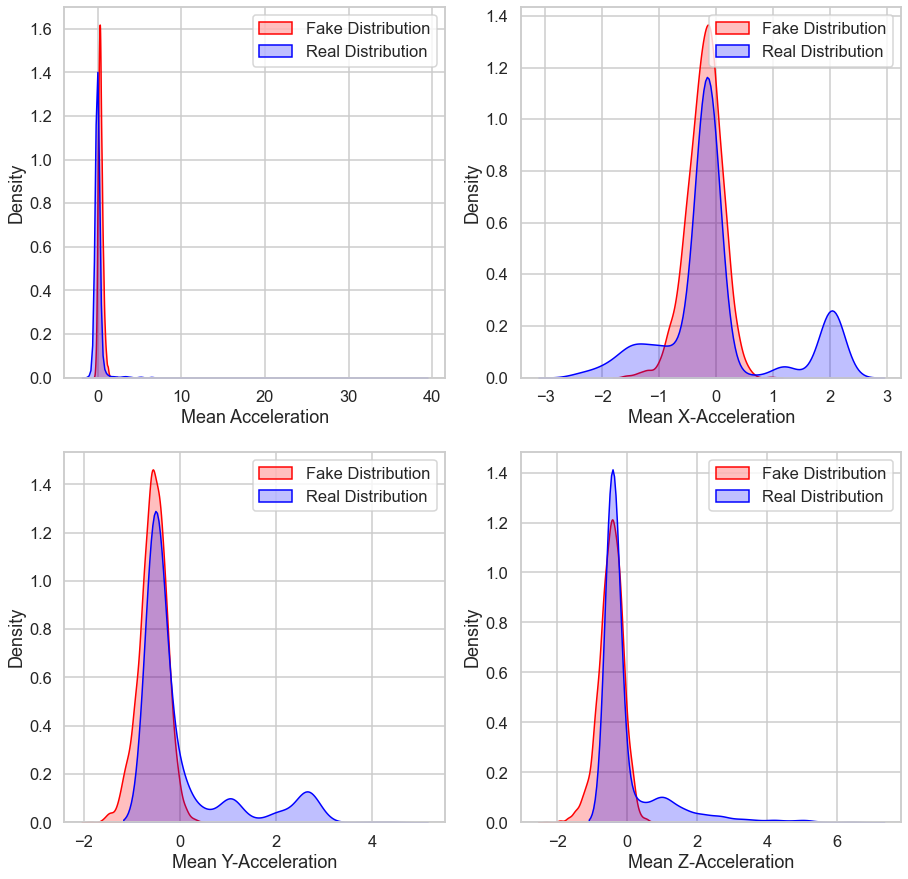

Epoch [1/1000] Training: DISC | Loss D: 0.68969, Loss G: 0.56022 | Acc: 0.49200 | fpR: 0.74800 | P: 0.49459 | R: 0.73200 | F1: 0.58984 | Median W: 0.49122 | Mean W: 0.49942

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.66704, Loss G: 0.56022 | Acc: 0.59600 | fpR: 0.58800 | P: 0.57018 | R: 0.78000 | F1: 0.65830 | Median W: 0.49167 | Mean W: 0.49797
Epoch [3/1000] Training: DISC | Loss D: 0.64116, Loss G: 0.56022 | Acc: 0.63600 | fpR: 0.52400 | P: 0.60303 | R: 0.79600 | F1: 0.68572 | Median W: 0.48561 | Mean W: 0.49687
Epoch [4/1000] Training: DISC | Loss D: 0.61022, Loss G: 0.56022 | Acc: 0.66600 | fpR: 0.42800 | P: 0.63973 | R: 0.76000 | F1: 0.69420 | Median W: 0.48475 | Mean W: 0.49532
Epoch [5/1000] Training: DISC | Loss D: 0.57431, Loss G: 0.56022 | Acc: 0.75200 | fpR: 0.29600 | P: 0.72993 | R: 0.80000 | F1: 0.76286 | Median W: 0.49205 | Mean W: 0.50628

Pull Generator

Epoch [6/1000] Training: GEN | Loss D: 0.57431, Loss G: 0.69311 | Acc: 0.63600 | fpR: 

Epoch [48/1000] Training: DISC | Loss D: 0.73826, Loss G: 0.53159 | Acc: 0.58000 | fpR: 0.57600 | P: 0.56098 | R: 0.73600 | F1: 0.63619 | Median W: 0.56854 | Mean W: 0.58683
Epoch [49/1000] Training: DISC | Loss D: 0.67217, Loss G: 0.53159 | Acc: 0.62800 | fpR: 0.43600 | P: 0.61348 | R: 0.69200 | F1: 0.64988 | Median W: 0.57017 | Mean W: 0.59194
Epoch [50/1000] Training: DISC | Loss D: 0.62563, Loss G: 0.53159 | Acc: 0.69000 | fpR: 0.31200 | P: 0.68924 | R: 0.69200 | F1: 0.69012 | Median W: 0.57302 | Mean W: 0.58852
Epoch [51/1000] Training: DISC | Loss D: 0.60565, Loss G: 0.53159 | Acc: 0.68200 | fpR: 0.29200 | P: 0.69198 | R: 0.65600 | F1: 0.67301 | Median W: 0.56882 | Mean W: 0.58807
Epoch [52/1000] Training: DISC | Loss D: 0.58513, Loss G: 0.53159 | Acc: 0.72600 | fpR: 0.24800 | P: 0.73840 | R: 0.70000 | F1: 0.71819 | Median W: 0.56770 | Mean W: 0.59165
Epoch [53/1000] Training: DISC | Loss D: 0.56241, Loss G: 0.53159 | Acc: 0.71800 | fpR: 0.24400 | P: 0.73593 | R: 0.68000 | F1: 0.

Epoch [95/1000] Training: GEN | Loss D: 0.41454, Loss G: 0.52571 | Acc: 0.45200 | fpR: 0.84000 | P: 0.46970 | R: 0.74400 | F1: 0.57538 | Median W: 0.50303 | Mean W: 0.55432

Push Generator

Epoch [96/1000] Training: DISC | Loss D: 0.77620, Loss G: 0.52571 | Acc: 0.47800 | fpR: 0.79600 | P: 0.48579 | R: 0.75200 | F1: 0.58979 | Median W: 0.48986 | Mean W: 0.55401
Epoch [97/1000] Training: DISC | Loss D: 0.69457, Loss G: 0.52571 | Acc: 0.60400 | fpR: 0.55600 | P: 0.57879 | R: 0.76400 | F1: 0.65813 | Median W: 0.50385 | Mean W: 0.55893
Epoch [98/1000] Training: DISC | Loss D: 0.59711, Loss G: 0.52571 | Acc: 0.68000 | fpR: 0.32000 | P: 0.68000 | R: 0.68000 | F1: 0.67950 | Median W: 0.49718 | Mean W: 0.55651
Epoch [99/1000] Training: DISC | Loss D: 0.51372, Loss G: 0.52571 | Acc: 0.74400 | fpR: 0.12800 | P: 0.82796 | R: 0.61600 | F1: 0.70593 | Median W: 0.50913 | Mean W: 0.56152
Epoch [100/1000] Training: DISC | Loss D: 0.46992, Loss G: 0.52571 | Acc: 0.75200 | fpR: 0.06800 | P: 0.89375 | R:

Epoch [187/1000] Training: DISC | Loss D: 0.76116, Loss G: 0.57508 | Acc: 0.53000 | fpR: 0.66800 | P: 0.52149 | R: 0.72800 | F1: 0.60719 | Median W: 0.55226 | Mean W: 0.57584
Epoch [188/1000] Training: DISC | Loss D: 0.72305, Loss G: 0.57508 | Acc: 0.53200 | fpR: 0.64800 | P: 0.52353 | R: 0.71200 | F1: 0.60290 | Median W: 0.54507 | Mean W: 0.56994
Epoch [189/1000] Training: DISC | Loss D: 0.63342, Loss G: 0.57508 | Acc: 0.63200 | fpR: 0.48800 | P: 0.60645 | R: 0.75200 | F1: 0.67093 | Median W: 0.54294 | Mean W: 0.57910
Epoch [190/1000] Training: DISC | Loss D: 0.59127, Loss G: 0.57508 | Acc: 0.65400 | fpR: 0.36000 | P: 0.64981 | R: 0.66800 | F1: 0.65828 | Median W: 0.53839 | Mean W: 0.57168
Epoch [191/1000] Training: DISC | Loss D: 0.53472, Loss G: 0.57508 | Acc: 0.75000 | fpR: 0.19600 | P: 0.78027 | R: 0.69600 | F1: 0.73523 | Median W: 0.55005 | Mean W: 0.57933
Epoch [192/1000] Training: DISC | Loss D: 0.50154, Loss G: 0.57508 | Acc: 0.78200 | fpR: 0.14400 | P: 0.83099 | R: 0.70800 | 

Epoch [234/1000] Training: DISC | Loss D: 0.54062, Loss G: 0.53021 | Acc: 0.77200 | fpR: 0.10400 | P: 0.86170 | R: 0.64800 | F1: 0.73924 | Median W: 0.39338 | Mean W: 0.41959
Epoch [235/1000] Training: DISC | Loss D: 0.54061, Loss G: 0.53021 | Acc: 0.79800 | fpR: 0.08800 | P: 0.88601 | R: 0.68400 | F1: 0.77152 | Median W: 0.38896 | Mean W: 0.41331
Epoch [236/1000] Training: DISC | Loss D: 0.47909, Loss G: 0.53021 | Acc: 0.81200 | fpR: 0.07600 | P: 0.90206 | R: 0.70000 | F1: 0.78780 | Median W: 0.39286 | Mean W: 0.41654
Epoch [237/1000] Training: DISC | Loss D: 0.44878, Loss G: 0.53021 | Acc: 0.83400 | fpR: 0.11200 | P: 0.87444 | R: 0.78000 | F1: 0.82403 | Median W: 0.39693 | Mean W: 0.41537

Pull Generator

Epoch [238/1000] Training: GEN | Loss D: 0.44878, Loss G: 1.36841 | Acc: 0.82000 | fpR: 0.15600 | P: 0.83613 | R: 0.79600 | F1: 0.81507 | Median W: 0.38828 | Mean W: 0.41277
Epoch [239/1000] Training: GEN | Loss D: 0.44878, Loss G: 0.97133 | Acc: 0.67200 | fpR: 0.39200 | P: 0.65248 

Epoch [281/1000] Training: DISC | Loss D: 0.52112, Loss G: 0.64626 | Acc: 0.76000 | fpR: 0.11200 | P: 0.84946 | R: 0.63200 | F1: 0.72428 | Median W: 0.36334 | Mean W: 0.37751
Epoch [282/1000] Training: DISC | Loss D: 0.50255, Loss G: 0.64626 | Acc: 0.76800 | fpR: 0.12800 | P: 0.83838 | R: 0.66400 | F1: 0.74058 | Median W: 0.35594 | Mean W: 0.38296
Epoch [283/1000] Training: DISC | Loss D: 0.50262, Loss G: 0.64626 | Acc: 0.77800 | fpR: 0.12000 | P: 0.84925 | R: 0.67600 | F1: 0.75229 | Median W: 0.37185 | Mean W: 0.38456
Epoch [284/1000] Training: DISC | Loss D: 0.47682, Loss G: 0.64626 | Acc: 0.80600 | fpR: 0.12000 | P: 0.85915 | R: 0.73200 | F1: 0.79000 | Median W: 0.36001 | Mean W: 0.38010
Epoch [285/1000] Training: DISC | Loss D: 0.48025, Loss G: 0.64626 | Acc: 0.81000 | fpR: 0.08800 | P: 0.88945 | R: 0.70800 | F1: 0.78793 | Median W: 0.35962 | Mean W: 0.37613
Epoch [286/1000] Training: DISC | Loss D: 0.45247, Loss G: 0.64626 | Acc: 0.83400 | fpR: 0.09600 | P: 0.88837 | R: 0.76400 | 

Epoch [374/1000] Training: DISC | Loss D: 0.45441, Loss G: 0.57727 | Acc: 0.80800 | fpR: 0.04400 | P: 0.93750 | R: 0.66000 | F1: 0.77416 | Median W: 0.39053 | Mean W: 0.41760
Epoch [375/1000] Training: DISC | Loss D: 0.41538, Loss G: 0.57727 | Acc: 0.83400 | fpR: 0.06800 | P: 0.91542 | R: 0.73600 | F1: 0.81547 | Median W: 0.39258 | Mean W: 0.41830
Epoch [376/1000] Training: DISC | Loss D: 0.41525, Loss G: 0.57727 | Acc: 0.88400 | fpR: 0.06000 | P: 0.93243 | R: 0.82800 | F1: 0.87662 | Median W: 0.40154 | Mean W: 0.42245

Pull Generator

Epoch [377/1000] Training: GEN | Loss D: 0.41525, Loss G: 1.66197 | Acc: 0.85000 | fpR: 0.09600 | P: 0.89238 | R: 0.79600 | F1: 0.84094 | Median W: 0.39326 | Mean W: 0.41457
Epoch [378/1000] Training: GEN | Loss D: 0.41525, Loss G: 1.20754 | Acc: 0.75600 | fpR: 0.27600 | P: 0.74060 | R: 0.78800 | F1: 0.76307 | Median W: 0.37695 | Mean W: 0.40802
Epoch [379/1000] Training: GEN | Loss D: 0.41525, Loss G: 0.85378 | Acc: 0.66200 | fpR: 0.49600 | P: 0.62310 |

Epoch [420/1000] Training: DISC | Loss D: 0.72141, Loss G: 0.54177 | Acc: 0.56200 | fpR: 0.69600 | P: 0.54090 | R: 0.82000 | F1: 0.65135 | Median W: 0.36647 | Mean W: 0.39705
Epoch [421/1000] Training: DISC | Loss D: 0.65653, Loss G: 0.54177 | Acc: 0.61200 | fpR: 0.55600 | P: 0.58383 | R: 0.78000 | F1: 0.66732 | Median W: 0.36908 | Mean W: 0.40015
Epoch [422/1000] Training: DISC | Loss D: 0.59995, Loss G: 0.54177 | Acc: 0.74000 | fpR: 0.34000 | P: 0.70690 | R: 0.82000 | F1: 0.75876 | Median W: 0.37269 | Mean W: 0.39671
Epoch [423/1000] Training: DISC | Loss D: 0.56921, Loss G: 0.54177 | Acc: 0.78200 | fpR: 0.22400 | P: 0.77866 | R: 0.78800 | F1: 0.78280 | Median W: 0.37220 | Mean W: 0.39968

Pull Generator

Epoch [424/1000] Training: GEN | Loss D: 0.56921, Loss G: 0.92741 | Acc: 0.72000 | fpR: 0.31600 | P: 0.70522 | R: 0.75600 | F1: 0.72923 | Median W: 0.38186 | Mean W: 0.39971
Epoch [425/1000] Training: GEN | Loss D: 0.56921, Loss G: 0.76765 | Acc: 0.66400 | fpR: 0.45200 | P: 0.63312 

Epoch [512/1000] Training: GEN | Loss D: 0.61209, Loss G: 0.76589 | Acc: 0.60400 | fpR: 0.56800 | P: 0.57738 | R: 0.77600 | F1: 0.66163 | Median W: 0.41028 | Mean W: 0.42954
Epoch [513/1000] Training: GEN | Loss D: 0.61209, Loss G: 0.68211 | Acc: 0.52600 | fpR: 0.67200 | P: 0.51862 | R: 0.72400 | F1: 0.60385 | Median W: 0.40107 | Mean W: 0.43089
Epoch [514/1000] Training: GEN | Loss D: 0.61209, Loss G: 0.61564 | Acc: 0.50800 | fpR: 0.79600 | P: 0.50498 | R: 0.81200 | F1: 0.62223 | Median W: 0.39685 | Mean W: 0.43718

Push Generator

Epoch [515/1000] Training: DISC | Loss D: 0.68540, Loss G: 0.61564 | Acc: 0.59000 | fpR: 0.55200 | P: 0.57009 | R: 0.73200 | F1: 0.64049 | Median W: 0.39904 | Mean W: 0.44303
Epoch [516/1000] Training: DISC | Loss D: 0.63746, Loss G: 0.61564 | Acc: 0.72600 | fpR: 0.26800 | P: 0.72874 | R: 0.72000 | F1: 0.72385 | Median W: 0.40142 | Mean W: 0.43639
Epoch [517/1000] Training: DISC | Loss D: 0.54392, Loss G: 0.61564 | Acc: 0.81200 | fpR: 0.10800 | P: 0.87143 |

Epoch [559/1000] Training: DISC | Loss D: 0.62506, Loss G: 0.58748 | Acc: 0.63400 | fpR: 0.50800 | P: 0.60436 | R: 0.77600 | F1: 0.67902 | Median W: 0.37972 | Mean W: 0.38380
Epoch [560/1000] Training: DISC | Loss D: 0.60172, Loss G: 0.58748 | Acc: 0.66200 | fpR: 0.40800 | P: 0.64211 | R: 0.73200 | F1: 0.68361 | Median W: 0.39126 | Mean W: 0.38678
Epoch [561/1000] Training: DISC | Loss D: 0.60343, Loss G: 0.58748 | Acc: 0.72000 | fpR: 0.28800 | P: 0.71654 | R: 0.72800 | F1: 0.72172 | Median W: 0.38667 | Mean W: 0.38080
Epoch [562/1000] Training: DISC | Loss D: 0.57300, Loss G: 0.58748 | Acc: 0.71200 | fpR: 0.26000 | P: 0.72458 | R: 0.68400 | F1: 0.70320 | Median W: 0.38417 | Mean W: 0.38460
Epoch [563/1000] Training: DISC | Loss D: 0.51948, Loss G: 0.58748 | Acc: 0.78200 | fpR: 0.14400 | P: 0.83099 | R: 0.70800 | F1: 0.76408 | Median W: 0.38992 | Mean W: 0.38593
Epoch [564/1000] Training: DISC | Loss D: 0.51081, Loss G: 0.58748 | Acc: 0.81800 | fpR: 0.06400 | P: 0.91623 | R: 0.70000 | 

Epoch [606/1000] Training: GEN | Loss D: 0.42038, Loss G: 0.78773 | Acc: 0.54800 | fpR: 0.66400 | P: 0.53371 | R: 0.76000 | F1: 0.62658 | Median W: 0.30042 | Mean W: 0.32994
Epoch [607/1000] Training: GEN | Loss D: 0.42038, Loss G: 0.55706 | Acc: 0.48000 | fpR: 0.80400 | P: 0.48724 | R: 0.76400 | F1: 0.59454 | Median W: 0.30529 | Mean W: 0.33673

Push Generator

Epoch [608/1000] Training: DISC | Loss D: 0.76807, Loss G: 0.55706 | Acc: 0.45800 | fpR: 0.83200 | P: 0.47342 | R: 0.74800 | F1: 0.57937 | Median W: 0.30726 | Mean W: 0.34360
Epoch [609/1000] Training: DISC | Loss D: 0.72080, Loss G: 0.55706 | Acc: 0.51000 | fpR: 0.74800 | P: 0.50660 | R: 0.76800 | F1: 0.61001 | Median W: 0.29853 | Mean W: 0.34337
Epoch [610/1000] Training: DISC | Loss D: 0.67799, Loss G: 0.55706 | Acc: 0.60400 | fpR: 0.49200 | P: 0.58725 | R: 0.70000 | F1: 0.63819 | Median W: 0.30856 | Mean W: 0.34405
Epoch [611/1000] Training: DISC | Loss D: 0.58621, Loss G: 0.55706 | Acc: 0.71600 | fpR: 0.25600 | P: 0.72881 

Epoch [653/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.68190 | Acc: 0.63400 | fpR: 0.52800 | P: 0.60121 | R: 0.79600 | F1: 0.68454 | Median W: 0.41428 | Mean W: 0.45925
Epoch [654/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.63909 | Acc: 0.55400 | fpR: 0.61600 | P: 0.54030 | R: 0.72400 | F1: 0.61831 | Median W: 0.42018 | Mean W: 0.46407
Epoch [655/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.63141 | Acc: 0.57400 | fpR: 0.61200 | P: 0.55394 | R: 0.76000 | F1: 0.64032 | Median W: 0.42163 | Mean W: 0.46565
Epoch [656/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.59920 | Acc: 0.55200 | fpR: 0.61200 | P: 0.53916 | R: 0.71600 | F1: 0.61463 | Median W: 0.42504 | Mean W: 0.46777
Epoch [657/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.57946 | Acc: 0.53200 | fpR: 0.68800 | P: 0.52222 | R: 0.75200 | F1: 0.61591 | Median W: 0.43424 | Mean W: 0.47558
Epoch [658/1000] Training: GEN | Loss D: 0.54458, Loss G: 0.55874 | Acc: 0.46400 | fpR: 0.80800 | P: 0.47668 | R: 0.73600 | F1: 0.

Epoch [700/1000] Training: DISC | Loss D: 0.73034, Loss G: 0.58165 | Acc: 0.55400 | fpR: 0.61600 | P: 0.54030 | R: 0.72400 | F1: 0.61831 | Median W: 0.44954 | Mean W: 0.48440
Epoch [701/1000] Training: DISC | Loss D: 0.70694, Loss G: 0.58165 | Acc: 0.54800 | fpR: 0.59600 | P: 0.53727 | R: 0.69200 | F1: 0.60440 | Median W: 0.45091 | Mean W: 0.49087
Epoch [702/1000] Training: DISC | Loss D: 0.69809, Loss G: 0.58165 | Acc: 0.56400 | fpR: 0.50400 | P: 0.55634 | R: 0.63200 | F1: 0.59126 | Median W: 0.44848 | Mean W: 0.48466
Epoch [703/1000] Training: DISC | Loss D: 0.63242, Loss G: 0.58165 | Acc: 0.63600 | fpR: 0.42800 | P: 0.62057 | R: 0.70000 | F1: 0.65740 | Median W: 0.45146 | Mean W: 0.49500
Epoch [704/1000] Training: DISC | Loss D: 0.61127, Loss G: 0.58165 | Acc: 0.70400 | fpR: 0.22400 | P: 0.73832 | R: 0.63200 | F1: 0.68054 | Median W: 0.44891 | Mean W: 0.48820
Epoch [705/1000] Training: DISC | Loss D: 0.58005, Loss G: 0.58165 | Acc: 0.74200 | fpR: 0.16000 | P: 0.80100 | R: 0.64400 | 

Epoch [747/1000] Training: GEN | Loss D: 0.54921, Loss G: 0.86163 | Acc: 0.71600 | fpR: 0.36400 | P: 0.68621 | R: 0.79600 | F1: 0.73654 | Median W: 0.33274 | Mean W: 0.37569
Epoch [748/1000] Training: GEN | Loss D: 0.54921, Loss G: 0.75720 | Acc: 0.58800 | fpR: 0.58400 | P: 0.56548 | R: 0.76000 | F1: 0.64798 | Median W: 0.33158 | Mean W: 0.36696
Epoch [749/1000] Training: GEN | Loss D: 0.54921, Loss G: 0.66182 | Acc: 0.51600 | fpR: 0.69200 | P: 0.51130 | R: 0.72400 | F1: 0.59885 | Median W: 0.33650 | Mean W: 0.36884
Epoch [750/1000] Training: GEN | Loss D: 0.54921, Loss G: 0.59595 | Acc: 0.46200 | fpR: 0.78400 | P: 0.47453 | R: 0.70800 | F1: 0.56774 | Median W: 0.33130 | Mean W: 0.36521

Push Generator

Epoch [751/1000] Training: DISC | Loss D: 0.74384, Loss G: 0.59595 | Acc: 0.51800 | fpR: 0.72000 | P: 0.51220 | R: 0.75600 | F1: 0.61018 | Median W: 0.33602 | Mean W: 0.37041
Epoch [752/1000] Training: DISC | Loss D: 0.72946, Loss G: 0.59595 | Acc: 0.51200 | fpR: 0.67200 | P: 0.50877 | 

Epoch [794/1000] Training: DISC | Loss D: 0.48591, Loss G: 0.57322 | Acc: 0.78400 | fpR: 0.10800 | P: 0.86224 | R: 0.67600 | F1: 0.75736 | Median W: 0.29424 | Mean W: 0.33788
Epoch [795/1000] Training: DISC | Loss D: 0.46571, Loss G: 0.57322 | Acc: 0.77600 | fpR: 0.14800 | P: 0.82547 | R: 0.70000 | F1: 0.75708 | Median W: 0.29816 | Mean W: 0.33694
Epoch [796/1000] Training: DISC | Loss D: 0.44702, Loss G: 0.57322 | Acc: 0.81000 | fpR: 0.11200 | P: 0.86730 | R: 0.73200 | F1: 0.79343 | Median W: 0.29142 | Mean W: 0.33173
Epoch [797/1000] Training: DISC | Loss D: 0.42217, Loss G: 0.57322 | Acc: 0.79600 | fpR: 0.09600 | P: 0.87755 | R: 0.68800 | F1: 0.77081 | Median W: 0.30530 | Mean W: 0.34462
Epoch [798/1000] Training: DISC | Loss D: 0.41775, Loss G: 0.57322 | Acc: 0.78600 | fpR: 0.12800 | P: 0.84541 | R: 0.70000 | F1: 0.76537 | Median W: 0.28812 | Mean W: 0.33519
Epoch [799/1000] Training: DISC | Loss D: 0.41583, Loss G: 0.57322 | Acc: 0.83000 | fpR: 0.09600 | P: 0.88732 | R: 0.75600 | 

Epoch [840/1000] Training: GEN | Loss D: 0.54244, Loss G: 0.67836 | Acc: 0.60200 | fpR: 0.66000 | P: 0.56693 | R: 0.86400 | F1: 0.68415 | Median W: 0.38631 | Mean W: 0.42716
Epoch [841/1000] Training: GEN | Loss D: 0.54244, Loss G: 0.57673 | Acc: 0.54400 | fpR: 0.74400 | P: 0.52792 | R: 0.83200 | F1: 0.64549 | Median W: 0.41833 | Mean W: 0.44756

Push Generator

Epoch [842/1000] Training: DISC | Loss D: 0.72949, Loss G: 0.57673 | Acc: 0.61000 | fpR: 0.59600 | P: 0.57790 | R: 0.81600 | F1: 0.67613 | Median W: 0.41743 | Mean W: 0.44920
Epoch [843/1000] Training: DISC | Loss D: 0.65736, Loss G: 0.57673 | Acc: 0.63600 | fpR: 0.52800 | P: 0.60241 | R: 0.80000 | F1: 0.68680 | Median W: 0.42621 | Mean W: 0.45434
Epoch [844/1000] Training: DISC | Loss D: 0.63206, Loss G: 0.57673 | Acc: 0.70200 | fpR: 0.35600 | P: 0.68100 | R: 0.76000 | F1: 0.71784 | Median W: 0.41903 | Mean W: 0.45093
Epoch [845/1000] Training: DISC | Loss D: 0.59562, Loss G: 0.57673 | Acc: 0.74400 | fpR: 0.31200 | P: 0.71942 

Epoch [933/1000] Training: GEN | Loss D: 0.46848, Loss G: 0.60767 | Acc: 0.49200 | fpR: 0.75600 | P: 0.49465 | R: 0.74000 | F1: 0.59247 | Median W: 0.32504 | Mean W: 0.33581

Push Generator

Epoch [934/1000] Training: DISC | Loss D: 0.70380, Loss G: 0.60767 | Acc: 0.52800 | fpR: 0.73600 | P: 0.51832 | R: 0.79200 | F1: 0.62610 | Median W: 0.32320 | Mean W: 0.34162
Epoch [935/1000] Training: DISC | Loss D: 0.70076, Loss G: 0.60767 | Acc: 0.60000 | fpR: 0.61600 | P: 0.56983 | R: 0.81600 | F1: 0.67057 | Median W: 0.32495 | Mean W: 0.33894
Epoch [936/1000] Training: DISC | Loss D: 0.67929, Loss G: 0.60767 | Acc: 0.57400 | fpR: 0.60800 | P: 0.55425 | R: 0.75600 | F1: 0.63911 | Median W: 0.33600 | Mean W: 0.34185
Epoch [937/1000] Training: DISC | Loss D: 0.63923, Loss G: 0.60767 | Acc: 0.61200 | fpR: 0.54400 | P: 0.58537 | R: 0.76800 | F1: 0.66387 | Median W: 0.31594 | Mean W: 0.33053
Epoch [938/1000] Training: DISC | Loss D: 0.60882, Loss G: 0.60767 | Acc: 0.72000 | fpR: 0.26400 | P: 0.72727

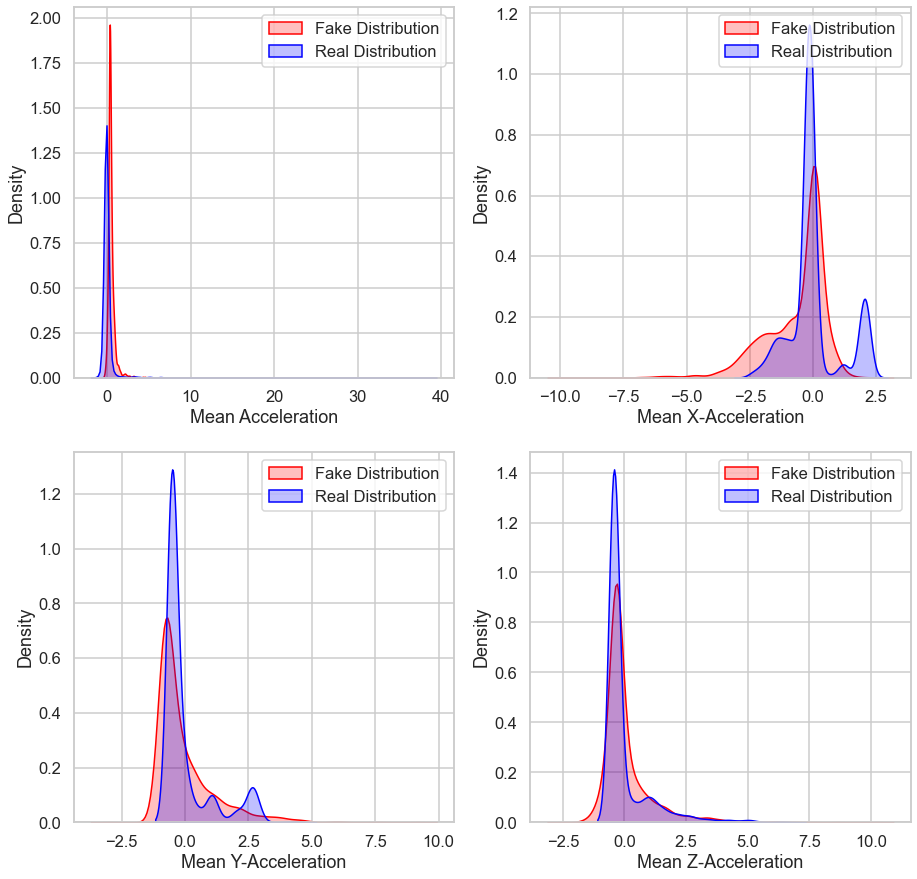

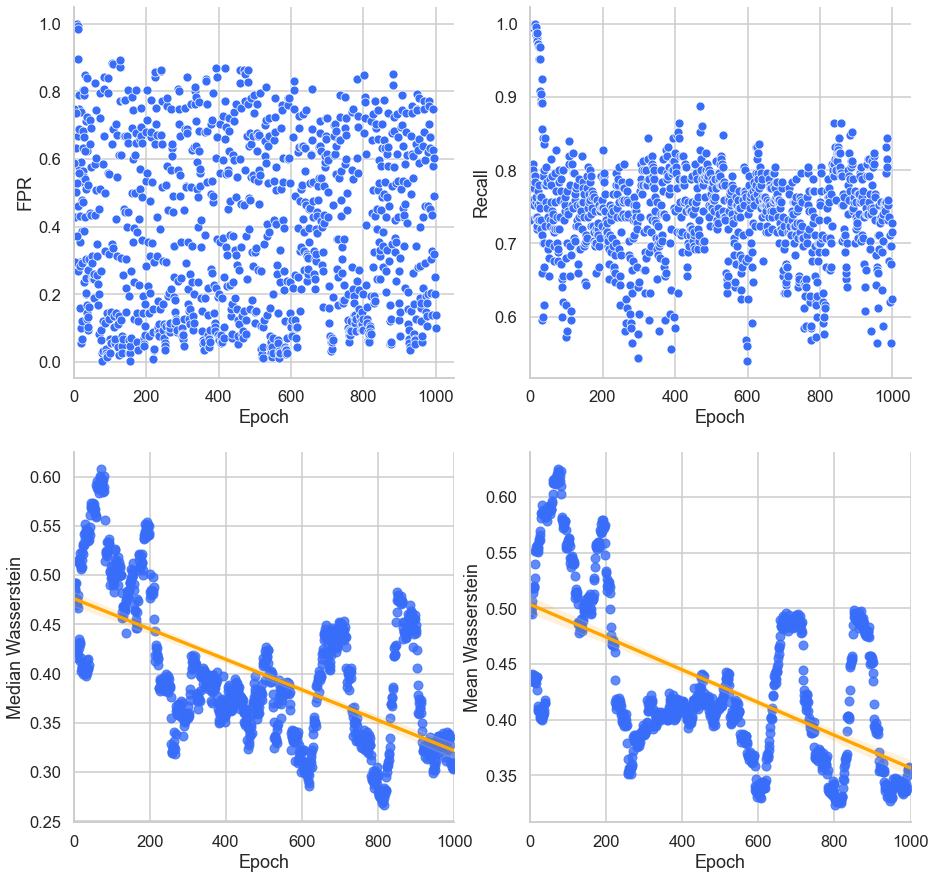

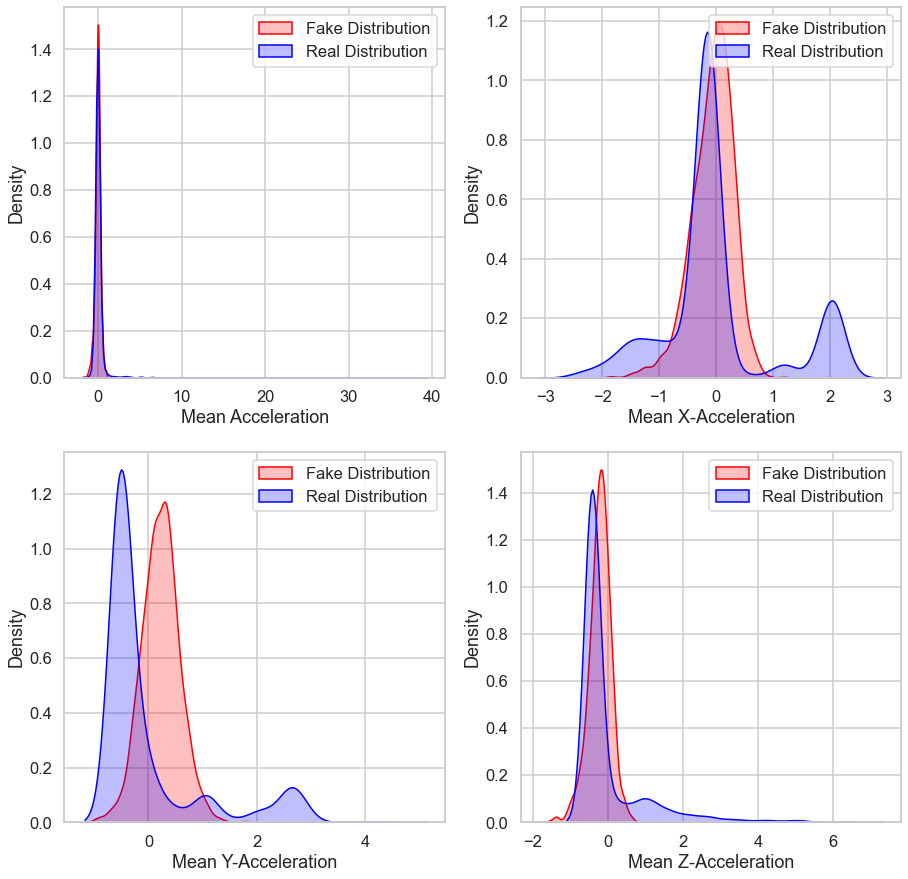

Epoch [1/1000] Training: DISC | Loss D: 0.44725, Loss G: 1.38955 | Acc: 0.84600 | fpR: 0.11600 | P: 0.87446 | R: 0.80800 | F1: 0.83942 | Median W: 0.39110 | Mean W: 0.41426

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.44725, Loss G: 1.18833 | Acc: 0.84000 | fpR: 0.16400 | P: 0.83730 | R: 0.84400 | F1: 0.84014 | Median W: 0.39009 | Mean W: 0.41540
Epoch [3/1000] Training: GEN | Loss D: 0.44725, Loss G: 1.00512 | Acc: 0.73800 | fpR: 0.33200 | P: 0.70877 | R: 0.80800 | F1: 0.75464 | Median W: 0.38917 | Mean W: 0.41965
Epoch [4/1000] Training: GEN | Loss D: 0.44725, Loss G: 0.85579 | Acc: 0.68400 | fpR: 0.47600 | P: 0.63939 | R: 0.84400 | F1: 0.72710 | Median W: 0.39964 | Mean W: 0.42780
Epoch [5/1000] Training: GEN | Loss D: 0.44725, Loss G: 0.73173 | Acc: 0.62400 | fpR: 0.59200 | P: 0.58659 | R: 0.84000 | F1: 0.69031 | Median W: 0.41903 | Mean W: 0.43777
Epoch [6/1000] Training: GEN | Loss D: 0.44725, Loss G: 0.61485 | Acc: 0.53800 | fpR: 0.76

Epoch [48/1000] Training: GEN | Loss D: 0.58839, Loss G: 0.71238 | Acc: 0.57200 | fpR: 0.60400 | P: 0.55325 | R: 0.74800 | F1: 0.63557 | Median W: 0.46119 | Mean W: 0.53624
Epoch [49/1000] Training: GEN | Loss D: 0.58839, Loss G: 0.64129 | Acc: 0.58800 | fpR: 0.66000 | P: 0.55882 | R: 0.83600 | F1: 0.66939 | Median W: 0.47134 | Mean W: 0.54960
Epoch [50/1000] Training: GEN | Loss D: 0.58839, Loss G: 0.59335 | Acc: 0.51200 | fpR: 0.71600 | P: 0.50824 | R: 0.74000 | F1: 0.60212 | Median W: 0.47572 | Mean W: 0.54901

Push Generator

Epoch [51/1000] Training: DISC | Loss D: 0.68526, Loss G: 0.59335 | Acc: 0.60600 | fpR: 0.55600 | P: 0.58006 | R: 0.76800 | F1: 0.66044 | Median W: 0.47365 | Mean W: 0.54836
Epoch [52/1000] Training: DISC | Loss D: 0.63472, Loss G: 0.59335 | Acc: 0.68800 | fpR: 0.40800 | P: 0.65772 | R: 0.78400 | F1: 0.71483 | Median W: 0.46730 | Mean W: 0.55220
Epoch [53/1000] Training: DISC | Loss D: 0.58332, Loss G: 0.59335 | Acc: 0.75600 | fpR: 0.24400 | P: 0.75600 | R: 0.

Epoch [95/1000] Training: DISC | Loss D: 0.58871, Loss G: 0.57429 | Acc: 0.73200 | fpR: 0.24400 | P: 0.74370 | R: 0.70800 | F1: 0.72491 | Median W: 0.68414 | Mean W: 0.78738
Epoch [96/1000] Training: DISC | Loss D: 0.49341, Loss G: 0.57429 | Acc: 0.83000 | fpR: 0.08800 | P: 0.89474 | R: 0.74800 | F1: 0.81432 | Median W: 0.69701 | Mean W: 0.78550
Epoch [97/1000] Training: DISC | Loss D: 0.47366, Loss G: 0.57429 | Acc: 0.82400 | fpR: 0.05600 | P: 0.92632 | R: 0.70400 | F1: 0.79951 | Median W: 0.69022 | Mean W: 0.78510
Epoch [98/1000] Training: DISC | Loss D: 0.43179, Loss G: 0.57429 | Acc: 0.84800 | fpR: 0.02800 | P: 0.96277 | R: 0.72400 | F1: 0.82599 | Median W: 0.67803 | Mean W: 0.78570
Epoch [99/1000] Training: DISC | Loss D: 0.37213, Loss G: 0.57429 | Acc: 0.89400 | fpR: 0.02400 | P: 0.97129 | R: 0.81200 | F1: 0.88404 | Median W: 0.68858 | Mean W: 0.78596

Pull Generator

Epoch [100/1000] Training: GEN | Loss D: 0.37213, Loss G: 1.68181 | Acc: 0.85400 | fpR: 0.04400 | P: 0.94472 | R:

Epoch [142/1000] Training: DISC | Loss D: 0.68295, Loss G: 0.48872 | Acc: 0.65600 | fpR: 0.39200 | P: 0.64234 | R: 0.70400 | F1: 0.67126 | Median W: 0.60929 | Mean W: 0.68662
Epoch [143/1000] Training: DISC | Loss D: 0.52459, Loss G: 0.48872 | Acc: 0.78000 | fpR: 0.14400 | P: 0.83019 | R: 0.70400 | F1: 0.76141 | Median W: 0.60663 | Mean W: 0.69625
Epoch [144/1000] Training: DISC | Loss D: 0.48156, Loss G: 0.48872 | Acc: 0.74200 | fpR: 0.08000 | P: 0.87578 | R: 0.56400 | F1: 0.68566 | Median W: 0.61660 | Mean W: 0.69371
Epoch [145/1000] Training: DISC | Loss D: 0.45114, Loss G: 0.48872 | Acc: 0.76200 | fpR: 0.05600 | P: 0.91195 | R: 0.58000 | F1: 0.70857 | Median W: 0.60500 | Mean W: 0.68923
Epoch [146/1000] Training: DISC | Loss D: 0.41528, Loss G: 0.48872 | Acc: 0.77200 | fpR: 0.04000 | P: 0.93590 | R: 0.58400 | F1: 0.71874 | Median W: 0.59646 | Mean W: 0.68964
Epoch [147/1000] Training: DISC | Loss D: 0.35312, Loss G: 0.48872 | Acc: 0.84200 | fpR: 0.01200 | P: 0.98305 | R: 0.69600 | 

Epoch [189/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.98130 | Acc: 0.71600 | fpR: 0.35600 | P: 0.68881 | R: 0.78800 | F1: 0.73458 | Median W: 0.48751 | Mean W: 0.57083
Epoch [190/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.69556 | Acc: 0.62600 | fpR: 0.54400 | P: 0.59403 | R: 0.79600 | F1: 0.67985 | Median W: 0.48121 | Mean W: 0.56347
Epoch [191/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.67955 | Acc: 0.58000 | fpR: 0.60000 | P: 0.55882 | R: 0.76000 | F1: 0.64358 | Median W: 0.49223 | Mean W: 0.56049
Epoch [192/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.67005 | Acc: 0.55000 | fpR: 0.64000 | P: 0.53623 | R: 0.74000 | F1: 0.62136 | Median W: 0.48774 | Mean W: 0.55516
Epoch [193/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.65936 | Acc: 0.56400 | fpR: 0.66800 | P: 0.54372 | R: 0.79600 | F1: 0.64562 | Median W: 0.45638 | Mean W: 0.55428
Epoch [194/1000] Training: GEN | Loss D: 0.50909, Loss G: 0.63811 | Acc: 0.55800 | fpR: 0.63600 | P: 0.54179 | R: 0.75200 | F1: 0.

Epoch [236/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.84325 | Acc: 0.65600 | fpR: 0.52800 | P: 0.61404 | R: 0.84000 | F1: 0.70897 | Median W: 0.46814 | Mean W: 0.45547
Epoch [237/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.80923 | Acc: 0.61000 | fpR: 0.60400 | P: 0.57703 | R: 0.82400 | F1: 0.67826 | Median W: 0.46737 | Mean W: 0.45171
Epoch [238/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.76725 | Acc: 0.63200 | fpR: 0.58800 | P: 0.59167 | R: 0.85200 | F1: 0.69788 | Median W: 0.46047 | Mean W: 0.45488
Epoch [239/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.73340 | Acc: 0.63600 | fpR: 0.60400 | P: 0.59189 | R: 0.87600 | F1: 0.70597 | Median W: 0.44858 | Mean W: 0.45432
Epoch [240/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.70500 | Acc: 0.59400 | fpR: 0.68800 | P: 0.56010 | R: 0.87600 | F1: 0.68283 | Median W: 0.43795 | Mean W: 0.45450
Epoch [241/1000] Training: GEN | Loss D: 0.51016, Loss G: 0.68511 | Acc: 0.61800 | fpR: 0.64000 | P: 0.57784 | R: 0.87600 | F1: 0.

Epoch [283/1000] Training: DISC | Loss D: 0.67186, Loss G: 0.63427 | Acc: 0.60400 | fpR: 0.53600 | P: 0.58125 | R: 0.74400 | F1: 0.65214 | Median W: 0.38167 | Mean W: 0.42687
Epoch [284/1000] Training: DISC | Loss D: 0.66603, Loss G: 0.63427 | Acc: 0.67200 | fpR: 0.43200 | P: 0.64238 | R: 0.77600 | F1: 0.70240 | Median W: 0.37636 | Mean W: 0.42412
Epoch [285/1000] Training: DISC | Loss D: 0.64361, Loss G: 0.63427 | Acc: 0.69400 | fpR: 0.37600 | P: 0.67018 | R: 0.76400 | F1: 0.71352 | Median W: 0.39187 | Mean W: 0.43004
Epoch [286/1000] Training: DISC | Loss D: 0.61288, Loss G: 0.63427 | Acc: 0.76400 | fpR: 0.18800 | P: 0.79204 | R: 0.71600 | F1: 0.75160 | Median W: 0.38081 | Mean W: 0.43514
Epoch [287/1000] Training: DISC | Loss D: 0.58171, Loss G: 0.63427 | Acc: 0.76200 | fpR: 0.14800 | P: 0.81951 | R: 0.67200 | F1: 0.73797 | Median W: 0.38305 | Mean W: 0.42559
Epoch [288/1000] Training: DISC | Loss D: 0.52727, Loss G: 0.63427 | Acc: 0.81400 | fpR: 0.12800 | P: 0.85520 | R: 0.75600 | 

Epoch [330/1000] Training: DISC | Loss D: 0.68667, Loss G: 0.65648 | Acc: 0.55000 | fpR: 0.69200 | P: 0.53369 | R: 0.79200 | F1: 0.63720 | Median W: 0.38301 | Mean W: 0.41559
Epoch [331/1000] Training: DISC | Loss D: 0.66087, Loss G: 0.65648 | Acc: 0.64000 | fpR: 0.46800 | P: 0.61513 | R: 0.74800 | F1: 0.67460 | Median W: 0.38402 | Mean W: 0.41477
Epoch [332/1000] Training: DISC | Loss D: 0.62565, Loss G: 0.65648 | Acc: 0.68600 | fpR: 0.34000 | P: 0.67681 | R: 0.71200 | F1: 0.69346 | Median W: 0.37624 | Mean W: 0.41266
Epoch [333/1000] Training: DISC | Loss D: 0.60090, Loss G: 0.65648 | Acc: 0.69400 | fpR: 0.28400 | P: 0.70293 | R: 0.67200 | F1: 0.68662 | Median W: 0.38158 | Mean W: 0.41195
Epoch [334/1000] Training: DISC | Loss D: 0.58499, Loss G: 0.65648 | Acc: 0.71800 | fpR: 0.22400 | P: 0.74661 | R: 0.66000 | F1: 0.70014 | Median W: 0.37622 | Mean W: 0.41673
Epoch [335/1000] Training: DISC | Loss D: 0.54663, Loss G: 0.65648 | Acc: 0.75400 | fpR: 0.22400 | P: 0.76569 | R: 0.73200 | 

Epoch [377/1000] Training: GEN | Loss D: 0.42064, Loss G: 1.17436 | Acc: 0.67600 | fpR: 0.43200 | P: 0.64474 | R: 0.78400 | F1: 0.70709 | Median W: 0.36611 | Mean W: 0.38823
Epoch [378/1000] Training: GEN | Loss D: 0.42064, Loss G: 0.76801 | Acc: 0.59400 | fpR: 0.58800 | P: 0.56891 | R: 0.77600 | F1: 0.65603 | Median W: 0.36094 | Mean W: 0.38619
Epoch [379/1000] Training: GEN | Loss D: 0.42064, Loss G: 0.72516 | Acc: 0.59600 | fpR: 0.61200 | P: 0.56780 | R: 0.80400 | F1: 0.66508 | Median W: 0.36550 | Mean W: 0.39215
Epoch [380/1000] Training: GEN | Loss D: 0.42064, Loss G: 0.65436 | Acc: 0.49400 | fpR: 0.74000 | P: 0.49591 | R: 0.72800 | F1: 0.58947 | Median W: 0.38691 | Mean W: 0.40734

Push Generator

Epoch [381/1000] Training: DISC | Loss D: 0.67499, Loss G: 0.65436 | Acc: 0.56200 | fpR: 0.66800 | P: 0.54247 | R: 0.79200 | F1: 0.64342 | Median W: 0.39062 | Mean W: 0.40708
Epoch [382/1000] Training: DISC | Loss D: 0.66502, Loss G: 0.65436 | Acc: 0.58400 | fpR: 0.62800 | P: 0.55899 | 

Epoch [470/1000] Training: GEN | Loss D: 0.42009, Loss G: 1.15676 | Acc: 0.72400 | fpR: 0.30400 | P: 0.71212 | R: 0.75200 | F1: 0.73102 | Median W: 0.38748 | Mean W: 0.42879
Epoch [471/1000] Training: GEN | Loss D: 0.42009, Loss G: 0.84579 | Acc: 0.63200 | fpR: 0.47200 | P: 0.60927 | R: 0.73600 | F1: 0.66617 | Median W: 0.42357 | Mean W: 0.41786
Epoch [472/1000] Training: GEN | Loss D: 0.42009, Loss G: 0.73622 | Acc: 0.59400 | fpR: 0.56800 | P: 0.57100 | R: 0.75600 | F1: 0.65011 | Median W: 0.41305 | Mean W: 0.41355
Epoch [473/1000] Training: GEN | Loss D: 0.42009, Loss G: 0.65722 | Acc: 0.54600 | fpR: 0.67200 | P: 0.53203 | R: 0.76400 | F1: 0.62677 | Median W: 0.42121 | Mean W: 0.41955
Epoch [474/1000] Training: GEN | Loss D: 0.42009, Loss G: 0.58416 | Acc: 0.45400 | fpR: 0.80800 | P: 0.46982 | R: 0.71600 | F1: 0.56688 | Median W: 0.42334 | Mean W: 0.41886

Push Generator

Epoch [475/1000] Training: DISC | Loss D: 0.76001, Loss G: 0.58416 | Acc: 0.47400 | fpR: 0.78800 | P: 0.48294 | R

Epoch [516/1000] Training: GEN | Loss D: 0.45352, Loss G: 0.85674 | Acc: 0.70200 | fpR: 0.34400 | P: 0.68498 | R: 0.74800 | F1: 0.71461 | Median W: 0.29125 | Mean W: 0.36621
Epoch [517/1000] Training: GEN | Loss D: 0.45352, Loss G: 0.82991 | Acc: 0.62200 | fpR: 0.44000 | P: 0.60854 | R: 0.68400 | F1: 0.64357 | Median W: 0.29531 | Mean W: 0.35840
Epoch [518/1000] Training: GEN | Loss D: 0.45352, Loss G: 0.74530 | Acc: 0.58200 | fpR: 0.56400 | P: 0.56347 | R: 0.72800 | F1: 0.63476 | Median W: 0.30217 | Mean W: 0.36607
Epoch [519/1000] Training: GEN | Loss D: 0.45352, Loss G: 0.66081 | Acc: 0.52000 | fpR: 0.69200 | P: 0.51404 | R: 0.73200 | F1: 0.60348 | Median W: 0.31302 | Mean W: 0.37237
Epoch [520/1000] Training: GEN | Loss D: 0.45352, Loss G: 0.58965 | Acc: 0.48200 | fpR: 0.80800 | P: 0.48861 | R: 0.77200 | F1: 0.59798 | Median W: 0.29277 | Mean W: 0.36817

Push Generator

Epoch [521/1000] Training: DISC | Loss D: 0.75766, Loss G: 0.58965 | Acc: 0.46400 | fpR: 0.79200 | P: 0.47619 | R

Epoch [608/1000] Training: GEN | Loss D: 0.39745, Loss G: 0.78208 | Acc: 0.62200 | fpR: 0.56400 | P: 0.58892 | R: 0.80800 | F1: 0.68079 | Median W: 0.39309 | Mean W: 0.38104
Epoch [609/1000] Training: GEN | Loss D: 0.39745, Loss G: 0.67022 | Acc: 0.58000 | fpR: 0.61600 | P: 0.55747 | R: 0.77600 | F1: 0.64834 | Median W: 0.41117 | Mean W: 0.39892
Epoch [610/1000] Training: GEN | Loss D: 0.39745, Loss G: 0.56380 | Acc: 0.45800 | fpR: 0.84800 | P: 0.47395 | R: 0.76400 | F1: 0.58452 | Median W: 0.40529 | Mean W: 0.39785

Push Generator

Epoch [611/1000] Training: DISC | Loss D: 0.73814, Loss G: 0.56380 | Acc: 0.50000 | fpR: 0.75200 | P: 0.50000 | R: 0.75200 | F1: 0.60016 | Median W: 0.41240 | Mean W: 0.40277
Epoch [612/1000] Training: DISC | Loss D: 0.70676, Loss G: 0.56380 | Acc: 0.56800 | fpR: 0.61600 | P: 0.54971 | R: 0.75200 | F1: 0.63465 | Median W: 0.39869 | Mean W: 0.40236
Epoch [613/1000] Training: DISC | Loss D: 0.53143, Loss G: 0.56380 | Acc: 0.77800 | fpR: 0.16400 | P: 0.81448 |

Epoch [701/1000] Training: DISC | Loss D: 0.69684, Loss G: 0.55102 | Acc: 0.55800 | fpR: 0.67200 | P: 0.53973 | R: 0.78800 | F1: 0.64017 | Median W: 0.27775 | Mean W: 0.34080
Epoch [702/1000] Training: DISC | Loss D: 0.63540, Loss G: 0.55102 | Acc: 0.62400 | fpR: 0.50400 | P: 0.59873 | R: 0.75200 | F1: 0.66617 | Median W: 0.28154 | Mean W: 0.34594
Epoch [703/1000] Training: DISC | Loss D: 0.56295, Loss G: 0.55102 | Acc: 0.68400 | fpR: 0.34000 | P: 0.67557 | R: 0.70800 | F1: 0.69091 | Median W: 0.28279 | Mean W: 0.34487
Epoch [704/1000] Training: DISC | Loss D: 0.56364, Loss G: 0.55102 | Acc: 0.69400 | fpR: 0.29200 | P: 0.69959 | R: 0.68000 | F1: 0.68916 | Median W: 0.28642 | Mean W: 0.34707
Epoch [705/1000] Training: DISC | Loss D: 0.52862, Loss G: 0.55102 | Acc: 0.66200 | fpR: 0.30000 | P: 0.67532 | R: 0.62400 | F1: 0.64815 | Median W: 0.29286 | Mean W: 0.34436
Epoch [706/1000] Training: DISC | Loss D: 0.51261, Loss G: 0.55102 | Acc: 0.71000 | fpR: 0.27200 | P: 0.71784 | R: 0.69200 | 

Epoch [748/1000] Training: GEN | Loss D: 0.47982, Loss G: 0.93673 | Acc: 0.68800 | fpR: 0.39200 | P: 0.66207 | R: 0.76800 | F1: 0.71061 | Median W: 0.32010 | Mean W: 0.36526
Epoch [749/1000] Training: GEN | Loss D: 0.47982, Loss G: 0.77243 | Acc: 0.61000 | fpR: 0.55600 | P: 0.58258 | R: 0.77600 | F1: 0.66503 | Median W: 0.30960 | Mean W: 0.35013
Epoch [750/1000] Training: GEN | Loss D: 0.47982, Loss G: 0.70793 | Acc: 0.54000 | fpR: 0.72800 | P: 0.52604 | R: 0.80800 | F1: 0.63675 | Median W: 0.30821 | Mean W: 0.34886

Push Generator

Epoch [751/1000] Training: DISC | Loss D: 0.64947, Loss G: 0.70793 | Acc: 0.52600 | fpR: 0.68000 | P: 0.51841 | R: 0.73200 | F1: 0.60648 | Median W: 0.31694 | Mean W: 0.34640
Epoch [752/1000] Training: DISC | Loss D: 0.63275, Loss G: 0.70793 | Acc: 0.57800 | fpR: 0.63600 | P: 0.55462 | R: 0.79200 | F1: 0.65190 | Median W: 0.30749 | Mean W: 0.34554
Epoch [753/1000] Training: DISC | Loss D: 0.58087, Loss G: 0.70793 | Acc: 0.65000 | fpR: 0.46400 | P: 0.62215 |

Epoch [841/1000] Training: GEN | Loss D: 0.44550, Loss G: 1.26813 | Acc: 0.78800 | fpR: 0.24000 | P: 0.77273 | R: 0.81600 | F1: 0.79328 | Median W: 0.30592 | Mean W: 0.31963
Epoch [842/1000] Training: GEN | Loss D: 0.44550, Loss G: 0.87309 | Acc: 0.61200 | fpR: 0.55200 | P: 0.58434 | R: 0.77600 | F1: 0.66618 | Median W: 0.30329 | Mean W: 0.31355
Epoch [843/1000] Training: GEN | Loss D: 0.44550, Loss G: 0.75017 | Acc: 0.59800 | fpR: 0.60400 | P: 0.56980 | R: 0.80000 | F1: 0.66507 | Median W: 0.30407 | Mean W: 0.31404
Epoch [844/1000] Training: GEN | Loss D: 0.44550, Loss G: 0.67769 | Acc: 0.57800 | fpR: 0.66800 | P: 0.55228 | R: 0.82400 | F1: 0.66084 | Median W: 0.29942 | Mean W: 0.32055
Epoch [845/1000] Training: GEN | Loss D: 0.44550, Loss G: 0.59577 | Acc: 0.55600 | fpR: 0.68800 | P: 0.53763 | R: 0.80000 | F1: 0.64261 | Median W: 0.30764 | Mean W: 0.31740
Epoch [846/1000] Training: GEN | Loss D: 0.44550, Loss G: 0.59369 | Acc: 0.49200 | fpR: 0.70800 | P: 0.49429 | R: 0.69200 | F1: 0.

Epoch [888/1000] Training: GEN | Loss D: 0.50800, Loss G: 1.13770 | Acc: 0.74800 | fpR: 0.21600 | P: 0.76724 | R: 0.71200 | F1: 0.73809 | Median W: 0.27913 | Mean W: 0.31931
Epoch [889/1000] Training: GEN | Loss D: 0.50800, Loss G: 0.90748 | Acc: 0.70400 | fpR: 0.36000 | P: 0.68085 | R: 0.76800 | F1: 0.72131 | Median W: 0.28571 | Mean W: 0.31919
Epoch [890/1000] Training: GEN | Loss D: 0.50800, Loss G: 0.72502 | Acc: 0.52600 | fpR: 0.64000 | P: 0.51952 | R: 0.69200 | F1: 0.59299 | Median W: 0.28840 | Mean W: 0.31805
Epoch [891/1000] Training: GEN | Loss D: 0.50800, Loss G: 0.59945 | Acc: 0.53000 | fpR: 0.68400 | P: 0.52101 | R: 0.74400 | F1: 0.61237 | Median W: 0.29203 | Mean W: 0.32278
Epoch [892/1000] Training: GEN | Loss D: 0.50800, Loss G: 0.55346 | Acc: 0.45600 | fpR: 0.81200 | P: 0.47135 | R: 0.72400 | F1: 0.57050 | Median W: 0.28865 | Mean W: 0.31483

Push Generator

Epoch [893/1000] Training: DISC | Loss D: 0.73167, Loss G: 0.55346 | Acc: 0.50000 | fpR: 0.74400 | P: 0.50000 | R

Epoch [935/1000] Training: DISC | Loss D: 0.49944, Loss G: 0.64747 | Acc: 0.81800 | fpR: 0.14400 | P: 0.84416 | R: 0.78000 | F1: 0.81031 | Median W: 0.28354 | Mean W: 0.30648

Pull Generator

Epoch [936/1000] Training: GEN | Loss D: 0.49944, Loss G: 1.28207 | Acc: 0.77400 | fpR: 0.18800 | P: 0.79654 | R: 0.73600 | F1: 0.76457 | Median W: 0.28951 | Mean W: 0.30570
Epoch [937/1000] Training: GEN | Loss D: 0.49944, Loss G: 0.97093 | Acc: 0.69000 | fpR: 0.38800 | P: 0.66436 | R: 0.76800 | F1: 0.71193 | Median W: 0.29377 | Mean W: 0.31452
Epoch [938/1000] Training: GEN | Loss D: 0.49944, Loss G: 0.73057 | Acc: 0.62400 | fpR: 0.52000 | P: 0.59627 | R: 0.76800 | F1: 0.67084 | Median W: 0.30124 | Mean W: 0.32331
Epoch [939/1000] Training: GEN | Loss D: 0.49944, Loss G: 0.62614 | Acc: 0.49400 | fpR: 0.75600 | P: 0.49600 | R: 0.74400 | F1: 0.59472 | Median W: 0.28511 | Mean W: 0.32540

Push Generator

Epoch [940/1000] Training: DISC | Loss D: 0.76194, Loss G: 0.62614 | Acc: 0.53200 | fpR: 0.6960

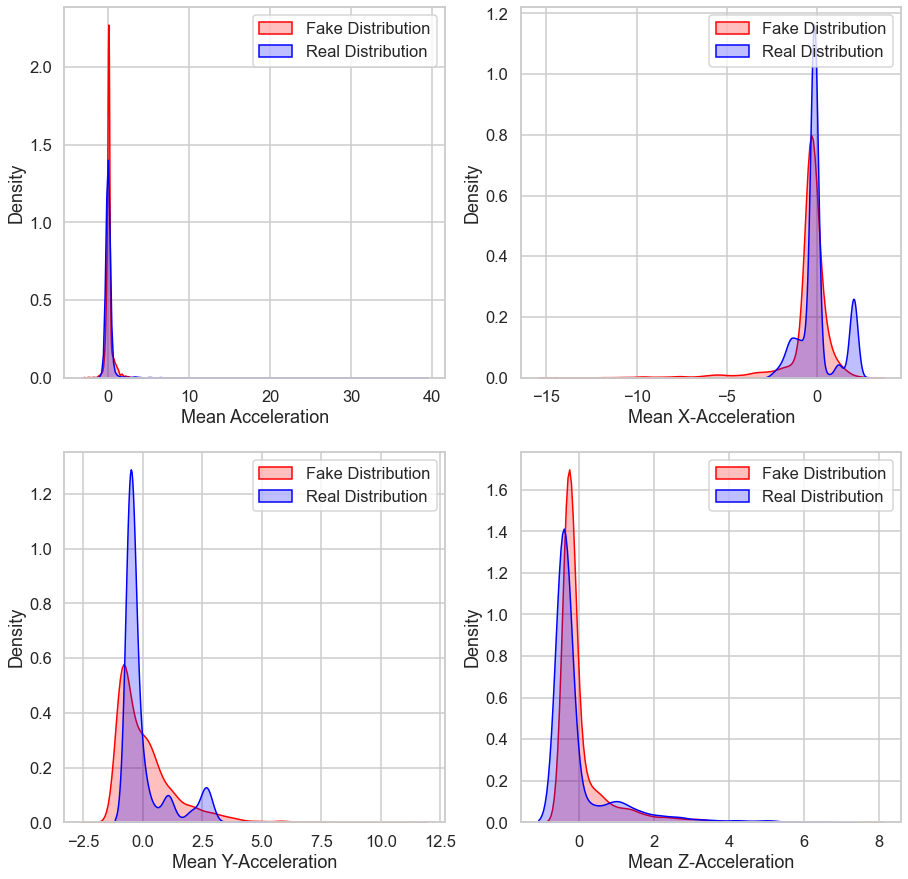

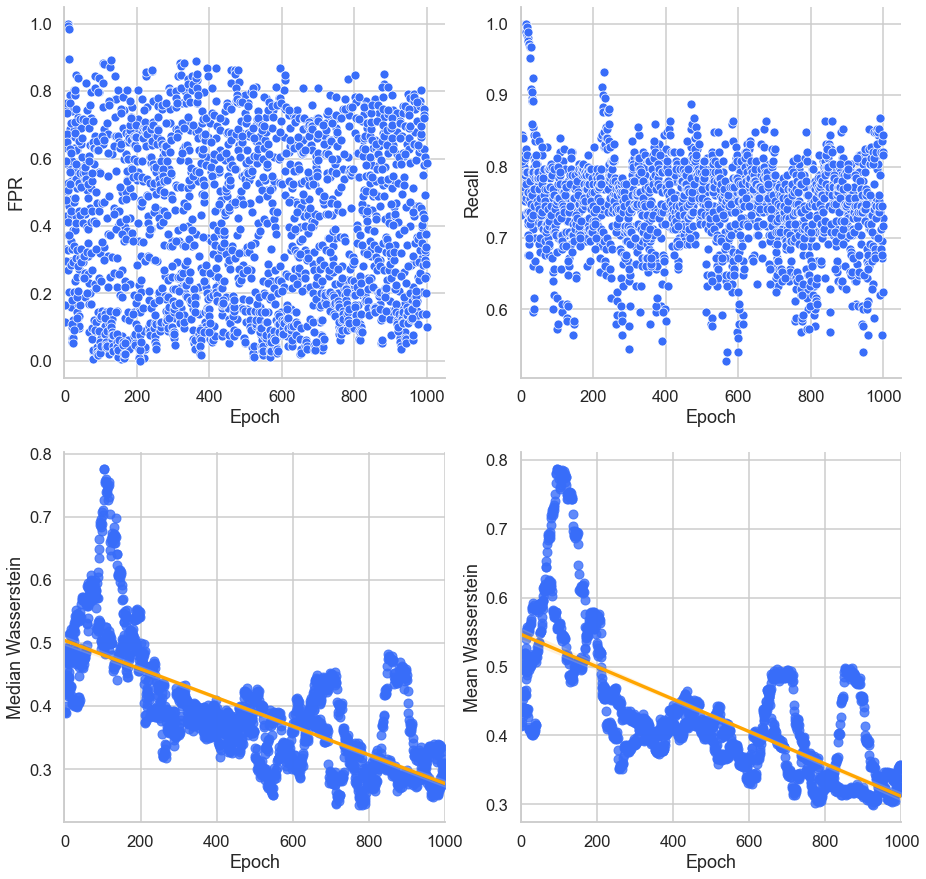

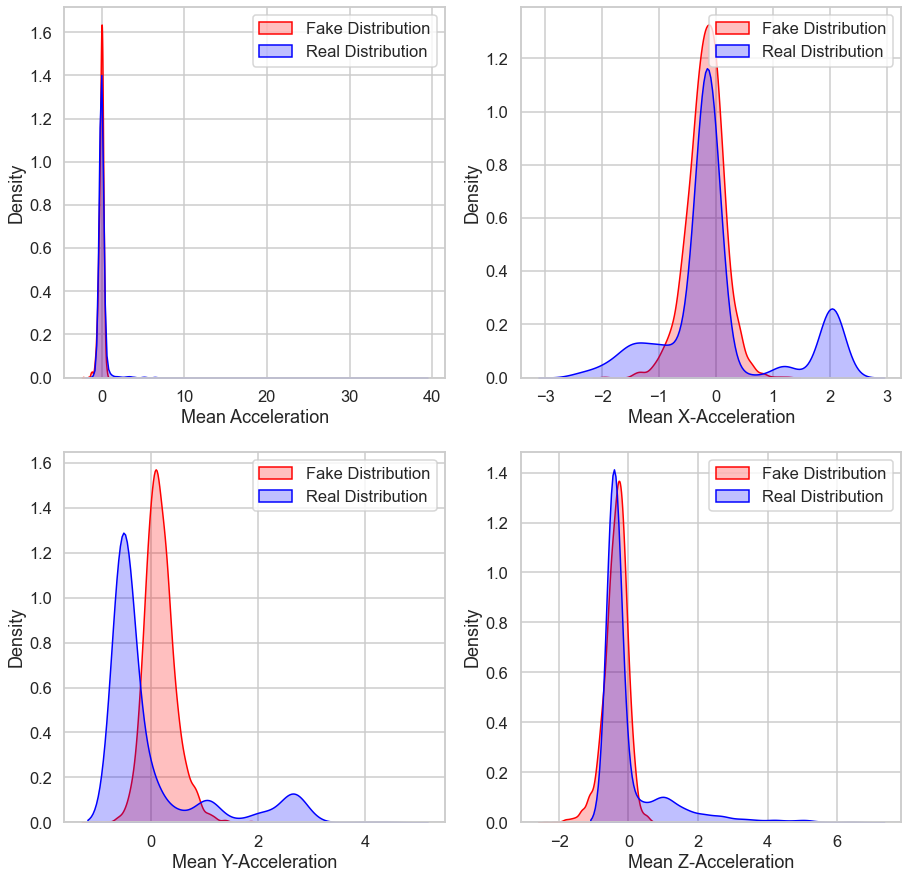

Epoch [1/1000] Training: DISC | Loss D: 0.38697, Loss G: 1.99404 | Acc: 0.94200 | fpR: 0.01200 | P: 0.98678 | R: 0.89600 | F1: 0.93870 | Median W: 0.46458 | Mean W: 0.45844

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.38697, Loss G: 1.44426 | Acc: 0.90600 | fpR: 0.04800 | P: 0.94714 | R: 0.86000 | F1: 0.90097 | Median W: 0.47400 | Mean W: 0.46326
Epoch [3/1000] Training: GEN | Loss D: 0.38697, Loss G: 1.12710 | Acc: 0.87800 | fpR: 0.12000 | P: 0.87952 | R: 0.87600 | F1: 0.87726 | Median W: 0.44672 | Mean W: 0.46610
Epoch [4/1000] Training: GEN | Loss D: 0.38697, Loss G: 0.98774 | Acc: 0.84800 | fpR: 0.22800 | P: 0.80208 | R: 0.92400 | F1: 0.85824 | Median W: 0.45600 | Mean W: 0.47716
Epoch [5/1000] Training: GEN | Loss D: 0.38697, Loss G: 0.85679 | Acc: 0.79600 | fpR: 0.28400 | P: 0.75517 | R: 0.87600 | F1: 0.81061 | Median W: 0.46611 | Mean W: 0.48867
Epoch [6/1000] Training: GEN | Loss D: 0.38697, Loss G: 0.80652 | Acc: 0.73800 | fpR: 0.39

Epoch [48/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.85922 | Acc: 0.78200 | fpR: 0.25600 | P: 0.76208 | R: 0.82000 | F1: 0.78948 | Median W: 0.63981 | Mean W: 0.68966
Epoch [49/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.82432 | Acc: 0.75800 | fpR: 0.32000 | P: 0.72318 | R: 0.83600 | F1: 0.77501 | Median W: 0.64330 | Mean W: 0.69314
Epoch [50/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.79960 | Acc: 0.70400 | fpR: 0.39200 | P: 0.67114 | R: 0.80000 | F1: 0.72943 | Median W: 0.61932 | Mean W: 0.69668
Epoch [51/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.78338 | Acc: 0.70800 | fpR: 0.44000 | P: 0.66049 | R: 0.85600 | F1: 0.74515 | Median W: 0.59869 | Mean W: 0.70262
Epoch [52/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.74076 | Acc: 0.64000 | fpR: 0.56400 | P: 0.59943 | R: 0.84400 | F1: 0.70051 | Median W: 0.58097 | Mean W: 0.70545
Epoch [53/1000] Training: GEN | Loss D: 0.43848, Loss G: 0.70088 | Acc: 0.63800 | fpR: 0.56400 | P: 0.59829 | R: 0.84000 | F1: 0.69835 

Epoch [141/1000] Training: DISC | Loss D: 0.40556, Loss G: 0.48072 | Acc: 0.86600 | fpR: 0.00400 | P: 0.99459 | R: 0.73600 | F1: 0.84549 | Median W: 0.65298 | Mean W: 0.80026
Epoch [142/1000] Training: DISC | Loss D: 0.34744, Loss G: 0.48072 | Acc: 0.88200 | fpR: 0.00800 | P: 0.98974 | R: 0.77200 | F1: 0.86692 | Median W: 0.65978 | Mean W: 0.79757

Pull Generator

Epoch [143/1000] Training: GEN | Loss D: 0.34744, Loss G: 2.37294 | Acc: 0.85400 | fpR: 0.02800 | P: 0.96335 | R: 0.73600 | F1: 0.83398 | Median W: 0.64077 | Mean W: 0.79270
Epoch [144/1000] Training: GEN | Loss D: 0.34744, Loss G: 1.81201 | Acc: 0.81400 | fpR: 0.10000 | P: 0.87923 | R: 0.72800 | F1: 0.79600 | Median W: 0.63480 | Mean W: 0.78046
Epoch [145/1000] Training: GEN | Loss D: 0.34744, Loss G: 1.32617 | Acc: 0.74400 | fpR: 0.23600 | P: 0.75417 | R: 0.72400 | F1: 0.73828 | Median W: 0.62563 | Mean W: 0.76829
Epoch [146/1000] Training: GEN | Loss D: 0.34744, Loss G: 1.01683 | Acc: 0.68400 | fpR: 0.42400 | P: 0.65132 | 

Epoch [188/1000] Training: GEN | Loss D: 0.36936, Loss G: 0.95332 | Acc: 0.63600 | fpR: 0.44400 | P: 0.61724 | R: 0.71600 | F1: 0.66247 | Median W: 0.52405 | Mean W: 0.59093
Epoch [189/1000] Training: GEN | Loss D: 0.36936, Loss G: 0.78952 | Acc: 0.61000 | fpR: 0.51200 | P: 0.58842 | R: 0.73200 | F1: 0.65191 | Median W: 0.51529 | Mean W: 0.58080
Epoch [190/1000] Training: GEN | Loss D: 0.36936, Loss G: 0.71357 | Acc: 0.56800 | fpR: 0.64400 | P: 0.54775 | R: 0.78000 | F1: 0.64308 | Median W: 0.51727 | Mean W: 0.58050
Epoch [191/1000] Training: GEN | Loss D: 0.36936, Loss G: 0.66583 | Acc: 0.56400 | fpR: 0.62800 | P: 0.54624 | R: 0.75600 | F1: 0.63374 | Median W: 0.52327 | Mean W: 0.57796
Epoch [192/1000] Training: GEN | Loss D: 0.36936, Loss G: 0.60088 | Acc: 0.51000 | fpR: 0.73600 | P: 0.50670 | R: 0.75600 | F1: 0.60626 | Median W: 0.53125 | Mean W: 0.57666

Push Generator

Epoch [193/1000] Training: DISC | Loss D: 0.75848, Loss G: 0.60088 | Acc: 0.55000 | fpR: 0.67600 | P: 0.53444 | R

Epoch [235/1000] Training: DISC | Loss D: 0.64115, Loss G: 0.63261 | Acc: 0.57200 | fpR: 0.66000 | P: 0.54918 | R: 0.80400 | F1: 0.65212 | Median W: 0.39170 | Mean W: 0.44552
Epoch [236/1000] Training: DISC | Loss D: 0.61256, Loss G: 0.63261 | Acc: 0.64400 | fpR: 0.49600 | P: 0.61250 | R: 0.78400 | F1: 0.68723 | Median W: 0.40040 | Mean W: 0.44320
Epoch [237/1000] Training: DISC | Loss D: 0.59281, Loss G: 0.63261 | Acc: 0.68600 | fpR: 0.40400 | P: 0.65763 | R: 0.77600 | F1: 0.71143 | Median W: 0.38783 | Mean W: 0.44311
Epoch [238/1000] Training: DISC | Loss D: 0.58958, Loss G: 0.63261 | Acc: 0.77800 | fpR: 0.24000 | P: 0.76834 | R: 0.79600 | F1: 0.78143 | Median W: 0.39296 | Mean W: 0.43949

Pull Generator

Epoch [239/1000] Training: GEN | Loss D: 0.58958, Loss G: 0.80261 | Acc: 0.70400 | fpR: 0.34400 | P: 0.68613 | R: 0.75200 | F1: 0.71706 | Median W: 0.38843 | Mean W: 0.44240
Epoch [240/1000] Training: GEN | Loss D: 0.58958, Loss G: 0.78158 | Acc: 0.67600 | fpR: 0.44800 | P: 0.64103 

Epoch [282/1000] Training: DISC | Loss D: 0.53831, Loss G: 0.64380 | Acc: 0.82800 | fpR: 0.11600 | P: 0.86937 | R: 0.77200 | F1: 0.81730 | Median W: 0.39687 | Mean W: 0.43095

Pull Generator

Epoch [283/1000] Training: GEN | Loss D: 0.53831, Loss G: 1.34274 | Acc: 0.77600 | fpR: 0.15600 | P: 0.81944 | R: 0.70800 | F1: 0.75916 | Median W: 0.39185 | Mean W: 0.43089
Epoch [284/1000] Training: GEN | Loss D: 0.53831, Loss G: 1.00779 | Acc: 0.74600 | fpR: 0.24800 | P: 0.74899 | R: 0.74000 | F1: 0.74397 | Median W: 0.39064 | Mean W: 0.42610
Epoch [285/1000] Training: GEN | Loss D: 0.53831, Loss G: 0.97765 | Acc: 0.76000 | fpR: 0.20800 | P: 0.77778 | R: 0.72800 | F1: 0.75157 | Median W: 0.40395 | Mean W: 0.42694
Epoch [286/1000] Training: GEN | Loss D: 0.53831, Loss G: 0.92619 | Acc: 0.75400 | fpR: 0.25200 | P: 0.75099 | R: 0.76000 | F1: 0.75497 | Median W: 0.40660 | Mean W: 0.42654
Epoch [287/1000] Training: GEN | Loss D: 0.53831, Loss G: 0.90878 | Acc: 0.73000 | fpR: 0.25600 | P: 0.73663 | R

Epoch [329/1000] Training: GEN | Loss D: 0.39888, Loss G: 0.76189 | Acc: 0.58800 | fpR: 0.54000 | P: 0.57006 | R: 0.71600 | F1: 0.63426 | Median W: 0.43320 | Mean W: 0.42915
Epoch [330/1000] Training: GEN | Loss D: 0.39888, Loss G: 0.65934 | Acc: 0.59600 | fpR: 0.62000 | P: 0.56704 | R: 0.81200 | F1: 0.66728 | Median W: 0.41400 | Mean W: 0.42684
Epoch [331/1000] Training: GEN | Loss D: 0.39888, Loss G: 0.62083 | Acc: 0.55400 | fpR: 0.65600 | P: 0.53803 | R: 0.76400 | F1: 0.63092 | Median W: 0.40645 | Mean W: 0.42171
Epoch [332/1000] Training: GEN | Loss D: 0.39888, Loss G: 0.57366 | Acc: 0.50600 | fpR: 0.77200 | P: 0.50386 | R: 0.78400 | F1: 0.61298 | Median W: 0.41577 | Mean W: 0.42684

Push Generator

Epoch [333/1000] Training: DISC | Loss D: 0.72951, Loss G: 0.57366 | Acc: 0.56200 | fpR: 0.66800 | P: 0.54247 | R: 0.79200 | F1: 0.64342 | Median W: 0.42167 | Mean W: 0.42838
Epoch [334/1000] Training: DISC | Loss D: 0.70001, Loss G: 0.57366 | Acc: 0.57000 | fpR: 0.62800 | P: 0.55014 | 

Epoch [376/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.67844 | Acc: 0.62800 | fpR: 0.52800 | P: 0.59756 | R: 0.78400 | F1: 0.67771 | Median W: 0.37903 | Mean W: 0.44531
Epoch [377/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.64905 | Acc: 0.60000 | fpR: 0.55200 | P: 0.57669 | R: 0.75200 | F1: 0.65229 | Median W: 0.38118 | Mean W: 0.45434
Epoch [378/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.61808 | Acc: 0.53200 | fpR: 0.64400 | P: 0.52367 | R: 0.70800 | F1: 0.60155 | Median W: 0.38456 | Mean W: 0.45580
Epoch [379/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.58461 | Acc: 0.53600 | fpR: 0.65600 | P: 0.52601 | R: 0.72800 | F1: 0.61025 | Median W: 0.39325 | Mean W: 0.45869
Epoch [380/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.57890 | Acc: 0.55200 | fpR: 0.64800 | P: 0.53714 | R: 0.75200 | F1: 0.62618 | Median W: 0.40277 | Mean W: 0.46563
Epoch [381/1000] Training: GEN | Loss D: 0.42567, Loss G: 0.53671 | Acc: 0.52000 | fpR: 0.74400 | P: 0.51309 | R: 0.78400 | F1: 0.

Epoch [423/1000] Training: GEN | Loss D: 0.44647, Loss G: 0.75116 | Acc: 0.57200 | fpR: 0.57600 | P: 0.55556 | R: 0.72000 | F1: 0.62669 | Median W: 0.39854 | Mean W: 0.43598
Epoch [424/1000] Training: GEN | Loss D: 0.44647, Loss G: 0.71752 | Acc: 0.57400 | fpR: 0.65200 | P: 0.55096 | R: 0.80000 | F1: 0.65205 | Median W: 0.38904 | Mean W: 0.43905
Epoch [425/1000] Training: GEN | Loss D: 0.44647, Loss G: 0.65833 | Acc: 0.55600 | fpR: 0.64000 | P: 0.54023 | R: 0.75200 | F1: 0.62828 | Median W: 0.39156 | Mean W: 0.43861
Epoch [426/1000] Training: GEN | Loss D: 0.44647, Loss G: 0.66829 | Acc: 0.56600 | fpR: 0.65200 | P: 0.54596 | R: 0.78400 | F1: 0.64319 | Median W: 0.38808 | Mean W: 0.43627
Epoch [427/1000] Training: GEN | Loss D: 0.44647, Loss G: 0.57775 | Acc: 0.50800 | fpR: 0.71600 | P: 0.50552 | R: 0.73200 | F1: 0.59756 | Median W: 0.38601 | Mean W: 0.43171

Push Generator

Epoch [428/1000] Training: DISC | Loss D: 0.77488, Loss G: 0.57775 | Acc: 0.54200 | fpR: 0.70000 | P: 0.52830 | R

Epoch [470/1000] Training: DISC | Loss D: 0.57139, Loss G: 0.63950 | Acc: 0.75600 | fpR: 0.16000 | P: 0.80769 | R: 0.67200 | F1: 0.73313 | Median W: 0.34026 | Mean W: 0.41108
Epoch [471/1000] Training: DISC | Loss D: 0.54450, Loss G: 0.63950 | Acc: 0.76400 | fpR: 0.13600 | P: 0.83000 | R: 0.66400 | F1: 0.73728 | Median W: 0.33162 | Mean W: 0.40658
Epoch [472/1000] Training: DISC | Loss D: 0.53465, Loss G: 0.63950 | Acc: 0.78600 | fpR: 0.10400 | P: 0.86667 | R: 0.67600 | F1: 0.75906 | Median W: 0.33841 | Mean W: 0.41147
Epoch [473/1000] Training: DISC | Loss D: 0.51485, Loss G: 0.63950 | Acc: 0.82600 | fpR: 0.06400 | P: 0.91795 | R: 0.71600 | F1: 0.80400 | Median W: 0.34148 | Mean W: 0.40827
Epoch [474/1000] Training: DISC | Loss D: 0.50307, Loss G: 0.63950 | Acc: 0.82000 | fpR: 0.06800 | P: 0.91237 | R: 0.70800 | F1: 0.79681 | Median W: 0.33874 | Mean W: 0.40690
Epoch [475/1000] Training: DISC | Loss D: 0.47314, Loss G: 0.63950 | Acc: 0.86200 | fpR: 0.04000 | P: 0.95025 | R: 0.76400 | 

Epoch [517/1000] Training: DISC | Loss D: 0.70173, Loss G: 0.58234 | Acc: 0.54800 | fpR: 0.62400 | P: 0.53571 | R: 0.72000 | F1: 0.61385 | Median W: 0.38991 | Mean W: 0.46121
Epoch [518/1000] Training: DISC | Loss D: 0.67253, Loss G: 0.58234 | Acc: 0.59600 | fpR: 0.56000 | P: 0.57317 | R: 0.75200 | F1: 0.65003 | Median W: 0.37411 | Mean W: 0.45399
Epoch [519/1000] Training: DISC | Loss D: 0.62645, Loss G: 0.58234 | Acc: 0.66600 | fpR: 0.39200 | P: 0.64875 | R: 0.72400 | F1: 0.68381 | Median W: 0.37274 | Mean W: 0.45576
Epoch [520/1000] Training: DISC | Loss D: 0.61106, Loss G: 0.58234 | Acc: 0.70800 | fpR: 0.26400 | P: 0.72034 | R: 0.68000 | F1: 0.69909 | Median W: 0.39781 | Mean W: 0.47160
Epoch [521/1000] Training: DISC | Loss D: 0.57942, Loss G: 0.58234 | Acc: 0.68000 | fpR: 0.18400 | P: 0.74725 | R: 0.54400 | F1: 0.62914 | Median W: 0.38428 | Mean W: 0.45628
Epoch [522/1000] Training: DISC | Loss D: 0.53052, Loss G: 0.58234 | Acc: 0.74400 | fpR: 0.15200 | P: 0.80808 | R: 0.64000 | 

Epoch [564/1000] Training: DISC | Loss D: 0.65026, Loss G: 0.57630 | Acc: 0.58200 | fpR: 0.51200 | P: 0.56902 | R: 0.67600 | F1: 0.61742 | Median W: 0.40955 | Mean W: 0.45098
Epoch [565/1000] Training: DISC | Loss D: 0.67986, Loss G: 0.57630 | Acc: 0.57600 | fpR: 0.38800 | P: 0.58190 | R: 0.54000 | F1: 0.55967 | Median W: 0.40129 | Mean W: 0.44374
Epoch [566/1000] Training: DISC | Loss D: 0.62287, Loss G: 0.57630 | Acc: 0.68800 | fpR: 0.25200 | P: 0.71364 | R: 0.62800 | F1: 0.66759 | Median W: 0.39917 | Mean W: 0.42895
Epoch [567/1000] Training: DISC | Loss D: 0.62800, Loss G: 0.57630 | Acc: 0.68000 | fpR: 0.29200 | P: 0.69068 | R: 0.65200 | F1: 0.67028 | Median W: 0.40331 | Mean W: 0.44130
Epoch [568/1000] Training: DISC | Loss D: 0.59731, Loss G: 0.57630 | Acc: 0.69800 | fpR: 0.20400 | P: 0.74627 | R: 0.60000 | F1: 0.66469 | Median W: 0.39732 | Mean W: 0.43533
Epoch [569/1000] Training: DISC | Loss D: 0.55119, Loss G: 0.57630 | Acc: 0.75600 | fpR: 0.16400 | P: 0.80476 | R: 0.67600 | 

Epoch [611/1000] Training: GEN | Loss D: 0.48757, Loss G: 0.74229 | Acc: 0.61400 | fpR: 0.51200 | P: 0.59105 | R: 0.74000 | F1: 0.65670 | Median W: 0.38344 | Mean W: 0.40880
Epoch [612/1000] Training: GEN | Loss D: 0.48757, Loss G: 0.72287 | Acc: 0.60600 | fpR: 0.56800 | P: 0.57864 | R: 0.78000 | F1: 0.66391 | Median W: 0.38204 | Mean W: 0.41281
Epoch [613/1000] Training: GEN | Loss D: 0.48757, Loss G: 0.67096 | Acc: 0.60400 | fpR: 0.54000 | P: 0.58075 | R: 0.74800 | F1: 0.65335 | Median W: 0.38955 | Mean W: 0.41934
Epoch [614/1000] Training: GEN | Loss D: 0.48757, Loss G: 0.63137 | Acc: 0.54200 | fpR: 0.72400 | P: 0.52742 | R: 0.80800 | F1: 0.63775 | Median W: 0.40940 | Mean W: 0.41955

Push Generator

Epoch [615/1000] Training: DISC | Loss D: 0.70856, Loss G: 0.63137 | Acc: 0.56200 | fpR: 0.66800 | P: 0.54247 | R: 0.79200 | F1: 0.64342 | Median W: 0.39637 | Mean W: 0.42131
Epoch [616/1000] Training: DISC | Loss D: 0.70759, Loss G: 0.63137 | Acc: 0.56600 | fpR: 0.67600 | P: 0.54447 | 

Epoch [658/1000] Training: DISC | Loss D: 0.60510, Loss G: 0.68054 | Acc: 0.70600 | fpR: 0.32800 | P: 0.69288 | R: 0.74000 | F1: 0.71517 | Median W: 0.41261 | Mean W: 0.44090
Epoch [659/1000] Training: DISC | Loss D: 0.58001, Loss G: 0.68054 | Acc: 0.73400 | fpR: 0.22800 | P: 0.75325 | R: 0.69600 | F1: 0.72299 | Median W: 0.40139 | Mean W: 0.43432
Epoch [660/1000] Training: DISC | Loss D: 0.50810, Loss G: 0.68054 | Acc: 0.75200 | fpR: 0.17200 | P: 0.79717 | R: 0.67600 | F1: 0.73111 | Median W: 0.39954 | Mean W: 0.43691
Epoch [661/1000] Training: DISC | Loss D: 0.49572, Loss G: 0.68054 | Acc: 0.74400 | fpR: 0.17200 | P: 0.79327 | R: 0.66000 | F1: 0.72003 | Median W: 0.39431 | Mean W: 0.43532
Epoch [662/1000] Training: DISC | Loss D: 0.50211, Loss G: 0.68054 | Acc: 0.74200 | fpR: 0.20800 | P: 0.76889 | R: 0.69200 | F1: 0.72792 | Median W: 0.40924 | Mean W: 0.43756
Epoch [663/1000] Training: DISC | Loss D: 0.46771, Loss G: 0.68054 | Acc: 0.79200 | fpR: 0.15200 | P: 0.82883 | R: 0.73600 | 

Epoch [705/1000] Training: DISC | Loss D: 0.74749, Loss G: 0.58244 | Acc: 0.54400 | fpR: 0.65600 | P: 0.53143 | R: 0.74400 | F1: 0.61951 | Median W: 0.42482 | Mean W: 0.47329
Epoch [706/1000] Training: DISC | Loss D: 0.73480, Loss G: 0.58244 | Acc: 0.54000 | fpR: 0.70000 | P: 0.52703 | R: 0.78000 | F1: 0.62855 | Median W: 0.42620 | Mean W: 0.47780
Epoch [707/1000] Training: DISC | Loss D: 0.71279, Loss G: 0.58244 | Acc: 0.58400 | fpR: 0.56000 | P: 0.56522 | R: 0.72800 | F1: 0.63587 | Median W: 0.41245 | Mean W: 0.46824
Epoch [708/1000] Training: DISC | Loss D: 0.56264, Loss G: 0.58244 | Acc: 0.66800 | fpR: 0.29200 | P: 0.68261 | R: 0.62800 | F1: 0.65367 | Median W: 0.41510 | Mean W: 0.46881
Epoch [709/1000] Training: DISC | Loss D: 0.57378, Loss G: 0.58244 | Acc: 0.72000 | fpR: 0.15600 | P: 0.79255 | R: 0.59600 | F1: 0.67988 | Median W: 0.42274 | Mean W: 0.47785
Epoch [710/1000] Training: DISC | Loss D: 0.48743, Loss G: 0.58244 | Acc: 0.76400 | fpR: 0.21200 | P: 0.77731 | R: 0.74000 | 

Epoch [752/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.80064 | Acc: 0.64200 | fpR: 0.47600 | P: 0.61489 | R: 0.76000 | F1: 0.67929 | Median W: 0.34177 | Mean W: 0.40350
Epoch [753/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.72538 | Acc: 0.61000 | fpR: 0.53600 | P: 0.58514 | R: 0.75600 | F1: 0.65919 | Median W: 0.32395 | Mean W: 0.39088
Epoch [754/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.72085 | Acc: 0.55600 | fpR: 0.66000 | P: 0.53911 | R: 0.77200 | F1: 0.63438 | Median W: 0.34044 | Mean W: 0.40551
Epoch [755/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.60454 | Acc: 0.55600 | fpR: 0.65600 | P: 0.53933 | R: 0.76800 | F1: 0.63318 | Median W: 0.33233 | Mean W: 0.39551
Epoch [756/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.61741 | Acc: 0.54800 | fpR: 0.66800 | P: 0.53352 | R: 0.76400 | F1: 0.62781 | Median W: 0.33180 | Mean W: 0.40014
Epoch [757/1000] Training: GEN | Loss D: 0.43437, Loss G: 0.57609 | Acc: 0.51800 | fpR: 0.70400 | P: 0.51247 | R: 0.74000 | F1: 0.

Epoch [799/1000] Training: DISC | Loss D: 0.49948, Loss G: 0.63508 | Acc: 0.80600 | fpR: 0.06800 | P: 0.90909 | R: 0.68000 | F1: 0.77754 | Median W: 0.31507 | Mean W: 0.38060
Epoch [800/1000] Training: DISC | Loss D: 0.49412, Loss G: 0.63508 | Acc: 0.84200 | fpR: 0.06800 | P: 0.91707 | R: 0.75200 | F1: 0.82588 | Median W: 0.31659 | Mean W: 0.38700

Pull Generator

Epoch [801/1000] Training: GEN | Loss D: 0.49412, Loss G: 1.11811 | Acc: 0.85400 | fpR: 0.05200 | P: 0.93596 | R: 0.76000 | F1: 0.83836 | Median W: 0.30459 | Mean W: 0.37604
Epoch [802/1000] Training: GEN | Loss D: 0.49412, Loss G: 0.98971 | Acc: 0.78400 | fpR: 0.11200 | P: 0.85859 | R: 0.68000 | F1: 0.75844 | Median W: 0.32776 | Mean W: 0.38072
Epoch [803/1000] Training: GEN | Loss D: 0.49412, Loss G: 0.99259 | Acc: 0.70800 | fpR: 0.26400 | P: 0.72034 | R: 0.68000 | F1: 0.69909 | Median W: 0.32556 | Mean W: 0.38852
Epoch [804/1000] Training: GEN | Loss D: 0.49412, Loss G: 0.84438 | Acc: 0.65200 | fpR: 0.41600 | P: 0.63380 | 

Epoch [846/1000] Training: GEN | Loss D: 0.45497, Loss G: 0.59310 | Acc: 0.51800 | fpR: 0.71200 | P: 0.51233 | R: 0.74800 | F1: 0.60765 | Median W: 0.34672 | Mean W: 0.37948

Push Generator

Epoch [847/1000] Training: DISC | Loss D: 0.73495, Loss G: 0.59310 | Acc: 0.49400 | fpR: 0.70800 | P: 0.49573 | R: 0.69600 | F1: 0.57855 | Median W: 0.33929 | Mean W: 0.37251
Epoch [848/1000] Training: DISC | Loss D: 0.53900, Loss G: 0.59310 | Acc: 0.70000 | fpR: 0.28800 | P: 0.70492 | R: 0.68800 | F1: 0.69586 | Median W: 0.33807 | Mean W: 0.37475
Epoch [849/1000] Training: DISC | Loss D: 0.52233, Loss G: 0.59310 | Acc: 0.69600 | fpR: 0.19200 | P: 0.75258 | R: 0.58400 | F1: 0.65717 | Median W: 0.35889 | Mean W: 0.39289
Epoch [850/1000] Training: DISC | Loss D: 0.45053, Loss G: 0.59310 | Acc: 0.77800 | fpR: 0.17200 | P: 0.80889 | R: 0.72800 | F1: 0.76582 | Median W: 0.36105 | Mean W: 0.39301
Epoch [851/1000] Training: DISC | Loss D: 0.43850, Loss G: 0.59310 | Acc: 0.78800 | fpR: 0.20400 | P: 0.79268

Epoch [893/1000] Training: DISC | Loss D: 0.46013, Loss G: 0.62229 | Acc: 0.74600 | fpR: 0.16000 | P: 0.80296 | R: 0.65200 | F1: 0.71915 | Median W: 0.33044 | Mean W: 0.40880
Epoch [894/1000] Training: DISC | Loss D: 0.46790, Loss G: 0.62229 | Acc: 0.75400 | fpR: 0.13600 | P: 0.82564 | R: 0.64400 | F1: 0.72310 | Median W: 0.33187 | Mean W: 0.40336
Epoch [895/1000] Training: DISC | Loss D: 0.44656, Loss G: 0.62229 | Acc: 0.76800 | fpR: 0.16800 | P: 0.80734 | R: 0.70400 | F1: 0.75164 | Median W: 0.33530 | Mean W: 0.41570
Epoch [896/1000] Training: DISC | Loss D: 0.44179, Loss G: 0.62229 | Acc: 0.78000 | fpR: 0.14800 | P: 0.82710 | R: 0.70800 | F1: 0.76243 | Median W: 0.31652 | Mean W: 0.40959
Epoch [897/1000] Training: DISC | Loss D: 0.41224, Loss G: 0.62229 | Acc: 0.80800 | fpR: 0.13600 | P: 0.84685 | R: 0.75200 | F1: 0.79611 | Median W: 0.33464 | Mean W: 0.41089

Pull Generator

Epoch [898/1000] Training: GEN | Loss D: 0.41224, Loss G: 0.91789 | Acc: 0.68000 | fpR: 0.39200 | P: 0.65734

Epoch [940/1000] Training: GEN | Loss D: 0.42602, Loss G: 0.78361 | Acc: 0.59600 | fpR: 0.56400 | P: 0.57273 | R: 0.75600 | F1: 0.65123 | Median W: 0.37007 | Mean W: 0.43445
Epoch [941/1000] Training: GEN | Loss D: 0.42602, Loss G: 0.65095 | Acc: 0.54800 | fpR: 0.69600 | P: 0.53226 | R: 0.79200 | F1: 0.63618 | Median W: 0.37226 | Mean W: 0.43446
Epoch [942/1000] Training: GEN | Loss D: 0.42602, Loss G: 0.57251 | Acc: 0.52800 | fpR: 0.75600 | P: 0.51786 | R: 0.81200 | F1: 0.63192 | Median W: 0.37934 | Mean W: 0.44075

Push Generator

Epoch [943/1000] Training: DISC | Loss D: 0.75325, Loss G: 0.57251 | Acc: 0.53200 | fpR: 0.72000 | P: 0.52128 | R: 0.78400 | F1: 0.62572 | Median W: 0.39724 | Mean W: 0.45093
Epoch [944/1000] Training: DISC | Loss D: 0.65712, Loss G: 0.57251 | Acc: 0.57600 | fpR: 0.67600 | P: 0.55053 | R: 0.82800 | F1: 0.66086 | Median W: 0.39353 | Mean W: 0.43992
Epoch [945/1000] Training: DISC | Loss D: 0.61673, Loss G: 0.57251 | Acc: 0.65200 | fpR: 0.46800 | P: 0.62258 |

Epoch [987/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.94535 | Acc: 0.64200 | fpR: 0.48800 | P: 0.61270 | R: 0.77200 | F1: 0.68269 | Median W: 0.40527 | Mean W: 0.52001
Epoch [988/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.78210 | Acc: 0.58200 | fpR: 0.60400 | P: 0.55977 | R: 0.76800 | F1: 0.64707 | Median W: 0.42251 | Mean W: 0.53538
Epoch [989/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.75813 | Acc: 0.57600 | fpR: 0.60000 | P: 0.55621 | R: 0.75200 | F1: 0.63897 | Median W: 0.41691 | Mean W: 0.53156
Epoch [990/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.69302 | Acc: 0.54200 | fpR: 0.64800 | P: 0.53043 | R: 0.73200 | F1: 0.61464 | Median W: 0.43534 | Mean W: 0.54645
Epoch [991/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.64908 | Acc: 0.56000 | fpR: 0.66000 | P: 0.54167 | R: 0.78000 | F1: 0.63886 | Median W: 0.42771 | Mean W: 0.55155
Epoch [992/1000] Training: GEN | Loss D: 0.47761, Loss G: 0.62476 | Acc: 0.55800 | fpR: 0.68000 | P: 0.53930 | R: 0.79600 | F1: 0.

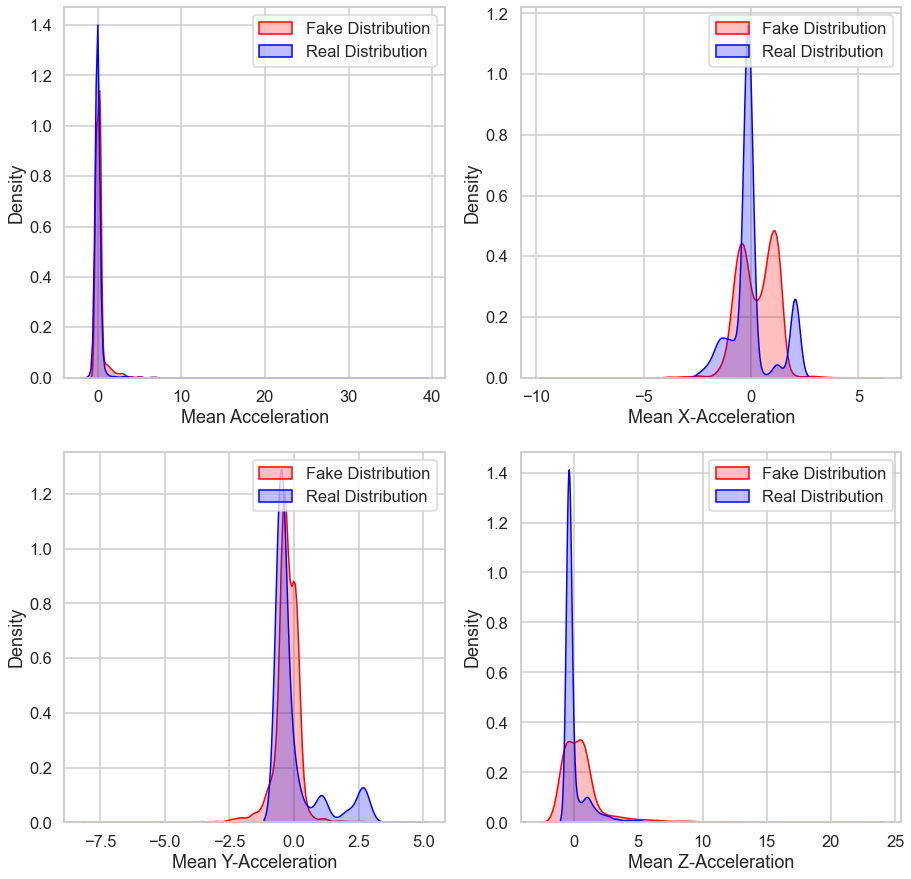

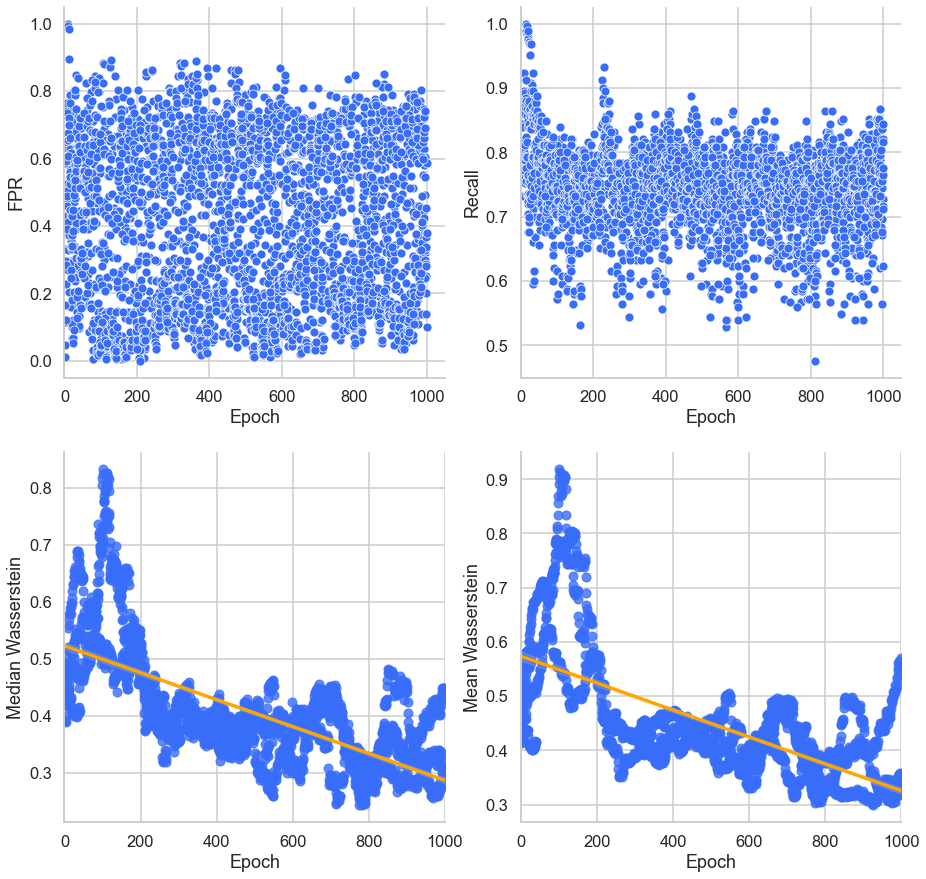

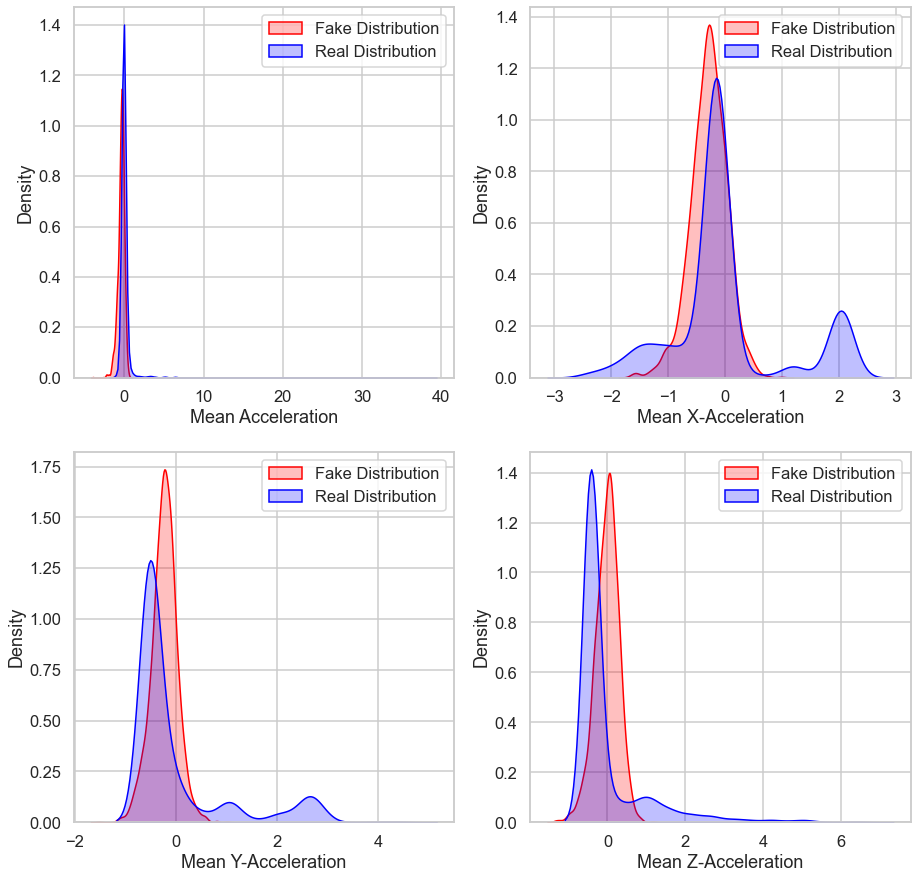

Epoch [1/1000] Training: DISC | Loss D: 0.28567, Loss G: 12.92370 | Acc: 0.89400 | fpR: 0.00400 | P: 0.99497 | R: 0.79200 | F1: 0.88147 | Median W: 0.48327 | Mean W: 0.50121

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.28567, Loss G: 8.80391 | Acc: 0.92800 | fpR: 0.02000 | P: 0.97768 | R: 0.87600 | F1: 0.92355 | Median W: 0.47713 | Mean W: 0.49411
Epoch [3/1000] Training: GEN | Loss D: 0.28567, Loss G: 4.94086 | Acc: 0.89400 | fpR: 0.01200 | P: 0.98522 | R: 0.80000 | F1: 0.88251 | Median W: 0.47374 | Mean W: 0.49178
Epoch [4/1000] Training: GEN | Loss D: 0.28567, Loss G: 3.03576 | Acc: 0.88000 | fpR: 0.01200 | P: 0.98469 | R: 0.77200 | F1: 0.86498 | Median W: 0.47189 | Mean W: 0.49310
Epoch [5/1000] Training: GEN | Loss D: 0.28567, Loss G: 1.78938 | Acc: 0.88600 | fpR: 0.01600 | P: 0.98010 | R: 0.78800 | F1: 0.87312 | Median W: 0.48480 | Mean W: 0.50017
Epoch [6/1000] Training: GEN | Loss D: 0.28567, Loss G: 1.29436 | Acc: 0.88400 | fpR: 0.0

Epoch [95/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.77461 | Acc: 0.69000 | fpR: 0.41600 | P: 0.65677 | R: 0.79600 | F1: 0.71922 | Median W: 0.58300 | Mean W: 0.79928
Epoch [96/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.76674 | Acc: 0.67000 | fpR: 0.43200 | P: 0.64120 | R: 0.77200 | F1: 0.70005 | Median W: 0.58510 | Mean W: 0.80023
Epoch [97/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.78026 | Acc: 0.68200 | fpR: 0.44800 | P: 0.64444 | R: 0.81200 | F1: 0.71809 | Median W: 0.59885 | Mean W: 0.80669
Epoch [98/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.76267 | Acc: 0.70800 | fpR: 0.43200 | P: 0.66250 | R: 0.84800 | F1: 0.74337 | Median W: 0.57993 | Mean W: 0.80198
Epoch [99/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.76155 | Acc: 0.69800 | fpR: 0.42400 | P: 0.65916 | R: 0.82000 | F1: 0.73034 | Median W: 0.58269 | Mean W: 0.80273
Epoch [100/1000] Training: GEN | Loss D: 0.46947, Loss G: 0.75649 | Acc: 0.68600 | fpR: 0.42000 | P: 0.65347 | R: 0.79200 | F1: 0.71560

Epoch [142/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.71371 | Acc: 0.69200 | fpR: 0.41600 | P: 0.65789 | R: 0.80000 | F1: 0.72153 | Median W: 0.53332 | Mean W: 0.87147
Epoch [143/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.68847 | Acc: 0.69400 | fpR: 0.41200 | P: 0.66007 | R: 0.80000 | F1: 0.72283 | Median W: 0.54652 | Mean W: 0.87861
Epoch [144/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.68132 | Acc: 0.65400 | fpR: 0.49600 | P: 0.61846 | R: 0.80400 | F1: 0.69864 | Median W: 0.56228 | Mean W: 0.88257
Epoch [145/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.70203 | Acc: 0.63600 | fpR: 0.50000 | P: 0.60692 | R: 0.77200 | F1: 0.67908 | Median W: 0.56903 | Mean W: 0.88711
Epoch [146/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.68665 | Acc: 0.65000 | fpR: 0.49200 | P: 0.61682 | R: 0.79200 | F1: 0.69303 | Median W: 0.57790 | Mean W: 0.89040
Epoch [147/1000] Training: GEN | Loss D: 0.44192, Loss G: 0.66166 | Acc: 0.64600 | fpR: 0.50800 | P: 0.61162 | R: 0.80000 | F1: 0.

Epoch [189/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.52829 | Acc: 0.58000 | fpR: 0.61600 | P: 0.55747 | R: 0.77600 | F1: 0.64834 | Median W: 0.59224 | Mean W: 0.86040
Epoch [190/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.49118 | Acc: 0.52800 | fpR: 0.64800 | P: 0.52071 | R: 0.70400 | F1: 0.59815 | Median W: 0.59784 | Mean W: 0.87047
Epoch [191/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.48445 | Acc: 0.56000 | fpR: 0.64000 | P: 0.54286 | R: 0.76000 | F1: 0.63285 | Median W: 0.59561 | Mean W: 0.86700
Epoch [192/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.45573 | Acc: 0.54200 | fpR: 0.68400 | P: 0.52893 | R: 0.76800 | F1: 0.62594 | Median W: 0.57298 | Mean W: 0.85743
Epoch [193/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.47481 | Acc: 0.52800 | fpR: 0.66400 | P: 0.52023 | R: 0.72000 | F1: 0.60354 | Median W: 0.55838 | Mean W: 0.85219
Epoch [194/1000] Training: GEN | Loss D: 0.52557, Loss G: 0.45972 | Acc: 0.52200 | fpR: 0.69600 | P: 0.51532 | R: 0.74000 | F1: 0.

Epoch [236/1000] Training: GEN | Loss D: 0.28718, Loss G: 0.51328 | Acc: 0.52400 | fpR: 0.70000 | P: 0.51657 | R: 0.74800 | F1: 0.61063 | Median W: 0.53520 | Mean W: 0.73141

Push Generator

Epoch [237/1000] Training: DISC | Loss D: 0.83348, Loss G: 0.51328 | Acc: 0.49400 | fpR: 0.74000 | P: 0.49591 | R: 0.72800 | F1: 0.58947 | Median W: 0.51938 | Mean W: 0.71592
Epoch [238/1000] Training: DISC | Loss D: 0.75552, Loss G: 0.51328 | Acc: 0.53400 | fpR: 0.71600 | P: 0.52267 | R: 0.78400 | F1: 0.62672 | Median W: 0.52830 | Mean W: 0.72587
Epoch [239/1000] Training: DISC | Loss D: 0.70723, Loss G: 0.51328 | Acc: 0.53800 | fpR: 0.64800 | P: 0.52770 | R: 0.72400 | F1: 0.60997 | Median W: 0.51398 | Mean W: 0.72072
Epoch [240/1000] Training: DISC | Loss D: 0.66582, Loss G: 0.51328 | Acc: 0.61000 | fpR: 0.53600 | P: 0.58514 | R: 0.75600 | F1: 0.65919 | Median W: 0.52735 | Mean W: 0.72077
Epoch [241/1000] Training: DISC | Loss D: 0.56531, Loss G: 0.51328 | Acc: 0.66000 | fpR: 0.40800 | P: 0.64085

Epoch [283/1000] Training: DISC | Loss D: 0.28061, Loss G: 0.54278 | Acc: 0.84400 | fpR: 0.04400 | P: 0.94330 | R: 0.73200 | F1: 0.82383 | Median W: 0.54406 | Mean W: 0.71528
Epoch [284/1000] Training: DISC | Loss D: 0.27713, Loss G: 0.54278 | Acc: 0.86000 | fpR: 0.02400 | P: 0.96875 | R: 0.74400 | F1: 0.84114 | Median W: 0.54344 | Mean W: 0.70805
Epoch [285/1000] Training: DISC | Loss D: 0.27115, Loss G: 0.54278 | Acc: 0.86600 | fpR: 0.03600 | P: 0.95522 | R: 0.76800 | F1: 0.85095 | Median W: 0.54534 | Mean W: 0.71482

Pull Generator

Epoch [286/1000] Training: GEN | Loss D: 0.27115, Loss G: 3.25230 | Acc: 0.82400 | fpR: 0.05600 | P: 0.92632 | R: 0.70400 | F1: 0.79951 | Median W: 0.55203 | Mean W: 0.71434
Epoch [287/1000] Training: GEN | Loss D: 0.27115, Loss G: 1.58471 | Acc: 0.83800 | fpR: 0.10000 | P: 0.88584 | R: 0.77600 | F1: 0.82679 | Median W: 0.51047 | Mean W: 0.69208
Epoch [288/1000] Training: GEN | Loss D: 0.27115, Loss G: 1.25527 | Acc: 0.79400 | fpR: 0.16000 | P: 0.82379 |

Epoch [330/1000] Training: GEN | Loss D: 0.29875, Loss G: 0.58509 | Acc: 0.57200 | fpR: 0.56400 | P: 0.55660 | R: 0.70800 | F1: 0.62275 | Median W: 0.42978 | Mean W: 0.60800
Epoch [331/1000] Training: GEN | Loss D: 0.29875, Loss G: 0.56028 | Acc: 0.54000 | fpR: 0.64400 | P: 0.52924 | R: 0.72400 | F1: 0.61100 | Median W: 0.42176 | Mean W: 0.60545
Epoch [332/1000] Training: GEN | Loss D: 0.29875, Loss G: 0.51346 | Acc: 0.53600 | fpR: 0.63600 | P: 0.52679 | R: 0.70800 | F1: 0.60361 | Median W: 0.40875 | Mean W: 0.60422
Epoch [333/1000] Training: GEN | Loss D: 0.29875, Loss G: 0.52942 | Acc: 0.50000 | fpR: 0.70800 | P: 0.50000 | R: 0.70800 | F1: 0.58561 | Median W: 0.41699 | Mean W: 0.61288

Push Generator

Epoch [334/1000] Training: DISC | Loss D: 0.80460, Loss G: 0.52942 | Acc: 0.53600 | fpR: 0.67200 | P: 0.52542 | R: 0.74400 | F1: 0.61541 | Median W: 0.41481 | Mean W: 0.60446
Epoch [335/1000] Training: DISC | Loss D: 0.78507, Loss G: 0.52942 | Acc: 0.53600 | fpR: 0.62400 | P: 0.52727 | 

Epoch [377/1000] Training: DISC | Loss D: 0.79004, Loss G: 0.42396 | Acc: 0.51000 | fpR: 0.67200 | P: 0.50733 | R: 0.69200 | F1: 0.58496 | Median W: 0.38014 | Mean W: 0.48927
Epoch [378/1000] Training: DISC | Loss D: 0.71877, Loss G: 0.42396 | Acc: 0.51600 | fpR: 0.62400 | P: 0.51250 | R: 0.65600 | F1: 0.57495 | Median W: 0.38239 | Mean W: 0.48960
Epoch [379/1000] Training: DISC | Loss D: 0.63714, Loss G: 0.42396 | Acc: 0.58800 | fpR: 0.42400 | P: 0.58594 | R: 0.60000 | F1: 0.59239 | Median W: 0.38189 | Mean W: 0.48551
Epoch [380/1000] Training: DISC | Loss D: 0.58973, Loss G: 0.42396 | Acc: 0.71000 | fpR: 0.17600 | P: 0.77202 | R: 0.59600 | F1: 0.67219 | Median W: 0.37100 | Mean W: 0.49053
Epoch [381/1000] Training: DISC | Loss D: 0.49986, Loss G: 0.42396 | Acc: 0.74600 | fpR: 0.06000 | P: 0.90196 | R: 0.55200 | F1: 0.68439 | Median W: 0.39570 | Mean W: 0.49750
Epoch [382/1000] Training: DISC | Loss D: 0.45599, Loss G: 0.42396 | Acc: 0.74800 | fpR: 0.02800 | P: 0.94928 | R: 0.52400 | 

Epoch [424/1000] Training: GEN | Loss D: 0.32824, Loss G: 0.52367 | Acc: 0.50600 | fpR: 0.74000 | P: 0.50402 | R: 0.75200 | F1: 0.60305 | Median W: 0.38581 | Mean W: 0.43061

Push Generator

Epoch [425/1000] Training: DISC | Loss D: 0.71758, Loss G: 0.52367 | Acc: 0.49400 | fpR: 0.71600 | P: 0.49577 | R: 0.70400 | F1: 0.58133 | Median W: 0.38327 | Mean W: 0.43430
Epoch [426/1000] Training: DISC | Loss D: 0.68255, Loss G: 0.52367 | Acc: 0.50200 | fpR: 0.66800 | P: 0.50149 | R: 0.67200 | F1: 0.57387 | Median W: 0.37942 | Mean W: 0.42675
Epoch [427/1000] Training: DISC | Loss D: 0.58923, Loss G: 0.52367 | Acc: 0.64400 | fpR: 0.42000 | P: 0.62766 | R: 0.70800 | F1: 0.66492 | Median W: 0.38329 | Mean W: 0.43263
Epoch [428/1000] Training: DISC | Loss D: 0.50948, Loss G: 0.52367 | Acc: 0.76400 | fpR: 0.14800 | P: 0.82039 | R: 0.67600 | F1: 0.74073 | Median W: 0.38859 | Mean W: 0.42843
Epoch [429/1000] Training: DISC | Loss D: 0.47827, Loss G: 0.52367 | Acc: 0.76000 | fpR: 0.08000 | P: 0.88235

Epoch [471/1000] Training: DISC | Loss D: 0.61677, Loss G: 0.61532 | Acc: 0.53600 | fpR: 0.67600 | P: 0.52528 | R: 0.74800 | F1: 0.61668 | Median W: 0.33988 | Mean W: 0.39455
Epoch [472/1000] Training: DISC | Loss D: 0.58443, Loss G: 0.61532 | Acc: 0.61200 | fpR: 0.52400 | P: 0.58805 | R: 0.74800 | F1: 0.65796 | Median W: 0.33227 | Mean W: 0.39175
Epoch [473/1000] Training: DISC | Loss D: 0.56959, Loss G: 0.61532 | Acc: 0.70400 | fpR: 0.27600 | P: 0.71250 | R: 0.68400 | F1: 0.69746 | Median W: 0.34666 | Mean W: 0.39742
Epoch [474/1000] Training: DISC | Loss D: 0.47170, Loss G: 0.61532 | Acc: 0.76800 | fpR: 0.08400 | P: 0.88068 | R: 0.62000 | F1: 0.72721 | Median W: 0.34511 | Mean W: 0.39527
Epoch [475/1000] Training: DISC | Loss D: 0.49508, Loss G: 0.61532 | Acc: 0.75600 | fpR: 0.10800 | P: 0.85165 | R: 0.62000 | F1: 0.71711 | Median W: 0.35126 | Mean W: 0.39469
Epoch [476/1000] Training: DISC | Loss D: 0.48076, Loss G: 0.61532 | Acc: 0.72600 | fpR: 0.08400 | P: 0.86452 | R: 0.53600 | 

Epoch [518/1000] Training: DISC | Loss D: 0.47621, Loss G: 0.57219 | Acc: 0.76400 | fpR: 0.17200 | P: 0.80275 | R: 0.70000 | F1: 0.74737 | Median W: 0.36875 | Mean W: 0.41642
Epoch [519/1000] Training: DISC | Loss D: 0.41945, Loss G: 0.57219 | Acc: 0.76000 | fpR: 0.20800 | P: 0.77778 | R: 0.72800 | F1: 0.75157 | Median W: 0.39639 | Mean W: 0.42838
Epoch [520/1000] Training: DISC | Loss D: 0.43867, Loss G: 0.57219 | Acc: 0.79800 | fpR: 0.14400 | P: 0.83710 | R: 0.74000 | F1: 0.78506 | Median W: 0.36295 | Mean W: 0.41700
Epoch [521/1000] Training: DISC | Loss D: 0.40977, Loss G: 0.57219 | Acc: 0.80600 | fpR: 0.12400 | P: 0.85581 | R: 0.73600 | F1: 0.79090 | Median W: 0.37810 | Mean W: 0.41538
Epoch [522/1000] Training: DISC | Loss D: 0.41247, Loss G: 0.57219 | Acc: 0.78800 | fpR: 0.12400 | P: 0.84951 | R: 0.70000 | F1: 0.76705 | Median W: 0.37986 | Mean W: 0.41706
Epoch [523/1000] Training: DISC | Loss D: 0.41072, Loss G: 0.57219 | Acc: 0.78600 | fpR: 0.14000 | P: 0.83568 | R: 0.71200 | 

Epoch [565/1000] Training: DISC | Loss D: 0.42150, Loss G: 0.52695 | Acc: 0.74600 | fpR: 0.18400 | P: 0.78605 | R: 0.67600 | F1: 0.72638 | Median W: 0.42191 | Mean W: 0.43307
Epoch [566/1000] Training: DISC | Loss D: 0.42160, Loss G: 0.52695 | Acc: 0.79600 | fpR: 0.14800 | P: 0.83333 | R: 0.74000 | F1: 0.78340 | Median W: 0.43036 | Mean W: 0.43954
Epoch [567/1000] Training: DISC | Loss D: 0.40807, Loss G: 0.52695 | Acc: 0.77600 | fpR: 0.12800 | P: 0.84158 | R: 0.68000 | F1: 0.75172 | Median W: 0.42012 | Mean W: 0.43791
Epoch [568/1000] Training: DISC | Loss D: 0.37856, Loss G: 0.52695 | Acc: 0.78800 | fpR: 0.14000 | P: 0.83645 | R: 0.71600 | F1: 0.77106 | Median W: 0.45235 | Mean W: 0.44626
Epoch [569/1000] Training: DISC | Loss D: 0.35987, Loss G: 0.52695 | Acc: 0.80400 | fpR: 0.15600 | P: 0.83043 | R: 0.76400 | F1: 0.79533 | Median W: 0.43128 | Mean W: 0.44739

Pull Generator

Epoch [570/1000] Training: GEN | Loss D: 0.35987, Loss G: 2.05112 | Acc: 0.73800 | fpR: 0.24800 | P: 0.74486

Epoch [612/1000] Training: GEN | Loss D: 0.29557, Loss G: 0.52285 | Acc: 0.53600 | fpR: 0.70000 | P: 0.52446 | R: 0.77200 | F1: 0.62411 | Median W: 0.31381 | Mean W: 0.39721

Push Generator

Epoch [613/1000] Training: DISC | Loss D: 0.71972, Loss G: 0.52285 | Acc: 0.54600 | fpR: 0.66400 | P: 0.53239 | R: 0.75600 | F1: 0.62431 | Median W: 0.30658 | Mean W: 0.39828
Epoch [614/1000] Training: DISC | Loss D: 0.67951, Loss G: 0.52285 | Acc: 0.55800 | fpR: 0.64400 | P: 0.54131 | R: 0.76000 | F1: 0.63179 | Median W: 0.30851 | Mean W: 0.39349
Epoch [615/1000] Training: DISC | Loss D: 0.52334, Loss G: 0.52285 | Acc: 0.75600 | fpR: 0.19600 | P: 0.78319 | R: 0.70800 | F1: 0.74320 | Median W: 0.30987 | Mean W: 0.39356
Epoch [616/1000] Training: DISC | Loss D: 0.43375, Loss G: 0.52285 | Acc: 0.82400 | fpR: 0.04800 | P: 0.93548 | R: 0.69600 | F1: 0.79768 | Median W: 0.30908 | Mean W: 0.38983
Epoch [617/1000] Training: DISC | Loss D: 0.38729, Loss G: 0.52285 | Acc: 0.85600 | fpR: 0.03200 | P: 0.95876

Epoch [659/1000] Training: DISC | Loss D: 0.47315, Loss G: 0.52099 | Acc: 0.77200 | fpR: 0.04000 | P: 0.93590 | R: 0.58400 | F1: 0.71874 | Median W: 0.29995 | Mean W: 0.35936
Epoch [660/1000] Training: DISC | Loss D: 0.39940, Loss G: 0.52099 | Acc: 0.80000 | fpR: 0.08000 | P: 0.89474 | R: 0.68000 | F1: 0.77224 | Median W: 0.27972 | Mean W: 0.35916
Epoch [661/1000] Training: DISC | Loss D: 0.39815, Loss G: 0.52099 | Acc: 0.79400 | fpR: 0.09600 | P: 0.87692 | R: 0.68400 | F1: 0.76805 | Median W: 0.28688 | Mean W: 0.36086
Epoch [662/1000] Training: DISC | Loss D: 0.37604, Loss G: 0.52099 | Acc: 0.83800 | fpR: 0.06800 | P: 0.91626 | R: 0.74400 | F1: 0.82070 | Median W: 0.28666 | Mean W: 0.35906
Epoch [663/1000] Training: DISC | Loss D: 0.36775, Loss G: 0.52099 | Acc: 0.81600 | fpR: 0.06000 | P: 0.92021 | R: 0.69200 | F1: 0.78946 | Median W: 0.28813 | Mean W: 0.35810
Epoch [664/1000] Training: DISC | Loss D: 0.36246, Loss G: 0.52099 | Acc: 0.84200 | fpR: 0.06400 | P: 0.92118 | R: 0.74800 | 

Epoch [706/1000] Training: DISC | Loss D: 0.69229, Loss G: 0.53985 | Acc: 0.56800 | fpR: 0.60000 | P: 0.55090 | R: 0.73600 | F1: 0.62965 | Median W: 0.27913 | Mean W: 0.35577
Epoch [707/1000] Training: DISC | Loss D: 0.41553, Loss G: 0.53985 | Acc: 0.75000 | fpR: 0.13200 | P: 0.82723 | R: 0.63200 | F1: 0.71606 | Median W: 0.29541 | Mean W: 0.36069
Epoch [708/1000] Training: DISC | Loss D: 0.50600, Loss G: 0.53985 | Acc: 0.74600 | fpR: 0.10400 | P: 0.85143 | R: 0.59600 | F1: 0.70069 | Median W: 0.30404 | Mean W: 0.35923
Epoch [709/1000] Training: DISC | Loss D: 0.35452, Loss G: 0.53985 | Acc: 0.78400 | fpR: 0.14800 | P: 0.82870 | R: 0.71600 | F1: 0.76774 | Median W: 0.30346 | Mean W: 0.35844
Epoch [710/1000] Training: DISC | Loss D: 0.37793, Loss G: 0.53985 | Acc: 0.78400 | fpR: 0.18400 | P: 0.80342 | R: 0.75200 | F1: 0.77636 | Median W: 0.29043 | Mean W: 0.36378

Pull Generator

Epoch [711/1000] Training: GEN | Loss D: 0.37793, Loss G: 0.87650 | Acc: 0.67000 | fpR: 0.46400 | P: 0.63407

Epoch [753/1000] Training: GEN | Loss D: 0.33543, Loss G: 1.04618 | Acc: 0.75800 | fpR: 0.29200 | P: 0.73455 | R: 0.80800 | F1: 0.76903 | Median W: 0.30642 | Mean W: 0.34997
Epoch [754/1000] Training: GEN | Loss D: 0.33543, Loss G: 0.91040 | Acc: 0.68600 | fpR: 0.36800 | P: 0.66787 | R: 0.74000 | F1: 0.70159 | Median W: 0.30219 | Mean W: 0.34263
Epoch [755/1000] Training: GEN | Loss D: 0.33543, Loss G: 0.84203 | Acc: 0.65200 | fpR: 0.49200 | P: 0.61801 | R: 0.79600 | F1: 0.69531 | Median W: 0.29766 | Mean W: 0.34610
Epoch [756/1000] Training: GEN | Loss D: 0.33543, Loss G: 0.65301 | Acc: 0.53000 | fpR: 0.67600 | P: 0.52125 | R: 0.73600 | F1: 0.60980 | Median W: 0.31038 | Mean W: 0.34942
Epoch [757/1000] Training: GEN | Loss D: 0.33543, Loss G: 0.51786 | Acc: 0.47200 | fpR: 0.75600 | P: 0.48077 | R: 0.70000 | F1: 0.56955 | Median W: 0.30072 | Mean W: 0.34812

Push Generator

Epoch [758/1000] Training: DISC | Loss D: 0.78300, Loss G: 0.51786 | Acc: 0.52600 | fpR: 0.73600 | P: 0.51706 | R

Epoch [846/1000] Training: DISC | Loss D: 0.57256, Loss G: 0.66963 | Acc: 0.73000 | fpR: 0.26400 | P: 0.73279 | R: 0.72400 | F1: 0.72787 | Median W: 0.40249 | Mean W: 0.43784
Epoch [847/1000] Training: DISC | Loss D: 0.54143, Loss G: 0.66963 | Acc: 0.75000 | fpR: 0.14800 | P: 0.81407 | R: 0.64800 | F1: 0.72111 | Median W: 0.42704 | Mean W: 0.44200
Epoch [848/1000] Training: DISC | Loss D: 0.50667, Loss G: 0.66963 | Acc: 0.77000 | fpR: 0.11600 | P: 0.84974 | R: 0.65600 | F1: 0.73991 | Median W: 0.41739 | Mean W: 0.43815
Epoch [849/1000] Training: DISC | Loss D: 0.51633, Loss G: 0.66963 | Acc: 0.76200 | fpR: 0.12400 | P: 0.83938 | R: 0.64800 | F1: 0.73089 | Median W: 0.40440 | Mean W: 0.44201
Epoch [850/1000] Training: DISC | Loss D: 0.50342, Loss G: 0.66963 | Acc: 0.78400 | fpR: 0.07200 | P: 0.89888 | R: 0.64000 | F1: 0.74718 | Median W: 0.40998 | Mean W: 0.43719
Epoch [851/1000] Training: DISC | Loss D: 0.48081, Loss G: 0.66963 | Acc: 0.80600 | fpR: 0.08000 | P: 0.89637 | R: 0.69200 | 

Epoch [893/1000] Training: GEN | Loss D: 0.28298, Loss G: 0.57050 | Acc: 0.52200 | fpR: 0.66800 | P: 0.51594 | R: 0.71200 | F1: 0.59783 | Median W: 0.29940 | Mean W: 0.38540
Epoch [894/1000] Training: GEN | Loss D: 0.28298, Loss G: 0.53418 | Acc: 0.50400 | fpR: 0.72000 | P: 0.50276 | R: 0.72800 | F1: 0.59429 | Median W: 0.30590 | Mean W: 0.39878

Push Generator

Epoch [895/1000] Training: DISC | Loss D: 0.75275, Loss G: 0.53418 | Acc: 0.55000 | fpR: 0.67200 | P: 0.53463 | R: 0.77200 | F1: 0.63127 | Median W: 0.29278 | Mean W: 0.39496
Epoch [896/1000] Training: DISC | Loss D: 0.63959, Loss G: 0.53418 | Acc: 0.58000 | fpR: 0.53600 | P: 0.56494 | R: 0.69600 | F1: 0.62316 | Median W: 0.29081 | Mean W: 0.39081
Epoch [897/1000] Training: DISC | Loss D: 0.41133, Loss G: 0.53418 | Acc: 0.80000 | fpR: 0.02400 | P: 0.96296 | R: 0.62400 | F1: 0.75680 | Median W: 0.30106 | Mean W: 0.39522
Epoch [898/1000] Training: DISC | Loss D: 0.46831, Loss G: 0.53418 | Acc: 0.78400 | fpR: 0.01600 | P: 0.97333 

Epoch [940/1000] Training: GEN | Loss D: 0.39152, Loss G: 0.66300 | Acc: 0.47200 | fpR: 0.78400 | P: 0.48148 | R: 0.72800 | F1: 0.57914 | Median W: 0.28214 | Mean W: 0.37652

Push Generator

Epoch [941/1000] Training: DISC | Loss D: 1.01279, Loss G: 0.66300 | Acc: 0.52200 | fpR: 0.64800 | P: 0.51642 | R: 0.69200 | F1: 0.59096 | Median W: 0.28754 | Mean W: 0.38025
Epoch [942/1000] Training: DISC | Loss D: 0.76396, Loss G: 0.66300 | Acc: 0.53400 | fpR: 0.64800 | P: 0.52493 | R: 0.71600 | F1: 0.60527 | Median W: 0.27480 | Mean W: 0.37264
Epoch [943/1000] Training: DISC | Loss D: 0.72770, Loss G: 0.66300 | Acc: 0.60000 | fpR: 0.44000 | P: 0.59259 | R: 0.64000 | F1: 0.61489 | Median W: 0.27884 | Mean W: 0.38208
Epoch [944/1000] Training: DISC | Loss D: 0.60178, Loss G: 0.66300 | Acc: 0.69200 | fpR: 0.27600 | P: 0.70513 | R: 0.66000 | F1: 0.68132 | Median W: 0.28713 | Mean W: 0.38407
Epoch [945/1000] Training: DISC | Loss D: 0.56219, Loss G: 0.66300 | Acc: 0.71000 | fpR: 0.20400 | P: 0.75362

Epoch [987/1000] Training: GEN | Loss D: 0.37290, Loss G: 0.67879 | Acc: 0.57800 | fpR: 0.58400 | P: 0.55891 | R: 0.74000 | F1: 0.63634 | Median W: 0.32812 | Mean W: 0.38546
Epoch [988/1000] Training: GEN | Loss D: 0.37290, Loss G: 0.64478 | Acc: 0.56600 | fpR: 0.65200 | P: 0.54596 | R: 0.78400 | F1: 0.64319 | Median W: 0.31763 | Mean W: 0.38379
Epoch [989/1000] Training: GEN | Loss D: 0.37290, Loss G: 0.62515 | Acc: 0.49800 | fpR: 0.75200 | P: 0.49867 | R: 0.74800 | F1: 0.59792 | Median W: 0.33166 | Mean W: 0.39056

Push Generator

Epoch [990/1000] Training: DISC | Loss D: 0.70853, Loss G: 0.62515 | Acc: 0.52400 | fpR: 0.71600 | P: 0.51622 | R: 0.76400 | F1: 0.61565 | Median W: 0.33842 | Mean W: 0.39204
Epoch [991/1000] Training: DISC | Loss D: 0.67238, Loss G: 0.62515 | Acc: 0.57200 | fpR: 0.68400 | P: 0.54762 | R: 0.82800 | F1: 0.65876 | Median W: 0.33904 | Mean W: 0.39874
Epoch [992/1000] Training: DISC | Loss D: 0.65217, Loss G: 0.62515 | Acc: 0.55600 | fpR: 0.64800 | P: 0.53977 |

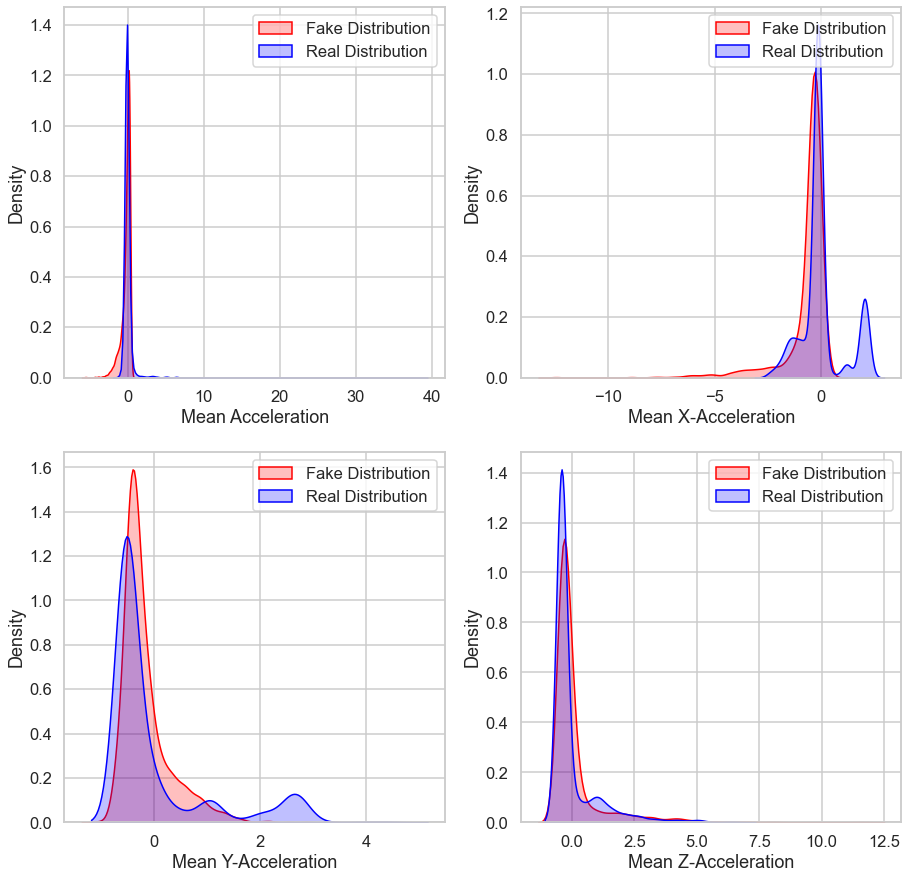

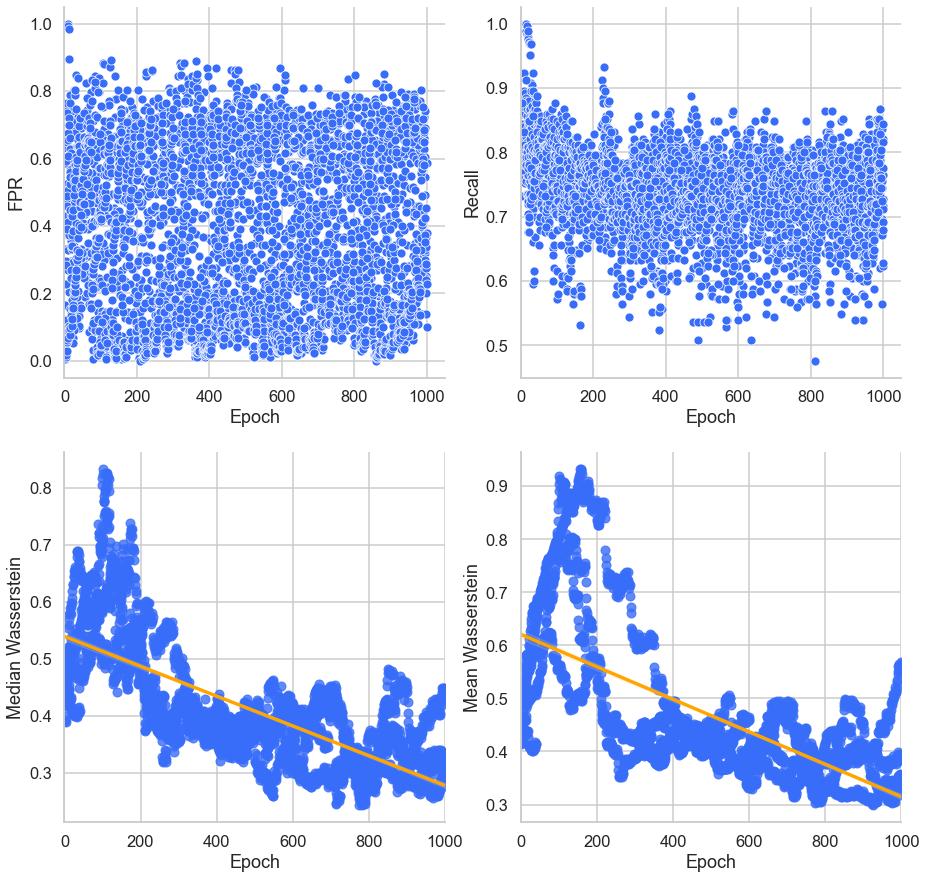

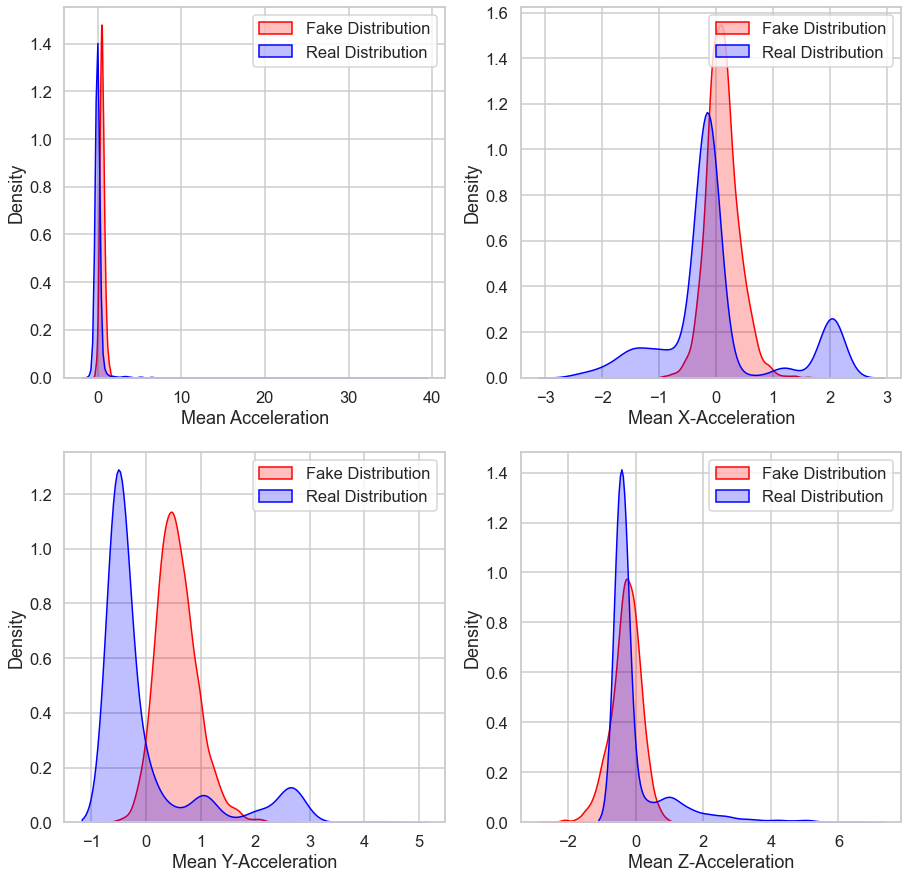

Epoch [1/1000] Training: DISC | Loss D: 0.43388, Loss G: 3.49567 | Acc: 0.75400 | fpR: 0.20800 | P: 0.77489 | R: 0.71600 | F1: 0.74378 | Median W: 0.47248 | Mean W: 0.49714

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.40698, Loss G: 3.49567 | Acc: 0.79600 | fpR: 0.18000 | P: 0.81092 | R: 0.77200 | F1: 0.79048 | Median W: 0.47657 | Mean W: 0.49915

Pull Generator

Epoch [3/1000] Training: GEN | Loss D: 0.40698, Loss G: 2.13536 | Acc: 0.74600 | fpR: 0.26400 | P: 0.74118 | R: 0.75600 | F1: 0.74802 | Median W: 0.48388 | Mean W: 0.49907
Epoch [4/1000] Training: GEN | Loss D: 0.40698, Loss G: 1.12620 | Acc: 0.66000 | fpR: 0.48000 | P: 0.62500 | R: 0.80000 | F1: 0.70126 | Median W: 0.49331 | Mean W: 0.51420
Epoch [5/1000] Training: GEN | Loss D: 0.40698, Loss G: 0.84701 | Acc: 0.61600 | fpR: 0.55600 | P: 0.58631 | R: 0.78800 | F1: 0.67187 | Median W: 0.51553 | Mean W: 0.52005
Epoch [6/1000] Training: GEN | Loss D: 0.40698, Loss G: 0.76699 | Acc: 0.53400 | fpR: 0.6

Epoch [48/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.70035 | Acc: 0.60200 | fpR: 0.51600 | P: 0.58252 | R: 0.72000 | F1: 0.64351 | Median W: 0.61787 | Mean W: 0.63316
Epoch [49/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69873 | Acc: 0.57600 | fpR: 0.60000 | P: 0.55621 | R: 0.75200 | F1: 0.63897 | Median W: 0.60840 | Mean W: 0.63780
Epoch [50/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.70200 | Acc: 0.54200 | fpR: 0.61600 | P: 0.53191 | R: 0.70000 | F1: 0.60400 | Median W: 0.61229 | Mean W: 0.63847
Epoch [51/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.70009 | Acc: 0.53000 | fpR: 0.64400 | P: 0.52226 | R: 0.70400 | F1: 0.59917 | Median W: 0.61713 | Mean W: 0.63721
Epoch [52/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.70328 | Acc: 0.58800 | fpR: 0.52000 | P: 0.57237 | R: 0.69600 | F1: 0.62766 | Median W: 0.61497 | Mean W: 0.64094
Epoch [53/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.70978 | Acc: 0.60000 | fpR: 0.56000 | P: 0.57576 | R: 0.76000 | F1: 0.65468 

Epoch [96/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69998 | Acc: 0.56400 | fpR: 0.61200 | P: 0.54734 | R: 0.74000 | F1: 0.62876 | Median W: 0.62648 | Mean W: 0.69848
Epoch [97/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69017 | Acc: 0.54200 | fpR: 0.63600 | P: 0.53097 | R: 0.72000 | F1: 0.61072 | Median W: 0.62166 | Mean W: 0.69319
Epoch [98/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69383 | Acc: 0.55400 | fpR: 0.62400 | P: 0.53982 | R: 0.73200 | F1: 0.62090 | Median W: 0.62744 | Mean W: 0.70071
Epoch [99/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69565 | Acc: 0.57600 | fpR: 0.58000 | P: 0.55793 | R: 0.73200 | F1: 0.63273 | Median W: 0.62468 | Mean W: 0.70104
Epoch [100/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69310 | Acc: 0.54400 | fpR: 0.62400 | P: 0.53293 | R: 0.71200 | F1: 0.60910 | Median W: 0.62880 | Mean W: 0.70281
Epoch [101/1000] Training: GEN | Loss D: 0.49436, Loss G: 0.69213 | Acc: 0.53200 | fpR: 0.65200 | P: 0.52339 | R: 0.71600 | F1: 0.6042

Epoch [143/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.89186 | Acc: 0.87000 | fpR: 0.00800 | P: 0.98942 | R: 0.74800 | F1: 0.85145 | Median W: 0.60967 | Mean W: 0.67114
Epoch [144/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.87774 | Acc: 0.86600 | fpR: 0.01600 | P: 0.97906 | R: 0.74800 | F1: 0.84758 | Median W: 0.60213 | Mean W: 0.67645
Epoch [145/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.87481 | Acc: 0.83400 | fpR: 0.00800 | P: 0.98830 | R: 0.67600 | F1: 0.80237 | Median W: 0.60177 | Mean W: 0.67733
Epoch [146/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.86807 | Acc: 0.87000 | fpR: 0.00800 | P: 0.98942 | R: 0.74800 | F1: 0.85145 | Median W: 0.60171 | Mean W: 0.67423
Epoch [147/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.86811 | Acc: 0.88600 | fpR: 0.00000 | P: 1.00000 | R: 0.77200 | F1: 0.87084 | Median W: 0.58571 | Mean W: 0.67320
Epoch [148/1000] Training: GEN | Loss D: 0.33692, Loss G: 0.85763 | Acc: 0.85000 | fpR: 0.02800 | P: 0.96296 | R: 0.72800 | F1: 0.

Epoch [190/1000] Training: DISC | Loss D: 0.72030, Loss G: 0.41381 | Acc: 0.62800 | fpR: 0.48800 | P: 0.60390 | R: 0.74400 | F1: 0.66617 | Median W: 0.63189 | Mean W: 0.78789
Epoch [191/1000] Training: DISC | Loss D: 0.31638, Loss G: 0.41381 | Acc: 0.83200 | fpR: 0.02000 | P: 0.97159 | R: 0.68400 | F1: 0.80233 | Median W: 0.63077 | Mean W: 0.79368
Epoch [192/1000] Training: DISC | Loss D: 0.17558, Loss G: 0.41381 | Acc: 0.86800 | fpR: 0.00000 | P: 1.00000 | R: 0.73600 | F1: 0.84744 | Median W: 0.62861 | Mean W: 0.78303
Epoch [193/1000] Training: DISC | Loss D: 0.15567, Loss G: 0.41381 | Acc: 0.88600 | fpR: 0.00000 | P: 1.00000 | R: 0.77200 | F1: 0.87084 | Median W: 0.64316 | Mean W: 0.79193

Pull Generator

Epoch [194/1000] Training: GEN | Loss D: 0.15567, Loss G: 5.11319 | Acc: 0.85000 | fpR: 0.00000 | P: 1.00000 | R: 0.70000 | F1: 0.82305 | Median W: 0.59643 | Mean W: 0.76170
Epoch [195/1000] Training: GEN | Loss D: 0.15567, Loss G: 1.48804 | Acc: 0.85600 | fpR: 0.00000 | P: 1.00000 

Epoch [237/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.90630 | Acc: 0.86200 | fpR: 0.00000 | P: 1.00000 | R: 0.72400 | F1: 0.83942 | Median W: 0.60888 | Mean W: 0.68316
Epoch [238/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.93529 | Acc: 0.87000 | fpR: 0.00000 | P: 1.00000 | R: 0.74000 | F1: 0.85009 | Median W: 0.61043 | Mean W: 0.67592
Epoch [239/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.91294 | Acc: 0.87200 | fpR: 0.00000 | P: 1.00000 | R: 0.74400 | F1: 0.85272 | Median W: 0.60928 | Mean W: 0.67424
Epoch [240/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.90988 | Acc: 0.85800 | fpR: 0.00000 | P: 1.00000 | R: 0.71600 | F1: 0.83401 | Median W: 0.60889 | Mean W: 0.67929
Epoch [241/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.91112 | Acc: 0.88600 | fpR: 0.00000 | P: 1.00000 | R: 0.77200 | F1: 0.87084 | Median W: 0.61074 | Mean W: 0.67908
Epoch [242/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.90717 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.

Epoch [331/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.84314 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.61542 | Mean W: 0.70754
Epoch [332/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83662 | Acc: 0.88000 | fpR: 0.00400 | P: 0.99479 | R: 0.76400 | F1: 0.86376 | Median W: 0.62488 | Mean W: 0.71560
Epoch [333/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.84317 | Acc: 0.87200 | fpR: 0.00000 | P: 1.00000 | R: 0.74400 | F1: 0.85272 | Median W: 0.61932 | Mean W: 0.70487
Epoch [334/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83417 | Acc: 0.82800 | fpR: 0.01200 | P: 0.98235 | R: 0.66800 | F1: 0.79476 | Median W: 0.61517 | Mean W: 0.70705
Epoch [335/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.84117 | Acc: 0.84400 | fpR: 0.00000 | P: 1.00000 | R: 0.68800 | F1: 0.81468 | Median W: 0.63575 | Mean W: 0.70878
Epoch [336/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83842 | Acc: 0.86200 | fpR: 0.00000 | P: 1.00000 | R: 0.72400 | F1: 0.

Epoch [425/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83683 | Acc: 0.85600 | fpR: 0.00000 | P: 1.00000 | R: 0.71200 | F1: 0.83129 | Median W: 0.68987 | Mean W: 0.70437
Epoch [426/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83333 | Acc: 0.86800 | fpR: 0.00400 | P: 0.99462 | R: 0.74000 | F1: 0.84813 | Median W: 0.67685 | Mean W: 0.70017
Epoch [427/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.82941 | Acc: 0.85600 | fpR: 0.00400 | P: 0.99444 | R: 0.71600 | F1: 0.83207 | Median W: 0.68332 | Mean W: 0.70551
Epoch [428/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83359 | Acc: 0.85400 | fpR: 0.00000 | P: 1.00000 | R: 0.70800 | F1: 0.82855 | Median W: 0.67731 | Mean W: 0.70063
Epoch [429/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83364 | Acc: 0.85000 | fpR: 0.00000 | P: 1.00000 | R: 0.70000 | F1: 0.82305 | Median W: 0.68268 | Mean W: 0.70137
Epoch [430/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.83343 | Acc: 0.87000 | fpR: 0.00000 | P: 1.00000 | R: 0.74000 | F1: 0.

Epoch [519/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.80153 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.57831 | Mean W: 0.68805
Epoch [520/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.81062 | Acc: 0.87800 | fpR: 0.01200 | P: 0.98462 | R: 0.76800 | F1: 0.86243 | Median W: 0.58688 | Mean W: 0.68932
Epoch [521/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.80423 | Acc: 0.85800 | fpR: 0.01600 | P: 0.97861 | R: 0.73200 | F1: 0.83704 | Median W: 0.58038 | Mean W: 0.69844
Epoch [522/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.80651 | Acc: 0.85200 | fpR: 0.00400 | P: 0.99438 | R: 0.70800 | F1: 0.82662 | Median W: 0.57269 | Mean W: 0.69151
Epoch [523/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.80447 | Acc: 0.85000 | fpR: 0.00000 | P: 1.00000 | R: 0.70000 | F1: 0.82305 | Median W: 0.57940 | Mean W: 0.68331
Epoch [524/1000] Training: GEN | Loss D: 0.15567, Loss G: 0.80673 | Acc: 0.87000 | fpR: 0.00800 | P: 0.98942 | R: 0.74800 | F1: 0.

Epoch [566/1000] Training: DISC | Loss D: 0.23718, Loss G: 0.34435 | Acc: 0.87200 | fpR: 0.00400 | P: 0.99468 | R: 0.74800 | F1: 0.85339 | Median W: 0.67631 | Mean W: 0.79473
Epoch [567/1000] Training: DISC | Loss D: 0.22456, Loss G: 0.34435 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.66748 | Mean W: 0.78487
Epoch [568/1000] Training: DISC | Loss D: 0.22599, Loss G: 0.34435 | Acc: 0.84400 | fpR: 0.00000 | P: 1.00000 | R: 0.68800 | F1: 0.81468 | Median W: 0.65978 | Mean W: 0.78191
Epoch [569/1000] Training: DISC | Loss D: 0.18154, Loss G: 0.34435 | Acc: 0.86800 | fpR: 0.00000 | P: 1.00000 | R: 0.73600 | F1: 0.84744 | Median W: 0.67155 | Mean W: 0.78698
Epoch [570/1000] Training: DISC | Loss D: 0.19474, Loss G: 0.34435 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.84478 | Median W: 0.67582 | Mean W: 0.79287
Epoch [571/1000] Training: DISC | Loss D: 0.17352, Loss G: 0.34435 | Acc: 0.86400 | fpR: 0.00000 | P: 1.00000 | R: 0.72800 | 

Epoch [613/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80669 | Acc: 0.87400 | fpR: 0.00400 | P: 0.99471 | R: 0.75200 | F1: 0.85600 | Median W: 0.55176 | Mean W: 0.70277
Epoch [614/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80280 | Acc: 0.88800 | fpR: 0.00400 | P: 0.99490 | R: 0.78000 | F1: 0.87395 | Median W: 0.54632 | Mean W: 0.69443
Epoch [615/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80132 | Acc: 0.87800 | fpR: 0.01200 | P: 0.98462 | R: 0.76800 | F1: 0.86243 | Median W: 0.54005 | Mean W: 0.70639
Epoch [616/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80543 | Acc: 0.88400 | fpR: 0.00000 | P: 1.00000 | R: 0.76800 | F1: 0.86829 | Median W: 0.54381 | Mean W: 0.70867
Epoch [617/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80392 | Acc: 0.84600 | fpR: 0.01200 | P: 0.98324 | R: 0.70400 | F1: 0.82003 | Median W: 0.54484 | Mean W: 0.69797
Epoch [618/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.80350 | Acc: 0.89200 | fpR: 0.00000 | P: 1.00000 | R: 0.78400 | F1: 0.

Epoch [707/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78839 | Acc: 0.87000 | fpR: 0.00800 | P: 0.98942 | R: 0.74800 | F1: 0.85145 | Median W: 0.55969 | Mean W: 0.67921
Epoch [708/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78829 | Acc: 0.86600 | fpR: 0.01200 | P: 0.98413 | R: 0.74400 | F1: 0.84689 | Median W: 0.55758 | Mean W: 0.66681
Epoch [709/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78432 | Acc: 0.88600 | fpR: 0.00000 | P: 1.00000 | R: 0.77200 | F1: 0.87084 | Median W: 0.55484 | Mean W: 0.68074
Epoch [710/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78562 | Acc: 0.88200 | fpR: 0.01200 | P: 0.98477 | R: 0.77600 | F1: 0.86752 | Median W: 0.55921 | Mean W: 0.66785
Epoch [711/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78589 | Acc: 0.88400 | fpR: 0.00400 | P: 0.99485 | R: 0.77200 | F1: 0.86888 | Median W: 0.55076 | Mean W: 0.67111
Epoch [712/1000] Training: GEN | Loss D: 0.16297, Loss G: 0.78673 | Acc: 0.88000 | fpR: 0.00400 | P: 0.99479 | R: 0.76400 | F1: 0.

Epoch [801/1000] Training: DISC | Loss D: 0.17180, Loss G: 0.45184 | Acc: 0.86800 | fpR: 0.00000 | P: 1.00000 | R: 0.73600 | F1: 0.84744 | Median W: 0.49268 | Mean W: 0.68455
Epoch [802/1000] Training: DISC | Loss D: 0.14786, Loss G: 0.45184 | Acc: 0.89000 | fpR: 0.00000 | P: 1.00000 | R: 0.78000 | F1: 0.87591 | Median W: 0.49728 | Mean W: 0.68259

Pull Generator

Epoch [803/1000] Training: GEN | Loss D: 0.14786, Loss G: 7.58728 | Acc: 0.85800 | fpR: 0.00000 | P: 1.00000 | R: 0.71600 | F1: 0.83401 | Median W: 0.47710 | Mean W: 0.65466
Epoch [804/1000] Training: GEN | Loss D: 0.14786, Loss G: 2.28366 | Acc: 0.84600 | fpR: 0.01200 | P: 0.98324 | R: 0.70400 | F1: 0.82003 | Median W: 0.49109 | Mean W: 0.61203
Epoch [805/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.87091 | Acc: 0.87600 | fpR: 0.02000 | P: 0.97475 | R: 0.77200 | F1: 0.86111 | Median W: 0.50322 | Mean W: 0.57564
Epoch [806/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.80692 | Acc: 0.86600 | fpR: 0.01200 | P: 0.98413 | 

Epoch [848/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77070 | Acc: 0.85600 | fpR: 0.00800 | P: 0.98901 | R: 0.72000 | F1: 0.83285 | Median W: 0.47684 | Mean W: 0.56235
Epoch [849/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77346 | Acc: 0.85600 | fpR: 0.00800 | P: 0.98901 | R: 0.72000 | F1: 0.83285 | Median W: 0.48248 | Mean W: 0.55472
Epoch [850/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77535 | Acc: 0.87800 | fpR: 0.00000 | P: 1.00000 | R: 0.75600 | F1: 0.86056 | Median W: 0.47781 | Mean W: 0.55851
Epoch [851/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77309 | Acc: 0.85800 | fpR: 0.00400 | P: 0.99448 | R: 0.72000 | F1: 0.83478 | Median W: 0.47981 | Mean W: 0.55742
Epoch [852/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77178 | Acc: 0.87600 | fpR: 0.00400 | P: 0.99474 | R: 0.75600 | F1: 0.85860 | Median W: 0.47193 | Mean W: 0.55725
Epoch [853/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.77093 | Acc: 0.87400 | fpR: 0.00000 | P: 1.00000 | R: 0.74800 | F1: 0.

Epoch [942/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.75705 | Acc: 0.85400 | fpR: 0.04400 | P: 0.94472 | R: 0.75200 | F1: 0.83692 | Median W: 0.44213 | Mean W: 0.54594
Epoch [943/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.76001 | Acc: 0.85200 | fpR: 0.06000 | P: 0.92718 | R: 0.76400 | F1: 0.83722 | Median W: 0.45620 | Mean W: 0.56231
Epoch [944/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.75938 | Acc: 0.83200 | fpR: 0.06800 | P: 0.91500 | R: 0.73200 | F1: 0.81284 | Median W: 0.44370 | Mean W: 0.55554
Epoch [945/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.75559 | Acc: 0.84000 | fpR: 0.06800 | P: 0.91667 | R: 0.74800 | F1: 0.82329 | Median W: 0.44092 | Mean W: 0.55850
Epoch [946/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.75730 | Acc: 0.86200 | fpR: 0.05200 | P: 0.93720 | R: 0.77600 | F1: 0.84852 | Median W: 0.43318 | Mean W: 0.55711
Epoch [947/1000] Training: GEN | Loss D: 0.14786, Loss G: 0.75333 | Acc: 0.84400 | fpR: 0.05600 | P: 0.93000 | R: 0.74400 | F1: 0.

Epoch [989/1000] Training: DISC | Loss D: 0.26379, Loss G: 0.39456 | Acc: 0.83000 | fpR: 0.00400 | P: 0.99401 | R: 0.66400 | F1: 0.79568 | Median W: 0.46950 | Mean W: 0.59074
Epoch [990/1000] Training: DISC | Loss D: 0.22853, Loss G: 0.39456 | Acc: 0.85600 | fpR: 0.00000 | P: 1.00000 | R: 0.71200 | F1: 0.83129 | Median W: 0.44533 | Mean W: 0.58034
Epoch [991/1000] Training: DISC | Loss D: 0.21469, Loss G: 0.39456 | Acc: 0.88400 | fpR: 0.00000 | P: 1.00000 | R: 0.76800 | F1: 0.86829 | Median W: 0.44584 | Mean W: 0.57470

Pull Generator

Epoch [992/1000] Training: GEN | Loss D: 0.21469, Loss G: 1.90245 | Acc: 0.87000 | fpR: 0.00400 | P: 0.99465 | R: 0.74400 | F1: 0.85077 | Median W: 0.44998 | Mean W: 0.57011
Epoch [993/1000] Training: GEN | Loss D: 0.21469, Loss G: 1.18276 | Acc: 0.86400 | fpR: 0.00800 | P: 0.98925 | R: 0.73600 | F1: 0.84355 | Median W: 0.50384 | Mean W: 0.55930
Epoch [994/1000] Training: GEN | Loss D: 0.21469, Loss G: 1.02388 | Acc: 0.86800 | fpR: 0.00400 | P: 0.99462 |

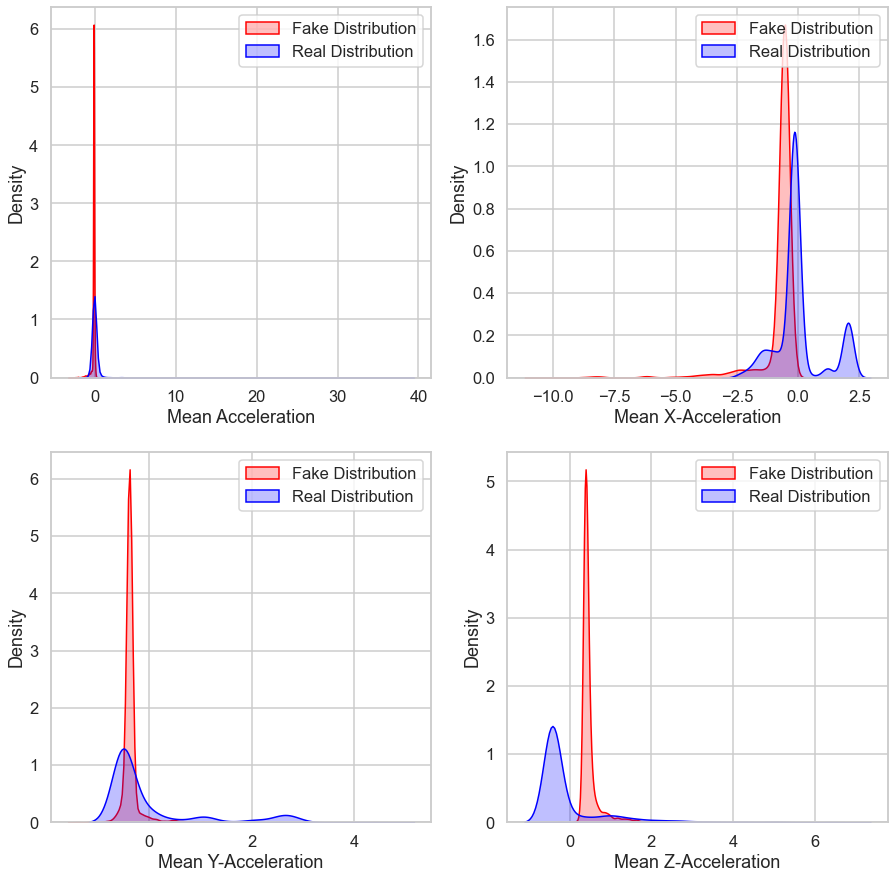

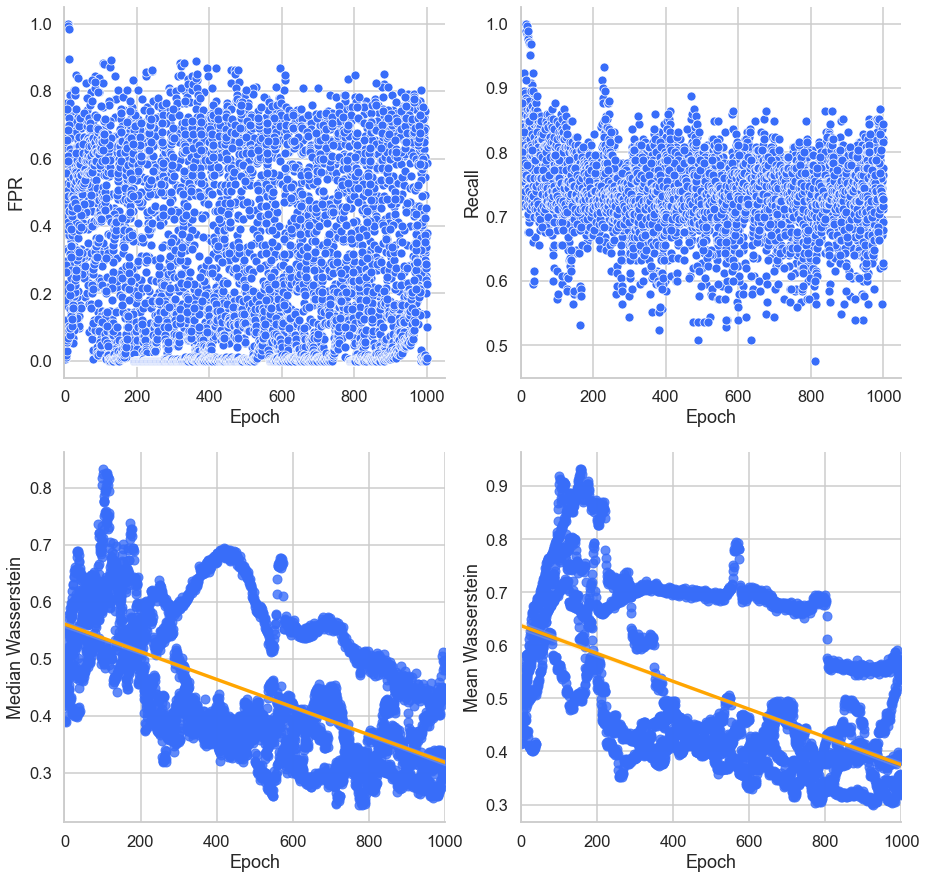

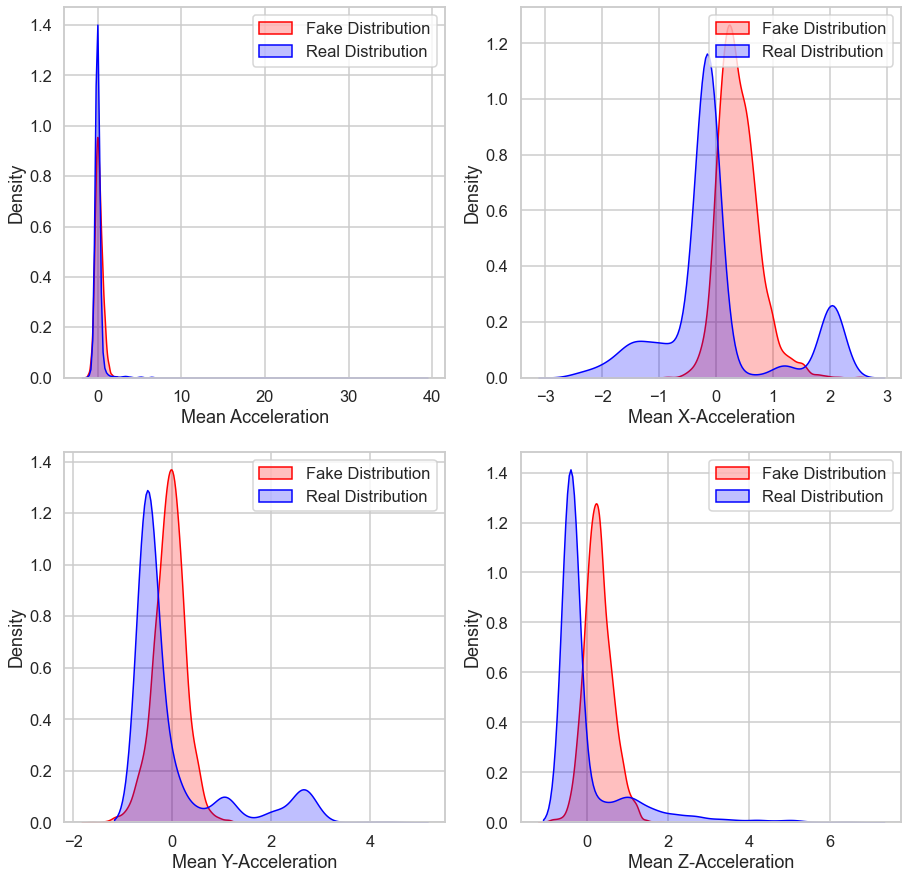

Epoch [1/1000] Training: DISC | Loss D: 0.23208, Loss G: 6.15115 | Acc: 0.87600 | fpR: 0.00000 | P: 1.00000 | R: 0.75200 | F1: 0.85796 | Median W: 0.43186 | Mean W: 0.47019

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.23208, Loss G: 3.55077 | Acc: 0.86000 | fpR: 0.00800 | P: 0.98913 | R: 0.72800 | F1: 0.83822 | Median W: 0.45257 | Mean W: 0.47218
Epoch [3/1000] Training: GEN | Loss D: 0.23208, Loss G: 1.99267 | Acc: 0.87400 | fpR: 0.00800 | P: 0.98953 | R: 0.75600 | F1: 0.85665 | Median W: 0.45964 | Mean W: 0.47486
Epoch [4/1000] Training: GEN | Loss D: 0.23208, Loss G: 1.37794 | Acc: 0.88600 | fpR: 0.00400 | P: 0.99487 | R: 0.77600 | F1: 0.87142 | Median W: 0.46274 | Mean W: 0.48049
Epoch [5/1000] Training: GEN | Loss D: 0.23208, Loss G: 1.09838 | Acc: 0.86800 | fpR: 0.00400 | P: 0.99462 | R: 0.74000 | F1: 0.84813 | Median W: 0.47605 | Mean W: 0.48603
Epoch [6/1000] Training: GEN | Loss D: 0.23208, Loss G: 1.02528 | Acc: 0.86400 | fpR: 0.02

Epoch [95/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.69393 | Acc: 0.69200 | fpR: 0.38800 | P: 0.66552 | R: 0.77200 | F1: 0.71432 | Median W: 0.60457 | Mean W: 0.71923
Epoch [96/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.65832 | Acc: 0.66800 | fpR: 0.45600 | P: 0.63462 | R: 0.79200 | F1: 0.70413 | Median W: 0.57174 | Mean W: 0.71812
Epoch [97/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.67896 | Acc: 0.66800 | fpR: 0.42800 | P: 0.64094 | R: 0.76400 | F1: 0.69658 | Median W: 0.57277 | Mean W: 0.71499
Epoch [98/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.63683 | Acc: 0.64800 | fpR: 0.47600 | P: 0.61859 | R: 0.77200 | F1: 0.68634 | Median W: 0.56603 | Mean W: 0.72233
Epoch [99/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.62692 | Acc: 0.62600 | fpR: 0.52400 | P: 0.59692 | R: 0.77600 | F1: 0.67429 | Median W: 0.54814 | Mean W: 0.71683
Epoch [100/1000] Training: GEN | Loss D: 0.26299, Loss G: 0.56949 | Acc: 0.64600 | fpR: 0.48800 | P: 0.61514 | R: 0.78000 | F1: 0.68734

Epoch [142/1000] Training: GEN | Loss D: 0.49877, Loss G: 0.51824 | Acc: 0.57200 | fpR: 0.66400 | P: 0.54891 | R: 0.80800 | F1: 0.65324 | Median W: 0.64845 | Mean W: 0.79029
Epoch [143/1000] Training: GEN | Loss D: 0.49877, Loss G: 0.45186 | Acc: 0.56000 | fpR: 0.68400 | P: 0.54032 | R: 0.80400 | F1: 0.64582 | Median W: 0.63981 | Mean W: 0.79277
Epoch [144/1000] Training: GEN | Loss D: 0.49877, Loss G: 0.48426 | Acc: 0.57000 | fpR: 0.70000 | P: 0.54545 | R: 0.84000 | F1: 0.66094 | Median W: 0.63494 | Mean W: 0.78405

Push Generator

Epoch [145/1000] Training: DISC | Loss D: 0.98870, Loss G: 0.48426 | Acc: 0.59800 | fpR: 0.59600 | P: 0.57061 | R: 0.79200 | F1: 0.66283 | Median W: 0.63523 | Mean W: 0.78987
Epoch [146/1000] Training: DISC | Loss D: 0.48246, Loss G: 0.48426 | Acc: 0.84000 | fpR: 0.13600 | P: 0.85714 | R: 0.81600 | F1: 0.83557 | Median W: 0.64258 | Mean W: 0.79743

Pull Generator

Epoch [147/1000] Training: GEN | Loss D: 0.48246, Loss G: 1.39160 | Acc: 0.76200 | fpR: 0.3080

Epoch [188/1000] Training: GEN | Loss D: 0.44642, Loss G: 0.58285 | Acc: 0.50800 | fpR: 0.76400 | P: 0.50518 | R: 0.78000 | F1: 0.61273 | Median W: 0.65353 | Mean W: 0.74157

Push Generator

Epoch [189/1000] Training: DISC | Loss D: 0.90483, Loss G: 0.58285 | Acc: 0.58800 | fpR: 0.58800 | P: 0.56509 | R: 0.76400 | F1: 0.64917 | Median W: 0.65623 | Mean W: 0.72143
Epoch [190/1000] Training: DISC | Loss D: 0.58921, Loss G: 0.58285 | Acc: 0.75800 | fpR: 0.24800 | P: 0.75494 | R: 0.76400 | F1: 0.75894 | Median W: 0.64892 | Mean W: 0.74286

Pull Generator

Epoch [191/1000] Training: GEN | Loss D: 0.58921, Loss G: 0.80959 | Acc: 0.58000 | fpR: 0.65600 | P: 0.55435 | R: 0.81600 | F1: 0.65971 | Median W: 0.63836 | Mean W: 0.73313
Epoch [192/1000] Training: GEN | Loss D: 0.58921, Loss G: 0.47643 | Acc: 0.55800 | fpR: 0.70800 | P: 0.53786 | R: 0.82400 | F1: 0.65039 | Median W: 0.63052 | Mean W: 0.73642

Push Generator

Epoch [193/1000] Training: DISC | Loss D: 0.85365, Loss G: 0.47643 | Acc: 0.5

Epoch [281/1000] Training: GEN | Loss D: 0.26984, Loss G: 0.49022 | Acc: 0.51000 | fpR: 0.71200 | P: 0.50693 | R: 0.73200 | F1: 0.59853 | Median W: 0.36660 | Mean W: 0.50535

Push Generator

Epoch [282/1000] Training: DISC | Loss D: 0.82123, Loss G: 0.49022 | Acc: 0.51400 | fpR: 0.66400 | P: 0.51032 | R: 0.69200 | F1: 0.58695 | Median W: 0.37438 | Mean W: 0.50394
Epoch [283/1000] Training: DISC | Loss D: 0.57854, Loss G: 0.49022 | Acc: 0.73000 | fpR: 0.25200 | P: 0.73859 | R: 0.71200 | F1: 0.72455 | Median W: 0.36110 | Mean W: 0.49655
Epoch [284/1000] Training: DISC | Loss D: 0.41861, Loss G: 0.49022 | Acc: 0.79200 | fpR: 0.07200 | P: 0.90110 | R: 0.65600 | F1: 0.75877 | Median W: 0.37009 | Mean W: 0.50220
Epoch [285/1000] Training: DISC | Loss D: 0.42588, Loss G: 0.49022 | Acc: 0.76200 | fpR: 0.07200 | P: 0.89222 | R: 0.59600 | F1: 0.71415 | Median W: 0.37032 | Mean W: 0.49762
Epoch [286/1000] Training: DISC | Loss D: 0.38563, Loss G: 0.49022 | Acc: 0.78400 | fpR: 0.04000 | P: 0.93827

Epoch [328/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.70084 | Acc: 0.63600 | fpR: 0.48800 | P: 0.60897 | R: 0.76000 | F1: 0.67566 | Median W: 0.35530 | Mean W: 0.43661
Epoch [329/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.63216 | Acc: 0.55000 | fpR: 0.60000 | P: 0.53846 | R: 0.70000 | F1: 0.60820 | Median W: 0.37049 | Mean W: 0.43914
Epoch [330/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.56228 | Acc: 0.57000 | fpR: 0.60000 | P: 0.55224 | R: 0.74000 | F1: 0.63199 | Median W: 0.37643 | Mean W: 0.43239
Epoch [331/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.53727 | Acc: 0.52000 | fpR: 0.68000 | P: 0.51429 | R: 0.72000 | F1: 0.59951 | Median W: 0.38241 | Mean W: 0.43399
Epoch [332/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.48167 | Acc: 0.50400 | fpR: 0.65600 | P: 0.50303 | R: 0.66400 | F1: 0.57192 | Median W: 0.39425 | Mean W: 0.44120
Epoch [333/1000] Training: GEN | Loss D: 0.33862, Loss G: 0.47924 | Acc: 0.48400 | fpR: 0.74800 | P: 0.48907 | R: 0.71600 | F1: 0.

Epoch [375/1000] Training: DISC | Loss D: 0.69809, Loss G: 0.50533 | Acc: 0.62000 | fpR: 0.48800 | P: 0.59868 | R: 0.72800 | F1: 0.65654 | Median W: 0.36140 | Mean W: 0.40519
Epoch [376/1000] Training: DISC | Loss D: 0.67050, Loss G: 0.50533 | Acc: 0.61200 | fpR: 0.44400 | P: 0.60072 | R: 0.66800 | F1: 0.63208 | Median W: 0.37522 | Mean W: 0.41064
Epoch [377/1000] Training: DISC | Loss D: 0.66188, Loss G: 0.50533 | Acc: 0.69800 | fpR: 0.23200 | P: 0.73023 | R: 0.62800 | F1: 0.67477 | Median W: 0.36108 | Mean W: 0.40932
Epoch [378/1000] Training: DISC | Loss D: 0.63534, Loss G: 0.50533 | Acc: 0.70000 | fpR: 0.22400 | P: 0.73585 | R: 0.62400 | F1: 0.67483 | Median W: 0.36208 | Mean W: 0.40908
Epoch [379/1000] Training: DISC | Loss D: 0.63535, Loss G: 0.50533 | Acc: 0.69800 | fpR: 0.21600 | P: 0.73913 | R: 0.61200 | F1: 0.66909 | Median W: 0.37893 | Mean W: 0.41687
Epoch [380/1000] Training: DISC | Loss D: 0.59065, Loss G: 0.50533 | Acc: 0.69400 | fpR: 0.20800 | P: 0.74129 | R: 0.59600 | 

Epoch [422/1000] Training: DISC | Loss D: 0.56783, Loss G: 0.59863 | Acc: 0.70600 | fpR: 0.31200 | P: 0.69884 | R: 0.72400 | F1: 0.71070 | Median W: 0.37288 | Mean W: 0.41737
Epoch [423/1000] Training: DISC | Loss D: 0.58340, Loss G: 0.59863 | Acc: 0.73400 | fpR: 0.22800 | P: 0.75325 | R: 0.69600 | F1: 0.72299 | Median W: 0.36209 | Mean W: 0.41901
Epoch [424/1000] Training: DISC | Loss D: 0.54907, Loss G: 0.59863 | Acc: 0.81800 | fpR: 0.16000 | P: 0.83264 | R: 0.79600 | F1: 0.81341 | Median W: 0.37852 | Mean W: 0.42091

Pull Generator

Epoch [425/1000] Training: GEN | Loss D: 0.54907, Loss G: 0.82395 | Acc: 0.71400 | fpR: 0.30800 | P: 0.70498 | R: 0.73600 | F1: 0.71966 | Median W: 0.38200 | Mean W: 0.42223
Epoch [426/1000] Training: GEN | Loss D: 0.54907, Loss G: 0.77003 | Acc: 0.69000 | fpR: 0.33200 | P: 0.68199 | R: 0.71200 | F1: 0.69617 | Median W: 0.38081 | Mean W: 0.42703
Epoch [427/1000] Training: GEN | Loss D: 0.54907, Loss G: 0.73272 | Acc: 0.59400 | fpR: 0.50400 | P: 0.57860 |

Epoch [469/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.93007 | Acc: 0.69600 | fpR: 0.38400 | P: 0.66897 | R: 0.77600 | F1: 0.71802 | Median W: 0.32871 | Mean W: 0.38448
Epoch [470/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.75073 | Acc: 0.66200 | fpR: 0.42400 | P: 0.63823 | R: 0.74800 | F1: 0.68827 | Median W: 0.32765 | Mean W: 0.38764
Epoch [471/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.69041 | Acc: 0.68000 | fpR: 0.43600 | P: 0.64610 | R: 0.79600 | F1: 0.71277 | Median W: 0.30565 | Mean W: 0.38908
Epoch [472/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.69088 | Acc: 0.60000 | fpR: 0.57200 | P: 0.57440 | R: 0.77200 | F1: 0.65821 | Median W: 0.30859 | Mean W: 0.39012
Epoch [473/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.62515 | Acc: 0.54200 | fpR: 0.65600 | P: 0.53009 | R: 0.74000 | F1: 0.61721 | Median W: 0.31257 | Mean W: 0.39001
Epoch [474/1000] Training: GEN | Loss D: 0.52222, Loss G: 0.60868 | Acc: 0.50200 | fpR: 0.74800 | P: 0.50133 | R: 0.75200 | F1: 0.

Epoch [516/1000] Training: DISC | Loss D: 0.58444, Loss G: 0.50105 | Acc: 0.70400 | fpR: 0.23600 | P: 0.73182 | R: 0.64400 | F1: 0.68461 | Median W: 0.38297 | Mean W: 0.41891
Epoch [517/1000] Training: DISC | Loss D: 0.59779, Loss G: 0.50105 | Acc: 0.66400 | fpR: 0.21600 | P: 0.71579 | R: 0.54400 | F1: 0.61769 | Median W: 0.38754 | Mean W: 0.42164
Epoch [518/1000] Training: DISC | Loss D: 0.54436, Loss G: 0.50105 | Acc: 0.71000 | fpR: 0.19600 | P: 0.75862 | R: 0.61600 | F1: 0.67942 | Median W: 0.38981 | Mean W: 0.41800
Epoch [519/1000] Training: DISC | Loss D: 0.52380, Loss G: 0.50105 | Acc: 0.74400 | fpR: 0.19200 | P: 0.77982 | R: 0.68000 | F1: 0.72600 | Median W: 0.38437 | Mean W: 0.42062
Epoch [520/1000] Training: DISC | Loss D: 0.51467, Loss G: 0.50105 | Acc: 0.70400 | fpR: 0.22800 | P: 0.73611 | R: 0.63600 | F1: 0.68191 | Median W: 0.37822 | Mean W: 0.41675
Epoch [521/1000] Training: DISC | Loss D: 0.50973, Loss G: 0.50105 | Acc: 0.71800 | fpR: 0.16400 | P: 0.78534 | R: 0.60000 | 

Epoch [563/1000] Training: DISC | Loss D: 0.49230, Loss G: 0.44801 | Acc: 0.78000 | fpR: 0.18000 | P: 0.80435 | R: 0.74000 | F1: 0.77033 | Median W: 0.27467 | Mean W: 0.35287
Epoch [564/1000] Training: DISC | Loss D: 0.46274, Loss G: 0.44801 | Acc: 0.73400 | fpR: 0.16400 | P: 0.79397 | R: 0.63200 | F1: 0.70329 | Median W: 0.27449 | Mean W: 0.35664
Epoch [565/1000] Training: DISC | Loss D: 0.43962, Loss G: 0.44801 | Acc: 0.75000 | fpR: 0.15200 | P: 0.81095 | R: 0.65200 | F1: 0.72234 | Median W: 0.27653 | Mean W: 0.35638
Epoch [566/1000] Training: DISC | Loss D: 0.46598, Loss G: 0.44801 | Acc: 0.76200 | fpR: 0.16000 | P: 0.81043 | R: 0.68400 | F1: 0.74137 | Median W: 0.27383 | Mean W: 0.35819
Epoch [567/1000] Training: DISC | Loss D: 0.42629, Loss G: 0.44801 | Acc: 0.79200 | fpR: 0.12800 | P: 0.84762 | R: 0.71200 | F1: 0.77342 | Median W: 0.26858 | Mean W: 0.36467
Epoch [568/1000] Training: DISC | Loss D: 0.44745, Loss G: 0.44801 | Acc: 0.79200 | fpR: 0.13600 | P: 0.84112 | R: 0.72000 | 

Epoch [610/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.79493 | Acc: 0.66200 | fpR: 0.43200 | P: 0.63636 | R: 0.75600 | F1: 0.69055 | Median W: 0.30818 | Mean W: 0.37777
Epoch [611/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.70047 | Acc: 0.60800 | fpR: 0.51600 | P: 0.58654 | R: 0.73200 | F1: 0.65075 | Median W: 0.30384 | Mean W: 0.37329
Epoch [612/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.71007 | Acc: 0.64200 | fpR: 0.51200 | P: 0.60856 | R: 0.79600 | F1: 0.68928 | Median W: 0.30694 | Mean W: 0.37386
Epoch [613/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.70667 | Acc: 0.60800 | fpR: 0.52000 | P: 0.58599 | R: 0.73600 | F1: 0.65199 | Median W: 0.31211 | Mean W: 0.37790
Epoch [614/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.65240 | Acc: 0.60200 | fpR: 0.52800 | P: 0.58095 | R: 0.73200 | F1: 0.64729 | Median W: 0.31275 | Mean W: 0.37180
Epoch [615/1000] Training: GEN | Loss D: 0.33202, Loss G: 0.67423 | Acc: 0.60000 | fpR: 0.52800 | P: 0.57962 | R: 0.72800 | F1: 0.

Epoch [657/1000] Training: GEN | Loss D: 0.35825, Loss G: 0.51954 | Acc: 0.52800 | fpR: 0.69200 | P: 0.51944 | R: 0.74800 | F1: 0.61263 | Median W: 0.31011 | Mean W: 0.38801
Epoch [658/1000] Training: GEN | Loss D: 0.35825, Loss G: 0.51933 | Acc: 0.52400 | fpR: 0.67600 | P: 0.51714 | R: 0.72400 | F1: 0.60285 | Median W: 0.31150 | Mean W: 0.39729
Epoch [659/1000] Training: GEN | Loss D: 0.35825, Loss G: 0.47919 | Acc: 0.50200 | fpR: 0.73600 | P: 0.50136 | R: 0.74000 | F1: 0.59726 | Median W: 0.29537 | Mean W: 0.38254

Push Generator

Epoch [660/1000] Training: DISC | Loss D: 0.74252, Loss G: 0.47919 | Acc: 0.56800 | fpR: 0.58800 | P: 0.55183 | R: 0.72400 | F1: 0.62581 | Median W: 0.30745 | Mean W: 0.39049
Epoch [661/1000] Training: DISC | Loss D: 0.57930, Loss G: 0.47919 | Acc: 0.64800 | fpR: 0.26000 | P: 0.68137 | R: 0.55600 | F1: 0.61184 | Median W: 0.30174 | Mean W: 0.39127
Epoch [662/1000] Training: DISC | Loss D: 0.56739, Loss G: 0.47919 | Acc: 0.68400 | fpR: 0.19200 | P: 0.74468 |

Epoch [704/1000] Training: DISC | Loss D: 0.34279, Loss G: 0.50180 | Acc: 0.83800 | fpR: 0.11200 | P: 0.87556 | R: 0.78800 | F1: 0.82898 | Median W: 0.29245 | Mean W: 0.38081

Pull Generator

Epoch [705/1000] Training: GEN | Loss D: 0.34279, Loss G: 1.33679 | Acc: 0.79600 | fpR: 0.14400 | P: 0.83636 | R: 0.73600 | F1: 0.78248 | Median W: 0.27475 | Mean W: 0.37633
Epoch [706/1000] Training: GEN | Loss D: 0.34279, Loss G: 0.91051 | Acc: 0.71000 | fpR: 0.31600 | P: 0.69962 | R: 0.73600 | F1: 0.71685 | Median W: 0.27401 | Mean W: 0.38285
Epoch [707/1000] Training: GEN | Loss D: 0.34279, Loss G: 0.73919 | Acc: 0.65600 | fpR: 0.43600 | P: 0.63176 | R: 0.74800 | F1: 0.68449 | Median W: 0.28330 | Mean W: 0.38983
Epoch [708/1000] Training: GEN | Loss D: 0.34279, Loss G: 0.81420 | Acc: 0.66800 | fpR: 0.41200 | P: 0.64483 | R: 0.74800 | F1: 0.69210 | Median W: 0.27508 | Mean W: 0.38825
Epoch [709/1000] Training: GEN | Loss D: 0.34279, Loss G: 0.79401 | Acc: 0.70800 | fpR: 0.38000 | P: 0.67687 | R

Epoch [751/1000] Training: DISC | Loss D: 0.43255, Loss G: 0.47846 | Acc: 0.75000 | fpR: 0.11200 | P: 0.84530 | R: 0.61200 | F1: 0.70949 | Median W: 0.29166 | Mean W: 0.40915
Epoch [752/1000] Training: DISC | Loss D: 0.43595, Loss G: 0.47846 | Acc: 0.75600 | fpR: 0.13600 | P: 0.82653 | R: 0.64800 | F1: 0.72597 | Median W: 0.28161 | Mean W: 0.40640
Epoch [753/1000] Training: DISC | Loss D: 0.41052, Loss G: 0.47846 | Acc: 0.79200 | fpR: 0.09200 | P: 0.88021 | R: 0.67600 | F1: 0.76421 | Median W: 0.28566 | Mean W: 0.40961
Epoch [754/1000] Training: DISC | Loss D: 0.40257, Loss G: 0.47846 | Acc: 0.73400 | fpR: 0.15600 | P: 0.80000 | R: 0.62400 | F1: 0.70063 | Median W: 0.29194 | Mean W: 0.41706
Epoch [755/1000] Training: DISC | Loss D: 0.36714, Loss G: 0.47846 | Acc: 0.80400 | fpR: 0.12000 | P: 0.85849 | R: 0.72800 | F1: 0.78738 | Median W: 0.28084 | Mean W: 0.40683
Epoch [756/1000] Training: DISC | Loss D: 0.37628, Loss G: 0.47846 | Acc: 0.82200 | fpR: 0.12400 | P: 0.86099 | R: 0.76800 | 

Epoch [798/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.72152 | Acc: 0.56000 | fpR: 0.52000 | P: 0.55172 | R: 0.64000 | F1: 0.59210 | Median W: 0.34581 | Mean W: 0.41832
Epoch [799/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.66536 | Acc: 0.66000 | fpR: 0.46000 | P: 0.62903 | R: 0.78000 | F1: 0.69593 | Median W: 0.34564 | Mean W: 0.41560
Epoch [800/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.64401 | Acc: 0.59000 | fpR: 0.52400 | P: 0.57329 | R: 0.70400 | F1: 0.63146 | Median W: 0.34428 | Mean W: 0.41996
Epoch [801/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.63826 | Acc: 0.56200 | fpR: 0.61200 | P: 0.54599 | R: 0.73600 | F1: 0.62643 | Median W: 0.34610 | Mean W: 0.42264
Epoch [802/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.59148 | Acc: 0.56400 | fpR: 0.63200 | P: 0.54598 | R: 0.76000 | F1: 0.63497 | Median W: 0.34680 | Mean W: 0.42441
Epoch [803/1000] Training: GEN | Loss D: 0.42287, Loss G: 0.58681 | Acc: 0.55400 | fpR: 0.62400 | P: 0.53982 | R: 0.73200 | F1: 0.

Epoch [845/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.78113 | Acc: 0.62600 | fpR: 0.52400 | P: 0.59692 | R: 0.77600 | F1: 0.67429 | Median W: 0.35815 | Mean W: 0.44175
Epoch [846/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.69770 | Acc: 0.63400 | fpR: 0.45200 | P: 0.61433 | R: 0.72000 | F1: 0.66249 | Median W: 0.36524 | Mean W: 0.44484
Epoch [847/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.68622 | Acc: 0.58800 | fpR: 0.57600 | P: 0.56627 | R: 0.75200 | F1: 0.64556 | Median W: 0.36756 | Mean W: 0.44512
Epoch [848/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.63559 | Acc: 0.60600 | fpR: 0.57200 | P: 0.57817 | R: 0.78400 | F1: 0.66505 | Median W: 0.37556 | Mean W: 0.45880
Epoch [849/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.64659 | Acc: 0.58600 | fpR: 0.58400 | P: 0.56418 | R: 0.75600 | F1: 0.64566 | Median W: 0.37109 | Mean W: 0.45120
Epoch [850/1000] Training: GEN | Loss D: 0.36374, Loss G: 0.60960 | Acc: 0.55600 | fpR: 0.63600 | P: 0.54046 | R: 0.74800 | F1: 0.

Epoch [892/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.81237 | Acc: 0.79200 | fpR: 0.24000 | P: 0.77444 | R: 0.82400 | F1: 0.79795 | Median W: 0.45858 | Mean W: 0.50775
Epoch [893/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.74459 | Acc: 0.67800 | fpR: 0.36800 | P: 0.66300 | R: 0.72400 | F1: 0.69166 | Median W: 0.46215 | Mean W: 0.51133
Epoch [894/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.72429 | Acc: 0.71600 | fpR: 0.32000 | P: 0.70149 | R: 0.75200 | F1: 0.72537 | Median W: 0.49027 | Mean W: 0.52167
Epoch [895/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.73331 | Acc: 0.67600 | fpR: 0.41600 | P: 0.64865 | R: 0.76800 | F1: 0.70280 | Median W: 0.47851 | Mean W: 0.52964
Epoch [896/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.72636 | Acc: 0.67800 | fpR: 0.41600 | P: 0.64983 | R: 0.77200 | F1: 0.70517 | Median W: 0.49117 | Mean W: 0.53934
Epoch [897/1000] Training: GEN | Loss D: 0.40349, Loss G: 0.66419 | Acc: 0.70200 | fpR: 0.38400 | P: 0.67235 | R: 0.78800 | F1: 0.

Epoch [939/1000] Training: GEN | Loss D: 0.60615, Loss G: 1.02008 | Acc: 0.69000 | fpR: 0.39200 | P: 0.66323 | R: 0.77200 | F1: 0.71300 | Median W: 0.46233 | Mean W: 0.62251
Epoch [940/1000] Training: GEN | Loss D: 0.60615, Loss G: 0.93268 | Acc: 0.68400 | fpR: 0.38000 | P: 0.66312 | R: 0.74800 | F1: 0.70251 | Median W: 0.47753 | Mean W: 0.63261
Epoch [941/1000] Training: GEN | Loss D: 0.60615, Loss G: 0.88421 | Acc: 0.65800 | fpR: 0.44800 | P: 0.63036 | R: 0.76400 | F1: 0.69028 | Median W: 0.46675 | Mean W: 0.63746
Epoch [942/1000] Training: GEN | Loss D: 0.60615, Loss G: 0.85394 | Acc: 0.64600 | fpR: 0.47600 | P: 0.61736 | R: 0.76800 | F1: 0.68400 | Median W: 0.46654 | Mean W: 0.63562
Epoch [943/1000] Training: GEN | Loss D: 0.60615, Loss G: 0.85291 | Acc: 0.63000 | fpR: 0.48800 | P: 0.60518 | R: 0.74800 | F1: 0.66856 | Median W: 0.46922 | Mean W: 0.65059
Epoch [944/1000] Training: GEN | Loss D: 0.60615, Loss G: 0.77332 | Acc: 0.60800 | fpR: 0.52000 | P: 0.58599 | R: 0.73600 | F1: 0.

Epoch [986/1000] Training: GEN | Loss D: 0.36749, Loss G: 1.95750 | Acc: 0.72800 | fpR: 0.28800 | P: 0.72093 | R: 0.74400 | F1: 0.73178 | Median W: 0.37479 | Mean W: 0.54053
Epoch [987/1000] Training: GEN | Loss D: 0.36749, Loss G: 1.08402 | Acc: 0.73200 | fpR: 0.32000 | P: 0.71014 | R: 0.78400 | F1: 0.74475 | Median W: 0.37096 | Mean W: 0.52292
Epoch [988/1000] Training: GEN | Loss D: 0.36749, Loss G: 0.96464 | Acc: 0.68400 | fpR: 0.40000 | P: 0.65753 | R: 0.76800 | F1: 0.70799 | Median W: 0.37813 | Mean W: 0.51006
Epoch [989/1000] Training: GEN | Loss D: 0.36749, Loss G: 0.89899 | Acc: 0.63600 | fpR: 0.47600 | P: 0.61111 | R: 0.74800 | F1: 0.67217 | Median W: 0.40876 | Mean W: 0.52384
Epoch [990/1000] Training: GEN | Loss D: 0.36749, Loss G: 0.81134 | Acc: 0.62200 | fpR: 0.50800 | P: 0.59683 | R: 0.75200 | F1: 0.66499 | Median W: 0.41594 | Mean W: 0.51866
Epoch [991/1000] Training: GEN | Loss D: 0.36749, Loss G: 0.79118 | Acc: 0.57000 | fpR: 0.59200 | P: 0.55287 | R: 0.73200 | F1: 0.

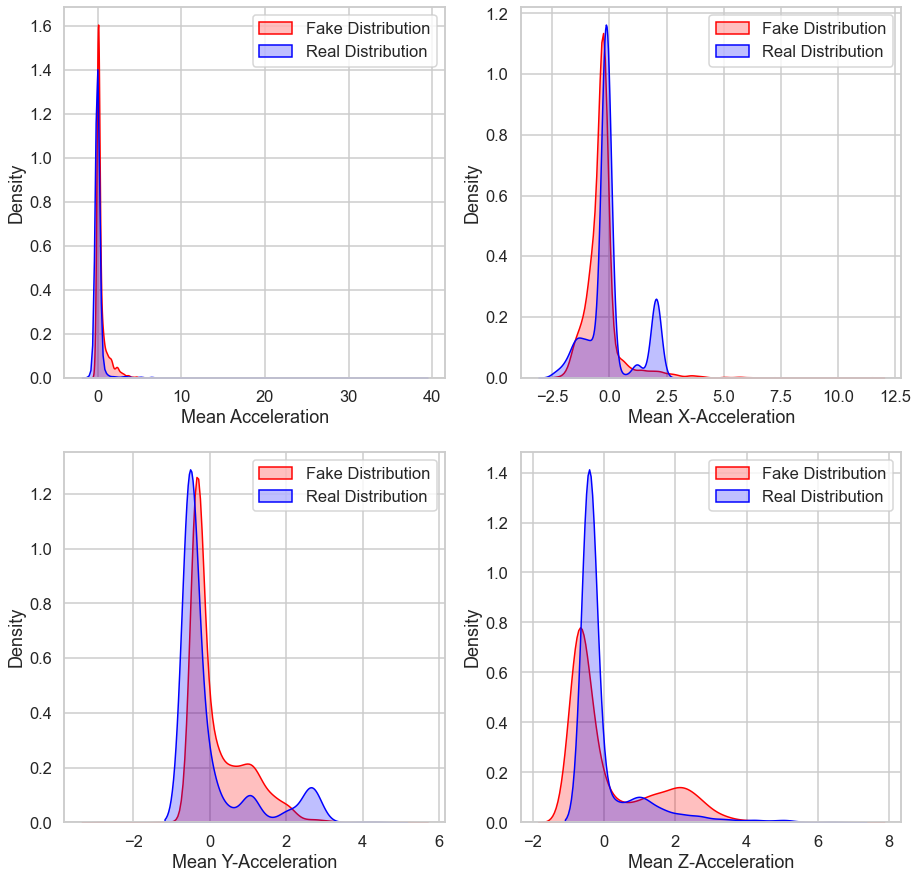

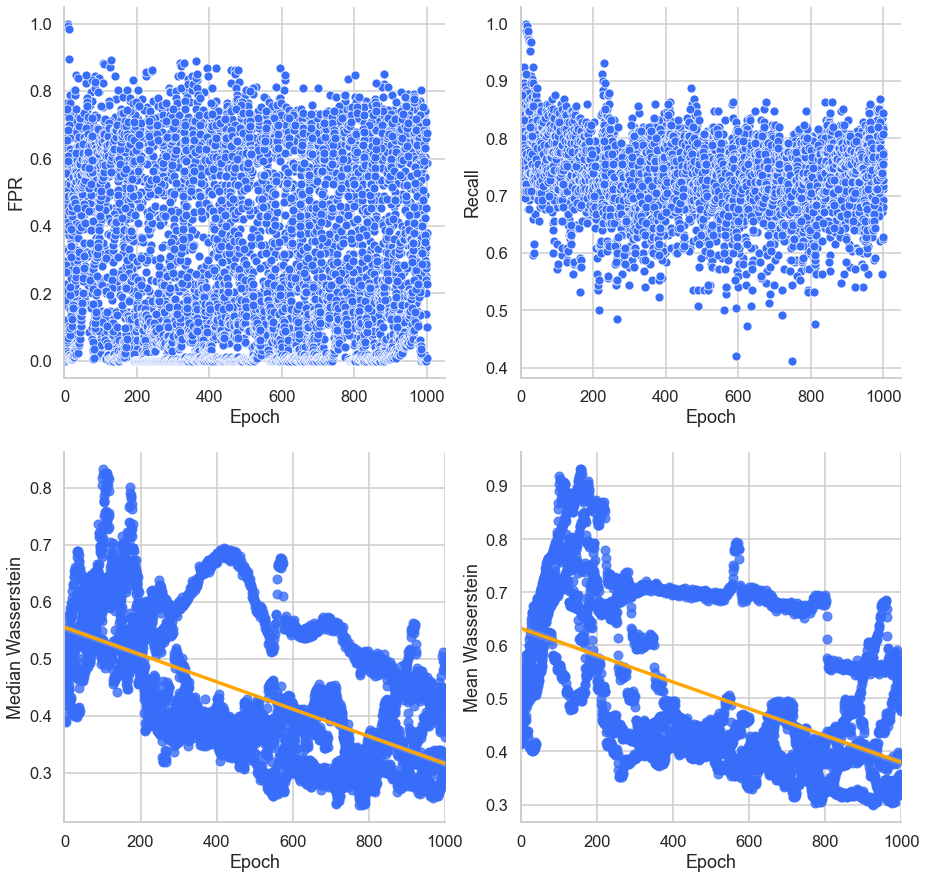

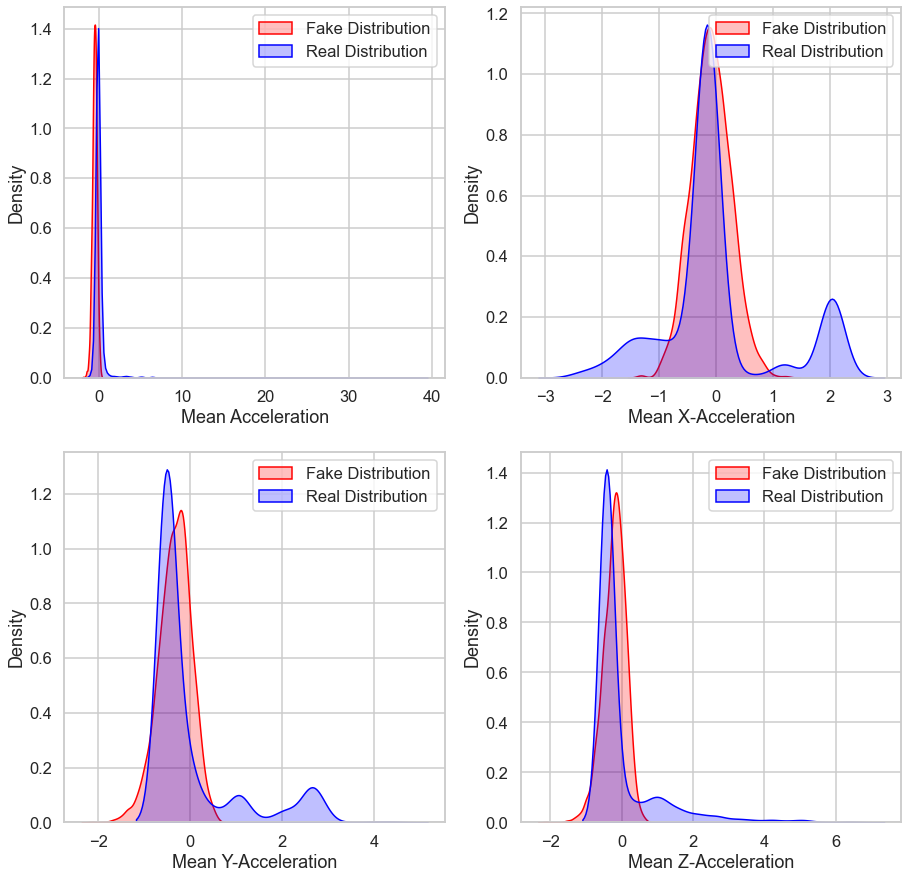

Epoch [1/1000] Training: DISC | Loss D: 0.38519, Loss G: 4.30109 | Acc: 0.85000 | fpR: 0.14400 | P: 0.85425 | R: 0.84400 | F1: 0.84859 | Median W: 0.44694 | Mean W: 0.48039

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.38519, Loss G: 2.89847 | Acc: 0.82800 | fpR: 0.18000 | P: 0.82283 | R: 0.83600 | F1: 0.82887 | Median W: 0.44014 | Mean W: 0.47601
Epoch [3/1000] Training: GEN | Loss D: 0.38519, Loss G: 1.99224 | Acc: 0.75200 | fpR: 0.28400 | P: 0.73507 | R: 0.78800 | F1: 0.76012 | Median W: 0.44374 | Mean W: 0.48106
Epoch [4/1000] Training: GEN | Loss D: 0.38519, Loss G: 1.26543 | Acc: 0.66000 | fpR: 0.43200 | P: 0.63514 | R: 0.75200 | F1: 0.68815 | Median W: 0.44829 | Mean W: 0.49139
Epoch [5/1000] Training: GEN | Loss D: 0.38519, Loss G: 1.01505 | Acc: 0.68600 | fpR: 0.48800 | P: 0.63798 | R: 0.86000 | F1: 0.73205 | Median W: 0.45568 | Mean W: 0.49754
Epoch [6/1000] Training: GEN | Loss D: 0.38519, Loss G: 0.87863 | Acc: 0.63800 | fpR: 0.54

Epoch [48/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.75418 | Acc: 0.64400 | fpR: 0.48000 | P: 0.61538 | R: 0.76800 | F1: 0.68278 | Median W: 0.62092 | Mean W: 0.64011
Epoch [49/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.76423 | Acc: 0.65000 | fpR: 0.47200 | P: 0.62058 | R: 0.77200 | F1: 0.68756 | Median W: 0.61629 | Mean W: 0.63933
Epoch [50/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.74729 | Acc: 0.67400 | fpR: 0.42000 | P: 0.64646 | R: 0.76800 | F1: 0.70152 | Median W: 0.61737 | Mean W: 0.63530
Epoch [51/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.75234 | Acc: 0.68200 | fpR: 0.48000 | P: 0.63746 | R: 0.84400 | F1: 0.72584 | Median W: 0.60870 | Mean W: 0.63963
Epoch [52/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.74432 | Acc: 0.65400 | fpR: 0.50400 | P: 0.61702 | R: 0.81200 | F1: 0.70072 | Median W: 0.60581 | Mean W: 0.64460
Epoch [53/1000] Training: GEN | Loss D: 0.45007, Loss G: 0.73608 | Acc: 0.63200 | fpR: 0.54400 | P: 0.59763 | R: 0.80800 | F1: 0.68659 

Epoch [142/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.96122 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.84478 | Median W: 0.51436 | Mean W: 0.58738
Epoch [143/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.94313 | Acc: 0.84600 | fpR: 0.01200 | P: 0.98324 | R: 0.70400 | F1: 0.82003 | Median W: 0.50736 | Mean W: 0.58029
Epoch [144/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.90939 | Acc: 0.87800 | fpR: 0.00400 | P: 0.99476 | R: 0.76000 | F1: 0.86119 | Median W: 0.52058 | Mean W: 0.59615
Epoch [145/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.89320 | Acc: 0.85400 | fpR: 0.00400 | P: 0.99441 | R: 0.71200 | F1: 0.82935 | Median W: 0.53203 | Mean W: 0.60593
Epoch [146/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.87287 | Acc: 0.87200 | fpR: 0.00400 | P: 0.99468 | R: 0.74800 | F1: 0.85339 | Median W: 0.53076 | Mean W: 0.61150
Epoch [147/1000] Training: GEN | Loss D: 0.22878, Loss G: 0.85975 | Acc: 0.86200 | fpR: 0.02400 | P: 0.96891 | R: 0.74800 | F1: 0.

Epoch [236/1000] Training: DISC | Loss D: 0.39500, Loss G: 0.47609 | Acc: 0.81600 | fpR: 0.01200 | P: 0.98171 | R: 0.64400 | F1: 0.77730 | Median W: 0.39647 | Mean W: 0.48248
Epoch [237/1000] Training: DISC | Loss D: 0.36590, Loss G: 0.47609 | Acc: 0.82200 | fpR: 0.02800 | P: 0.96000 | R: 0.67200 | F1: 0.79010 | Median W: 0.40655 | Mean W: 0.49468
Epoch [238/1000] Training: DISC | Loss D: 0.37058, Loss G: 0.47609 | Acc: 0.84600 | fpR: 0.01600 | P: 0.97790 | R: 0.70800 | F1: 0.82086 | Median W: 0.40538 | Mean W: 0.49008
Epoch [239/1000] Training: DISC | Loss D: 0.39041, Loss G: 0.47609 | Acc: 0.84200 | fpR: 0.01600 | P: 0.97765 | R: 0.70000 | F1: 0.81536 | Median W: 0.41262 | Mean W: 0.48929
Epoch [240/1000] Training: DISC | Loss D: 0.35016, Loss G: 0.47609 | Acc: 0.82400 | fpR: 0.00800 | P: 0.98795 | R: 0.65600 | F1: 0.78798 | Median W: 0.40810 | Mean W: 0.48831
Epoch [241/1000] Training: DISC | Loss D: 0.36083, Loss G: 0.47609 | Acc: 0.83600 | fpR: 0.00800 | P: 0.98837 | R: 0.68000 | 

Epoch [283/1000] Training: DISC | Loss D: 0.34876, Loss G: 0.42166 | Acc: 0.81000 | fpR: 0.01600 | P: 0.97546 | R: 0.63600 | F1: 0.76950 | Median W: 0.41669 | Mean W: 0.45239
Epoch [284/1000] Training: DISC | Loss D: 0.37741, Loss G: 0.42166 | Acc: 0.82400 | fpR: 0.03200 | P: 0.95506 | R: 0.68000 | F1: 0.79391 | Median W: 0.41948 | Mean W: 0.46157
Epoch [285/1000] Training: DISC | Loss D: 0.32514, Loss G: 0.42166 | Acc: 0.83200 | fpR: 0.03200 | P: 0.95604 | R: 0.69600 | F1: 0.80507 | Median W: 0.41839 | Mean W: 0.46257
Epoch [286/1000] Training: DISC | Loss D: 0.33239, Loss G: 0.42166 | Acc: 0.84400 | fpR: 0.01200 | P: 0.98315 | R: 0.70000 | F1: 0.81727 | Median W: 0.41831 | Mean W: 0.45497
Epoch [287/1000] Training: DISC | Loss D: 0.30935, Loss G: 0.42166 | Acc: 0.84200 | fpR: 0.03200 | P: 0.95722 | R: 0.71600 | F1: 0.81873 | Median W: 0.41768 | Mean W: 0.45549
Epoch [288/1000] Training: DISC | Loss D: 0.31928, Loss G: 0.42166 | Acc: 0.84600 | fpR: 0.02000 | P: 0.97268 | R: 0.71200 | 

Epoch [330/1000] Training: DISC | Loss D: 0.33248, Loss G: 0.53672 | Acc: 0.83400 | fpR: 0.07600 | P: 0.90732 | R: 0.74400 | F1: 0.81709 | Median W: 0.33763 | Mean W: 0.40675
Epoch [331/1000] Training: DISC | Loss D: 0.30818, Loss G: 0.53672 | Acc: 0.83000 | fpR: 0.04000 | P: 0.94595 | R: 0.70000 | F1: 0.80411 | Median W: 0.34863 | Mean W: 0.41500
Epoch [332/1000] Training: DISC | Loss D: 0.32328, Loss G: 0.53672 | Acc: 0.83400 | fpR: 0.04800 | P: 0.93717 | R: 0.71600 | F1: 0.81130 | Median W: 0.34799 | Mean W: 0.41697
Epoch [333/1000] Training: DISC | Loss D: 0.30612, Loss G: 0.53672 | Acc: 0.86000 | fpR: 0.01600 | P: 0.97872 | R: 0.73600 | F1: 0.83969 | Median W: 0.34565 | Mean W: 0.41700
Epoch [334/1000] Training: DISC | Loss D: 0.31813, Loss G: 0.53672 | Acc: 0.85600 | fpR: 0.02000 | P: 0.97340 | R: 0.73200 | F1: 0.83513 | Median W: 0.34548 | Mean W: 0.41426
Epoch [335/1000] Training: DISC | Loss D: 0.29899, Loss G: 0.53672 | Acc: 0.87400 | fpR: 0.02000 | P: 0.97462 | R: 0.76800 | 

Epoch [377/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.74250 | Acc: 0.63000 | fpR: 0.46000 | P: 0.61017 | R: 0.72000 | F1: 0.66005 | Median W: 0.33824 | Mean W: 0.39853
Epoch [378/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.69120 | Acc: 0.57400 | fpR: 0.58400 | P: 0.55623 | R: 0.73200 | F1: 0.63163 | Median W: 0.33930 | Mean W: 0.39886
Epoch [379/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.66800 | Acc: 0.55800 | fpR: 0.58800 | P: 0.54489 | R: 0.70400 | F1: 0.61382 | Median W: 0.35158 | Mean W: 0.40217
Epoch [380/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.67851 | Acc: 0.56200 | fpR: 0.61600 | P: 0.54572 | R: 0.74000 | F1: 0.62770 | Median W: 0.33789 | Mean W: 0.40239
Epoch [381/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.63388 | Acc: 0.56600 | fpR: 0.59600 | P: 0.54985 | R: 0.72800 | F1: 0.62602 | Median W: 0.32859 | Mean W: 0.39812
Epoch [382/1000] Training: GEN | Loss D: 0.31769, Loss G: 0.60661 | Acc: 0.53400 | fpR: 0.68000 | P: 0.52381 | R: 0.74800 | F1: 0.

Epoch [424/1000] Training: GEN | Loss D: 0.29149, Loss G: 0.45788 | Acc: 0.49000 | fpR: 0.76800 | P: 0.49340 | R: 0.74800 | F1: 0.59412 | Median W: 0.31965 | Mean W: 0.38226

Push Generator

Epoch [425/1000] Training: DISC | Loss D: 0.81582, Loss G: 0.45788 | Acc: 0.45400 | fpR: 0.75200 | P: 0.46742 | R: 0.66000 | F1: 0.54678 | Median W: 0.30720 | Mean W: 0.37683
Epoch [426/1000] Training: DISC | Loss D: 0.75498, Loss G: 0.45788 | Acc: 0.51200 | fpR: 0.68000 | P: 0.50867 | R: 0.70400 | F1: 0.59012 | Median W: 0.32377 | Mean W: 0.38853
Epoch [427/1000] Training: DISC | Loss D: 0.66190, Loss G: 0.45788 | Acc: 0.57800 | fpR: 0.51600 | P: 0.56566 | R: 0.67200 | F1: 0.61376 | Median W: 0.32524 | Mean W: 0.38456
Epoch [428/1000] Training: DISC | Loss D: 0.45475, Loss G: 0.45788 | Acc: 0.78600 | fpR: 0.09200 | P: 0.87831 | R: 0.66400 | F1: 0.75577 | Median W: 0.30885 | Mean W: 0.37859
Epoch [429/1000] Training: DISC | Loss D: 0.44909, Loss G: 0.45788 | Acc: 0.80400 | fpR: 0.05600 | P: 0.92222

Epoch [471/1000] Training: DISC | Loss D: 0.79217, Loss G: 0.49882 | Acc: 0.54600 | fpR: 0.65200 | P: 0.53295 | R: 0.74400 | F1: 0.62055 | Median W: 0.34657 | Mean W: 0.43087
Epoch [472/1000] Training: DISC | Loss D: 0.73865, Loss G: 0.49882 | Acc: 0.55600 | fpR: 0.59200 | P: 0.54321 | R: 0.70400 | F1: 0.61275 | Median W: 0.35017 | Mean W: 0.43308
Epoch [473/1000] Training: DISC | Loss D: 0.62297, Loss G: 0.49882 | Acc: 0.62400 | fpR: 0.45600 | P: 0.60690 | R: 0.70400 | F1: 0.65135 | Median W: 0.35513 | Mean W: 0.43248
Epoch [474/1000] Training: DISC | Loss D: 0.53699, Loss G: 0.49882 | Acc: 0.76600 | fpR: 0.14800 | P: 0.82126 | R: 0.68000 | F1: 0.74349 | Median W: 0.36062 | Mean W: 0.43695
Epoch [475/1000] Training: DISC | Loss D: 0.46516, Loss G: 0.49882 | Acc: 0.75200 | fpR: 0.06400 | P: 0.89873 | R: 0.56800 | F1: 0.69560 | Median W: 0.34464 | Mean W: 0.43123
Epoch [476/1000] Training: DISC | Loss D: 0.43082, Loss G: 0.49882 | Acc: 0.78600 | fpR: 0.04000 | P: 0.93865 | R: 0.61200 | 

Epoch [518/1000] Training: GEN | Loss D: 0.34237, Loss G: 0.54154 | Acc: 0.53400 | fpR: 0.68400 | P: 0.52368 | R: 0.75200 | F1: 0.61692 | Median W: 0.34798 | Mean W: 0.45842
Epoch [519/1000] Training: GEN | Loss D: 0.34237, Loss G: 0.55354 | Acc: 0.52800 | fpR: 0.74400 | P: 0.51813 | R: 0.80000 | F1: 0.62845 | Median W: 0.35212 | Mean W: 0.45390

Push Generator

Epoch [520/1000] Training: DISC | Loss D: 0.75620, Loss G: 0.55354 | Acc: 0.56000 | fpR: 0.66400 | P: 0.54144 | R: 0.78400 | F1: 0.64004 | Median W: 0.35567 | Mean W: 0.45716
Epoch [521/1000] Training: DISC | Loss D: 0.69178, Loss G: 0.55354 | Acc: 0.59400 | fpR: 0.56800 | P: 0.57100 | R: 0.75600 | F1: 0.65011 | Median W: 0.34747 | Mean W: 0.45817
Epoch [522/1000] Training: DISC | Loss D: 0.65416, Loss G: 0.55354 | Acc: 0.59000 | fpR: 0.58000 | P: 0.56716 | R: 0.76000 | F1: 0.64908 | Median W: 0.33943 | Mean W: 0.44748
Epoch [523/1000] Training: DISC | Loss D: 0.56295, Loss G: 0.55354 | Acc: 0.71000 | fpR: 0.27200 | P: 0.71784 

Epoch [565/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.67576 | Acc: 0.58000 | fpR: 0.58800 | P: 0.55988 | R: 0.74800 | F1: 0.63992 | Median W: 0.28505 | Mean W: 0.40290
Epoch [566/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.64830 | Acc: 0.55000 | fpR: 0.66000 | P: 0.53521 | R: 0.76000 | F1: 0.62761 | Median W: 0.30571 | Mean W: 0.41854
Epoch [567/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.65512 | Acc: 0.53600 | fpR: 0.68800 | P: 0.52486 | R: 0.76000 | F1: 0.62043 | Median W: 0.30008 | Mean W: 0.41554
Epoch [568/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.59450 | Acc: 0.56400 | fpR: 0.65600 | P: 0.54444 | R: 0.78400 | F1: 0.64214 | Median W: 0.31292 | Mean W: 0.42153
Epoch [569/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.58661 | Acc: 0.55600 | fpR: 0.65200 | P: 0.53955 | R: 0.76400 | F1: 0.63197 | Median W: 0.29777 | Mean W: 0.41050
Epoch [570/1000] Training: GEN | Loss D: 0.37179, Loss G: 0.56758 | Acc: 0.55400 | fpR: 0.64400 | P: 0.53868 | R: 0.75200 | F1: 0.

Epoch [612/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.70512 | Acc: 0.61600 | fpR: 0.49200 | P: 0.59539 | R: 0.72400 | F1: 0.65293 | Median W: 0.25865 | Mean W: 0.34727
Epoch [613/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.68211 | Acc: 0.60600 | fpR: 0.54000 | P: 0.58204 | R: 0.75200 | F1: 0.65570 | Median W: 0.26113 | Mean W: 0.35140
Epoch [614/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.67230 | Acc: 0.58600 | fpR: 0.60000 | P: 0.56268 | R: 0.77200 | F1: 0.65044 | Median W: 0.25969 | Mean W: 0.35055
Epoch [615/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.63252 | Acc: 0.54400 | fpR: 0.62800 | P: 0.53274 | R: 0.71600 | F1: 0.61043 | Median W: 0.26447 | Mean W: 0.34109
Epoch [616/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.61310 | Acc: 0.59000 | fpR: 0.58400 | P: 0.56677 | R: 0.76400 | F1: 0.65028 | Median W: 0.26504 | Mean W: 0.34592
Epoch [617/1000] Training: GEN | Loss D: 0.41428, Loss G: 0.59083 | Acc: 0.49200 | fpR: 0.77200 | P: 0.49476 | R: 0.75600 | F1: 0.

Epoch [659/1000] Training: GEN | Loss D: 0.46252, Loss G: 1.00759 | Acc: 0.71200 | fpR: 0.26000 | P: 0.72458 | R: 0.68400 | F1: 0.70320 | Median W: 0.30974 | Mean W: 0.37051
Epoch [660/1000] Training: GEN | Loss D: 0.46252, Loss G: 0.82510 | Acc: 0.68600 | fpR: 0.32400 | P: 0.68235 | R: 0.69600 | F1: 0.68861 | Median W: 0.30955 | Mean W: 0.37980
Epoch [661/1000] Training: GEN | Loss D: 0.46252, Loss G: 0.78583 | Acc: 0.62400 | fpR: 0.46800 | P: 0.60473 | R: 0.71600 | F1: 0.65518 | Median W: 0.29876 | Mean W: 0.37560
Epoch [662/1000] Training: GEN | Loss D: 0.46252, Loss G: 0.70876 | Acc: 0.61600 | fpR: 0.50800 | P: 0.59295 | R: 0.74000 | F1: 0.65787 | Median W: 0.31191 | Mean W: 0.39276
Epoch [663/1000] Training: GEN | Loss D: 0.46252, Loss G: 0.62722 | Acc: 0.57800 | fpR: 0.54000 | P: 0.56311 | R: 0.69600 | F1: 0.62205 | Median W: 0.29298 | Mean W: 0.39051
Epoch [664/1000] Training: GEN | Loss D: 0.46252, Loss G: 0.65696 | Acc: 0.54600 | fpR: 0.62800 | P: 0.53412 | R: 0.72000 | F1: 0.

Epoch [706/1000] Training: DISC | Loss D: 0.46523, Loss G: 0.51264 | Acc: 0.80200 | fpR: 0.06400 | P: 0.91257 | R: 0.66800 | F1: 0.77087 | Median W: 0.33228 | Mean W: 0.43069
Epoch [707/1000] Training: DISC | Loss D: 0.42101, Loss G: 0.51264 | Acc: 0.81000 | fpR: 0.04000 | P: 0.94286 | R: 0.66000 | F1: 0.77599 | Median W: 0.35011 | Mean W: 0.42988
Epoch [708/1000] Training: DISC | Loss D: 0.44626, Loss G: 0.51264 | Acc: 0.82000 | fpR: 0.04000 | P: 0.94444 | R: 0.68000 | F1: 0.79021 | Median W: 0.34977 | Mean W: 0.42859
Epoch [709/1000] Training: DISC | Loss D: 0.38541, Loss G: 0.51264 | Acc: 0.83400 | fpR: 0.04400 | P: 0.94180 | R: 0.71200 | F1: 0.81044 | Median W: 0.33470 | Mean W: 0.42039
Epoch [710/1000] Training: DISC | Loss D: 0.38242, Loss G: 0.51264 | Acc: 0.83000 | fpR: 0.02800 | P: 0.96089 | R: 0.68800 | F1: 0.80138 | Median W: 0.35919 | Mean W: 0.42951
Epoch [711/1000] Training: DISC | Loss D: 0.37015, Loss G: 0.51264 | Acc: 0.87800 | fpR: 0.02800 | P: 0.96552 | R: 0.78400 | 

Epoch [753/1000] Training: DISC | Loss D: 0.31108, Loss G: 0.50955 | Acc: 0.85400 | fpR: 0.02800 | P: 0.96335 | R: 0.73600 | F1: 0.83398 | Median W: 0.34729 | Mean W: 0.42411
Epoch [754/1000] Training: DISC | Loss D: 0.30532, Loss G: 0.50955 | Acc: 0.86000 | fpR: 0.03200 | P: 0.95918 | R: 0.75200 | F1: 0.84256 | Median W: 0.36199 | Mean W: 0.43848

Pull Generator

Epoch [755/1000] Training: GEN | Loss D: 0.30532, Loss G: 2.20370 | Acc: 0.82600 | fpR: 0.08400 | P: 0.89756 | R: 0.73600 | F1: 0.80830 | Median W: 0.38001 | Mean W: 0.44125
Epoch [756/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.85353 | Acc: 0.73000 | fpR: 0.29600 | P: 0.71863 | R: 0.75600 | F1: 0.73634 | Median W: 0.36595 | Mean W: 0.41990
Epoch [757/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.86351 | Acc: 0.72200 | fpR: 0.27200 | P: 0.72470 | R: 0.71600 | F1: 0.71982 | Median W: 0.36372 | Mean W: 0.42029
Epoch [758/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.86696 | Acc: 0.75000 | fpR: 0.26000 | P: 0.74510 | 

Epoch [800/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.34786 | Acc: 0.57000 | fpR: 0.64400 | P: 0.54902 | R: 0.78400 | F1: 0.64531 | Median W: 0.38792 | Mean W: 0.43491
Epoch [801/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.34939 | Acc: 0.49200 | fpR: 0.67200 | P: 0.49398 | R: 0.65600 | F1: 0.56308 | Median W: 0.39685 | Mean W: 0.43012
Epoch [802/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.34762 | Acc: 0.53800 | fpR: 0.67200 | P: 0.52676 | R: 0.74800 | F1: 0.61770 | Median W: 0.38135 | Mean W: 0.42922
Epoch [803/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.35483 | Acc: 0.57200 | fpR: 0.65600 | P: 0.54945 | R: 0.80000 | F1: 0.65098 | Median W: 0.40300 | Mean W: 0.43999
Epoch [804/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.35064 | Acc: 0.56000 | fpR: 0.61600 | P: 0.54438 | R: 0.73600 | F1: 0.62536 | Median W: 0.39403 | Mean W: 0.44217
Epoch [805/1000] Training: GEN | Loss D: 0.30532, Loss G: 0.35577 | Acc: 0.54000 | fpR: 0.69200 | P: 0.52732 | R: 0.77200 | F1: 0.

Epoch [847/1000] Training: DISC | Loss D: 0.35480, Loss G: 0.46681 | Acc: 0.84800 | fpR: 0.03600 | P: 0.95312 | R: 0.73200 | F1: 0.82756 | Median W: 0.39346 | Mean W: 0.41222
Epoch [848/1000] Training: DISC | Loss D: 0.37374, Loss G: 0.46681 | Acc: 0.83800 | fpR: 0.02400 | P: 0.96685 | R: 0.70000 | F1: 0.81158 | Median W: 0.39875 | Mean W: 0.41040
Epoch [849/1000] Training: DISC | Loss D: 0.35354, Loss G: 0.46681 | Acc: 0.83600 | fpR: 0.02400 | P: 0.96667 | R: 0.69600 | F1: 0.80882 | Median W: 0.39347 | Mean W: 0.40663
Epoch [850/1000] Training: DISC | Loss D: 0.33009, Loss G: 0.46681 | Acc: 0.88000 | fpR: 0.01600 | P: 0.97980 | R: 0.77600 | F1: 0.86558 | Median W: 0.39221 | Mean W: 0.40398

Pull Generator

Epoch [851/1000] Training: GEN | Loss D: 0.33009, Loss G: 1.73056 | Acc: 0.83600 | fpR: 0.07600 | P: 0.90777 | R: 0.74800 | F1: 0.81968 | Median W: 0.40215 | Mean W: 0.41682
Epoch [852/1000] Training: GEN | Loss D: 0.33009, Loss G: 0.73929 | Acc: 0.63000 | fpR: 0.45200 | P: 0.61168 

Epoch [894/1000] Training: GEN | Loss D: 0.32028, Loss G: 2.47064 | Acc: 0.80400 | fpR: 0.10800 | P: 0.86893 | R: 0.71600 | F1: 0.78459 | Median W: 0.34195 | Mean W: 0.39495
Epoch [895/1000] Training: GEN | Loss D: 0.32028, Loss G: 0.85766 | Acc: 0.76400 | fpR: 0.19200 | P: 0.78947 | R: 0.72000 | F1: 0.75264 | Median W: 0.33023 | Mean W: 0.37686
Epoch [896/1000] Training: GEN | Loss D: 0.32028, Loss G: 0.89473 | Acc: 0.77400 | fpR: 0.17600 | P: 0.80444 | R: 0.72400 | F1: 0.76161 | Median W: 0.34490 | Mean W: 0.38846
Epoch [897/1000] Training: GEN | Loss D: 0.32028, Loss G: 0.92559 | Acc: 0.78000 | fpR: 0.16000 | P: 0.81818 | R: 0.72000 | F1: 0.76546 | Median W: 0.37628 | Mean W: 0.39717
Epoch [898/1000] Training: GEN | Loss D: 0.32028, Loss G: 0.86647 | Acc: 0.79800 | fpR: 0.16800 | P: 0.81974 | R: 0.76400 | F1: 0.79039 | Median W: 0.39056 | Mean W: 0.40482
Epoch [899/1000] Training: GEN | Loss D: 0.32028, Loss G: 0.85080 | Acc: 0.79200 | fpR: 0.14400 | P: 0.83486 | R: 0.72800 | F1: 0.

Epoch [941/1000] Training: DISC | Loss D: 0.44287, Loss G: 0.43271 | Acc: 0.81200 | fpR: 0.06000 | P: 0.91935 | R: 0.68400 | F1: 0.78391 | Median W: 0.38940 | Mean W: 0.46227
Epoch [942/1000] Training: DISC | Loss D: 0.43957, Loss G: 0.43271 | Acc: 0.79800 | fpR: 0.06400 | P: 0.91160 | R: 0.66000 | F1: 0.76517 | Median W: 0.38715 | Mean W: 0.46012
Epoch [943/1000] Training: DISC | Loss D: 0.46962, Loss G: 0.43271 | Acc: 0.80400 | fpR: 0.03600 | P: 0.94706 | R: 0.64400 | F1: 0.76619 | Median W: 0.39968 | Mean W: 0.46318
Epoch [944/1000] Training: DISC | Loss D: 0.42578, Loss G: 0.43271 | Acc: 0.79200 | fpR: 0.03200 | P: 0.95062 | R: 0.61600 | F1: 0.74710 | Median W: 0.40403 | Mean W: 0.46555
Epoch [945/1000] Training: DISC | Loss D: 0.44015, Loss G: 0.43271 | Acc: 0.81200 | fpR: 0.02800 | P: 0.95882 | R: 0.65200 | F1: 0.77571 | Median W: 0.39305 | Mean W: 0.46562
Epoch [946/1000] Training: DISC | Loss D: 0.40038, Loss G: 0.43271 | Acc: 0.83600 | fpR: 0.03600 | P: 0.95161 | R: 0.70800 | 

Epoch [988/1000] Training: DISC | Loss D: 0.39050, Loss G: 0.48101 | Acc: 0.82000 | fpR: 0.03200 | P: 0.95455 | R: 0.67200 | F1: 0.78825 | Median W: 0.38002 | Mean W: 0.47767
Epoch [989/1000] Training: DISC | Loss D: 0.38862, Loss G: 0.48101 | Acc: 0.81000 | fpR: 0.02800 | P: 0.95858 | R: 0.64800 | F1: 0.77279 | Median W: 0.39287 | Mean W: 0.48388
Epoch [990/1000] Training: DISC | Loss D: 0.33949, Loss G: 0.48101 | Acc: 0.85400 | fpR: 0.01600 | P: 0.97838 | R: 0.72400 | F1: 0.83170 | Median W: 0.38277 | Mean W: 0.47943
Epoch [991/1000] Training: DISC | Loss D: 0.41966, Loss G: 0.48101 | Acc: 0.79600 | fpR: 0.02000 | P: 0.96835 | R: 0.61200 | F1: 0.74953 | Median W: 0.38313 | Mean W: 0.47163
Epoch [992/1000] Training: DISC | Loss D: 0.37778, Loss G: 0.48101 | Acc: 0.81800 | fpR: 0.02000 | P: 0.97041 | R: 0.65600 | F1: 0.78234 | Median W: 0.38244 | Mean W: 0.46928
Epoch [993/1000] Training: DISC | Loss D: 0.37304, Loss G: 0.48101 | Acc: 0.83200 | fpR: 0.00400 | P: 0.99405 | R: 0.66800 | 

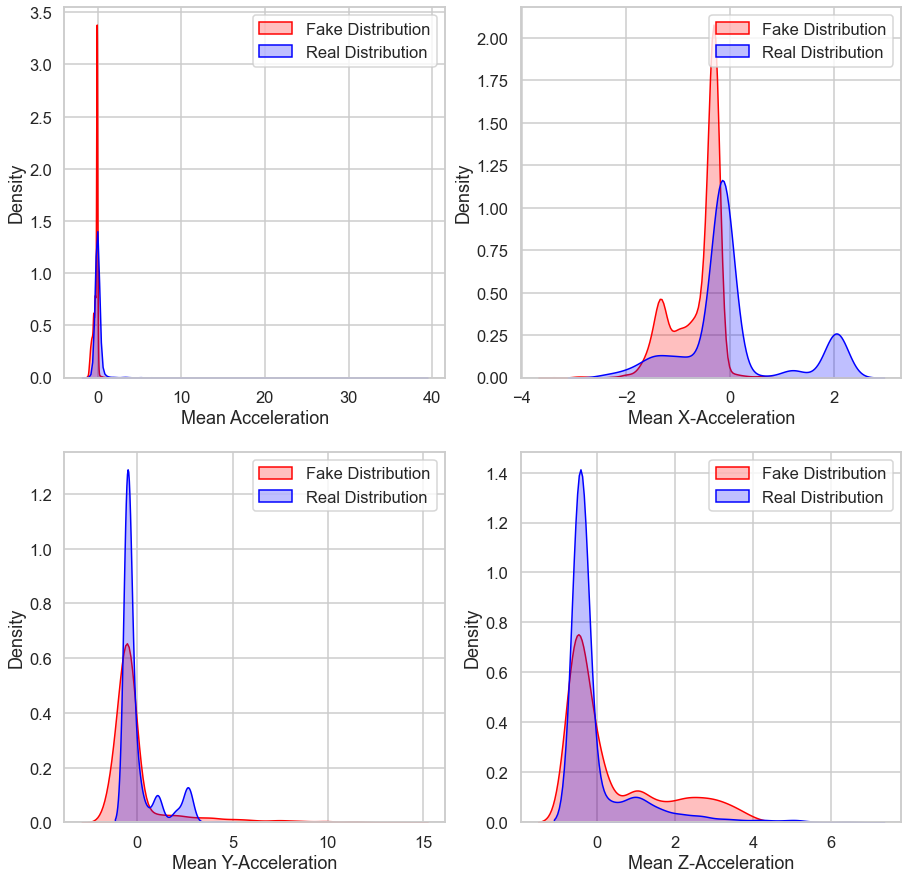

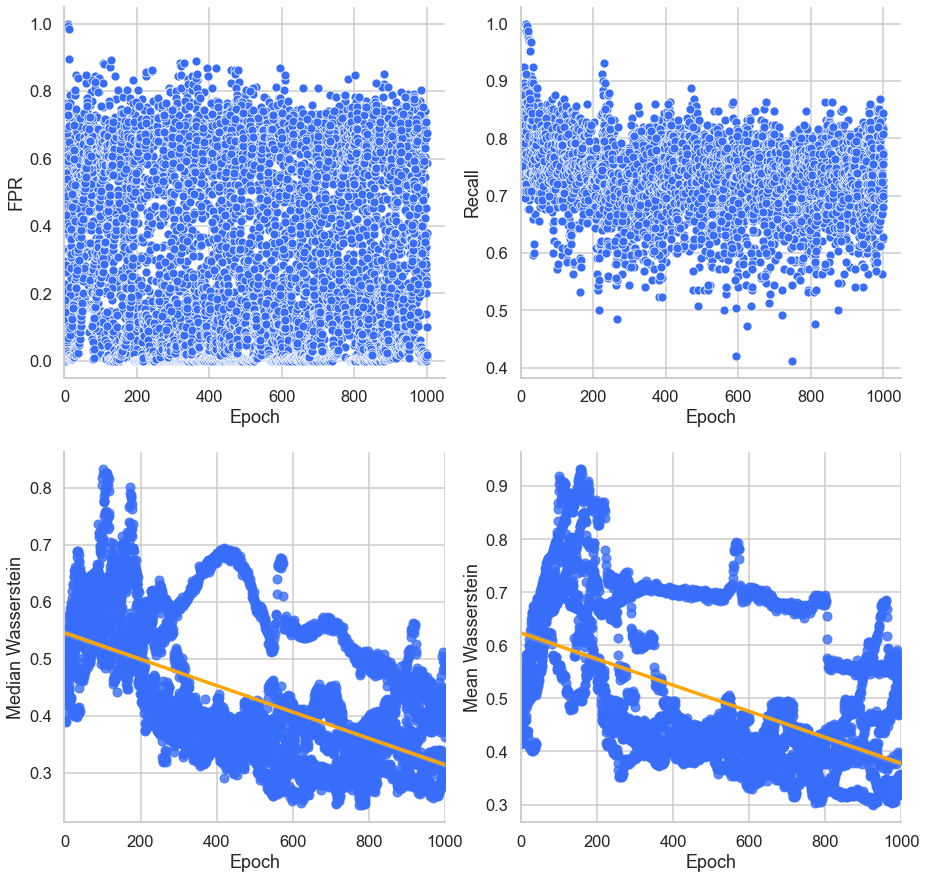

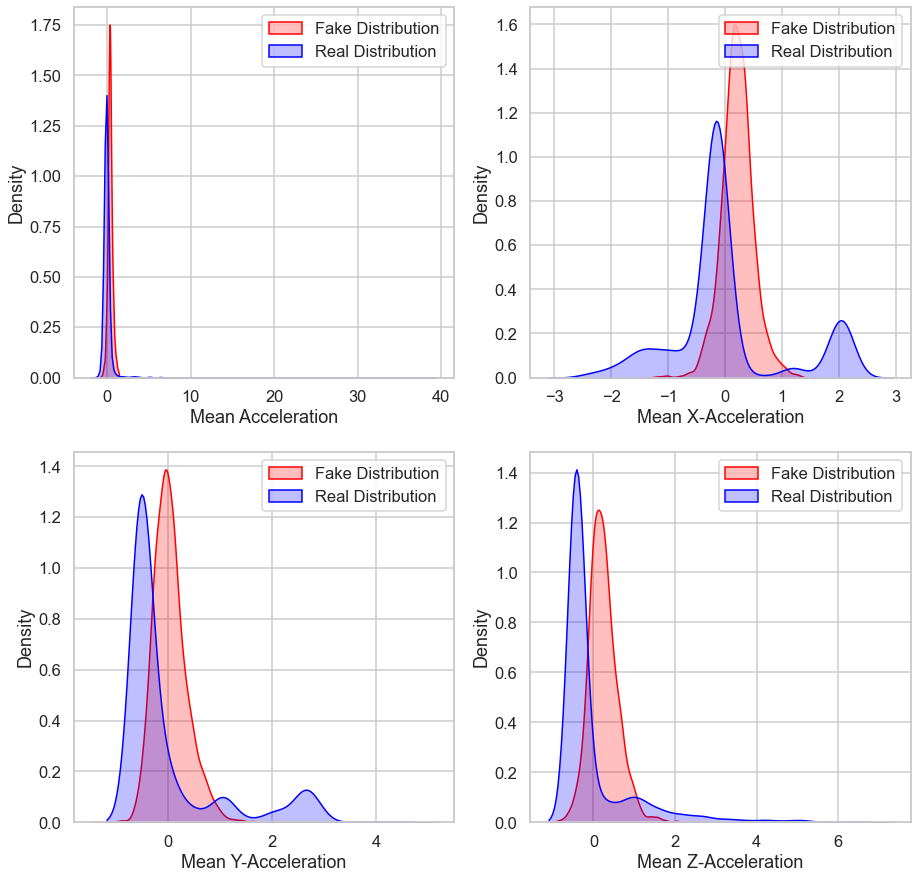

Epoch [1/1000] Training: DISC | Loss D: 0.32369, Loss G: 3.25532 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.47091 | Mean W: 0.47244

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.28331, Loss G: 3.25532 | Acc: 0.84400 | fpR: 0.00400 | P: 0.99425 | R: 0.69200 | F1: 0.81555 | Median W: 0.47167 | Mean W: 0.47542
Epoch [3/1000] Training: DISC | Loss D: 0.27256, Loss G: 3.25532 | Acc: 0.85400 | fpR: 0.00800 | P: 0.98895 | R: 0.71600 | F1: 0.83014 | Median W: 0.47291 | Mean W: 0.47511
Epoch [4/1000] Training: DISC | Loss D: 0.27376, Loss G: 3.25532 | Acc: 0.84400 | fpR: 0.00000 | P: 1.00000 | R: 0.68800 | F1: 0.81468 | Median W: 0.47296 | Mean W: 0.47615
Epoch [5/1000] Training: DISC | Loss D: 0.22639, Loss G: 3.25532 | Acc: 0.87400 | fpR: 0.00400 | P: 0.99471 | R: 0.75200 | F1: 0.85600 | Median W: 0.47369 | Mean W: 0.47322

Pull Generator

Epoch [6/1000] Training: GEN | Loss D: 0.22639, Loss G: 2.86419 | Acc: 0.88400 | fpR: 

Epoch [95/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.88119 | Acc: 0.84600 | fpR: 0.00800 | P: 0.98870 | R: 0.70000 | F1: 0.81919 | Median W: 0.63504 | Mean W: 0.85588
Epoch [96/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.87751 | Acc: 0.83200 | fpR: 0.02000 | P: 0.97159 | R: 0.68400 | F1: 0.80233 | Median W: 0.62889 | Mean W: 0.85468
Epoch [97/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.89069 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.84478 | Median W: 0.63009 | Mean W: 0.85901
Epoch [98/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.88298 | Acc: 0.82600 | fpR: 0.02400 | P: 0.96571 | R: 0.67600 | F1: 0.79481 | Median W: 0.63949 | Mean W: 0.86000
Epoch [99/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.87084 | Acc: 0.86000 | fpR: 0.01200 | P: 0.98387 | R: 0.73200 | F1: 0.83896 | Median W: 0.64610 | Mean W: 0.86081
Epoch [100/1000] Training: GEN | Loss D: 0.26124, Loss G: 0.87546 | Acc: 0.83800 | fpR: 0.01200 | P: 0.98286 | R: 0.68800 | F1: 0.80893

Epoch [189/1000] Training: DISC | Loss D: 0.34603, Loss G: 0.31748 | Acc: 0.84200 | fpR: 0.02800 | P: 0.96216 | R: 0.71200 | F1: 0.81790 | Median W: 0.54090 | Mean W: 0.92770
Epoch [190/1000] Training: DISC | Loss D: 0.24205, Loss G: 0.31748 | Acc: 0.87200 | fpR: 0.01600 | P: 0.97938 | R: 0.76000 | F1: 0.85536 | Median W: 0.55616 | Mean W: 0.92781

Pull Generator

Epoch [191/1000] Training: GEN | Loss D: 0.24205, Loss G: 6.27631 | Acc: 0.84600 | fpR: 0.02000 | P: 0.97268 | R: 0.71200 | F1: 0.82168 | Median W: 0.53695 | Mean W: 0.91117
Epoch [192/1000] Training: GEN | Loss D: 0.24205, Loss G: 1.84223 | Acc: 0.86600 | fpR: 0.03600 | P: 0.95522 | R: 0.76800 | F1: 0.85095 | Median W: 0.51697 | Mean W: 0.87428
Epoch [193/1000] Training: GEN | Loss D: 0.24205, Loss G: 1.38343 | Acc: 0.82600 | fpR: 0.02400 | P: 0.96571 | R: 0.67600 | F1: 0.79481 | Median W: 0.57935 | Mean W: 0.86414
Epoch [194/1000] Training: GEN | Loss D: 0.24205, Loss G: 1.17160 | Acc: 0.87800 | fpR: 0.00800 | P: 0.98964 | 

Epoch [236/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.89525 | Acc: 0.86800 | fpR: 0.00800 | P: 0.98936 | R: 0.74400 | F1: 0.84883 | Median W: 0.96143 | Mean W: 0.96812
Epoch [237/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.90138 | Acc: 0.85200 | fpR: 0.00800 | P: 0.98889 | R: 0.71200 | F1: 0.82742 | Median W: 0.95913 | Mean W: 0.97036
Epoch [238/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.89332 | Acc: 0.85400 | fpR: 0.00000 | P: 1.00000 | R: 0.70800 | F1: 0.82855 | Median W: 0.96576 | Mean W: 0.97123
Epoch [239/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.88613 | Acc: 0.83200 | fpR: 0.01200 | P: 0.98256 | R: 0.67600 | F1: 0.80047 | Median W: 0.96668 | Mean W: 0.97581
Epoch [240/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.88309 | Acc: 0.86800 | fpR: 0.00800 | P: 0.98936 | R: 0.74400 | F1: 0.84883 | Median W: 0.96555 | Mean W: 0.96729
Epoch [241/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.89049 | Acc: 0.84200 | fpR: 0.02000 | P: 0.97238 | R: 0.70400 | F1: 0.

Epoch [330/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.86575 | Acc: 0.85600 | fpR: 0.02400 | P: 0.96842 | R: 0.73600 | F1: 0.83587 | Median W: 0.87109 | Mean W: 0.96895
Epoch [331/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.85933 | Acc: 0.84400 | fpR: 0.02000 | P: 0.97253 | R: 0.70800 | F1: 0.81896 | Median W: 0.87296 | Mean W: 0.96888
Epoch [332/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.85628 | Acc: 0.84000 | fpR: 0.00800 | P: 0.98851 | R: 0.68800 | F1: 0.81084 | Median W: 0.87662 | Mean W: 0.97077
Epoch [333/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.85922 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.87190 | Mean W: 0.97102
Epoch [334/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.85706 | Acc: 0.85000 | fpR: 0.02000 | P: 0.97297 | R: 0.72000 | F1: 0.82710 | Median W: 0.85584 | Mean W: 0.97267
Epoch [335/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.86092 | Acc: 0.85200 | fpR: 0.00800 | P: 0.98889 | R: 0.71200 | F1: 0.

Epoch [424/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.82820 | Acc: 0.83600 | fpR: 0.02800 | P: 0.96154 | R: 0.70000 | F1: 0.80970 | Median W: 0.85640 | Mean W: 0.99548
Epoch [425/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.84130 | Acc: 0.82200 | fpR: 0.02400 | P: 0.96532 | R: 0.66800 | F1: 0.78911 | Median W: 0.84455 | Mean W: 0.99494
Epoch [426/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.83619 | Acc: 0.84400 | fpR: 0.01600 | P: 0.97778 | R: 0.70400 | F1: 0.81812 | Median W: 0.85915 | Mean W: 0.99349
Epoch [427/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.84458 | Acc: 0.82800 | fpR: 0.04000 | P: 0.94565 | R: 0.69600 | F1: 0.80136 | Median W: 0.84922 | Mean W: 0.99743
Epoch [428/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.84308 | Acc: 0.83800 | fpR: 0.03600 | P: 0.95187 | R: 0.71200 | F1: 0.81416 | Median W: 0.85098 | Mean W: 0.99676
Epoch [429/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.83755 | Acc: 0.85000 | fpR: 0.02800 | P: 0.96296 | R: 0.72800 | F1: 0.

Epoch [518/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.78882 | Acc: 0.82200 | fpR: 0.06000 | P: 0.92147 | R: 0.70400 | F1: 0.79770 | Median W: 0.74536 | Mean W: 1.09652
Epoch [519/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.77565 | Acc: 0.82200 | fpR: 0.06400 | P: 0.91710 | R: 0.70800 | F1: 0.79861 | Median W: 0.75210 | Mean W: 1.10954
Epoch [520/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.79730 | Acc: 0.81400 | fpR: 0.04400 | P: 0.93855 | R: 0.67200 | F1: 0.78273 | Median W: 0.74676 | Mean W: 1.11883
Epoch [521/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.79785 | Acc: 0.83800 | fpR: 0.08000 | P: 0.90431 | R: 0.75600 | F1: 0.82303 | Median W: 0.74547 | Mean W: 1.11530
Epoch [522/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.80408 | Acc: 0.84600 | fpR: 0.05600 | P: 0.93035 | R: 0.74800 | F1: 0.82877 | Median W: 0.74240 | Mean W: 1.12050
Epoch [523/1000] Training: GEN | Loss D: 0.24205, Loss G: 0.80290 | Acc: 0.81800 | fpR: 0.04800 | P: 0.93443 | R: 0.68400 | F1: 0.

Epoch [612/1000] Training: DISC | Loss D: 0.20996, Loss G: 0.31500 | Acc: 0.89600 | fpR: 0.00800 | P: 0.99010 | R: 0.80000 | F1: 0.88446 | Median W: 1.00823 | Mean W: 1.44791

Pull Generator

Epoch [613/1000] Training: GEN | Loss D: 0.20996, Loss G: 4.41676 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.84478 | Median W: 1.01971 | Mean W: 1.40119
Epoch [614/1000] Training: GEN | Loss D: 0.20996, Loss G: 1.73285 | Acc: 0.87400 | fpR: 0.00400 | P: 0.99471 | R: 0.75200 | F1: 0.85600 | Median W: 1.00283 | Mean W: 1.30497
Epoch [615/1000] Training: GEN | Loss D: 0.20996, Loss G: 1.09161 | Acc: 0.87400 | fpR: 0.00400 | P: 0.99471 | R: 0.75200 | F1: 0.85600 | Median W: 0.94724 | Mean W: 1.24596
Epoch [616/1000] Training: GEN | Loss D: 0.20996, Loss G: 1.03989 | Acc: 0.87400 | fpR: 0.00000 | P: 1.00000 | R: 0.74800 | F1: 0.85535 | Median W: 0.99601 | Mean W: 1.24914
Epoch [617/1000] Training: GEN | Loss D: 0.20996, Loss G: 1.02438 | Acc: 0.85400 | fpR: 0.00000 | P: 1.00000 | R

Epoch [659/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.79733 | Acc: 0.85800 | fpR: 0.07200 | P: 0.91628 | R: 0.78800 | F1: 0.84681 | Median W: 1.11881 | Mean W: 1.28609
Epoch [660/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.79286 | Acc: 0.85800 | fpR: 0.06800 | P: 0.92019 | R: 0.78400 | F1: 0.84616 | Median W: 1.13087 | Mean W: 1.28163
Epoch [661/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.78230 | Acc: 0.82600 | fpR: 0.11200 | P: 0.87215 | R: 0.76400 | F1: 0.81400 | Median W: 1.12242 | Mean W: 1.28148
Epoch [662/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.78571 | Acc: 0.82400 | fpR: 0.09200 | P: 0.88942 | R: 0.74000 | F1: 0.80736 | Median W: 1.14914 | Mean W: 1.30104
Epoch [663/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.79293 | Acc: 0.84800 | fpR: 0.06400 | P: 0.92233 | R: 0.76000 | F1: 0.83284 | Median W: 1.12981 | Mean W: 1.28201
Epoch [664/1000] Training: GEN | Loss D: 0.20996, Loss G: 0.77302 | Acc: 0.85200 | fpR: 0.04800 | P: 0.94000 | R: 0.75200 | F1: 0.

Epoch [706/1000] Training: DISC | Loss D: 0.27166, Loss G: 0.34535 | Acc: 0.85800 | fpR: 0.00000 | P: 1.00000 | R: 0.71600 | F1: 0.83401 | Median W: 0.93857 | Mean W: 1.31038
Epoch [707/1000] Training: DISC | Loss D: 0.23029, Loss G: 0.34535 | Acc: 0.87600 | fpR: 0.00800 | P: 0.98958 | R: 0.76000 | F1: 0.85924 | Median W: 0.95807 | Mean W: 1.31006

Pull Generator

Epoch [708/1000] Training: GEN | Loss D: 0.23029, Loss G: 4.61429 | Acc: 0.86800 | fpR: 0.00000 | P: 1.00000 | R: 0.73600 | F1: 0.84744 | Median W: 0.93936 | Mean W: 1.27848
Epoch [709/1000] Training: GEN | Loss D: 0.23029, Loss G: 2.60654 | Acc: 0.88400 | fpR: 0.01200 | P: 0.98485 | R: 0.78000 | F1: 0.87004 | Median W: 0.88681 | Mean W: 1.14409
Epoch [710/1000] Training: GEN | Loss D: 0.23029, Loss G: 1.96673 | Acc: 0.84400 | fpR: 0.01600 | P: 0.97778 | R: 0.70400 | F1: 0.81812 | Median W: 0.87035 | Mean W: 1.08401
Epoch [711/1000] Training: GEN | Loss D: 0.23029, Loss G: 1.35484 | Acc: 0.84600 | fpR: 0.08000 | P: 0.90610 | 

Epoch [753/1000] Training: DISC | Loss D: 0.75792, Loss G: 0.44625 | Acc: 0.64200 | fpR: 0.39200 | P: 0.63296 | R: 0.67600 | F1: 0.65327 | Median W: 0.63358 | Mean W: 0.68409
Epoch [754/1000] Training: DISC | Loss D: 0.61038, Loss G: 0.44625 | Acc: 0.76200 | fpR: 0.14000 | P: 0.82587 | R: 0.66400 | F1: 0.73565 | Median W: 0.63384 | Mean W: 0.68347
Epoch [755/1000] Training: DISC | Loss D: 0.50025, Loss G: 0.44625 | Acc: 0.79200 | fpR: 0.08400 | P: 0.88830 | R: 0.66800 | F1: 0.76207 | Median W: 0.63762 | Mean W: 0.68205
Epoch [756/1000] Training: DISC | Loss D: 0.44236, Loss G: 0.44625 | Acc: 0.80600 | fpR: 0.03200 | P: 0.95266 | R: 0.64400 | F1: 0.76802 | Median W: 0.63828 | Mean W: 0.68917
Epoch [757/1000] Training: DISC | Loss D: 0.37983, Loss G: 0.44625 | Acc: 0.81200 | fpR: 0.01600 | P: 0.97561 | R: 0.64000 | F1: 0.77247 | Median W: 0.62226 | Mean W: 0.68392
Epoch [758/1000] Training: DISC | Loss D: 0.37843, Loss G: 0.44625 | Acc: 0.82000 | fpR: 0.01200 | P: 0.98193 | R: 0.65200 | 

Epoch [800/1000] Training: GEN | Loss D: 0.29137, Loss G: 1.02159 | Acc: 0.61400 | fpR: 0.54800 | P: 0.58610 | R: 0.77600 | F1: 0.66732 | Median W: 0.45851 | Mean W: 0.54346
Epoch [801/1000] Training: GEN | Loss D: 0.29137, Loss G: 0.81088 | Acc: 0.56200 | fpR: 0.64000 | P: 0.54416 | R: 0.76400 | F1: 0.63512 | Median W: 0.45734 | Mean W: 0.52633
Epoch [802/1000] Training: GEN | Loss D: 0.29137, Loss G: 0.69274 | Acc: 0.54200 | fpR: 0.64800 | P: 0.53043 | R: 0.73200 | F1: 0.61464 | Median W: 0.47388 | Mean W: 0.52399
Epoch [803/1000] Training: GEN | Loss D: 0.29137, Loss G: 0.60593 | Acc: 0.54200 | fpR: 0.67600 | P: 0.52925 | R: 0.76000 | F1: 0.62349 | Median W: 0.50392 | Mean W: 0.53186
Epoch [804/1000] Training: GEN | Loss D: 0.29137, Loss G: 0.54528 | Acc: 0.53000 | fpR: 0.70800 | P: 0.52033 | R: 0.76800 | F1: 0.61987 | Median W: 0.51442 | Mean W: 0.53634

Push Generator

Epoch [805/1000] Training: DISC | Loss D: 0.77796, Loss G: 0.54528 | Acc: 0.54000 | fpR: 0.67600 | P: 0.52793 | R

Epoch [847/1000] Training: DISC | Loss D: 0.45585, Loss G: 0.61315 | Acc: 0.81400 | fpR: 0.03200 | P: 0.95376 | R: 0.66000 | F1: 0.77966 | Median W: 0.43555 | Mean W: 0.48322
Epoch [848/1000] Training: DISC | Loss D: 0.46578, Loss G: 0.61315 | Acc: 0.76600 | fpR: 0.05600 | P: 0.91304 | R: 0.58800 | F1: 0.71485 | Median W: 0.44097 | Mean W: 0.48170
Epoch [849/1000] Training: DISC | Loss D: 0.43787, Loss G: 0.61315 | Acc: 0.81600 | fpR: 0.02000 | P: 0.97024 | R: 0.65200 | F1: 0.77942 | Median W: 0.41667 | Mean W: 0.47689
Epoch [850/1000] Training: DISC | Loss D: 0.46018, Loss G: 0.61315 | Acc: 0.83200 | fpR: 0.04000 | P: 0.94624 | R: 0.70400 | F1: 0.80685 | Median W: 0.43811 | Mean W: 0.49075
Epoch [851/1000] Training: DISC | Loss D: 0.43381, Loss G: 0.61315 | Acc: 0.83000 | fpR: 0.04000 | P: 0.94595 | R: 0.70000 | F1: 0.80411 | Median W: 0.43875 | Mean W: 0.48608
Epoch [852/1000] Training: DISC | Loss D: 0.41973, Loss G: 0.61315 | Acc: 0.84200 | fpR: 0.02400 | P: 0.96721 | R: 0.70800 | 

Epoch [894/1000] Training: DISC | Loss D: 0.34950, Loss G: 0.51102 | Acc: 0.85200 | fpR: 0.08400 | P: 0.90367 | R: 0.78800 | F1: 0.84138 | Median W: 0.41160 | Mean W: 0.49153

Pull Generator

Epoch [895/1000] Training: GEN | Loss D: 0.34950, Loss G: 2.17838 | Acc: 0.79400 | fpR: 0.16000 | P: 0.82379 | R: 0.74800 | F1: 0.78357 | Median W: 0.38700 | Mean W: 0.47955
Epoch [896/1000] Training: GEN | Loss D: 0.34950, Loss G: 0.83369 | Acc: 0.72400 | fpR: 0.29600 | P: 0.71538 | R: 0.74400 | F1: 0.72891 | Median W: 0.40756 | Mean W: 0.48884
Epoch [897/1000] Training: GEN | Loss D: 0.34950, Loss G: 0.75757 | Acc: 0.69400 | fpR: 0.37600 | P: 0.67018 | R: 0.76400 | F1: 0.71352 | Median W: 0.41121 | Mean W: 0.47963
Epoch [898/1000] Training: GEN | Loss D: 0.34950, Loss G: 0.67218 | Acc: 0.56400 | fpR: 0.61600 | P: 0.54706 | R: 0.74400 | F1: 0.63002 | Median W: 0.42203 | Mean W: 0.48045
Epoch [899/1000] Training: GEN | Loss D: 0.34950, Loss G: 0.59875 | Acc: 0.50400 | fpR: 0.68400 | P: 0.50291 | R

Epoch [941/1000] Training: DISC | Loss D: 0.34142, Loss G: 0.52331 | Acc: 0.86600 | fpR: 0.02000 | P: 0.97409 | R: 0.75200 | F1: 0.84827 | Median W: 0.35951 | Mean W: 0.45646

Pull Generator

Epoch [942/1000] Training: GEN | Loss D: 0.34142, Loss G: 1.82950 | Acc: 0.81400 | fpR: 0.09200 | P: 0.88670 | R: 0.72000 | F1: 0.79421 | Median W: 0.37154 | Mean W: 0.45355
Epoch [943/1000] Training: GEN | Loss D: 0.34142, Loss G: 1.06403 | Acc: 0.82400 | fpR: 0.08400 | P: 0.89706 | R: 0.73200 | F1: 0.80567 | Median W: 0.34911 | Mean W: 0.44900
Epoch [944/1000] Training: GEN | Loss D: 0.34142, Loss G: 0.96273 | Acc: 0.84000 | fpR: 0.06800 | P: 0.91667 | R: 0.74800 | F1: 0.82329 | Median W: 0.34771 | Mean W: 0.45145
Epoch [945/1000] Training: GEN | Loss D: 0.34142, Loss G: 0.93176 | Acc: 0.83000 | fpR: 0.06800 | P: 0.91457 | R: 0.72800 | F1: 0.81020 | Median W: 0.36883 | Mean W: 0.44633
Epoch [946/1000] Training: GEN | Loss D: 0.34142, Loss G: 0.86405 | Acc: 0.78800 | fpR: 0.17200 | P: 0.81304 | R

Epoch [988/1000] Training: DISC | Loss D: 0.62698, Loss G: 0.59269 | Acc: 0.55400 | fpR: 0.66000 | P: 0.53782 | R: 0.76800 | F1: 0.63214 | Median W: 0.34366 | Mean W: 0.43185
Epoch [989/1000] Training: DISC | Loss D: 0.61744, Loss G: 0.59269 | Acc: 0.61000 | fpR: 0.52800 | P: 0.58621 | R: 0.74800 | F1: 0.65680 | Median W: 0.35272 | Mean W: 0.43353
Epoch [990/1000] Training: DISC | Loss D: 0.56100, Loss G: 0.59269 | Acc: 0.68200 | fpR: 0.36800 | P: 0.66545 | R: 0.73200 | F1: 0.69664 | Median W: 0.34019 | Mean W: 0.43323
Epoch [991/1000] Training: DISC | Loss D: 0.47974, Loss G: 0.59269 | Acc: 0.80800 | fpR: 0.10800 | P: 0.87019 | R: 0.72400 | F1: 0.78990 | Median W: 0.34285 | Mean W: 0.43020
Epoch [992/1000] Training: DISC | Loss D: 0.40561, Loss G: 0.59269 | Acc: 0.82000 | fpR: 0.05600 | P: 0.92553 | R: 0.69600 | F1: 0.79403 | Median W: 0.34660 | Mean W: 0.43327
Epoch [993/1000] Training: DISC | Loss D: 0.46778, Loss G: 0.59269 | Acc: 0.79600 | fpR: 0.04000 | P: 0.94048 | R: 0.63200 | 

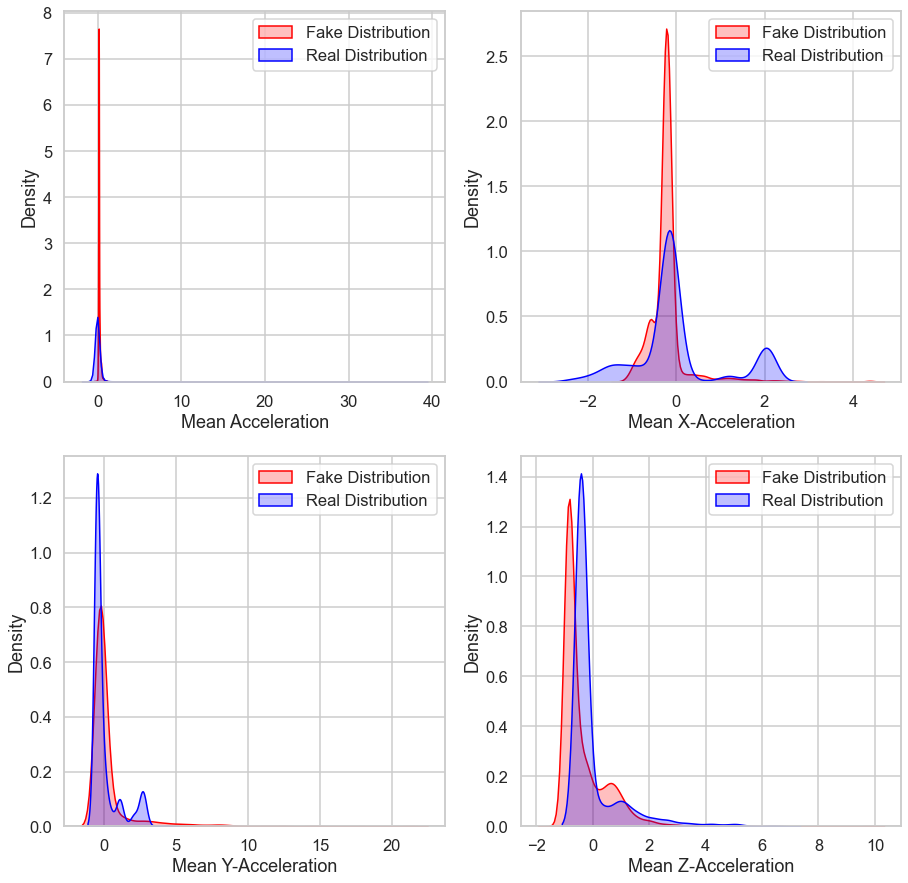

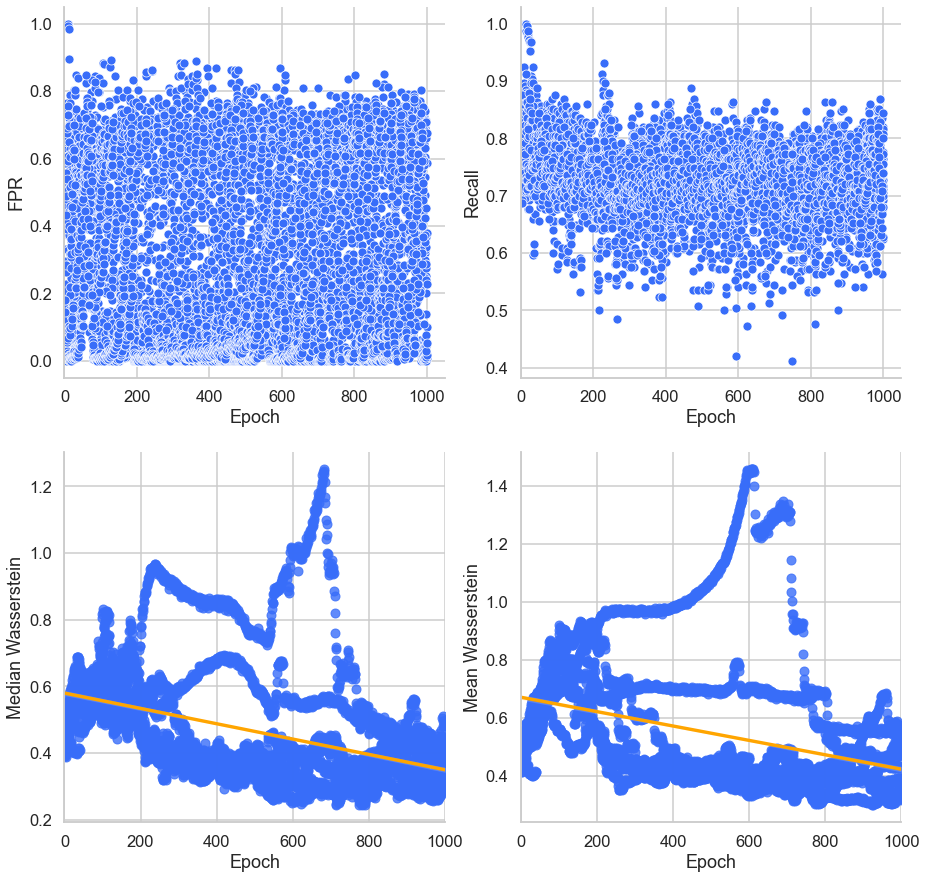

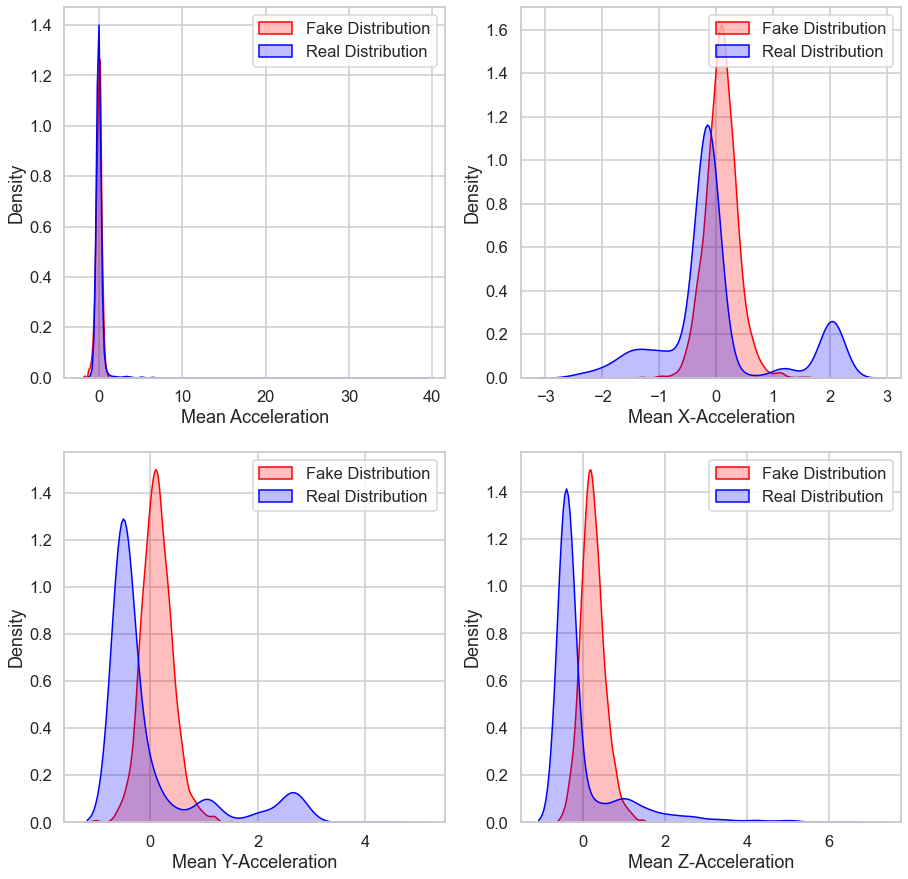

Epoch [1/1000] Training: DISC | Loss D: 0.33377, Loss G: 4.55078 | Acc: 0.88000 | fpR: 0.00400 | P: 0.99479 | R: 0.76400 | F1: 0.86376 | Median W: 0.48315 | Mean W: 0.45657

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.33377, Loss G: 2.90872 | Acc: 0.87200 | fpR: 0.01200 | P: 0.98438 | R: 0.75600 | F1: 0.85471 | Median W: 0.48895 | Mean W: 0.45587
Epoch [3/1000] Training: GEN | Loss D: 0.33377, Loss G: 1.86618 | Acc: 0.87000 | fpR: 0.04400 | P: 0.94686 | R: 0.78400 | F1: 0.85727 | Median W: 0.49900 | Mean W: 0.46194
Epoch [4/1000] Training: GEN | Loss D: 0.33377, Loss G: 1.32311 | Acc: 0.88200 | fpR: 0.03200 | P: 0.96135 | R: 0.79600 | F1: 0.87040 | Median W: 0.48339 | Mean W: 0.47072
Epoch [5/1000] Training: GEN | Loss D: 0.33377, Loss G: 1.06160 | Acc: 0.87200 | fpR: 0.04800 | P: 0.94286 | R: 0.79200 | F1: 0.86037 | Median W: 0.48568 | Mean W: 0.47615
Epoch [6/1000] Training: GEN | Loss D: 0.33377, Loss G: 0.99216 | Acc: 0.86200 | fpR: 0.07

Epoch [48/1000] Training: DISC | Loss D: 0.50388, Loss G: 0.63260 | Acc: 0.60200 | fpR: 0.57600 | P: 0.57522 | R: 0.78000 | F1: 0.66165 | Median W: 0.58685 | Mean W: 0.69353
Epoch [49/1000] Training: DISC | Loss D: 0.49255, Loss G: 0.63260 | Acc: 0.65400 | fpR: 0.50800 | P: 0.61631 | R: 0.81600 | F1: 0.70175 | Median W: 0.57860 | Mean W: 0.69341
Epoch [50/1000] Training: DISC | Loss D: 0.48811, Loss G: 0.63260 | Acc: 0.68800 | fpR: 0.38800 | P: 0.66319 | R: 0.76400 | F1: 0.70954 | Median W: 0.59140 | Mean W: 0.69398
Epoch [51/1000] Training: DISC | Loss D: 0.45571, Loss G: 0.63260 | Acc: 0.77600 | fpR: 0.24400 | P: 0.76538 | R: 0.79600 | F1: 0.77989 | Median W: 0.57678 | Mean W: 0.69277

Pull Generator

Epoch [52/1000] Training: GEN | Loss D: 0.45571, Loss G: 0.84878 | Acc: 0.70600 | fpR: 0.32000 | P: 0.69582 | R: 0.73200 | F1: 0.71295 | Median W: 0.58988 | Mean W: 0.70168
Epoch [53/1000] Training: GEN | Loss D: 0.45571, Loss G: 0.78377 | Acc: 0.71000 | fpR: 0.37200 | P: 0.68041 | R: 0

Epoch [142/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.71498 | Acc: 0.58600 | fpR: 0.56000 | P: 0.56656 | R: 0.73200 | F1: 0.63825 | Median W: 0.82994 | Mean W: 0.97215
Epoch [143/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.70277 | Acc: 0.62800 | fpR: 0.51600 | P: 0.59938 | R: 0.77200 | F1: 0.67433 | Median W: 0.83348 | Mean W: 0.98395
Epoch [144/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.68640 | Acc: 0.57800 | fpR: 0.59600 | P: 0.55786 | R: 0.75200 | F1: 0.64006 | Median W: 0.84557 | Mean W: 0.99046
Epoch [145/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.71127 | Acc: 0.58200 | fpR: 0.59600 | P: 0.56047 | R: 0.76000 | F1: 0.64467 | Median W: 0.84382 | Mean W: 0.99482
Epoch [146/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.70112 | Acc: 0.57000 | fpR: 0.64000 | P: 0.54930 | R: 0.78000 | F1: 0.64414 | Median W: 0.87532 | Mean W: 1.00593
Epoch [147/1000] Training: GEN | Loss D: 0.43599, Loss G: 0.70172 | Acc: 0.57000 | fpR: 0.62800 | P: 0.55014 | R: 0.76800 | F1: 0.

Epoch [189/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.74853 | Acc: 0.61800 | fpR: 0.53200 | P: 0.59077 | R: 0.76800 | F1: 0.66733 | Median W: 1.07396 | Mean W: 1.22364
Epoch [190/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.75045 | Acc: 0.61400 | fpR: 0.53600 | P: 0.58769 | R: 0.76400 | F1: 0.66386 | Median W: 1.05710 | Mean W: 1.23169
Epoch [191/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.74058 | Acc: 0.62800 | fpR: 0.54000 | P: 0.59581 | R: 0.79600 | F1: 0.68102 | Median W: 1.08284 | Mean W: 1.24148
Epoch [192/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.73565 | Acc: 0.57400 | fpR: 0.63600 | P: 0.55211 | R: 0.78400 | F1: 0.64745 | Median W: 1.06669 | Mean W: 1.25116
Epoch [193/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.74886 | Acc: 0.61600 | fpR: 0.57600 | P: 0.58382 | R: 0.80800 | F1: 0.67737 | Median W: 1.07997 | Mean W: 1.26091
Epoch [194/1000] Training: GEN | Loss D: 0.45628, Loss G: 0.72392 | Acc: 0.55400 | fpR: 0.62400 | P: 0.53982 | R: 0.73200 | F1: 0.

Epoch [236/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.73730 | Acc: 0.55600 | fpR: 0.65600 | P: 0.53933 | R: 0.76800 | F1: 0.63318 | Median W: 1.17845 | Mean W: 1.54609
Epoch [237/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.74941 | Acc: 0.58000 | fpR: 0.62400 | P: 0.55682 | R: 0.78400 | F1: 0.65068 | Median W: 1.18905 | Mean W: 1.55401
Epoch [238/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.72295 | Acc: 0.56000 | fpR: 0.66400 | P: 0.54144 | R: 0.78400 | F1: 0.64004 | Median W: 1.20171 | Mean W: 1.55979
Epoch [239/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.73600 | Acc: 0.54200 | fpR: 0.68400 | P: 0.52893 | R: 0.76800 | F1: 0.62594 | Median W: 1.19822 | Mean W: 1.56265
Epoch [240/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.72685 | Acc: 0.53400 | fpR: 0.67600 | P: 0.52394 | R: 0.74400 | F1: 0.61439 | Median W: 1.21016 | Mean W: 1.56850
Epoch [241/1000] Training: GEN | Loss D: 0.48351, Loss G: 0.72896 | Acc: 0.54000 | fpR: 0.66800 | P: 0.52825 | R: 0.74800 | F1: 0.

Epoch [283/1000] Training: GEN | Loss D: 0.41341, Loss G: 0.67959 | Acc: 0.68600 | fpR: 0.41200 | P: 0.65552 | R: 0.78400 | F1: 0.71353 | Median W: 1.29882 | Mean W: 1.80260
Epoch [284/1000] Training: GEN | Loss D: 0.41341, Loss G: 0.61906 | Acc: 0.64400 | fpR: 0.46800 | P: 0.61765 | R: 0.75600 | F1: 0.67936 | Median W: 1.25104 | Mean W: 1.81489
Epoch [285/1000] Training: GEN | Loss D: 0.41341, Loss G: 0.55409 | Acc: 0.61400 | fpR: 0.58800 | P: 0.58120 | R: 0.81600 | F1: 0.67838 | Median W: 1.31602 | Mean W: 1.82511
Epoch [286/1000] Training: GEN | Loss D: 0.41341, Loss G: 0.43893 | Acc: 0.50600 | fpR: 0.73600 | P: 0.50404 | R: 0.74800 | F1: 0.60177 | Median W: 1.39262 | Mean W: 1.84262

Push Generator

Epoch [287/1000] Training: DISC | Loss D: 2.34613, Loss G: 0.43893 | Acc: 0.61000 | fpR: 0.58000 | P: 0.57971 | R: 0.80000 | F1: 0.67178 | Median W: 1.40138 | Mean W: 1.85459
Epoch [288/1000] Training: DISC | Loss D: 1.40595, Loss G: 0.43893 | Acc: 0.63800 | fpR: 0.50400 | P: 0.60748 | 

Epoch [330/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.51299 | Acc: 0.55400 | fpR: 0.62800 | P: 0.53959 | R: 0.73600 | F1: 0.62219 | Median W: 1.15923 | Mean W: 1.75364
Epoch [331/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.45270 | Acc: 0.55000 | fpR: 0.63200 | P: 0.53666 | R: 0.73200 | F1: 0.61880 | Median W: 1.14491 | Mean W: 1.73116
Epoch [332/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.46186 | Acc: 0.56600 | fpR: 0.64800 | P: 0.54622 | R: 0.78000 | F1: 0.64202 | Median W: 1.19020 | Mean W: 1.75083
Epoch [333/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.45253 | Acc: 0.56200 | fpR: 0.63600 | P: 0.54441 | R: 0.76000 | F1: 0.63390 | Median W: 1.21508 | Mean W: 1.72313
Epoch [334/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.44610 | Acc: 0.54400 | fpR: 0.62800 | P: 0.53274 | R: 0.71600 | F1: 0.61043 | Median W: 1.21124 | Mean W: 1.74156
Epoch [335/1000] Training: GEN | Loss D: 0.50763, Loss G: 0.42025 | Acc: 0.53400 | fpR: 0.66800 | P: 0.52422 | R: 0.73600 | F1: 0.

Epoch [377/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.86857 | Acc: 0.84800 | fpR: 0.00400 | P: 0.99432 | R: 0.70000 | F1: 0.82111 | Median W: 1.08327 | Mean W: 1.41216
Epoch [378/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.86894 | Acc: 0.89000 | fpR: 0.00000 | P: 1.00000 | R: 0.78000 | F1: 0.87591 | Median W: 1.07306 | Mean W: 1.40291
Epoch [379/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.87558 | Acc: 0.84400 | fpR: 0.00400 | P: 0.99425 | R: 0.69200 | F1: 0.81555 | Median W: 1.06526 | Mean W: 1.39133
Epoch [380/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.87124 | Acc: 0.86200 | fpR: 0.00400 | P: 0.99454 | R: 0.72800 | F1: 0.84016 | Median W: 1.07044 | Mean W: 1.40393
Epoch [381/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.87033 | Acc: 0.86000 | fpR: 0.01600 | P: 0.97872 | R: 0.73600 | F1: 0.83969 | Median W: 1.09321 | Mean W: 1.42302
Epoch [382/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.87073 | Acc: 0.85000 | fpR: 0.00800 | P: 0.98883 | R: 0.70800 | F1: 0.

Epoch [471/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.83537 | Acc: 0.86200 | fpR: 0.03600 | P: 0.95477 | R: 0.76000 | F1: 0.84583 | Median W: 1.01930 | Mean W: 1.37538
Epoch [472/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.81885 | Acc: 0.83600 | fpR: 0.01200 | P: 0.98276 | R: 0.68400 | F1: 0.80612 | Median W: 0.98292 | Mean W: 1.35944
Epoch [473/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.83065 | Acc: 0.82400 | fpR: 0.05200 | P: 0.93085 | R: 0.70000 | F1: 0.79860 | Median W: 0.97532 | Mean W: 1.34557
Epoch [474/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.83464 | Acc: 0.85800 | fpR: 0.04400 | P: 0.94527 | R: 0.76000 | F1: 0.84208 | Median W: 0.98217 | Mean W: 1.35812
Epoch [475/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.82546 | Acc: 0.82600 | fpR: 0.06000 | P: 0.92228 | R: 0.71200 | F1: 0.80312 | Median W: 0.96382 | Mean W: 1.35325
Epoch [476/1000] Training: GEN | Loss D: 0.15587, Loss G: 0.82469 | Acc: 0.84800 | fpR: 0.03600 | P: 0.95312 | R: 0.73200 | F1: 0.

Epoch [518/1000] Training: DISC | Loss D: 0.22318, Loss G: 0.37152 | Acc: 0.85400 | fpR: 0.00400 | P: 0.99441 | R: 0.71200 | F1: 0.82935 | Median W: 1.07581 | Mean W: 1.38842
Epoch [519/1000] Training: DISC | Loss D: 0.22317, Loss G: 0.37152 | Acc: 0.84800 | fpR: 0.01600 | P: 0.97802 | R: 0.71200 | F1: 0.82359 | Median W: 1.09400 | Mean W: 1.37846
Epoch [520/1000] Training: DISC | Loss D: 0.21758, Loss G: 0.37152 | Acc: 0.85600 | fpR: 0.00000 | P: 1.00000 | R: 0.71200 | F1: 0.83129 | Median W: 1.10542 | Mean W: 1.39749
Epoch [521/1000] Training: DISC | Loss D: 0.20244, Loss G: 0.37152 | Acc: 0.84400 | fpR: 0.00800 | P: 0.98864 | R: 0.69600 | F1: 0.81642 | Median W: 1.09216 | Mean W: 1.38242
Epoch [522/1000] Training: DISC | Loss D: 0.22140, Loss G: 0.37152 | Acc: 0.85600 | fpR: 0.00000 | P: 1.00000 | R: 0.71200 | F1: 0.83129 | Median W: 1.09637 | Mean W: 1.37543
Epoch [523/1000] Training: DISC | Loss D: 0.18779, Loss G: 0.37152 | Acc: 0.87200 | fpR: 0.00000 | P: 1.00000 | R: 0.74400 | 

Epoch [565/1000] Training: DISC | Loss D: 0.48281, Loss G: 0.39122 | Acc: 0.78800 | fpR: 0.05600 | P: 0.91860 | R: 0.63200 | F1: 0.74833 | Median W: 1.04806 | Mean W: 1.22696
Epoch [566/1000] Training: DISC | Loss D: 0.46131, Loss G: 0.39122 | Acc: 0.80800 | fpR: 0.03600 | P: 0.94767 | R: 0.65200 | F1: 0.77203 | Median W: 1.03881 | Mean W: 1.23254
Epoch [567/1000] Training: DISC | Loss D: 0.44084, Loss G: 0.39122 | Acc: 0.80800 | fpR: 0.01200 | P: 0.98125 | R: 0.62800 | F1: 0.76538 | Median W: 1.02446 | Mean W: 1.21942
Epoch [568/1000] Training: DISC | Loss D: 0.38579, Loss G: 0.39122 | Acc: 0.82800 | fpR: 0.01200 | P: 0.98235 | R: 0.66800 | F1: 0.79476 | Median W: 1.06236 | Mean W: 1.23586
Epoch [569/1000] Training: DISC | Loss D: 0.31651, Loss G: 0.39122 | Acc: 0.84200 | fpR: 0.00400 | P: 0.99422 | R: 0.68800 | F1: 0.81276 | Median W: 1.06332 | Mean W: 1.24979
Epoch [570/1000] Training: DISC | Loss D: 0.29605, Loss G: 0.39122 | Acc: 0.83800 | fpR: 0.00800 | P: 0.98844 | R: 0.68400 | 

Epoch [612/1000] Training: DISC | Loss D: 0.34249, Loss G: 0.48075 | Acc: 0.79800 | fpR: 0.01200 | P: 0.98065 | R: 0.60800 | F1: 0.75015 | Median W: 0.90934 | Mean W: 1.02480
Epoch [613/1000] Training: DISC | Loss D: 0.30945, Loss G: 0.48075 | Acc: 0.83000 | fpR: 0.00800 | P: 0.98817 | R: 0.66800 | F1: 0.79666 | Median W: 0.93259 | Mean W: 1.02729
Epoch [614/1000] Training: DISC | Loss D: 0.31632, Loss G: 0.48075 | Acc: 0.82400 | fpR: 0.00800 | P: 0.98795 | R: 0.65600 | F1: 0.78798 | Median W: 0.92997 | Mean W: 1.02385
Epoch [615/1000] Training: DISC | Loss D: 0.31265, Loss G: 0.48075 | Acc: 0.83000 | fpR: 0.00800 | P: 0.98817 | R: 0.66800 | F1: 0.79666 | Median W: 0.90202 | Mean W: 0.99751
Epoch [616/1000] Training: DISC | Loss D: 0.32187, Loss G: 0.48075 | Acc: 0.83000 | fpR: 0.01200 | P: 0.98246 | R: 0.67200 | F1: 0.79762 | Median W: 0.90631 | Mean W: 1.01346
Epoch [617/1000] Training: DISC | Loss D: 0.28738, Loss G: 0.48075 | Acc: 0.84400 | fpR: 0.00400 | P: 0.99425 | R: 0.69200 | 

Epoch [659/1000] Training: DISC | Loss D: 0.77177, Loss G: 0.66731 | Acc: 0.51200 | fpR: 0.62400 | P: 0.50943 | R: 0.64800 | F1: 0.56993 | Median W: 0.72203 | Mean W: 0.80336
Epoch [660/1000] Training: DISC | Loss D: 0.68839, Loss G: 0.66731 | Acc: 0.53200 | fpR: 0.59600 | P: 0.52548 | R: 0.66000 | F1: 0.58461 | Median W: 0.71344 | Mean W: 0.79684
Epoch [661/1000] Training: DISC | Loss D: 0.55063, Loss G: 0.66731 | Acc: 0.71600 | fpR: 0.16800 | P: 0.78125 | R: 0.60000 | F1: 0.67824 | Median W: 0.75708 | Mean W: 0.82157
Epoch [662/1000] Training: DISC | Loss D: 0.46993, Loss G: 0.66731 | Acc: 0.78600 | fpR: 0.01600 | P: 0.97351 | R: 0.58800 | F1: 0.73270 | Median W: 0.73793 | Mean W: 0.80764
Epoch [663/1000] Training: DISC | Loss D: 0.43681, Loss G: 0.66731 | Acc: 0.78200 | fpR: 0.00800 | P: 0.98621 | R: 0.57200 | F1: 0.72359 | Median W: 0.72357 | Mean W: 0.81032
Epoch [664/1000] Training: DISC | Loss D: 0.44725, Loss G: 0.66731 | Acc: 0.78000 | fpR: 0.00800 | P: 0.98611 | R: 0.56800 | 

Epoch [706/1000] Training: DISC | Loss D: 0.44231, Loss G: 0.46345 | Acc: 0.81600 | fpR: 0.08000 | P: 0.89899 | R: 0.71200 | F1: 0.79415 | Median W: 0.75959 | Mean W: 0.76136
Epoch [707/1000] Training: DISC | Loss D: 0.43242, Loss G: 0.46345 | Acc: 0.79200 | fpR: 0.10800 | P: 0.86500 | R: 0.69200 | F1: 0.76840 | Median W: 0.74814 | Mean W: 0.74986
Epoch [708/1000] Training: DISC | Loss D: 0.43063, Loss G: 0.46345 | Acc: 0.82600 | fpR: 0.11200 | P: 0.87215 | R: 0.76400 | F1: 0.81400 | Median W: 0.76538 | Mean W: 0.75653

Pull Generator

Epoch [709/1000] Training: GEN | Loss D: 0.43063, Loss G: 1.48747 | Acc: 0.82200 | fpR: 0.10000 | P: 0.88152 | R: 0.74400 | F1: 0.80645 | Median W: 0.73461 | Mean W: 0.73391
Epoch [710/1000] Training: GEN | Loss D: 0.43063, Loss G: 1.45807 | Acc: 0.80200 | fpR: 0.14000 | P: 0.84163 | R: 0.74400 | F1: 0.78931 | Median W: 0.75023 | Mean W: 0.73692
Epoch [711/1000] Training: GEN | Loss D: 0.43063, Loss G: 1.31507 | Acc: 0.77600 | fpR: 0.15200 | P: 0.82243 |

Epoch [753/1000] Training: DISC | Loss D: 0.40272, Loss G: 0.48160 | Acc: 0.82400 | fpR: 0.13600 | P: 0.85217 | R: 0.78400 | F1: 0.81617 | Median W: 0.65424 | Mean W: 0.69409

Pull Generator

Epoch [754/1000] Training: GEN | Loss D: 0.40272, Loss G: 1.91536 | Acc: 0.75600 | fpR: 0.20000 | P: 0.78070 | R: 0.71200 | F1: 0.74427 | Median W: 0.63870 | Mean W: 0.67941
Epoch [755/1000] Training: GEN | Loss D: 0.40272, Loss G: 0.97520 | Acc: 0.73400 | fpR: 0.26400 | P: 0.73494 | R: 0.73200 | F1: 0.73297 | Median W: 0.58538 | Mean W: 0.65149
Epoch [756/1000] Training: GEN | Loss D: 0.40272, Loss G: 0.76802 | Acc: 0.67400 | fpR: 0.40000 | P: 0.65157 | R: 0.74800 | F1: 0.69596 | Median W: 0.58067 | Mean W: 0.65408
Epoch [757/1000] Training: GEN | Loss D: 0.40272, Loss G: 0.66965 | Acc: 0.56600 | fpR: 0.62400 | P: 0.54783 | R: 0.75600 | F1: 0.63481 | Median W: 0.55535 | Mean W: 0.64274
Epoch [758/1000] Training: GEN | Loss D: 0.40272, Loss G: 0.59569 | Acc: 0.49600 | fpR: 0.73600 | P: 0.49727 | R

Epoch [800/1000] Training: DISC | Loss D: 0.49126, Loss G: 0.62715 | Acc: 0.83000 | fpR: 0.08800 | P: 0.89474 | R: 0.74800 | F1: 0.81432 | Median W: 0.59046 | Mean W: 0.63924
Epoch [801/1000] Training: DISC | Loss D: 0.49722, Loss G: 0.62715 | Acc: 0.80600 | fpR: 0.06800 | P: 0.90909 | R: 0.68000 | F1: 0.77754 | Median W: 0.55535 | Mean W: 0.61881
Epoch [802/1000] Training: DISC | Loss D: 0.50685, Loss G: 0.62715 | Acc: 0.80400 | fpR: 0.04400 | P: 0.93678 | R: 0.65200 | F1: 0.76838 | Median W: 0.56591 | Mean W: 0.62686
Epoch [803/1000] Training: DISC | Loss D: 0.47323, Loss G: 0.62715 | Acc: 0.78400 | fpR: 0.09200 | P: 0.87766 | R: 0.66000 | F1: 0.75293 | Median W: 0.57492 | Mean W: 0.63334
Epoch [804/1000] Training: DISC | Loss D: 0.45493, Loss G: 0.62715 | Acc: 0.82400 | fpR: 0.04400 | P: 0.94022 | R: 0.69200 | F1: 0.79675 | Median W: 0.59035 | Mean W: 0.64346
Epoch [805/1000] Training: DISC | Loss D: 0.43537, Loss G: 0.62715 | Acc: 0.81800 | fpR: 0.08000 | P: 0.89950 | R: 0.71600 | 

Epoch [847/1000] Training: DISC | Loss D: 0.47413, Loss G: 0.65074 | Acc: 0.80400 | fpR: 0.03200 | P: 0.95238 | R: 0.64000 | F1: 0.76507 | Median W: 0.49994 | Mean W: 0.58628
Epoch [848/1000] Training: DISC | Loss D: 0.42033, Loss G: 0.65074 | Acc: 0.81200 | fpR: 0.06400 | P: 0.91489 | R: 0.68800 | F1: 0.78490 | Median W: 0.50126 | Mean W: 0.56908
Epoch [849/1000] Training: DISC | Loss D: 0.37606, Loss G: 0.65074 | Acc: 0.83400 | fpR: 0.08000 | P: 0.90338 | R: 0.74800 | F1: 0.81789 | Median W: 0.49069 | Mean W: 0.56370
Epoch [850/1000] Training: DISC | Loss D: 0.35532, Loss G: 0.65074 | Acc: 0.85800 | fpR: 0.04000 | P: 0.94975 | R: 0.75600 | F1: 0.84138 | Median W: 0.52165 | Mean W: 0.58177

Pull Generator

Epoch [851/1000] Training: GEN | Loss D: 0.35532, Loss G: 1.55308 | Acc: 0.76600 | fpR: 0.25200 | P: 0.75676 | R: 0.78400 | F1: 0.76964 | Median W: 0.51188 | Mean W: 0.58354
Epoch [852/1000] Training: GEN | Loss D: 0.35532, Loss G: 0.72592 | Acc: 0.59000 | fpR: 0.59600 | P: 0.56560 

Epoch [894/1000] Training: GEN | Loss D: 0.44815, Loss G: 1.55071 | Acc: 0.75200 | fpR: 0.26400 | P: 0.74419 | R: 0.76800 | F1: 0.75541 | Median W: 0.48978 | Mean W: 0.52496
Epoch [895/1000] Training: GEN | Loss D: 0.44815, Loss G: 0.91681 | Acc: 0.68400 | fpR: 0.38000 | P: 0.66312 | R: 0.74800 | F1: 0.70251 | Median W: 0.47560 | Mean W: 0.50636
Epoch [896/1000] Training: GEN | Loss D: 0.44815, Loss G: 0.81196 | Acc: 0.65800 | fpR: 0.42800 | P: 0.63481 | R: 0.74400 | F1: 0.68459 | Median W: 0.47759 | Mean W: 0.52622
Epoch [897/1000] Training: GEN | Loss D: 0.44815, Loss G: 0.77076 | Acc: 0.58600 | fpR: 0.51600 | P: 0.57143 | R: 0.68800 | F1: 0.62382 | Median W: 0.48432 | Mean W: 0.52794
Epoch [898/1000] Training: GEN | Loss D: 0.44815, Loss G: 0.77125 | Acc: 0.54800 | fpR: 0.62000 | P: 0.53593 | R: 0.71600 | F1: 0.61252 | Median W: 0.49224 | Mean W: 0.51819
Epoch [899/1000] Training: GEN | Loss D: 0.44815, Loss G: 0.67582 | Acc: 0.53200 | fpR: 0.63200 | P: 0.52410 | R: 0.69600 | F1: 0.

Epoch [941/1000] Training: DISC | Loss D: 0.39537, Loss G: 0.57593 | Acc: 0.84200 | fpR: 0.05600 | P: 0.92965 | R: 0.74000 | F1: 0.82356 | Median W: 0.43631 | Mean W: 0.54295
Epoch [942/1000] Training: DISC | Loss D: 0.35951, Loss G: 0.57593 | Acc: 0.84200 | fpR: 0.07200 | P: 0.91304 | R: 0.75600 | F1: 0.82664 | Median W: 0.46525 | Mean W: 0.56700

Pull Generator

Epoch [943/1000] Training: GEN | Loss D: 0.35951, Loss G: 1.95399 | Acc: 0.77800 | fpR: 0.17200 | P: 0.80889 | R: 0.72800 | F1: 0.76582 | Median W: 0.44551 | Mean W: 0.53392
Epoch [944/1000] Training: GEN | Loss D: 0.35951, Loss G: 0.92046 | Acc: 0.74200 | fpR: 0.25600 | P: 0.74297 | R: 0.74000 | F1: 0.74098 | Median W: 0.50125 | Mean W: 0.55050
Epoch [945/1000] Training: GEN | Loss D: 0.35951, Loss G: 0.92673 | Acc: 0.72800 | fpR: 0.30800 | P: 0.71269 | R: 0.76400 | F1: 0.73695 | Median W: 0.51506 | Mean W: 0.56366
Epoch [946/1000] Training: GEN | Loss D: 0.35951, Loss G: 0.85851 | Acc: 0.71400 | fpR: 0.32000 | P: 0.70037 | 

Epoch [988/1000] Training: DISC | Loss D: 0.48399, Loss G: 0.58641 | Acc: 0.71400 | fpR: 0.30800 | P: 0.70498 | R: 0.73600 | F1: 0.71966 | Median W: 0.62946 | Mean W: 0.74995
Epoch [989/1000] Training: DISC | Loss D: 0.47251, Loss G: 0.58641 | Acc: 0.73400 | fpR: 0.30400 | P: 0.71747 | R: 0.77200 | F1: 0.74324 | Median W: 0.64028 | Mean W: 0.76024
Epoch [990/1000] Training: DISC | Loss D: 0.48494, Loss G: 0.58641 | Acc: 0.72800 | fpR: 0.28000 | P: 0.72441 | R: 0.73600 | F1: 0.72966 | Median W: 0.65819 | Mean W: 0.76231
Epoch [991/1000] Training: DISC | Loss D: 0.45241, Loss G: 0.58641 | Acc: 0.73600 | fpR: 0.27600 | P: 0.73047 | R: 0.74800 | F1: 0.73863 | Median W: 0.64109 | Mean W: 0.75988
Epoch [992/1000] Training: DISC | Loss D: 0.46325, Loss G: 0.58641 | Acc: 0.74000 | fpR: 0.24000 | P: 0.75000 | R: 0.72000 | F1: 0.73419 | Median W: 0.63733 | Mean W: 0.75584
Epoch [993/1000] Training: DISC | Loss D: 0.44002, Loss G: 0.58641 | Acc: 0.75000 | fpR: 0.25600 | P: 0.74704 | R: 0.75600 | 

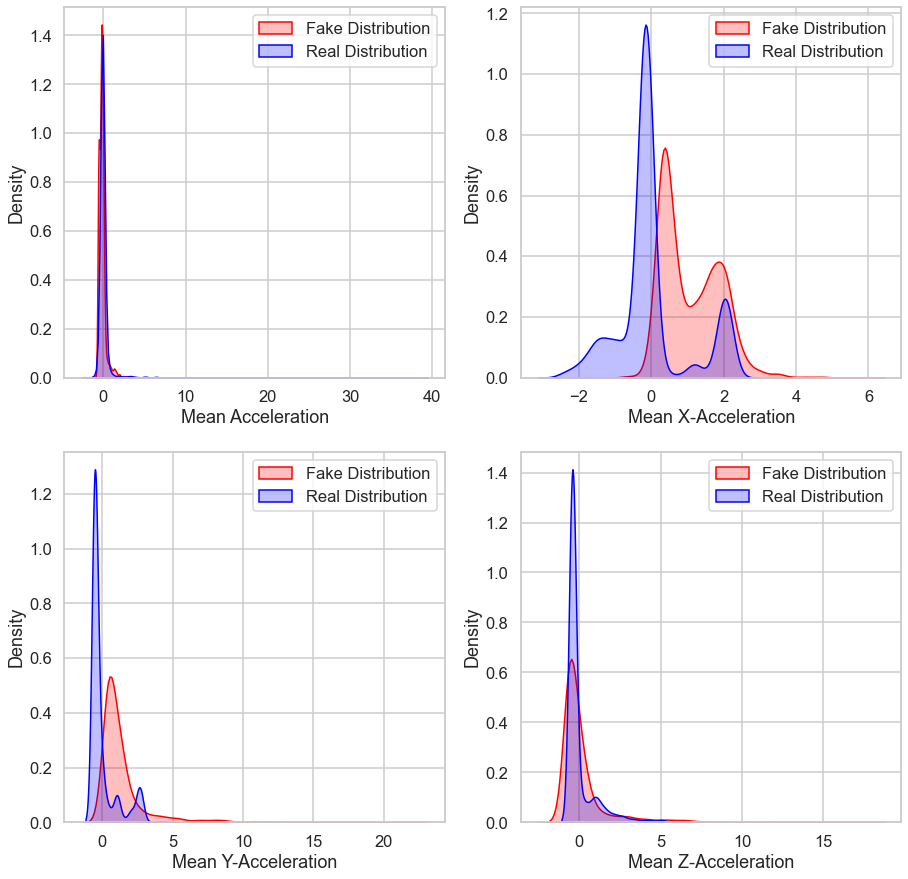

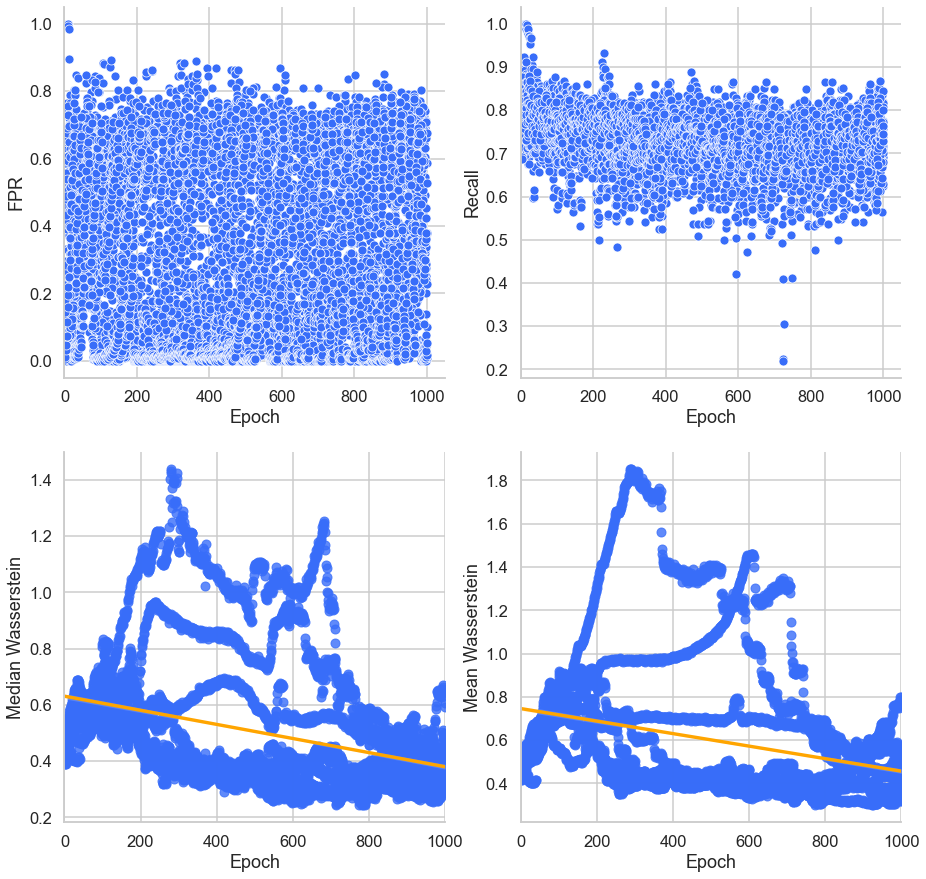

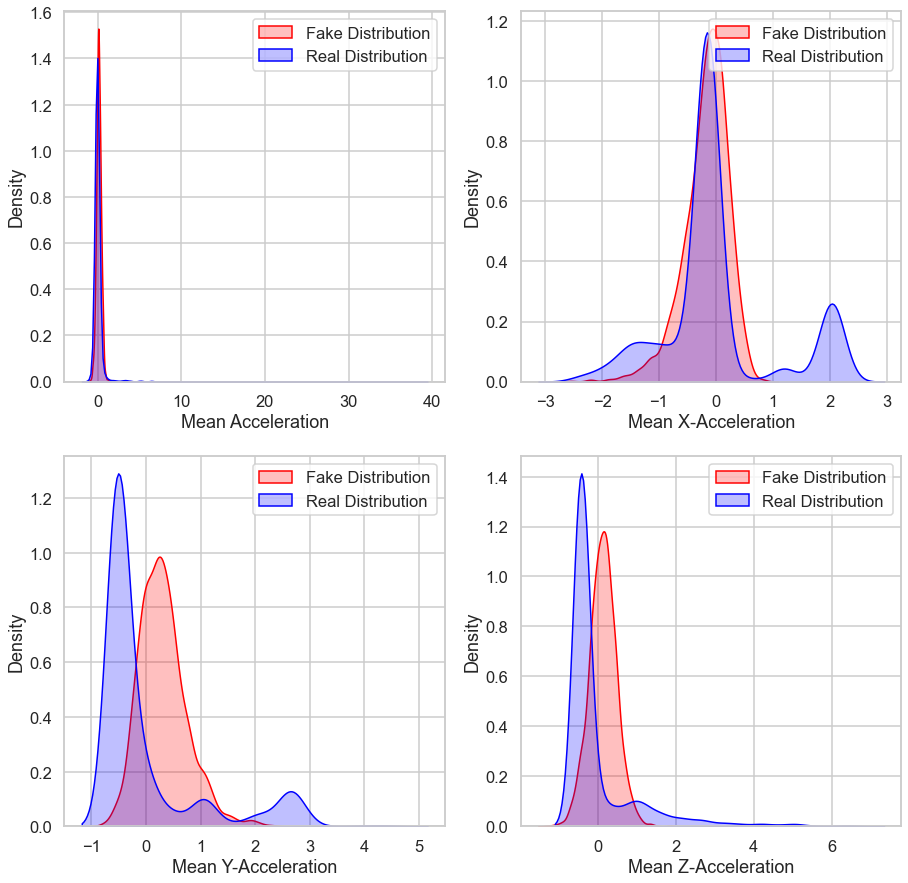

Epoch [1/1000] Training: DISC | Loss D: 0.32844, Loss G: 2.75525 | Acc: 0.88200 | fpR: 0.02000 | P: 0.97512 | R: 0.78400 | F1: 0.86869 | Median W: 0.47423 | Mean W: 0.48857

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.32844, Loss G: 1.76206 | Acc: 0.83800 | fpR: 0.04800 | P: 0.93782 | R: 0.72400 | F1: 0.81666 | Median W: 0.46941 | Mean W: 0.49203
Epoch [3/1000] Training: GEN | Loss D: 0.32844, Loss G: 1.14517 | Acc: 0.81800 | fpR: 0.07600 | P: 0.90355 | R: 0.71200 | F1: 0.79593 | Median W: 0.47788 | Mean W: 0.50556
Epoch [4/1000] Training: GEN | Loss D: 0.32844, Loss G: 1.00551 | Acc: 0.85000 | fpR: 0.09200 | P: 0.89593 | R: 0.79200 | F1: 0.84027 | Median W: 0.47070 | Mean W: 0.50568
Epoch [5/1000] Training: GEN | Loss D: 0.32844, Loss G: 0.90980 | Acc: 0.81200 | fpR: 0.14800 | P: 0.83913 | R: 0.77200 | F1: 0.80367 | Median W: 0.49306 | Mean W: 0.51413
Epoch [6/1000] Training: GEN | Loss D: 0.32844, Loss G: 0.86688 | Acc: 0.79400 | fpR: 0.16

Epoch [48/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.78592 | Acc: 0.71400 | fpR: 0.38400 | P: 0.67893 | R: 0.81200 | F1: 0.73903 | Median W: 0.56814 | Mean W: 0.64112
Epoch [49/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.78590 | Acc: 0.70600 | fpR: 0.41200 | P: 0.66667 | R: 0.82400 | F1: 0.73654 | Median W: 0.59264 | Mean W: 0.64418
Epoch [50/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.76744 | Acc: 0.67200 | fpR: 0.45600 | P: 0.63694 | R: 0.80000 | F1: 0.70873 | Median W: 0.64032 | Mean W: 0.65214
Epoch [51/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.71578 | Acc: 0.61400 | fpR: 0.54400 | P: 0.58663 | R: 0.77200 | F1: 0.66618 | Median W: 0.66755 | Mean W: 0.66262
Epoch [52/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.67725 | Acc: 0.58800 | fpR: 0.61200 | P: 0.56286 | R: 0.78800 | F1: 0.65618 | Median W: 0.66064 | Mean W: 0.67188
Epoch [53/1000] Training: GEN | Loss D: 0.46214, Loss G: 0.65692 | Acc: 0.56400 | fpR: 0.66000 | P: 0.54420 | R: 0.78800 | F1: 0.64331 

Epoch [95/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.62741 | Acc: 0.59200 | fpR: 0.52800 | P: 0.57419 | R: 0.71200 | F1: 0.63522 | Median W: 0.52141 | Mean W: 0.61508
Epoch [96/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.56043 | Acc: 0.61000 | fpR: 0.56800 | P: 0.58112 | R: 0.78800 | F1: 0.66844 | Median W: 0.53116 | Mean W: 0.61181
Epoch [97/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.53002 | Acc: 0.55400 | fpR: 0.63600 | P: 0.53913 | R: 0.74400 | F1: 0.62472 | Median W: 0.56036 | Mean W: 0.61912
Epoch [98/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.49418 | Acc: 0.56000 | fpR: 0.63600 | P: 0.54310 | R: 0.75600 | F1: 0.63162 | Median W: 0.56175 | Mean W: 0.62277
Epoch [99/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.45658 | Acc: 0.53400 | fpR: 0.66400 | P: 0.52436 | R: 0.73200 | F1: 0.61053 | Median W: 0.55471 | Mean W: 0.61916
Epoch [100/1000] Training: GEN | Loss D: 0.20040, Loss G: 0.41862 | Acc: 0.53200 | fpR: 0.67600 | P: 0.52260 | R: 0.74000 | F1: 0.61210

Epoch [142/1000] Training: GEN | Loss D: 0.18887, Loss G: 0.40255 | Acc: 0.50800 | fpR: 0.70400 | P: 0.50562 | R: 0.72000 | F1: 0.59358 | Median W: 0.37608 | Mean W: 0.43658

Push Generator

Epoch [143/1000] Training: DISC | Loss D: 1.04807, Loss G: 0.40255 | Acc: 0.55800 | fpR: 0.65600 | P: 0.54062 | R: 0.77200 | F1: 0.63543 | Median W: 0.36728 | Mean W: 0.42339
Epoch [144/1000] Training: DISC | Loss D: 0.91636, Loss G: 0.40255 | Acc: 0.54200 | fpR: 0.68000 | P: 0.52909 | R: 0.76400 | F1: 0.62472 | Median W: 0.36245 | Mean W: 0.42910
Epoch [145/1000] Training: DISC | Loss D: 0.79186, Loss G: 0.40255 | Acc: 0.55400 | fpR: 0.68800 | P: 0.53639 | R: 0.79600 | F1: 0.64042 | Median W: 0.36502 | Mean W: 0.42893
Epoch [146/1000] Training: DISC | Loss D: 0.69761, Loss G: 0.40255 | Acc: 0.57600 | fpR: 0.56400 | P: 0.55937 | R: 0.71600 | F1: 0.62758 | Median W: 0.37497 | Mean W: 0.42914
Epoch [147/1000] Training: DISC | Loss D: 0.65316, Loss G: 0.40255 | Acc: 0.58600 | fpR: 0.52400 | P: 0.57049

Epoch [189/1000] Training: GEN | Loss D: 0.30923, Loss G: 0.49488 | Acc: 0.50600 | fpR: 0.66000 | P: 0.50450 | R: 0.67200 | F1: 0.57584 | Median W: 0.35637 | Mean W: 0.40819
Epoch [190/1000] Training: GEN | Loss D: 0.30923, Loss G: 0.49193 | Acc: 0.49600 | fpR: 0.68400 | P: 0.49706 | R: 0.67600 | F1: 0.57239 | Median W: 0.36433 | Mean W: 0.40902
Epoch [191/1000] Training: GEN | Loss D: 0.30923, Loss G: 0.47743 | Acc: 0.51400 | fpR: 0.72800 | P: 0.50943 | R: 0.75600 | F1: 0.60822 | Median W: 0.35340 | Mean W: 0.40226

Push Generator

Epoch [192/1000] Training: DISC | Loss D: 0.85180, Loss G: 0.47743 | Acc: 0.50400 | fpR: 0.69600 | P: 0.50286 | R: 0.70400 | F1: 0.58618 | Median W: 0.35659 | Mean W: 0.40628
Epoch [193/1000] Training: DISC | Loss D: 0.80675, Loss G: 0.47743 | Acc: 0.52600 | fpR: 0.66800 | P: 0.51873 | R: 0.72000 | F1: 0.60253 | Median W: 0.36642 | Mean W: 0.40686
Epoch [194/1000] Training: DISC | Loss D: 0.76279, Loss G: 0.47743 | Acc: 0.53200 | fpR: 0.63600 | P: 0.52395 |

Epoch [236/1000] Training: GEN | Loss D: 0.28659, Loss G: 0.70270 | Acc: 0.57600 | fpR: 0.57200 | P: 0.55864 | R: 0.72400 | F1: 0.63017 | Median W: 0.37194 | Mean W: 0.40402
Epoch [237/1000] Training: GEN | Loss D: 0.28659, Loss G: 0.54819 | Acc: 0.53600 | fpR: 0.67600 | P: 0.52528 | R: 0.74800 | F1: 0.61668 | Median W: 0.37887 | Mean W: 0.40614
Epoch [238/1000] Training: GEN | Loss D: 0.28659, Loss G: 0.54959 | Acc: 0.52800 | fpR: 0.66400 | P: 0.52023 | R: 0.72000 | F1: 0.60354 | Median W: 0.37605 | Mean W: 0.40840
Epoch [239/1000] Training: GEN | Loss D: 0.28659, Loss G: 0.52238 | Acc: 0.51200 | fpR: 0.72400 | P: 0.50815 | R: 0.74800 | F1: 0.60470 | Median W: 0.37212 | Mean W: 0.40815

Push Generator

Epoch [240/1000] Training: DISC | Loss D: 0.78032, Loss G: 0.52238 | Acc: 0.55600 | fpR: 0.62400 | P: 0.54118 | R: 0.73600 | F1: 0.62324 | Median W: 0.38108 | Mean W: 0.40720
Epoch [241/1000] Training: DISC | Loss D: 0.49400, Loss G: 0.52238 | Acc: 0.79400 | fpR: 0.11200 | P: 0.86207 | 

Epoch [283/1000] Training: DISC | Loss D: 0.38336, Loss G: 0.53097 | Acc: 0.87000 | fpR: 0.02800 | P: 0.96482 | R: 0.76800 | F1: 0.85474 | Median W: 0.35450 | Mean W: 0.40843

Pull Generator

Epoch [284/1000] Training: GEN | Loss D: 0.38336, Loss G: 1.66697 | Acc: 0.85000 | fpR: 0.05200 | P: 0.93532 | R: 0.75200 | F1: 0.83321 | Median W: 0.33717 | Mean W: 0.39970
Epoch [285/1000] Training: GEN | Loss D: 0.38336, Loss G: 1.02671 | Acc: 0.78600 | fpR: 0.21200 | P: 0.78715 | R: 0.78400 | F1: 0.78507 | Median W: 0.35147 | Mean W: 0.39845
Epoch [286/1000] Training: GEN | Loss D: 0.38336, Loss G: 0.89365 | Acc: 0.74800 | fpR: 0.28800 | P: 0.73134 | R: 0.78400 | F1: 0.75626 | Median W: 0.36049 | Mean W: 0.39743
Epoch [287/1000] Training: GEN | Loss D: 0.38336, Loss G: 0.86124 | Acc: 0.80400 | fpR: 0.21200 | P: 0.79457 | R: 0.82000 | F1: 0.80659 | Median W: 0.34412 | Mean W: 0.39076
Epoch [288/1000] Training: GEN | Loss D: 0.38336, Loss G: 0.79619 | Acc: 0.64600 | fpR: 0.49600 | P: 0.61371 | R

Epoch [330/1000] Training: DISC | Loss D: 0.65612, Loss G: 0.61220 | Acc: 0.56400 | fpR: 0.66400 | P: 0.54396 | R: 0.79200 | F1: 0.64447 | Median W: 0.33986 | Mean W: 0.40840
Epoch [331/1000] Training: DISC | Loss D: 0.62665, Loss G: 0.61220 | Acc: 0.67800 | fpR: 0.46000 | P: 0.63950 | R: 0.81600 | F1: 0.71656 | Median W: 0.33292 | Mean W: 0.40956
Epoch [332/1000] Training: DISC | Loss D: 0.57731, Loss G: 0.61220 | Acc: 0.74800 | fpR: 0.25600 | P: 0.74603 | R: 0.75200 | F1: 0.74850 | Median W: 0.34279 | Mean W: 0.41166

Pull Generator

Epoch [333/1000] Training: GEN | Loss D: 0.57731, Loss G: 0.92717 | Acc: 0.66800 | fpR: 0.40400 | P: 0.64685 | R: 0.74000 | F1: 0.68980 | Median W: 0.34997 | Mean W: 0.41043
Epoch [334/1000] Training: GEN | Loss D: 0.57731, Loss G: 0.80765 | Acc: 0.60800 | fpR: 0.58800 | P: 0.57759 | R: 0.80400 | F1: 0.67175 | Median W: 0.34520 | Mean W: 0.41103
Epoch [335/1000] Training: GEN | Loss D: 0.57731, Loss G: 0.65740 | Acc: 0.60200 | fpR: 0.61600 | P: 0.57103 |

Epoch [377/1000] Training: DISC | Loss D: 0.53473, Loss G: 0.56326 | Acc: 0.70400 | fpR: 0.36000 | P: 0.68085 | R: 0.76800 | F1: 0.72131 | Median W: 0.40761 | Mean W: 0.44143
Epoch [378/1000] Training: DISC | Loss D: 0.50378, Loss G: 0.56326 | Acc: 0.69800 | fpR: 0.38000 | P: 0.67128 | R: 0.77600 | F1: 0.71935 | Median W: 0.40307 | Mean W: 0.43280
Epoch [379/1000] Training: DISC | Loss D: 0.50256, Loss G: 0.56326 | Acc: 0.70600 | fpR: 0.32000 | P: 0.69582 | R: 0.73200 | F1: 0.71295 | Median W: 0.39715 | Mean W: 0.43389
Epoch [380/1000] Training: DISC | Loss D: 0.48576, Loss G: 0.56326 | Acc: 0.76800 | fpR: 0.27600 | P: 0.74632 | R: 0.81200 | F1: 0.77728 | Median W: 0.39143 | Mean W: 0.43543

Pull Generator

Epoch [381/1000] Training: GEN | Loss D: 0.48576, Loss G: 1.40396 | Acc: 0.70800 | fpR: 0.37200 | P: 0.67931 | R: 0.78800 | F1: 0.72913 | Median W: 0.41273 | Mean W: 0.42838
Epoch [382/1000] Training: GEN | Loss D: 0.48576, Loss G: 0.93057 | Acc: 0.72000 | fpR: 0.40000 | P: 0.67742 

Epoch [424/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.96108 | Acc: 0.65000 | fpR: 0.46800 | P: 0.62136 | R: 0.76800 | F1: 0.68645 | Median W: 0.29242 | Mean W: 0.33801
Epoch [425/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.88758 | Acc: 0.62800 | fpR: 0.43600 | P: 0.61348 | R: 0.69200 | F1: 0.64988 | Median W: 0.28348 | Mean W: 0.33399
Epoch [426/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.88986 | Acc: 0.62000 | fpR: 0.48400 | P: 0.59934 | R: 0.72400 | F1: 0.65530 | Median W: 0.28565 | Mean W: 0.33522
Epoch [427/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.88712 | Acc: 0.63200 | fpR: 0.46000 | P: 0.61149 | R: 0.72400 | F1: 0.66251 | Median W: 0.27955 | Mean W: 0.33607
Epoch [428/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.83232 | Acc: 0.62200 | fpR: 0.50800 | P: 0.59683 | R: 0.75200 | F1: 0.66499 | Median W: 0.26467 | Mean W: 0.33437
Epoch [429/1000] Training: GEN | Loss D: 0.56016, Loss G: 0.80539 | Acc: 0.61400 | fpR: 0.51200 | P: 0.59105 | R: 0.74000 | F1: 0.

Epoch [471/1000] Training: DISC | Loss D: 0.55423, Loss G: 0.55185 | Acc: 0.75800 | fpR: 0.20400 | P: 0.77922 | R: 0.72000 | F1: 0.74794 | Median W: 0.31654 | Mean W: 0.32528
Epoch [472/1000] Training: DISC | Loss D: 0.56747, Loss G: 0.55185 | Acc: 0.74800 | fpR: 0.17200 | P: 0.79524 | R: 0.66800 | F1: 0.72559 | Median W: 0.31679 | Mean W: 0.32330
Epoch [473/1000] Training: DISC | Loss D: 0.52329, Loss G: 0.55185 | Acc: 0.77600 | fpR: 0.18000 | P: 0.80263 | R: 0.73200 | F1: 0.76519 | Median W: 0.32478 | Mean W: 0.32720
Epoch [474/1000] Training: DISC | Loss D: 0.50223, Loss G: 0.55185 | Acc: 0.78600 | fpR: 0.14000 | P: 0.83568 | R: 0.71200 | F1: 0.76840 | Median W: 0.32132 | Mean W: 0.32554
Epoch [475/1000] Training: DISC | Loss D: 0.48287, Loss G: 0.55185 | Acc: 0.79800 | fpR: 0.16800 | P: 0.81974 | R: 0.76400 | F1: 0.79039 | Median W: 0.32094 | Mean W: 0.32262

Pull Generator

Epoch [476/1000] Training: GEN | Loss D: 0.48287, Loss G: 1.22288 | Acc: 0.77800 | fpR: 0.16800 | P: 0.81166

Epoch [518/1000] Training: DISC | Loss D: 0.52052, Loss G: 0.62498 | Acc: 0.77200 | fpR: 0.19200 | P: 0.79310 | R: 0.73600 | F1: 0.76299 | Median W: 0.31391 | Mean W: 0.33266
Epoch [519/1000] Training: DISC | Loss D: 0.49503, Loss G: 0.62498 | Acc: 0.74600 | fpR: 0.21600 | P: 0.76623 | R: 0.70800 | F1: 0.73547 | Median W: 0.31087 | Mean W: 0.32883
Epoch [520/1000] Training: DISC | Loss D: 0.46721, Loss G: 0.62498 | Acc: 0.79600 | fpR: 0.18000 | P: 0.81092 | R: 0.77200 | F1: 0.79048 | Median W: 0.30242 | Mean W: 0.32816

Pull Generator

Epoch [521/1000] Training: GEN | Loss D: 0.46721, Loss G: 1.24438 | Acc: 0.67600 | fpR: 0.38800 | P: 0.65603 | R: 0.74000 | F1: 0.69499 | Median W: 0.31036 | Mean W: 0.33051
Epoch [522/1000] Training: GEN | Loss D: 0.46721, Loss G: 0.84481 | Acc: 0.64200 | fpR: 0.46400 | P: 0.61716 | R: 0.74800 | F1: 0.67582 | Median W: 0.32021 | Mean W: 0.33500
Epoch [523/1000] Training: GEN | Loss D: 0.46721, Loss G: 0.75230 | Acc: 0.59200 | fpR: 0.50000 | P: 0.57770 |

Epoch [565/1000] Training: DISC | Loss D: 0.50810, Loss G: 0.59842 | Acc: 0.76200 | fpR: 0.22800 | P: 0.76735 | R: 0.75200 | F1: 0.75910 | Median W: 0.26049 | Mean W: 0.29472

Pull Generator

Epoch [566/1000] Training: GEN | Loss D: 0.50810, Loss G: 0.93770 | Acc: 0.71800 | fpR: 0.32000 | P: 0.70260 | R: 0.75600 | F1: 0.72782 | Median W: 0.26478 | Mean W: 0.29555
Epoch [567/1000] Training: GEN | Loss D: 0.50810, Loss G: 0.76939 | Acc: 0.67400 | fpR: 0.42800 | P: 0.64452 | R: 0.77600 | F1: 0.70368 | Median W: 0.28585 | Mean W: 0.29920
Epoch [568/1000] Training: GEN | Loss D: 0.50810, Loss G: 0.79415 | Acc: 0.64000 | fpR: 0.44800 | P: 0.61905 | R: 0.72800 | F1: 0.66862 | Median W: 0.28575 | Mean W: 0.29637
Epoch [569/1000] Training: GEN | Loss D: 0.50810, Loss G: 0.69254 | Acc: 0.61000 | fpR: 0.54800 | P: 0.58359 | R: 0.76800 | F1: 0.66272 | Median W: 0.29479 | Mean W: 0.30260
Epoch [570/1000] Training: GEN | Loss D: 0.50810, Loss G: 0.65217 | Acc: 0.49800 | fpR: 0.72800 | P: 0.49862 | R

Epoch [612/1000] Training: GEN | Loss D: 0.42294, Loss G: 0.48844 | Acc: 0.46200 | fpR: 0.74400 | P: 0.47309 | R: 0.66800 | F1: 0.55341 | Median W: 0.26542 | Mean W: 0.31228

Push Generator

Epoch [613/1000] Training: DISC | Loss D: 0.80948, Loss G: 0.48844 | Acc: 0.48600 | fpR: 0.69200 | P: 0.48968 | R: 0.66400 | F1: 0.56318 | Median W: 0.27140 | Mean W: 0.31758
Epoch [614/1000] Training: DISC | Loss D: 0.75182, Loss G: 0.48844 | Acc: 0.55200 | fpR: 0.55200 | P: 0.54305 | R: 0.65600 | F1: 0.59371 | Median W: 0.26857 | Mean W: 0.31854
Epoch [615/1000] Training: DISC | Loss D: 0.65525, Loss G: 0.48844 | Acc: 0.62600 | fpR: 0.34800 | P: 0.63291 | R: 0.60000 | F1: 0.61552 | Median W: 0.25788 | Mean W: 0.31190
Epoch [616/1000] Training: DISC | Loss D: 0.63807, Loss G: 0.48844 | Acc: 0.66600 | fpR: 0.15600 | P: 0.75776 | R: 0.48800 | F1: 0.59320 | Median W: 0.26616 | Mean W: 0.31401
Epoch [617/1000] Training: DISC | Loss D: 0.61200, Loss G: 0.48844 | Acc: 0.66600 | fpR: 0.16000 | P: 0.75460

Epoch [659/1000] Training: DISC | Loss D: 0.48077, Loss G: 0.57182 | Acc: 0.80400 | fpR: 0.15600 | P: 0.83043 | R: 0.76400 | F1: 0.79533 | Median W: 0.28899 | Mean W: 0.31103

Pull Generator

Epoch [660/1000] Training: GEN | Loss D: 0.48077, Loss G: 1.25221 | Acc: 0.74200 | fpR: 0.26000 | P: 0.74104 | R: 0.74400 | F1: 0.74202 | Median W: 0.28557 | Mean W: 0.30562
Epoch [661/1000] Training: GEN | Loss D: 0.48077, Loss G: 0.85694 | Acc: 0.58600 | fpR: 0.54000 | P: 0.56869 | R: 0.71200 | F1: 0.63183 | Median W: 0.29453 | Mean W: 0.32175
Epoch [662/1000] Training: GEN | Loss D: 0.48077, Loss G: 0.75362 | Acc: 0.59200 | fpR: 0.56400 | P: 0.57012 | R: 0.74800 | F1: 0.64657 | Median W: 0.28556 | Mean W: 0.31083
Epoch [663/1000] Training: GEN | Loss D: 0.48077, Loss G: 0.65709 | Acc: 0.51800 | fpR: 0.66800 | P: 0.51312 | R: 0.70400 | F1: 0.59310 | Median W: 0.27238 | Mean W: 0.31061
Epoch [664/1000] Training: GEN | Loss D: 0.48077, Loss G: 0.63561 | Acc: 0.55200 | fpR: 0.67600 | P: 0.53571 | R

Epoch [706/1000] Training: GEN | Loss D: 0.42046, Loss G: 0.57860 | Acc: 0.50800 | fpR: 0.68000 | P: 0.50581 | R: 0.69600 | F1: 0.58537 | Median W: 0.23483 | Mean W: 0.28094
Epoch [707/1000] Training: GEN | Loss D: 0.42046, Loss G: 0.55502 | Acc: 0.54000 | fpR: 0.67600 | P: 0.52793 | R: 0.75600 | F1: 0.62123 | Median W: 0.23437 | Mean W: 0.28103
Epoch [708/1000] Training: GEN | Loss D: 0.42046, Loss G: 0.51473 | Acc: 0.51600 | fpR: 0.69200 | P: 0.51130 | R: 0.72400 | F1: 0.59885 | Median W: 0.24174 | Mean W: 0.28528
Epoch [709/1000] Training: GEN | Loss D: 0.42046, Loss G: 0.48146 | Acc: 0.52400 | fpR: 0.70800 | P: 0.51639 | R: 0.75600 | F1: 0.61315 | Median W: 0.24786 | Mean W: 0.28867

Push Generator

Epoch [710/1000] Training: DISC | Loss D: 0.81234, Loss G: 0.48146 | Acc: 0.48400 | fpR: 0.70400 | P: 0.48837 | R: 0.67200 | F1: 0.56517 | Median W: 0.23902 | Mean W: 0.29079
Epoch [711/1000] Training: DISC | Loss D: 0.76552, Loss G: 0.48146 | Acc: 0.51600 | fpR: 0.65200 | P: 0.51198 | 

Epoch [753/1000] Training: GEN | Loss D: 0.44545, Loss G: 0.59588 | Acc: 0.53800 | fpR: 0.68800 | P: 0.52617 | R: 0.76400 | F1: 0.62268 | Median W: 0.22887 | Mean W: 0.28364
Epoch [754/1000] Training: GEN | Loss D: 0.44545, Loss G: 0.58208 | Acc: 0.51200 | fpR: 0.68800 | P: 0.50857 | R: 0.71200 | F1: 0.59285 | Median W: 0.23442 | Mean W: 0.28615
Epoch [755/1000] Training: GEN | Loss D: 0.44545, Loss G: 0.53863 | Acc: 0.53000 | fpR: 0.67600 | P: 0.52125 | R: 0.73600 | F1: 0.60980 | Median W: 0.22896 | Mean W: 0.28433
Epoch [756/1000] Training: GEN | Loss D: 0.44545, Loss G: 0.49298 | Acc: 0.46000 | fpR: 0.76400 | P: 0.47238 | R: 0.68400 | F1: 0.55834 | Median W: 0.23356 | Mean W: 0.28393

Push Generator

Epoch [757/1000] Training: DISC | Loss D: 0.77130, Loss G: 0.49298 | Acc: 0.47800 | fpR: 0.78000 | P: 0.48549 | R: 0.73600 | F1: 0.58458 | Median W: 0.23708 | Mean W: 0.28671
Epoch [758/1000] Training: DISC | Loss D: 0.70416, Loss G: 0.49298 | Acc: 0.55200 | fpR: 0.60400 | P: 0.53963 | 

Epoch [800/1000] Training: GEN | Loss D: 0.38593, Loss G: 0.54899 | Acc: 0.51200 | fpR: 0.66800 | P: 0.50882 | R: 0.69200 | F1: 0.58595 | Median W: 0.23791 | Mean W: 0.28037
Epoch [801/1000] Training: GEN | Loss D: 0.38593, Loss G: 0.51870 | Acc: 0.49000 | fpR: 0.73200 | P: 0.49307 | R: 0.71200 | F1: 0.58217 | Median W: 0.24250 | Mean W: 0.28441

Push Generator

Epoch [802/1000] Training: DISC | Loss D: 0.78984, Loss G: 0.51870 | Acc: 0.50800 | fpR: 0.70800 | P: 0.50559 | R: 0.72400 | F1: 0.59491 | Median W: 0.23427 | Mean W: 0.28320
Epoch [803/1000] Training: DISC | Loss D: 0.72622, Loss G: 0.51870 | Acc: 0.55200 | fpR: 0.58800 | P: 0.54063 | R: 0.69200 | F1: 0.60653 | Median W: 0.23284 | Mean W: 0.28118
Epoch [804/1000] Training: DISC | Loss D: 0.64416, Loss G: 0.51870 | Acc: 0.63000 | fpR: 0.30000 | P: 0.65116 | R: 0.56000 | F1: 0.60165 | Median W: 0.24024 | Mean W: 0.28330
Epoch [805/1000] Training: DISC | Loss D: 0.57852, Loss G: 0.51870 | Acc: 0.67200 | fpR: 0.14000 | P: 0.77564 

Epoch [847/1000] Training: GEN | Loss D: 0.43637, Loss G: 1.05266 | Acc: 0.79000 | fpR: 0.20000 | P: 0.79592 | R: 0.78000 | F1: 0.78738 | Median W: 0.21869 | Mean W: 0.28536
Epoch [848/1000] Training: GEN | Loss D: 0.43637, Loss G: 0.90736 | Acc: 0.71400 | fpR: 0.34800 | P: 0.69039 | R: 0.77600 | F1: 0.73020 | Median W: 0.23817 | Mean W: 0.29010
Epoch [849/1000] Training: GEN | Loss D: 0.43637, Loss G: 0.70641 | Acc: 0.68600 | fpR: 0.40000 | P: 0.65870 | R: 0.77200 | F1: 0.71037 | Median W: 0.23346 | Mean W: 0.28469
Epoch [850/1000] Training: GEN | Loss D: 0.43637, Loss G: 0.63156 | Acc: 0.55200 | fpR: 0.64800 | P: 0.53714 | R: 0.75200 | F1: 0.62618 | Median W: 0.23829 | Mean W: 0.29076
Epoch [851/1000] Training: GEN | Loss D: 0.43637, Loss G: 0.59105 | Acc: 0.54800 | fpR: 0.68400 | P: 0.53279 | R: 0.78000 | F1: 0.63263 | Median W: 0.23773 | Mean W: 0.29227
Epoch [852/1000] Training: GEN | Loss D: 0.43637, Loss G: 0.53845 | Acc: 0.51600 | fpR: 0.71200 | P: 0.51099 | R: 0.74400 | F1: 0.

Epoch [894/1000] Training: DISC | Loss D: 0.46815, Loss G: 0.60488 | Acc: 0.74600 | fpR: 0.18400 | P: 0.78605 | R: 0.67600 | F1: 0.72638 | Median W: 0.25381 | Mean W: 0.29746
Epoch [895/1000] Training: DISC | Loss D: 0.43502, Loss G: 0.60488 | Acc: 0.77200 | fpR: 0.16800 | P: 0.80909 | R: 0.71200 | F1: 0.75695 | Median W: 0.25716 | Mean W: 0.29369
Epoch [896/1000] Training: DISC | Loss D: 0.43713, Loss G: 0.60488 | Acc: 0.78600 | fpR: 0.19200 | P: 0.79916 | R: 0.76400 | F1: 0.78069 | Median W: 0.25528 | Mean W: 0.29242

Pull Generator

Epoch [897/1000] Training: GEN | Loss D: 0.43713, Loss G: 1.20082 | Acc: 0.70800 | fpR: 0.28800 | P: 0.70968 | R: 0.70400 | F1: 0.70633 | Median W: 0.25697 | Mean W: 0.29250
Epoch [898/1000] Training: GEN | Loss D: 0.43713, Loss G: 0.83295 | Acc: 0.63800 | fpR: 0.46800 | P: 0.61386 | R: 0.74400 | F1: 0.67220 | Median W: 0.25046 | Mean W: 0.28701
Epoch [899/1000] Training: GEN | Loss D: 0.43713, Loss G: 0.83027 | Acc: 0.65200 | fpR: 0.44000 | P: 0.62838 |

Epoch [941/1000] Training: DISC | Loss D: 0.51565, Loss G: 0.54737 | Acc: 0.69200 | fpR: 0.32400 | P: 0.68605 | R: 0.70800 | F1: 0.69635 | Median W: 0.24653 | Mean W: 0.28379
Epoch [942/1000] Training: DISC | Loss D: 0.51702, Loss G: 0.54737 | Acc: 0.70600 | fpR: 0.31600 | P: 0.69732 | R: 0.72800 | F1: 0.71183 | Median W: 0.23728 | Mean W: 0.28606
Epoch [943/1000] Training: DISC | Loss D: 0.49546, Loss G: 0.54737 | Acc: 0.74600 | fpR: 0.32400 | P: 0.71579 | R: 0.81600 | F1: 0.76212 | Median W: 0.23713 | Mean W: 0.28365
Epoch [944/1000] Training: DISC | Loss D: 0.47081, Loss G: 0.54737 | Acc: 0.77000 | fpR: 0.25200 | P: 0.75862 | R: 0.79200 | F1: 0.77445 | Median W: 0.23768 | Mean W: 0.28575

Pull Generator

Epoch [945/1000] Training: GEN | Loss D: 0.47081, Loss G: 0.95915 | Acc: 0.63000 | fpR: 0.48400 | P: 0.60586 | R: 0.74400 | F1: 0.66737 | Median W: 0.24632 | Mean W: 0.28724
Epoch [946/1000] Training: GEN | Loss D: 0.47081, Loss G: 0.68225 | Acc: 0.54400 | fpR: 0.67600 | P: 0.53056 

Epoch [988/1000] Training: DISC | Loss D: 0.37930, Loss G: 0.59712 | Acc: 0.79800 | fpR: 0.14000 | P: 0.84018 | R: 0.73600 | F1: 0.78415 | Median W: 0.24272 | Mean W: 0.27914
Epoch [989/1000] Training: DISC | Loss D: 0.39323, Loss G: 0.59712 | Acc: 0.79800 | fpR: 0.17200 | P: 0.81702 | R: 0.76800 | F1: 0.79125 | Median W: 0.22793 | Mean W: 0.26780

Pull Generator

Epoch [990/1000] Training: GEN | Loss D: 0.39323, Loss G: 0.84178 | Acc: 0.63800 | fpR: 0.44800 | P: 0.61775 | R: 0.72400 | F1: 0.66617 | Median W: 0.22054 | Mean W: 0.25983
Epoch [991/1000] Training: GEN | Loss D: 0.39323, Loss G: 0.75609 | Acc: 0.62600 | fpR: 0.43600 | P: 0.61210 | R: 0.68800 | F1: 0.64734 | Median W: 0.22147 | Mean W: 0.25763
Epoch [992/1000] Training: GEN | Loss D: 0.39323, Loss G: 0.80886 | Acc: 0.62400 | fpR: 0.44400 | P: 0.60915 | R: 0.69200 | F1: 0.64744 | Median W: 0.23225 | Mean W: 0.26377
Epoch [993/1000] Training: GEN | Loss D: 0.39323, Loss G: 0.75032 | Acc: 0.62800 | fpR: 0.50000 | P: 0.60191 | 

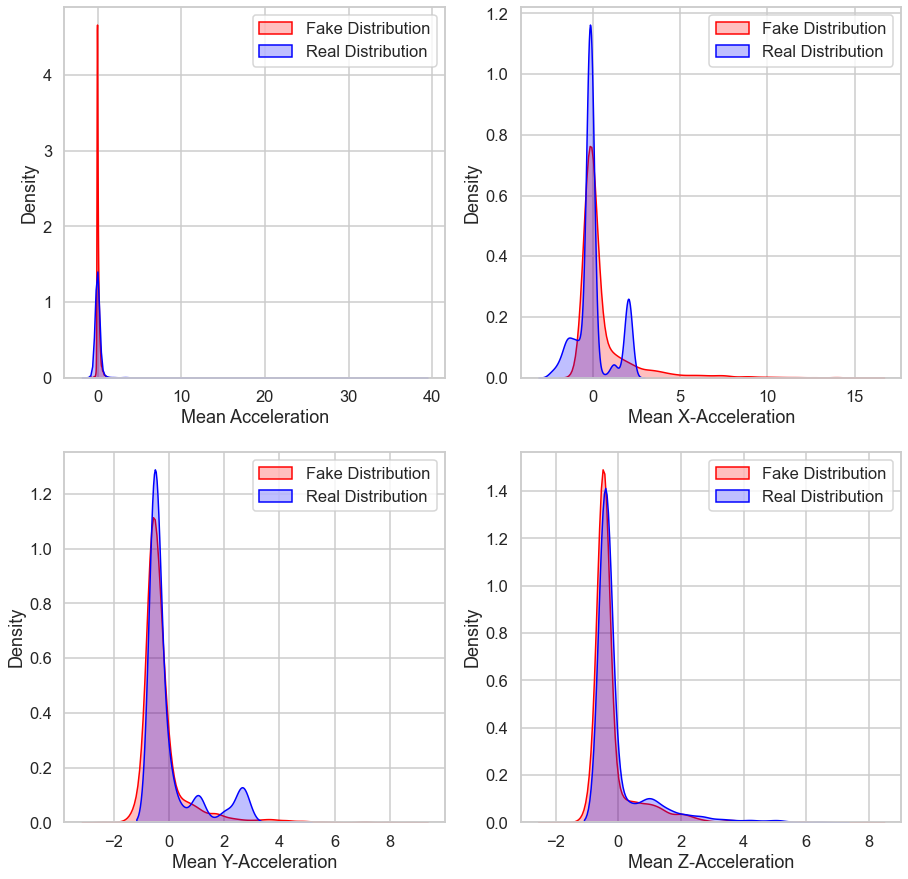

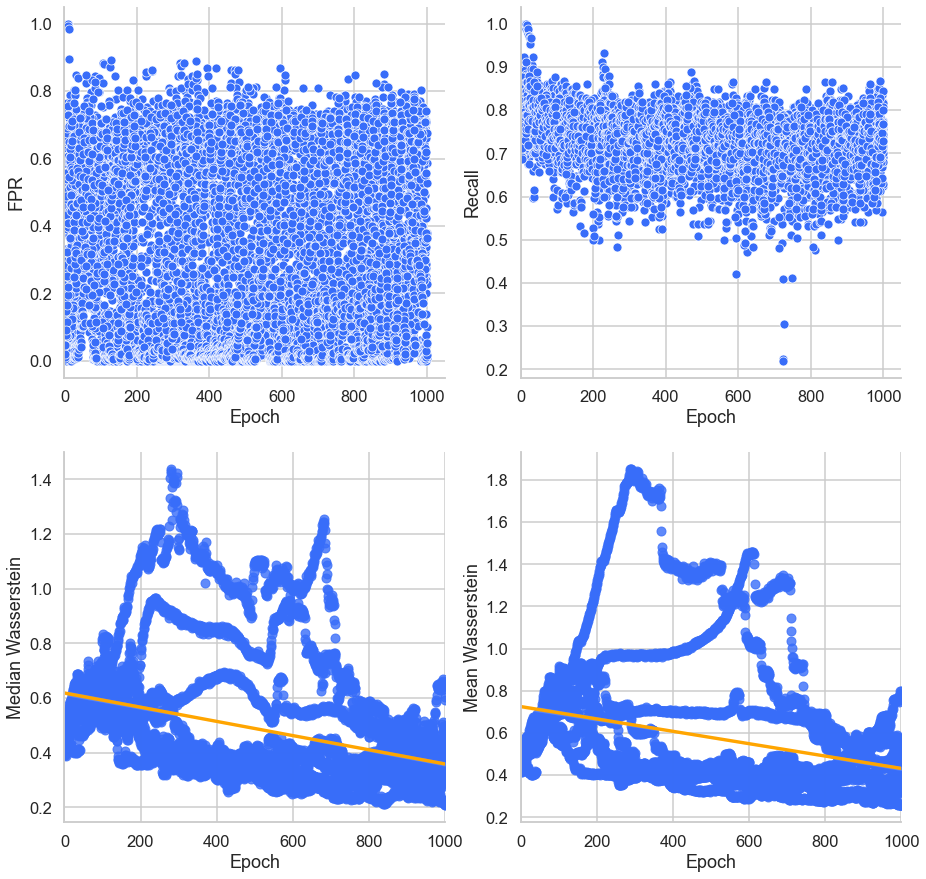

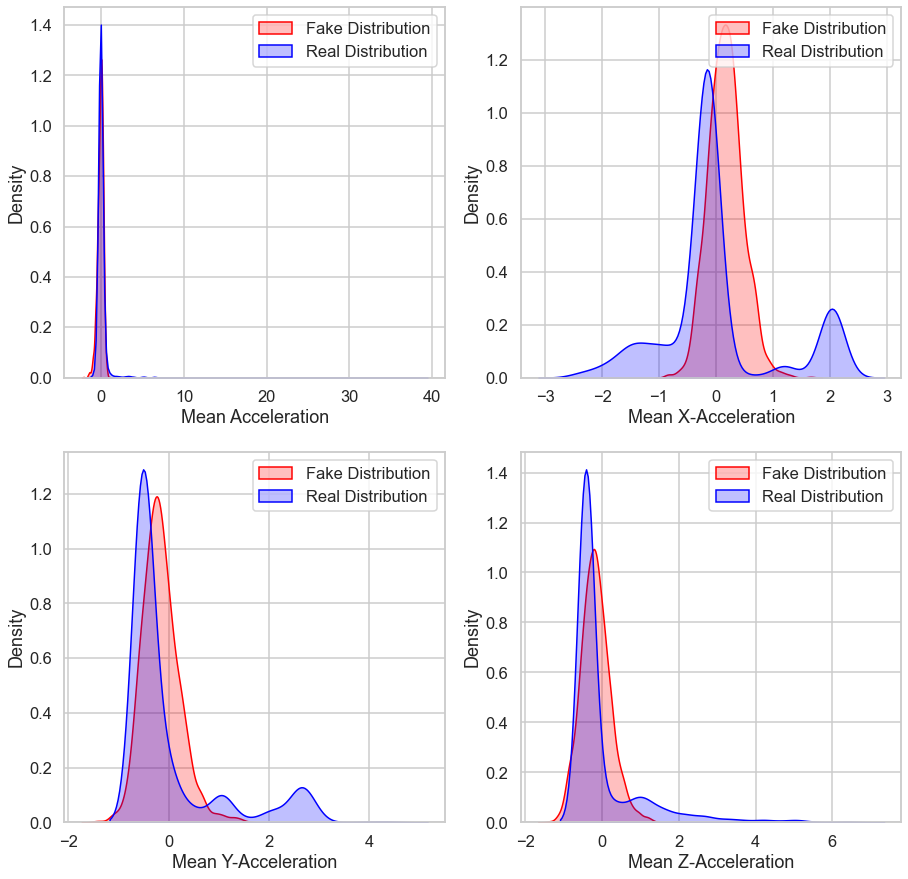

Epoch [1/1000] Training: DISC | Loss D: 0.34666, Loss G: 4.36488 | Acc: 0.86800 | fpR: 0.02800 | P: 0.96465 | R: 0.76400 | F1: 0.85219 | Median W: 0.44463 | Mean W: 0.46342

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.34666, Loss G: 2.62109 | Acc: 0.84200 | fpR: 0.11600 | P: 0.87336 | R: 0.80000 | F1: 0.83457 | Median W: 0.45978 | Mean W: 0.46823
Epoch [3/1000] Training: GEN | Loss D: 0.34666, Loss G: 1.70815 | Acc: 0.79200 | fpR: 0.18000 | P: 0.80932 | R: 0.76400 | F1: 0.78551 | Median W: 0.47679 | Mean W: 0.48289
Epoch [4/1000] Training: GEN | Loss D: 0.34666, Loss G: 1.13982 | Acc: 0.71600 | fpR: 0.33200 | P: 0.69708 | R: 0.76400 | F1: 0.72851 | Median W: 0.50321 | Mean W: 0.49582
Epoch [5/1000] Training: GEN | Loss D: 0.34666, Loss G: 0.92664 | Acc: 0.71000 | fpR: 0.40400 | P: 0.67101 | R: 0.82400 | F1: 0.73918 | Median W: 0.51420 | Mean W: 0.50899
Epoch [6/1000] Training: GEN | Loss D: 0.34666, Loss G: 0.84493 | Acc: 0.65800 | fpR: 0.46

Epoch [48/1000] Training: DISC | Loss D: 0.49221, Loss G: 0.73867 | Acc: 0.66600 | fpR: 0.49600 | P: 0.62538 | R: 0.82800 | F1: 0.71207 | Median W: 0.66454 | Mean W: 0.66864
Epoch [49/1000] Training: DISC | Loss D: 0.48815, Loss G: 0.73867 | Acc: 0.70400 | fpR: 0.38800 | P: 0.67230 | R: 0.79600 | F1: 0.72844 | Median W: 0.65776 | Mean W: 0.66648
Epoch [50/1000] Training: DISC | Loss D: 0.47237, Loss G: 0.73867 | Acc: 0.74400 | fpR: 0.31200 | P: 0.71942 | R: 0.80000 | F1: 0.75708 | Median W: 0.66277 | Mean W: 0.67042
Epoch [51/1000] Training: DISC | Loss D: 0.47429, Loss G: 0.73867 | Acc: 0.77000 | fpR: 0.24400 | P: 0.76265 | R: 0.78400 | F1: 0.77268 | Median W: 0.66644 | Mean W: 0.66680

Pull Generator

Epoch [52/1000] Training: GEN | Loss D: 0.47429, Loss G: 0.86438 | Acc: 0.73600 | fpR: 0.28800 | P: 0.72519 | R: 0.76000 | F1: 0.74169 | Median W: 0.65961 | Mean W: 0.67012
Epoch [53/1000] Training: GEN | Loss D: 0.47429, Loss G: 0.82384 | Acc: 0.74600 | fpR: 0.32000 | P: 0.71731 | R: 0

Epoch [142/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.78745 | Acc: 0.71600 | fpR: 0.34000 | P: 0.69424 | R: 0.77200 | F1: 0.73056 | Median W: 0.70642 | Mean W: 0.92214
Epoch [143/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.81329 | Acc: 0.74400 | fpR: 0.34000 | P: 0.70890 | R: 0.82800 | F1: 0.76334 | Median W: 0.71389 | Mean W: 0.92807
Epoch [144/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.81200 | Acc: 0.73200 | fpR: 0.33200 | P: 0.70567 | R: 0.79600 | F1: 0.74762 | Median W: 0.72485 | Mean W: 0.93285
Epoch [145/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.77932 | Acc: 0.70800 | fpR: 0.36400 | P: 0.68182 | R: 0.78000 | F1: 0.72711 | Median W: 0.71858 | Mean W: 0.93289
Epoch [146/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.77573 | Acc: 0.72400 | fpR: 0.30000 | P: 0.71374 | R: 0.74800 | F1: 0.72997 | Median W: 0.73742 | Mean W: 0.93892
Epoch [147/1000] Training: GEN | Loss D: 0.46298, Loss G: 0.78436 | Acc: 0.72000 | fpR: 0.32000 | P: 0.70370 | R: 0.76000 | F1: 0.

Epoch [236/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.78459 | Acc: 0.73800 | fpR: 0.30400 | P: 0.71956 | R: 0.78000 | F1: 0.74806 | Median W: 1.00423 | Mean W: 1.25078
Epoch [237/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.76241 | Acc: 0.70600 | fpR: 0.34000 | P: 0.68864 | R: 0.75200 | F1: 0.71843 | Median W: 1.03059 | Mean W: 1.26158
Epoch [238/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.76687 | Acc: 0.69200 | fpR: 0.41200 | P: 0.65894 | R: 0.79600 | F1: 0.72052 | Median W: 1.05019 | Mean W: 1.26513
Epoch [239/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.76429 | Acc: 0.72000 | fpR: 0.37600 | P: 0.68456 | R: 0.81600 | F1: 0.74403 | Median W: 1.06037 | Mean W: 1.26863
Epoch [240/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.77887 | Acc: 0.68800 | fpR: 0.39600 | P: 0.66096 | R: 0.77200 | F1: 0.71168 | Median W: 1.07528 | Mean W: 1.27402
Epoch [241/1000] Training: GEN | Loss D: 0.44582, Loss G: 0.74489 | Acc: 0.68000 | fpR: 0.38400 | P: 0.65957 | R: 0.74400 | F1: 0.

Epoch [283/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.86069 | Acc: 0.86800 | fpR: 0.02000 | P: 0.97423 | R: 0.75600 | F1: 0.85086 | Median W: 0.73801 | Mean W: 1.26033
Epoch [284/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.85830 | Acc: 0.89400 | fpR: 0.02000 | P: 0.97585 | R: 0.80800 | F1: 0.88353 | Median W: 0.72897 | Mean W: 1.26003
Epoch [285/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.85566 | Acc: 0.88400 | fpR: 0.01200 | P: 0.98485 | R: 0.78000 | F1: 0.87004 | Median W: 0.74622 | Mean W: 1.26505
Epoch [286/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.84859 | Acc: 0.86000 | fpR: 0.02800 | P: 0.96392 | R: 0.74800 | F1: 0.84185 | Median W: 0.74662 | Mean W: 1.26614
Epoch [287/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.84207 | Acc: 0.86200 | fpR: 0.02400 | P: 0.96891 | R: 0.74800 | F1: 0.84375 | Median W: 0.76120 | Mean W: 1.27002
Epoch [288/1000] Training: GEN | Loss D: 0.31690, Loss G: 0.83271 | Acc: 0.86200 | fpR: 0.02800 | P: 0.96410 | R: 0.75200 | F1: 0.

Epoch [377/1000] Training: GEN | Loss D: 0.46131, Loss G: 0.71631 | Acc: 0.52400 | fpR: 0.70400 | P: 0.51648 | R: 0.75200 | F1: 0.61190 | Median W: 1.16597 | Mean W: 1.68919

Push Generator

Epoch [378/1000] Training: DISC | Loss D: 0.43954, Loss G: 0.71631 | Acc: 0.84600 | fpR: 0.04000 | P: 0.94819 | R: 0.73200 | F1: 0.82569 | Median W: 1.18062 | Mean W: 1.68852
Epoch [379/1000] Training: DISC | Loss D: 0.17708, Loss G: 0.71631 | Acc: 0.90600 | fpR: 0.00000 | P: 1.00000 | R: 0.81200 | F1: 0.89575 | Median W: 1.16984 | Mean W: 1.69776

Pull Generator

Epoch [380/1000] Training: GEN | Loss D: 0.17708, Loss G: 2.41490 | Acc: 0.87800 | fpR: 0.00000 | P: 1.00000 | R: 0.75600 | F1: 0.86056 | Median W: 1.16887 | Mean W: 1.62270
Epoch [381/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.94689 | Acc: 0.88400 | fpR: 0.00800 | P: 0.98980 | R: 0.77600 | F1: 0.86946 | Median W: 1.09156 | Mean W: 1.53757
Epoch [382/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.97095 | Acc: 0.90000 | fpR: 0.0040

Epoch [424/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.83296 | Acc: 0.84000 | fpR: 0.09200 | P: 0.89352 | R: 0.77200 | F1: 0.82783 | Median W: 1.05335 | Mean W: 1.48907
Epoch [425/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.83327 | Acc: 0.82400 | fpR: 0.09200 | P: 0.88942 | R: 0.74000 | F1: 0.80736 | Median W: 1.07558 | Mean W: 1.49459
Epoch [426/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.83092 | Acc: 0.82400 | fpR: 0.08800 | P: 0.89320 | R: 0.73600 | F1: 0.80652 | Median W: 1.07668 | Mean W: 1.48249
Epoch [427/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.80843 | Acc: 0.81400 | fpR: 0.13600 | P: 0.84889 | R: 0.76400 | F1: 0.80371 | Median W: 1.07822 | Mean W: 1.47981
Epoch [428/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.80913 | Acc: 0.78800 | fpR: 0.16800 | P: 0.81579 | R: 0.74400 | F1: 0.77774 | Median W: 1.08430 | Mean W: 1.47894
Epoch [429/1000] Training: GEN | Loss D: 0.17708, Loss G: 0.79475 | Acc: 0.82000 | fpR: 0.14000 | P: 0.84783 | R: 0.78000 | F1: 0.

Epoch [471/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.91966 | Acc: 0.86400 | fpR: 0.03600 | P: 0.95500 | R: 0.76400 | F1: 0.84840 | Median W: 0.87181 | Mean W: 1.19503
Epoch [472/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.89400 | Acc: 0.86600 | fpR: 0.02800 | P: 0.96447 | R: 0.76000 | F1: 0.84962 | Median W: 0.87256 | Mean W: 1.18852
Epoch [473/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.89936 | Acc: 0.85400 | fpR: 0.02400 | P: 0.96825 | R: 0.73200 | F1: 0.83322 | Median W: 0.88946 | Mean W: 1.20694
Epoch [474/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.88552 | Acc: 0.84800 | fpR: 0.04000 | P: 0.94845 | R: 0.73600 | F1: 0.82834 | Median W: 0.88631 | Mean W: 1.20200
Epoch [475/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.88806 | Acc: 0.88000 | fpR: 0.03200 | P: 0.96117 | R: 0.79200 | F1: 0.86793 | Median W: 0.87925 | Mean W: 1.20798
Epoch [476/1000] Training: GEN | Loss D: 0.18759, Loss G: 0.87955 | Acc: 0.86400 | fpR: 0.06400 | P: 0.92523 | R: 0.79200 | F1: 0.

Epoch [565/1000] Training: GEN | Loss D: 0.22946, Loss G: 2.05933 | Acc: 0.86600 | fpR: 0.02000 | P: 0.97409 | R: 0.75200 | F1: 0.84827 | Median W: 0.60510 | Mean W: 1.01183
Epoch [566/1000] Training: GEN | Loss D: 0.22946, Loss G: 1.09776 | Acc: 0.83800 | fpR: 0.04800 | P: 0.93782 | R: 0.72400 | F1: 0.81666 | Median W: 0.64169 | Mean W: 0.96277
Epoch [567/1000] Training: GEN | Loss D: 0.22946, Loss G: 0.88559 | Acc: 0.85000 | fpR: 0.02400 | P: 0.96791 | R: 0.72400 | F1: 0.82789 | Median W: 0.67315 | Mean W: 0.96664
Epoch [568/1000] Training: GEN | Loss D: 0.22946, Loss G: 0.89566 | Acc: 0.84000 | fpR: 0.04000 | P: 0.94737 | R: 0.72000 | F1: 0.81769 | Median W: 0.69780 | Mean W: 0.95774
Epoch [569/1000] Training: GEN | Loss D: 0.22946, Loss G: 0.86205 | Acc: 0.88400 | fpR: 0.01600 | P: 0.98000 | R: 0.78400 | F1: 0.87062 | Median W: 0.69566 | Mean W: 0.94464
Epoch [570/1000] Training: GEN | Loss D: 0.22946, Loss G: 0.85420 | Acc: 0.86400 | fpR: 0.01600 | P: 0.97895 | R: 0.74400 | F1: 0.

Epoch [659/1000] Training: DISC | Loss D: 0.26173, Loss G: 0.40296 | Acc: 0.84000 | fpR: 0.00800 | P: 0.98851 | R: 0.68800 | F1: 0.81084 | Median W: 0.48051 | Mean W: 0.84757
Epoch [660/1000] Training: DISC | Loss D: 0.24868, Loss G: 0.40296 | Acc: 0.84600 | fpR: 0.00400 | P: 0.99429 | R: 0.69600 | F1: 0.81834 | Median W: 0.48792 | Mean W: 0.84660
Epoch [661/1000] Training: DISC | Loss D: 0.24728, Loss G: 0.40296 | Acc: 0.83600 | fpR: 0.00000 | P: 1.00000 | R: 0.67200 | F1: 0.80335 | Median W: 0.48463 | Mean W: 0.84881
Epoch [662/1000] Training: DISC | Loss D: 0.23201, Loss G: 0.40296 | Acc: 0.83400 | fpR: 0.00800 | P: 0.98830 | R: 0.67600 | F1: 0.80237 | Median W: 0.48709 | Mean W: 0.84817
Epoch [663/1000] Training: DISC | Loss D: 0.23075, Loss G: 0.40296 | Acc: 0.83400 | fpR: 0.00800 | P: 0.98830 | R: 0.67600 | F1: 0.80237 | Median W: 0.48671 | Mean W: 0.83484
Epoch [664/1000] Training: DISC | Loss D: 0.21516, Loss G: 0.40296 | Acc: 0.85400 | fpR: 0.00000 | P: 1.00000 | R: 0.70800 | 

Epoch [706/1000] Training: DISC | Loss D: 0.26330, Loss G: 0.55775 | Acc: 0.82000 | fpR: 0.00400 | P: 0.99383 | R: 0.64400 | F1: 0.78108 | Median W: 0.47029 | Mean W: 0.64483
Epoch [707/1000] Training: DISC | Loss D: 0.25714, Loss G: 0.55775 | Acc: 0.83200 | fpR: 0.00000 | P: 1.00000 | R: 0.66400 | F1: 0.79760 | Median W: 0.48568 | Mean W: 0.64848
Epoch [708/1000] Training: DISC | Loss D: 0.21177, Loss G: 0.55775 | Acc: 0.86400 | fpR: 0.00800 | P: 0.98925 | R: 0.73600 | F1: 0.84355 | Median W: 0.48134 | Mean W: 0.63227
Epoch [709/1000] Training: DISC | Loss D: 0.23952, Loss G: 0.55775 | Acc: 0.86200 | fpR: 0.00000 | P: 1.00000 | R: 0.72400 | F1: 0.83942 | Median W: 0.47819 | Mean W: 0.64344
Epoch [710/1000] Training: DISC | Loss D: 0.22586, Loss G: 0.55775 | Acc: 0.86800 | fpR: 0.00400 | P: 0.99462 | R: 0.74000 | F1: 0.84813 | Median W: 0.48450 | Mean W: 0.63714
Epoch [711/1000] Training: DISC | Loss D: 0.22787, Loss G: 0.55775 | Acc: 0.84800 | fpR: 0.00400 | P: 0.99432 | R: 0.70000 | 

Epoch [753/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.70576 | Acc: 0.76000 | fpR: 0.23200 | P: 0.76423 | R: 0.75200 | F1: 0.75756 | Median W: 0.45343 | Mean W: 0.54165
Epoch [754/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.70724 | Acc: 0.73200 | fpR: 0.26400 | P: 0.73387 | R: 0.72800 | F1: 0.73042 | Median W: 0.46766 | Mean W: 0.54638
Epoch [755/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.68990 | Acc: 0.69600 | fpR: 0.32000 | P: 0.68992 | R: 0.71200 | F1: 0.70029 | Median W: 0.46223 | Mean W: 0.54352
Epoch [756/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.67156 | Acc: 0.60800 | fpR: 0.54400 | P: 0.58282 | R: 0.76000 | F1: 0.65923 | Median W: 0.45816 | Mean W: 0.54315
Epoch [757/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.66928 | Acc: 0.59600 | fpR: 0.54800 | P: 0.57453 | R: 0.74000 | F1: 0.64636 | Median W: 0.43635 | Mean W: 0.53817
Epoch [758/1000] Training: GEN | Loss D: 0.18689, Loss G: 0.64385 | Acc: 0.56400 | fpR: 0.63200 | P: 0.54598 | R: 0.76000 | F1: 0.

Epoch [800/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.83954 | Acc: 0.84600 | fpR: 0.08800 | P: 0.89862 | R: 0.78000 | F1: 0.83462 | Median W: 0.43904 | Mean W: 0.48869
Epoch [801/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.83314 | Acc: 0.82200 | fpR: 0.10400 | P: 0.87793 | R: 0.74800 | F1: 0.80728 | Median W: 0.44536 | Mean W: 0.48946
Epoch [802/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.81963 | Acc: 0.83800 | fpR: 0.08400 | P: 0.90047 | R: 0.76000 | F1: 0.82380 | Median W: 0.44406 | Mean W: 0.48861
Epoch [803/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.81238 | Acc: 0.80800 | fpR: 0.11200 | P: 0.86667 | R: 0.72800 | F1: 0.79081 | Median W: 0.45104 | Mean W: 0.49153
Epoch [804/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.83847 | Acc: 0.78800 | fpR: 0.10400 | P: 0.86735 | R: 0.68000 | F1: 0.76184 | Median W: 0.45589 | Mean W: 0.49230
Epoch [805/1000] Training: GEN | Loss D: 0.26462, Loss G: 0.82043 | Acc: 0.82200 | fpR: 0.10400 | P: 0.87793 | R: 0.74800 | F1: 0.

Epoch [847/1000] Training: GEN | Loss D: 0.26381, Loss G: 1.35051 | Acc: 0.84800 | fpR: 0.01600 | P: 0.97802 | R: 0.71200 | F1: 0.82359 | Median W: 0.42903 | Mean W: 0.46976
Epoch [848/1000] Training: GEN | Loss D: 0.26381, Loss G: 1.24557 | Acc: 0.86400 | fpR: 0.01200 | P: 0.98404 | R: 0.74000 | F1: 0.84426 | Median W: 0.42815 | Mean W: 0.47326
Epoch [849/1000] Training: GEN | Loss D: 0.26381, Loss G: 1.15655 | Acc: 0.83000 | fpR: 0.00400 | P: 0.99401 | R: 0.66400 | F1: 0.79568 | Median W: 0.44936 | Mean W: 0.47862
Epoch [850/1000] Training: GEN | Loss D: 0.26381, Loss G: 1.04331 | Acc: 0.86400 | fpR: 0.00000 | P: 1.00000 | R: 0.72800 | F1: 0.84211 | Median W: 0.48063 | Mean W: 0.49711
Epoch [851/1000] Training: GEN | Loss D: 0.26381, Loss G: 1.07927 | Acc: 0.84400 | fpR: 0.00800 | P: 0.98864 | R: 0.69600 | F1: 0.81642 | Median W: 0.47748 | Mean W: 0.50818
Epoch [852/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.92963 | Acc: 0.85800 | fpR: 0.00000 | P: 1.00000 | R: 0.71600 | F1: 0.

Epoch [941/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.84685 | Acc: 0.84800 | fpR: 0.00000 | P: 1.00000 | R: 0.69600 | F1: 0.82027 | Median W: 0.56412 | Mean W: 0.59393
Epoch [942/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.85394 | Acc: 0.84400 | fpR: 0.00400 | P: 0.99425 | R: 0.69200 | F1: 0.81555 | Median W: 0.55612 | Mean W: 0.58621
Epoch [943/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.85808 | Acc: 0.86400 | fpR: 0.00000 | P: 1.00000 | R: 0.72800 | F1: 0.84211 | Median W: 0.56304 | Mean W: 0.58852
Epoch [944/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.84909 | Acc: 0.85400 | fpR: 0.00400 | P: 0.99441 | R: 0.71200 | F1: 0.82935 | Median W: 0.56044 | Mean W: 0.58574
Epoch [945/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.85771 | Acc: 0.87000 | fpR: 0.00400 | P: 0.99465 | R: 0.74400 | F1: 0.85077 | Median W: 0.54681 | Mean W: 0.58168
Epoch [946/1000] Training: GEN | Loss D: 0.26381, Loss G: 0.85807 | Acc: 0.86600 | fpR: 0.00400 | P: 0.99459 | R: 0.73600 | F1: 0.

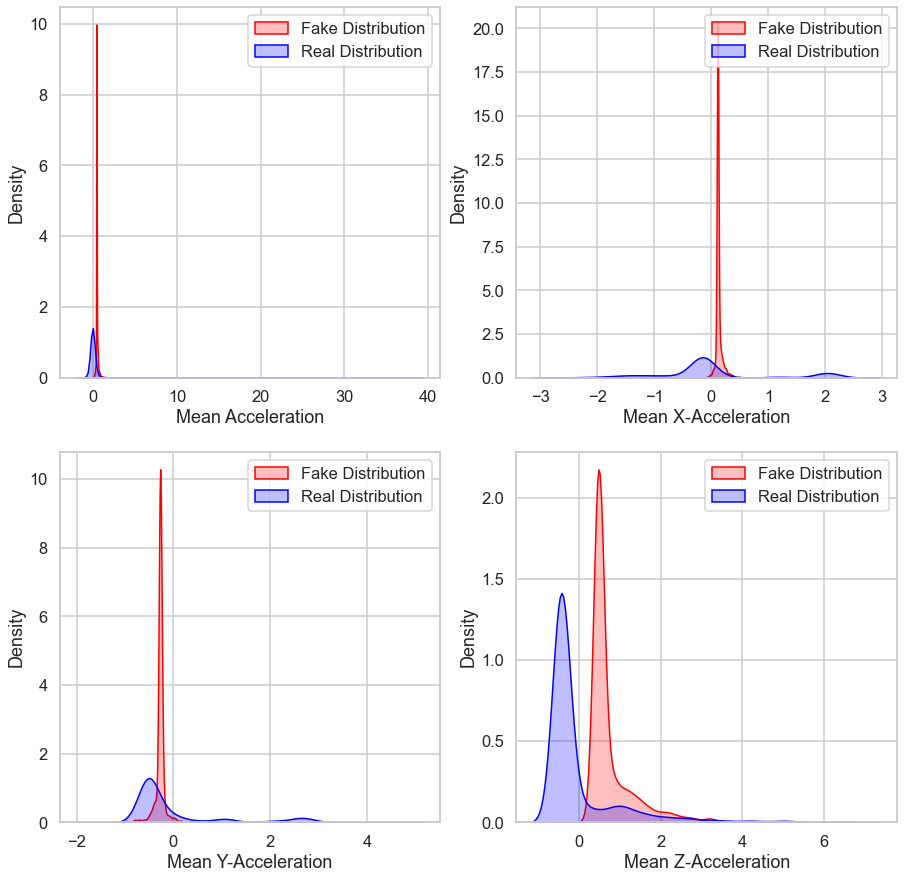

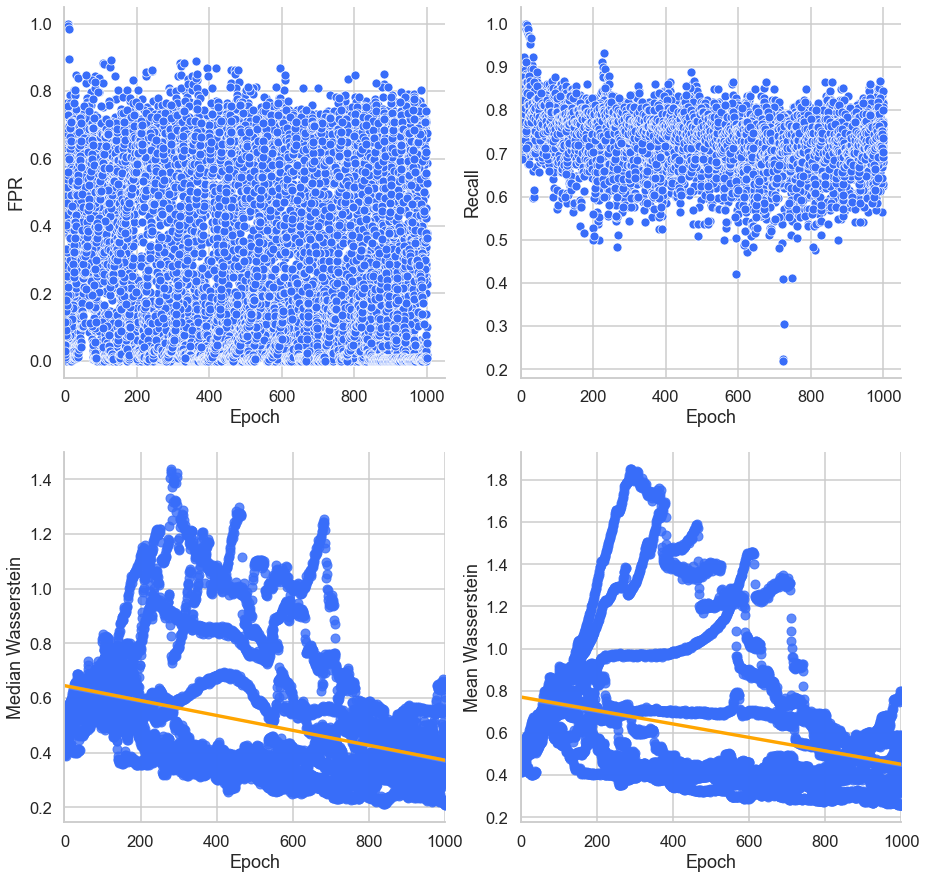

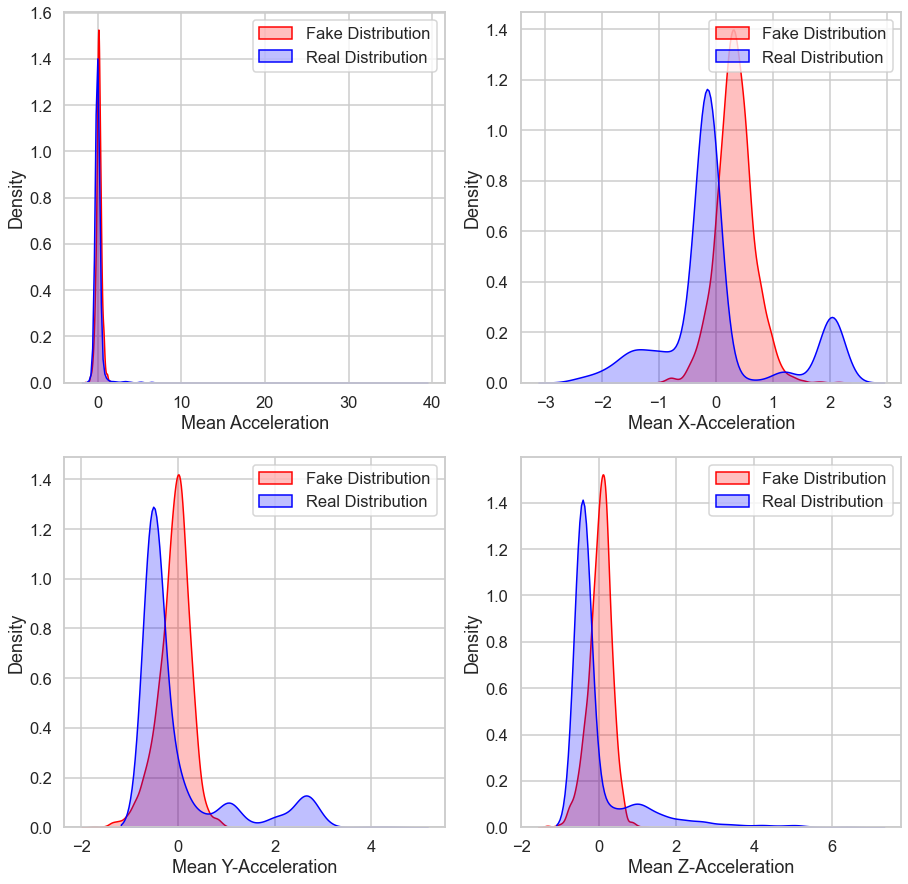

Epoch [1/1000] Training: DISC | Loss D: 0.39182, Loss G: 4.16627 | Acc: 0.83800 | fpR: 0.08400 | P: 0.90047 | R: 0.76000 | F1: 0.82380 | Median W: 0.44510 | Mean W: 0.45807

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.39182, Loss G: 2.92908 | Acc: 0.82000 | fpR: 0.10000 | P: 0.88095 | R: 0.74000 | F1: 0.80385 | Median W: 0.45084 | Mean W: 0.45781
Epoch [3/1000] Training: GEN | Loss D: 0.39182, Loss G: 1.57266 | Acc: 0.78400 | fpR: 0.14800 | P: 0.82870 | R: 0.71600 | F1: 0.76774 | Median W: 0.43718 | Mean W: 0.46135
Epoch [4/1000] Training: GEN | Loss D: 0.39182, Loss G: 1.06594 | Acc: 0.78800 | fpR: 0.18000 | P: 0.80769 | R: 0.75600 | F1: 0.78049 | Median W: 0.44102 | Mean W: 0.46986
Epoch [5/1000] Training: GEN | Loss D: 0.39182, Loss G: 0.79549 | Acc: 0.72600 | fpR: 0.31200 | P: 0.71004 | R: 0.76400 | F1: 0.73553 | Median W: 0.44566 | Mean W: 0.47950
Epoch [6/1000] Training: GEN | Loss D: 0.39182, Loss G: 0.75762 | Acc: 0.73600 | fpR: 0.31

Epoch [48/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.86314 | Acc: 0.77600 | fpR: 0.23200 | P: 0.77165 | R: 0.78400 | F1: 0.77728 | Median W: 0.44686 | Mean W: 0.52373
Epoch [49/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.84672 | Acc: 0.74800 | fpR: 0.21600 | P: 0.76724 | R: 0.71200 | F1: 0.73809 | Median W: 0.44111 | Mean W: 0.52412
Epoch [50/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.78320 | Acc: 0.76200 | fpR: 0.24800 | P: 0.75686 | R: 0.77200 | F1: 0.76386 | Median W: 0.44500 | Mean W: 0.52233
Epoch [51/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.78697 | Acc: 0.77000 | fpR: 0.24800 | P: 0.76062 | R: 0.78800 | F1: 0.77357 | Median W: 0.45399 | Mean W: 0.52948
Epoch [52/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.77501 | Acc: 0.71600 | fpR: 0.27600 | P: 0.71951 | R: 0.70800 | F1: 0.71321 | Median W: 0.45189 | Mean W: 0.52989
Epoch [53/1000] Training: GEN | Loss D: 0.27259, Loss G: 0.75164 | Acc: 0.74600 | fpR: 0.29600 | P: 0.72694 | R: 0.78800 | F1: 0.75574 

Epoch [142/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.90224 | Acc: 0.78800 | fpR: 0.19600 | P: 0.79752 | R: 0.77200 | F1: 0.78405 | Median W: 0.37862 | Mean W: 0.41816
Epoch [143/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.83856 | Acc: 0.68800 | fpR: 0.36800 | P: 0.66906 | R: 0.74400 | F1: 0.70405 | Median W: 0.36956 | Mean W: 0.41445
Epoch [144/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.78835 | Acc: 0.63400 | fpR: 0.49200 | P: 0.60703 | R: 0.76000 | F1: 0.67446 | Median W: 0.37501 | Mean W: 0.41728
Epoch [145/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.74013 | Acc: 0.61400 | fpR: 0.55200 | P: 0.58559 | R: 0.78000 | F1: 0.66846 | Median W: 0.36106 | Mean W: 0.40546
Epoch [146/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.69917 | Acc: 0.60800 | fpR: 0.51600 | P: 0.58654 | R: 0.73200 | F1: 0.65075 | Median W: 0.36322 | Mean W: 0.40630
Epoch [147/1000] Training: GEN | Loss D: 0.34626, Loss G: 0.66262 | Acc: 0.59200 | fpR: 0.56000 | P: 0.57055 | R: 0.74400 | F1: 0.

Epoch [189/1000] Training: DISC | Loss D: 0.66837, Loss G: 0.60763 | Acc: 0.58400 | fpR: 0.60800 | P: 0.56069 | R: 0.77600 | F1: 0.65052 | Median W: 0.29568 | Mean W: 0.36782
Epoch [190/1000] Training: DISC | Loss D: 0.65104, Loss G: 0.60763 | Acc: 0.54200 | fpR: 0.58400 | P: 0.53355 | R: 0.66800 | F1: 0.59276 | Median W: 0.28602 | Mean W: 0.36484
Epoch [191/1000] Training: DISC | Loss D: 0.64800, Loss G: 0.60763 | Acc: 0.58200 | fpR: 0.54400 | P: 0.56550 | R: 0.70800 | F1: 0.62828 | Median W: 0.29468 | Mean W: 0.36727
Epoch [192/1000] Training: DISC | Loss D: 0.61725, Loss G: 0.60763 | Acc: 0.57200 | fpR: 0.56400 | P: 0.55660 | R: 0.70800 | F1: 0.62275 | Median W: 0.28686 | Mean W: 0.36104
Epoch [193/1000] Training: DISC | Loss D: 0.61000, Loss G: 0.60763 | Acc: 0.58400 | fpR: 0.54800 | P: 0.56646 | R: 0.71600 | F1: 0.63202 | Median W: 0.30039 | Mean W: 0.36981
Epoch [194/1000] Training: DISC | Loss D: 0.62199, Loss G: 0.60763 | Acc: 0.61000 | fpR: 0.52400 | P: 0.58675 | R: 0.74400 | 

Epoch [236/1000] Training: DISC | Loss D: 0.52076, Loss G: 0.55639 | Acc: 0.70400 | fpR: 0.13200 | P: 0.80357 | R: 0.54000 | F1: 0.64545 | Median W: 0.27720 | Mean W: 0.33807
Epoch [237/1000] Training: DISC | Loss D: 0.53562, Loss G: 0.55639 | Acc: 0.75400 | fpR: 0.10800 | P: 0.85083 | R: 0.61600 | F1: 0.71413 | Median W: 0.28439 | Mean W: 0.34567
Epoch [238/1000] Training: DISC | Loss D: 0.43531, Loss G: 0.55639 | Acc: 0.79600 | fpR: 0.08800 | P: 0.88542 | R: 0.68000 | F1: 0.76874 | Median W: 0.28562 | Mean W: 0.34187
Epoch [239/1000] Training: DISC | Loss D: 0.41636, Loss G: 0.55639 | Acc: 0.85200 | fpR: 0.07200 | P: 0.91509 | R: 0.77600 | F1: 0.83933 | Median W: 0.26510 | Mean W: 0.34146

Pull Generator

Epoch [240/1000] Training: GEN | Loss D: 0.41636, Loss G: 1.25336 | Acc: 0.75400 | fpR: 0.20800 | P: 0.77489 | R: 0.71600 | F1: 0.74378 | Median W: 0.27224 | Mean W: 0.33943
Epoch [241/1000] Training: GEN | Loss D: 0.41636, Loss G: 0.77385 | Acc: 0.62600 | fpR: 0.46000 | P: 0.60751 

Epoch [283/1000] Training: DISC | Loss D: 0.43624, Loss G: 0.62613 | Acc: 0.82800 | fpR: 0.08400 | P: 0.89806 | R: 0.74000 | F1: 0.81091 | Median W: 0.28550 | Mean W: 0.32547
Epoch [284/1000] Training: DISC | Loss D: 0.41535, Loss G: 0.62613 | Acc: 0.83000 | fpR: 0.07200 | P: 0.91045 | R: 0.73200 | F1: 0.81104 | Median W: 0.27464 | Mean W: 0.32542
Epoch [285/1000] Training: DISC | Loss D: 0.37473, Loss G: 0.62613 | Acc: 0.83400 | fpR: 0.04800 | P: 0.93717 | R: 0.71600 | F1: 0.81130 | Median W: 0.29462 | Mean W: 0.33080
Epoch [286/1000] Training: DISC | Loss D: 0.37783, Loss G: 0.62613 | Acc: 0.82200 | fpR: 0.08000 | P: 0.90050 | R: 0.72400 | F1: 0.80217 | Median W: 0.28984 | Mean W: 0.32908
Epoch [287/1000] Training: DISC | Loss D: 0.34875, Loss G: 0.62613 | Acc: 0.85600 | fpR: 0.05600 | P: 0.93204 | R: 0.76800 | F1: 0.84161 | Median W: 0.28078 | Mean W: 0.32614

Pull Generator

Epoch [288/1000] Training: GEN | Loss D: 0.34875, Loss G: 1.44153 | Acc: 0.78800 | fpR: 0.19200 | P: 0.80000

Epoch [330/1000] Training: DISC | Loss D: 0.66391, Loss G: 0.61267 | Acc: 0.56800 | fpR: 0.60800 | P: 0.55030 | R: 0.74400 | F1: 0.63216 | Median W: 0.25487 | Mean W: 0.33117
Epoch [331/1000] Training: DISC | Loss D: 0.61678, Loss G: 0.61267 | Acc: 0.63400 | fpR: 0.47200 | P: 0.61056 | R: 0.74000 | F1: 0.66858 | Median W: 0.25683 | Mean W: 0.33337
Epoch [332/1000] Training: DISC | Loss D: 0.56692, Loss G: 0.61267 | Acc: 0.72200 | fpR: 0.25600 | P: 0.73222 | R: 0.70000 | F1: 0.71525 | Median W: 0.26499 | Mean W: 0.33558
Epoch [333/1000] Training: DISC | Loss D: 0.53869, Loss G: 0.61267 | Acc: 0.78800 | fpR: 0.10000 | P: 0.87113 | R: 0.67600 | F1: 0.76077 | Median W: 0.25750 | Mean W: 0.33167
Epoch [334/1000] Training: DISC | Loss D: 0.50108, Loss G: 0.61267 | Acc: 0.78800 | fpR: 0.04000 | P: 0.93902 | R: 0.61600 | F1: 0.74348 | Median W: 0.25208 | Mean W: 0.33301
Epoch [335/1000] Training: DISC | Loss D: 0.48346, Loss G: 0.61267 | Acc: 0.79200 | fpR: 0.04800 | P: 0.92941 | R: 0.63200 | 

Epoch [377/1000] Training: DISC | Loss D: 0.73009, Loss G: 0.54010 | Acc: 0.57000 | fpR: 0.67600 | P: 0.54692 | R: 0.81600 | F1: 0.65442 | Median W: 0.27459 | Mean W: 0.33815
Epoch [378/1000] Training: DISC | Loss D: 0.63783, Loss G: 0.54010 | Acc: 0.77200 | fpR: 0.25200 | P: 0.75954 | R: 0.79600 | F1: 0.77684 | Median W: 0.28356 | Mean W: 0.33997

Pull Generator

Epoch [379/1000] Training: GEN | Loss D: 0.63783, Loss G: 0.63432 | Acc: 0.53800 | fpR: 0.71600 | P: 0.52520 | R: 0.79200 | F1: 0.63110 | Median W: 0.26722 | Mean W: 0.33160

Push Generator

Epoch [380/1000] Training: DISC | Loss D: 0.61662, Loss G: 0.63432 | Acc: 0.72400 | fpR: 0.19600 | P: 0.76667 | R: 0.64400 | F1: 0.69950 | Median W: 0.26589 | Mean W: 0.33225
Epoch [381/1000] Training: DISC | Loss D: 0.53866, Loss G: 0.63432 | Acc: 0.73800 | fpR: 0.13200 | P: 0.82162 | R: 0.60800 | F1: 0.69836 | Median W: 0.27461 | Mean W: 0.33946
Epoch [382/1000] Training: DISC | Loss D: 0.50590, Loss G: 0.63432 | Acc: 0.79600 | fpR: 0.0

Epoch [424/1000] Training: GEN | Loss D: 0.33045, Loss G: 1.31331 | Acc: 0.66800 | fpR: 0.45200 | P: 0.63548 | R: 0.78800 | F1: 0.70308 | Median W: 0.28731 | Mean W: 0.33562
Epoch [425/1000] Training: GEN | Loss D: 0.33045, Loss G: 0.71045 | Acc: 0.67800 | fpR: 0.42400 | P: 0.64784 | R: 0.78000 | F1: 0.70731 | Median W: 0.26247 | Mean W: 0.32138
Epoch [426/1000] Training: GEN | Loss D: 0.33045, Loss G: 0.75418 | Acc: 0.58600 | fpR: 0.60800 | P: 0.56196 | R: 0.78000 | F1: 0.65278 | Median W: 0.25569 | Mean W: 0.32304
Epoch [427/1000] Training: GEN | Loss D: 0.33045, Loss G: 0.76370 | Acc: 0.63200 | fpR: 0.52400 | P: 0.60061 | R: 0.78800 | F1: 0.68117 | Median W: 0.24357 | Mean W: 0.32149
Epoch [428/1000] Training: GEN | Loss D: 0.33045, Loss G: 0.72233 | Acc: 0.57600 | fpR: 0.64800 | P: 0.55249 | R: 0.80000 | F1: 0.65311 | Median W: 0.24576 | Mean W: 0.32035
Epoch [429/1000] Training: GEN | Loss D: 0.33045, Loss G: 0.66485 | Acc: 0.57200 | fpR: 0.64000 | P: 0.55056 | R: 0.78400 | F1: 0.

Epoch [471/1000] Training: DISC | Loss D: 0.73606, Loss G: 0.59570 | Acc: 0.54000 | fpR: 0.68000 | P: 0.52778 | R: 0.76000 | F1: 0.62247 | Median W: 0.28932 | Mean W: 0.33478
Epoch [472/1000] Training: DISC | Loss D: 0.66318, Loss G: 0.59570 | Acc: 0.60000 | fpR: 0.60400 | P: 0.57102 | R: 0.80400 | F1: 0.66729 | Median W: 0.29908 | Mean W: 0.33756
Epoch [473/1000] Training: DISC | Loss D: 0.62853, Loss G: 0.59570 | Acc: 0.61800 | fpR: 0.54400 | P: 0.58912 | R: 0.78000 | F1: 0.67077 | Median W: 0.30762 | Mean W: 0.34239
Epoch [474/1000] Training: DISC | Loss D: 0.41836, Loss G: 0.59570 | Acc: 0.78200 | fpR: 0.07600 | P: 0.89385 | R: 0.64000 | F1: 0.74543 | Median W: 0.31516 | Mean W: 0.34390
Epoch [475/1000] Training: DISC | Loss D: 0.38239, Loss G: 0.59570 | Acc: 0.78600 | fpR: 0.09600 | P: 0.87435 | R: 0.66800 | F1: 0.75688 | Median W: 0.30424 | Mean W: 0.33918
Epoch [476/1000] Training: DISC | Loss D: 0.38394, Loss G: 0.59570 | Acc: 0.82200 | fpR: 0.09600 | P: 0.88517 | R: 0.74000 | 

Epoch [518/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.69031 | Acc: 0.61400 | fpR: 0.52400 | P: 0.58934 | R: 0.75200 | F1: 0.66032 | Median W: 0.27940 | Mean W: 0.39504
Epoch [519/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.71294 | Acc: 0.58800 | fpR: 0.59600 | P: 0.56433 | R: 0.77200 | F1: 0.65154 | Median W: 0.27735 | Mean W: 0.39713
Epoch [520/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.65096 | Acc: 0.57400 | fpR: 0.64000 | P: 0.55182 | R: 0.78800 | F1: 0.64861 | Median W: 0.28495 | Mean W: 0.39879
Epoch [521/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.63400 | Acc: 0.54800 | fpR: 0.66400 | P: 0.53371 | R: 0.76000 | F1: 0.62658 | Median W: 0.27715 | Mean W: 0.40600
Epoch [522/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.64197 | Acc: 0.59600 | fpR: 0.59200 | P: 0.56977 | R: 0.78400 | F1: 0.65945 | Median W: 0.29261 | Mean W: 0.41475
Epoch [523/1000] Training: GEN | Loss D: 0.37545, Loss G: 0.64889 | Acc: 0.58000 | fpR: 0.63200 | P: 0.55618 | R: 0.79200 | F1: 0.

Epoch [565/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.60450 | Acc: 0.54000 | fpR: 0.66800 | P: 0.52825 | R: 0.74800 | F1: 0.61872 | Median W: 0.46439 | Mean W: 0.55328
Epoch [566/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.58690 | Acc: 0.54400 | fpR: 0.65600 | P: 0.53143 | R: 0.74400 | F1: 0.61951 | Median W: 0.47428 | Mean W: 0.56157
Epoch [567/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.65717 | Acc: 0.53800 | fpR: 0.62000 | P: 0.52888 | R: 0.69600 | F1: 0.60055 | Median W: 0.46408 | Mean W: 0.56400
Epoch [568/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.63214 | Acc: 0.54600 | fpR: 0.64400 | P: 0.53333 | R: 0.73600 | F1: 0.61800 | Median W: 0.48221 | Mean W: 0.56647
Epoch [569/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.63338 | Acc: 0.53200 | fpR: 0.67200 | P: 0.52273 | R: 0.73600 | F1: 0.61081 | Median W: 0.48498 | Mean W: 0.56506
Epoch [570/1000] Training: GEN | Loss D: 0.57540, Loss G: 0.58429 | Acc: 0.55200 | fpR: 0.64800 | P: 0.53714 | R: 0.75200 | F1: 0.

Epoch [612/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.78146 | Acc: 0.79400 | fpR: 0.14000 | P: 0.83871 | R: 0.72800 | F1: 0.77895 | Median W: 0.65293 | Mean W: 0.68586
Epoch [613/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.78676 | Acc: 0.79200 | fpR: 0.12400 | P: 0.85096 | R: 0.70800 | F1: 0.77243 | Median W: 0.65690 | Mean W: 0.69367
Epoch [614/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.77465 | Acc: 0.80600 | fpR: 0.13200 | P: 0.84932 | R: 0.74400 | F1: 0.79268 | Median W: 0.66688 | Mean W: 0.69893
Epoch [615/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.79122 | Acc: 0.80200 | fpR: 0.14000 | P: 0.84163 | R: 0.74400 | F1: 0.78931 | Median W: 0.67210 | Mean W: 0.70133
Epoch [616/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.77586 | Acc: 0.77200 | fpR: 0.15600 | P: 0.81776 | R: 0.70000 | F1: 0.75381 | Median W: 0.67101 | Mean W: 0.70439
Epoch [617/1000] Training: GEN | Loss D: 0.36414, Loss G: 0.77340 | Acc: 0.79400 | fpR: 0.13200 | P: 0.84507 | R: 0.72000 | F1: 0.

Epoch [706/1000] Training: DISC | Loss D: 0.41841, Loss G: 0.48105 | Acc: 0.80600 | fpR: 0.02800 | P: 0.95808 | R: 0.64000 | F1: 0.76691 | Median W: 0.49284 | Mean W: 0.66653
Epoch [707/1000] Training: DISC | Loss D: 0.40319, Loss G: 0.48105 | Acc: 0.80600 | fpR: 0.04800 | P: 0.93220 | R: 0.66000 | F1: 0.77235 | Median W: 0.49772 | Mean W: 0.66785
Epoch [708/1000] Training: DISC | Loss D: 0.38621, Loss G: 0.48105 | Acc: 0.80400 | fpR: 0.07200 | P: 0.90426 | R: 0.68000 | F1: 0.77577 | Median W: 0.48382 | Mean W: 0.65681
Epoch [709/1000] Training: DISC | Loss D: 0.38797, Loss G: 0.48105 | Acc: 0.87000 | fpR: 0.01600 | P: 0.97927 | R: 0.75600 | F1: 0.85278 | Median W: 0.48976 | Mean W: 0.66835

Pull Generator

Epoch [710/1000] Training: GEN | Loss D: 0.38797, Loss G: 2.74065 | Acc: 0.80400 | fpR: 0.10000 | P: 0.87624 | R: 0.70800 | F1: 0.78269 | Median W: 0.47925 | Mean W: 0.64861
Epoch [711/1000] Training: GEN | Loss D: 0.38797, Loss G: 0.93228 | Acc: 0.76800 | fpR: 0.22400 | P: 0.77236 

Epoch [753/1000] Training: DISC | Loss D: 0.40272, Loss G: 0.59520 | Acc: 0.84000 | fpR: 0.05200 | P: 0.93367 | R: 0.73200 | F1: 0.82014 | Median W: 0.50954 | Mean W: 0.68832
Epoch [754/1000] Training: DISC | Loss D: 0.40253, Loss G: 0.59520 | Acc: 0.83800 | fpR: 0.07200 | P: 0.91220 | R: 0.74800 | F1: 0.82148 | Median W: 0.49075 | Mean W: 0.68054
Epoch [755/1000] Training: DISC | Loss D: 0.38103, Loss G: 0.59520 | Acc: 0.82200 | fpR: 0.04400 | P: 0.93989 | R: 0.68800 | F1: 0.79397 | Median W: 0.50360 | Mean W: 0.67643
Epoch [756/1000] Training: DISC | Loss D: 0.35378, Loss G: 0.59520 | Acc: 0.87600 | fpR: 0.03600 | P: 0.95631 | R: 0.78800 | F1: 0.86354 | Median W: 0.48402 | Mean W: 0.68611

Pull Generator

Epoch [757/1000] Training: GEN | Loss D: 0.35378, Loss G: 2.13736 | Acc: 0.84600 | fpR: 0.06800 | P: 0.91787 | R: 0.76000 | F1: 0.83101 | Median W: 0.48667 | Mean W: 0.66824
Epoch [758/1000] Training: GEN | Loss D: 0.35378, Loss G: 1.04935 | Acc: 0.81800 | fpR: 0.14400 | P: 0.84416 

Epoch [800/1000] Training: DISC | Loss D: 0.61835, Loss G: 0.57832 | Acc: 0.64600 | fpR: 0.46400 | P: 0.61967 | R: 0.75600 | F1: 0.68059 | Median W: 0.52107 | Mean W: 0.60078
Epoch [801/1000] Training: DISC | Loss D: 0.61686, Loss G: 0.57832 | Acc: 0.63600 | fpR: 0.41200 | P: 0.62409 | R: 0.68400 | F1: 0.65217 | Median W: 0.51832 | Mean W: 0.60244
Epoch [802/1000] Training: DISC | Loss D: 0.56215, Loss G: 0.57832 | Acc: 0.73000 | fpR: 0.21600 | P: 0.75785 | R: 0.67600 | F1: 0.71409 | Median W: 0.53508 | Mean W: 0.61646
Epoch [803/1000] Training: DISC | Loss D: 0.47836, Loss G: 0.57832 | Acc: 0.83000 | fpR: 0.05600 | P: 0.92746 | R: 0.71600 | F1: 0.80763 | Median W: 0.51350 | Mean W: 0.59950
Epoch [804/1000] Training: DISC | Loss D: 0.42480, Loss G: 0.57832 | Acc: 0.79800 | fpR: 0.02000 | P: 0.96855 | R: 0.61600 | F1: 0.75258 | Median W: 0.53217 | Mean W: 0.60906
Epoch [805/1000] Training: DISC | Loss D: 0.40764, Loss G: 0.57832 | Acc: 0.82000 | fpR: 0.02400 | P: 0.96512 | R: 0.66400 | 

Epoch [847/1000] Training: DISC | Loss D: 0.69440, Loss G: 0.53562 | Acc: 0.62000 | fpR: 0.47200 | P: 0.60135 | R: 0.71200 | F1: 0.65152 | Median W: 0.51365 | Mean W: 0.53843
Epoch [848/1000] Training: DISC | Loss D: 0.54761, Loss G: 0.53562 | Acc: 0.73000 | fpR: 0.27600 | P: 0.72727 | R: 0.73600 | F1: 0.73111 | Median W: 0.48464 | Mean W: 0.52183
Epoch [849/1000] Training: DISC | Loss D: 0.47366, Loss G: 0.53562 | Acc: 0.78800 | fpR: 0.09600 | P: 0.87500 | R: 0.67200 | F1: 0.75969 | Median W: 0.49138 | Mean W: 0.52804
Epoch [850/1000] Training: DISC | Loss D: 0.43898, Loss G: 0.53562 | Acc: 0.78400 | fpR: 0.07600 | P: 0.89444 | R: 0.64400 | F1: 0.74835 | Median W: 0.48824 | Mean W: 0.51583
Epoch [851/1000] Training: DISC | Loss D: 0.44082, Loss G: 0.53562 | Acc: 0.81200 | fpR: 0.08000 | P: 0.89796 | R: 0.70400 | F1: 0.78875 | Median W: 0.51267 | Mean W: 0.53384
Epoch [852/1000] Training: DISC | Loss D: 0.40472, Loss G: 0.53562 | Acc: 0.83800 | fpR: 0.08400 | P: 0.90047 | R: 0.76000 | 

Epoch [894/1000] Training: DISC | Loss D: 0.61382, Loss G: 0.55379 | Acc: 0.60400 | fpR: 0.55600 | P: 0.57879 | R: 0.76400 | F1: 0.65813 | Median W: 0.44823 | Mean W: 0.51286
Epoch [895/1000] Training: DISC | Loss D: 0.59735, Loss G: 0.55379 | Acc: 0.56800 | fpR: 0.57200 | P: 0.55312 | R: 0.70800 | F1: 0.62056 | Median W: 0.47044 | Mean W: 0.51972
Epoch [896/1000] Training: DISC | Loss D: 0.60533, Loss G: 0.55379 | Acc: 0.61400 | fpR: 0.51200 | P: 0.59105 | R: 0.74000 | F1: 0.65670 | Median W: 0.45443 | Mean W: 0.51062
Epoch [897/1000] Training: DISC | Loss D: 0.58237, Loss G: 0.55379 | Acc: 0.63000 | fpR: 0.49200 | P: 0.60450 | R: 0.75200 | F1: 0.66974 | Median W: 0.44773 | Mean W: 0.51189
Epoch [898/1000] Training: DISC | Loss D: 0.58477, Loss G: 0.55379 | Acc: 0.65400 | fpR: 0.49200 | P: 0.61920 | R: 0.80000 | F1: 0.69759 | Median W: 0.45238 | Mean W: 0.51547
Epoch [899/1000] Training: DISC | Loss D: 0.56753, Loss G: 0.55379 | Acc: 0.65400 | fpR: 0.45200 | P: 0.62706 | R: 0.76000 | 

Epoch [941/1000] Training: GEN | Loss D: 0.50656, Loss G: 0.41654 | Acc: 0.53400 | fpR: 0.68400 | P: 0.52368 | R: 0.75200 | F1: 0.61692 | Median W: 0.47985 | Mean W: 0.55561
Epoch [942/1000] Training: GEN | Loss D: 0.50656, Loss G: 0.42438 | Acc: 0.52400 | fpR: 0.67200 | P: 0.51724 | R: 0.72000 | F1: 0.60152 | Median W: 0.49083 | Mean W: 0.54959
Epoch [943/1000] Training: GEN | Loss D: 0.50656, Loss G: 0.39358 | Acc: 0.52800 | fpR: 0.70400 | P: 0.51913 | R: 0.76000 | F1: 0.61640 | Median W: 0.48956 | Mean W: 0.54573

Push Generator

Epoch [944/1000] Training: DISC | Loss D: 1.04828, Loss G: 0.39358 | Acc: 0.52000 | fpR: 0.72000 | P: 0.51351 | R: 0.76000 | F1: 0.61242 | Median W: 0.49892 | Mean W: 0.55361
Epoch [945/1000] Training: DISC | Loss D: 0.92743, Loss G: 0.39358 | Acc: 0.53800 | fpR: 0.68000 | P: 0.52646 | R: 0.75600 | F1: 0.62021 | Median W: 0.49264 | Mean W: 0.56114
Epoch [946/1000] Training: DISC | Loss D: 0.80016, Loss G: 0.39358 | Acc: 0.56600 | fpR: 0.57600 | P: 0.55140 |

Epoch [988/1000] Training: GEN | Loss D: 0.38369, Loss G: 0.58642 | Acc: 0.50000 | fpR: 0.68400 | P: 0.50000 | R: 0.68400 | F1: 0.57722 | Median W: 0.37854 | Mean W: 0.44373
Epoch [989/1000] Training: GEN | Loss D: 0.38369, Loss G: 0.54910 | Acc: 0.53800 | fpR: 0.64400 | P: 0.52786 | R: 0.72000 | F1: 0.60865 | Median W: 0.35931 | Mean W: 0.44046
Epoch [990/1000] Training: GEN | Loss D: 0.38369, Loss G: 0.56659 | Acc: 0.49400 | fpR: 0.72000 | P: 0.49580 | R: 0.70800 | F1: 0.58271 | Median W: 0.36265 | Mean W: 0.43994

Push Generator

Epoch [991/1000] Training: DISC | Loss D: 0.74575, Loss G: 0.56659 | Acc: 0.52000 | fpR: 0.72000 | P: 0.51351 | R: 0.76000 | F1: 0.61242 | Median W: 0.36688 | Mean W: 0.44326
Epoch [992/1000] Training: DISC | Loss D: 0.76910, Loss G: 0.56659 | Acc: 0.51000 | fpR: 0.67600 | P: 0.50729 | R: 0.69600 | F1: 0.58636 | Median W: 0.37312 | Mean W: 0.44679
Epoch [993/1000] Training: DISC | Loss D: 0.70773, Loss G: 0.56659 | Acc: 0.53600 | fpR: 0.65600 | P: 0.52601 |

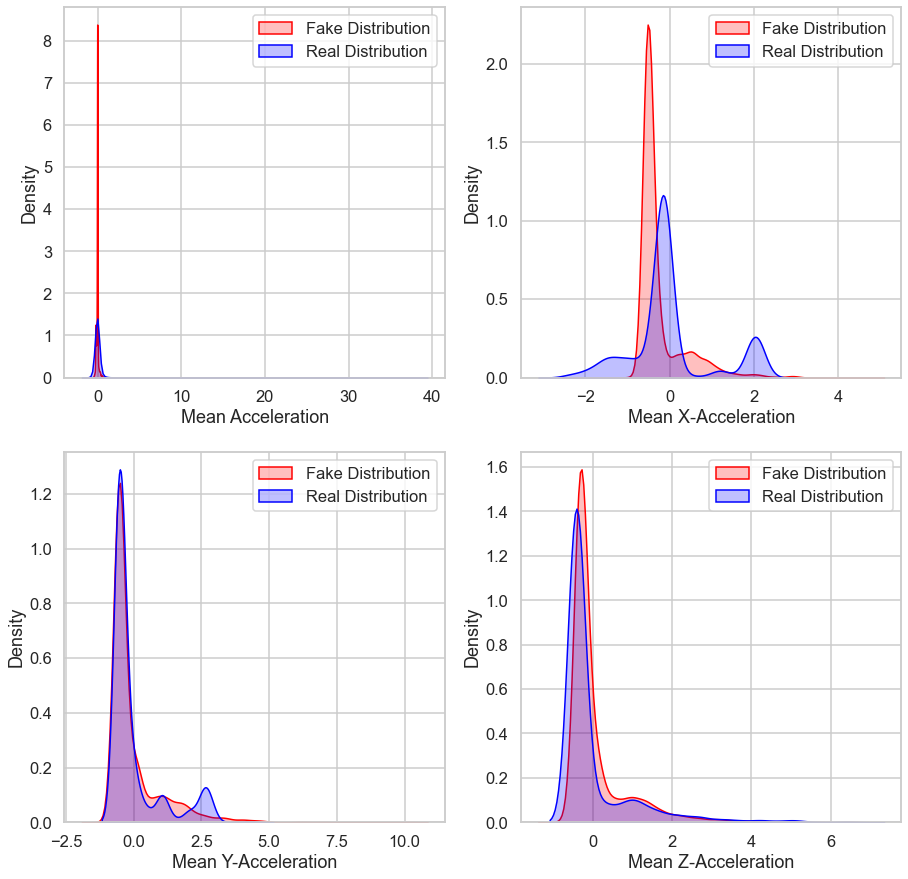

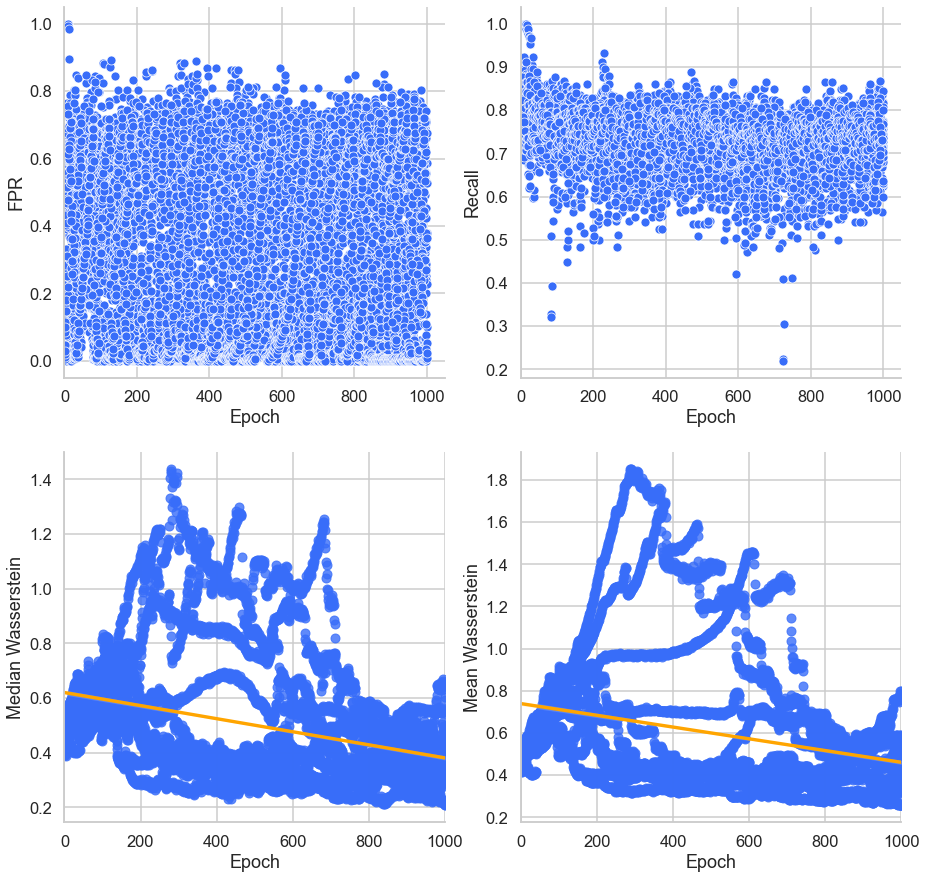

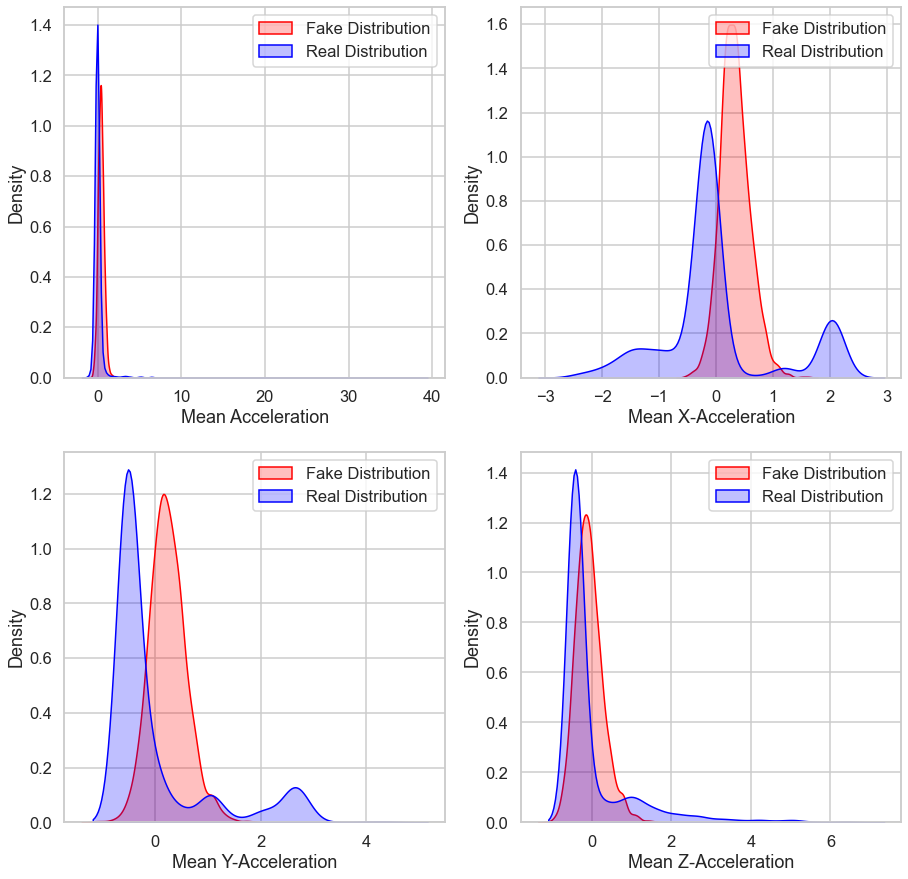

Epoch [1/1000] Training: DISC | Loss D: 0.36242, Loss G: 6.88554 | Acc: 0.86800 | fpR: 0.00000 | P: 1.00000 | R: 0.73600 | F1: 0.84744 | Median W: 0.43281 | Mean W: 0.47874

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.33003, Loss G: 6.88554 | Acc: 0.86400 | fpR: 0.00000 | P: 1.00000 | R: 0.72800 | F1: 0.84211 | Median W: 0.43300 | Mean W: 0.47854
Epoch [3/1000] Training: DISC | Loss D: 0.30130, Loss G: 6.88554 | Acc: 0.87200 | fpR: 0.00000 | P: 1.00000 | R: 0.74400 | F1: 0.85272 | Median W: 0.43759 | Mean W: 0.48081
Epoch [4/1000] Training: DISC | Loss D: 0.28822, Loss G: 6.88554 | Acc: 0.87200 | fpR: 0.00000 | P: 1.00000 | R: 0.74400 | F1: 0.85272 | Median W: 0.43066 | Mean W: 0.47502
Epoch [5/1000] Training: DISC | Loss D: 0.25634, Loss G: 6.88554 | Acc: 0.91200 | fpR: 0.00000 | P: 1.00000 | R: 0.82400 | F1: 0.90301 | Median W: 0.42129 | Mean W: 0.47530

Pull Generator

Epoch [6/1000] Training: GEN | Loss D: 0.25634, Loss G: 5.13965 | Acc: 0.89200 | fpR: 

Epoch [96/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.80184 | Acc: 0.86600 | fpR: 0.04000 | P: 0.95074 | R: 0.77200 | F1: 0.85160 | Median W: 0.57588 | Mean W: 0.70961
Epoch [97/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.79636 | Acc: 0.86400 | fpR: 0.04800 | P: 0.94175 | R: 0.77600 | F1: 0.85038 | Median W: 0.57532 | Mean W: 0.71382
Epoch [98/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.79261 | Acc: 0.84800 | fpR: 0.08400 | P: 0.90278 | R: 0.78000 | F1: 0.83641 | Median W: 0.57655 | Mean W: 0.71950
Epoch [99/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.78687 | Acc: 0.88800 | fpR: 0.03600 | P: 0.95755 | R: 0.81200 | F1: 0.87829 | Median W: 0.56499 | Mean W: 0.71801
Epoch [100/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.79059 | Acc: 0.86800 | fpR: 0.06400 | P: 0.92593 | R: 0.80000 | F1: 0.85787 | Median W: 0.56498 | Mean W: 0.72421
Epoch [101/1000] Training: GEN | Loss D: 0.25634, Loss G: 0.78066 | Acc: 0.84800 | fpR: 0.08000 | P: 0.90654 | R: 0.77600 | F1: 0.8357

Epoch [143/1000] Training: DISC | Loss D: 0.38339, Loss G: 0.46437 | Acc: 0.83600 | fpR: 0.05600 | P: 0.92857 | R: 0.72800 | F1: 0.81565 | Median W: 0.49199 | Mean W: 0.86773
Epoch [144/1000] Training: DISC | Loss D: 0.33939, Loss G: 0.46437 | Acc: 0.87200 | fpR: 0.03200 | P: 0.96040 | R: 0.77600 | F1: 0.85791 | Median W: 0.49378 | Mean W: 0.87351

Pull Generator

Epoch [145/1000] Training: GEN | Loss D: 0.33939, Loss G: 3.12745 | Acc: 0.83200 | fpR: 0.06400 | P: 0.91919 | R: 0.72800 | F1: 0.81201 | Median W: 0.45691 | Mean W: 0.83694
Epoch [146/1000] Training: GEN | Loss D: 0.33939, Loss G: 1.54035 | Acc: 0.86800 | fpR: 0.01600 | P: 0.97917 | R: 0.75200 | F1: 0.85019 | Median W: 0.43982 | Mean W: 0.78818
Epoch [147/1000] Training: GEN | Loss D: 0.33939, Loss G: 1.26238 | Acc: 0.88600 | fpR: 0.01600 | P: 0.98010 | R: 0.78800 | F1: 0.87312 | Median W: 0.45599 | Mean W: 0.75647
Epoch [148/1000] Training: GEN | Loss D: 0.33939, Loss G: 1.16474 | Acc: 0.86400 | fpR: 0.02400 | P: 0.96907 | 

Epoch [190/1000] Training: GEN | Loss D: 0.31479, Loss G: 3.06448 | Acc: 0.84200 | fpR: 0.06800 | P: 0.91707 | R: 0.75200 | F1: 0.82588 | Median W: 0.42821 | Mean W: 0.78355
Epoch [191/1000] Training: GEN | Loss D: 0.31479, Loss G: 1.84331 | Acc: 0.83200 | fpR: 0.07200 | P: 0.91089 | R: 0.73600 | F1: 0.81367 | Median W: 0.42385 | Mean W: 0.74623
Epoch [192/1000] Training: GEN | Loss D: 0.31479, Loss G: 1.20730 | Acc: 0.81000 | fpR: 0.12400 | P: 0.85714 | R: 0.74400 | F1: 0.79608 | Median W: 0.47305 | Mean W: 0.72157
Epoch [193/1000] Training: GEN | Loss D: 0.31479, Loss G: 0.91433 | Acc: 0.73600 | fpR: 0.30400 | P: 0.71852 | R: 0.77600 | F1: 0.74565 | Median W: 0.45069 | Mean W: 0.68232
Epoch [194/1000] Training: GEN | Loss D: 0.31479, Loss G: 0.83710 | Acc: 0.64400 | fpR: 0.44800 | P: 0.62162 | R: 0.73600 | F1: 0.67350 | Median W: 0.45759 | Mean W: 0.67551
Epoch [195/1000] Training: GEN | Loss D: 0.31479, Loss G: 0.79228 | Acc: 0.61800 | fpR: 0.55200 | P: 0.58806 | R: 0.78800 | F1: 0.

Epoch [237/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.65837 | Acc: 0.59400 | fpR: 0.52400 | P: 0.57605 | R: 0.71200 | F1: 0.63636 | Median W: 0.43680 | Mean W: 0.62442
Epoch [238/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.69787 | Acc: 0.57600 | fpR: 0.59200 | P: 0.55689 | R: 0.74400 | F1: 0.63650 | Median W: 0.42053 | Mean W: 0.61966
Epoch [239/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.65742 | Acc: 0.58200 | fpR: 0.57200 | P: 0.56269 | R: 0.73600 | F1: 0.63729 | Median W: 0.43903 | Mean W: 0.63302
Epoch [240/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.66565 | Acc: 0.62200 | fpR: 0.54000 | P: 0.59215 | R: 0.78400 | F1: 0.67421 | Median W: 0.42889 | Mean W: 0.63285
Epoch [241/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.69113 | Acc: 0.59600 | fpR: 0.58400 | P: 0.57059 | R: 0.77600 | F1: 0.65714 | Median W: 0.42475 | Mean W: 0.62037
Epoch [242/1000] Training: GEN | Loss D: 0.32888, Loss G: 0.65030 | Acc: 0.62000 | fpR: 0.56000 | P: 0.58824 | R: 0.80000 | F1: 0.

Epoch [284/1000] Training: DISC | Loss D: 0.32729, Loss G: 0.47191 | Acc: 0.88200 | fpR: 0.00400 | P: 0.99482 | R: 0.76800 | F1: 0.86633 | Median W: 0.46316 | Mean W: 0.70055

Pull Generator

Epoch [285/1000] Training: GEN | Loss D: 0.32729, Loss G: 5.81288 | Acc: 0.85800 | fpR: 0.03200 | P: 0.95897 | R: 0.74800 | F1: 0.83996 | Median W: 0.43891 | Mean W: 0.69150
Epoch [286/1000] Training: GEN | Loss D: 0.32729, Loss G: 1.38894 | Acc: 0.81800 | fpR: 0.13200 | P: 0.85333 | R: 0.76800 | F1: 0.80792 | Median W: 0.40794 | Mean W: 0.63638
Epoch [287/1000] Training: GEN | Loss D: 0.32729, Loss G: 1.00936 | Acc: 0.80000 | fpR: 0.12800 | P: 0.85047 | R: 0.72800 | F1: 0.78399 | Median W: 0.42549 | Mean W: 0.62239
Epoch [288/1000] Training: GEN | Loss D: 0.32729, Loss G: 0.99297 | Acc: 0.81000 | fpR: 0.10400 | P: 0.87440 | R: 0.72400 | F1: 0.79163 | Median W: 0.41338 | Mean W: 0.60058
Epoch [289/1000] Training: GEN | Loss D: 0.32729, Loss G: 1.01113 | Acc: 0.81200 | fpR: 0.10400 | P: 0.87500 | R

Epoch [331/1000] Training: DISC | Loss D: 0.55930, Loss G: 0.52136 | Acc: 0.78400 | fpR: 0.17600 | P: 0.80870 | R: 0.74400 | F1: 0.77450 | Median W: 0.43424 | Mean W: 0.65404
Epoch [332/1000] Training: DISC | Loss D: 0.51814, Loss G: 0.52136 | Acc: 0.84800 | fpR: 0.04800 | P: 0.93939 | R: 0.74400 | F1: 0.82986 | Median W: 0.45471 | Mean W: 0.68199
Epoch [333/1000] Training: DISC | Loss D: 0.37435, Loss G: 0.52136 | Acc: 0.85200 | fpR: 0.00800 | P: 0.98889 | R: 0.71200 | F1: 0.82742 | Median W: 0.45420 | Mean W: 0.66792
Epoch [334/1000] Training: DISC | Loss D: 0.35963, Loss G: 0.52136 | Acc: 0.86200 | fpR: 0.00000 | P: 1.00000 | R: 0.72400 | F1: 0.83942 | Median W: 0.43996 | Mean W: 0.65599
Epoch [335/1000] Training: DISC | Loss D: 0.35238, Loss G: 0.52136 | Acc: 0.83400 | fpR: 0.00400 | P: 0.99408 | R: 0.67200 | F1: 0.80143 | Median W: 0.45236 | Mean W: 0.67804
Epoch [336/1000] Training: DISC | Loss D: 0.32960, Loss G: 0.52136 | Acc: 0.83600 | fpR: 0.01200 | P: 0.98276 | R: 0.68400 | 

Epoch [378/1000] Training: GEN | Loss D: 0.26751, Loss G: 0.53601 | Acc: 0.50800 | fpR: 0.70000 | P: 0.50565 | R: 0.71600 | F1: 0.59223 | Median W: 0.42113 | Mean W: 0.65576

Push Generator

Epoch [379/1000] Training: DISC | Loss D: 0.76611, Loss G: 0.53601 | Acc: 0.52600 | fpR: 0.67200 | P: 0.51862 | R: 0.72400 | F1: 0.60385 | Median W: 0.40132 | Mean W: 0.63512
Epoch [380/1000] Training: DISC | Loss D: 0.60359, Loss G: 0.53601 | Acc: 0.67800 | fpR: 0.38000 | P: 0.65950 | R: 0.73600 | F1: 0.69515 | Median W: 0.44295 | Mean W: 0.66058
Epoch [381/1000] Training: DISC | Loss D: 0.40453, Loss G: 0.53601 | Acc: 0.83200 | fpR: 0.02400 | P: 0.96629 | R: 0.68800 | F1: 0.80325 | Median W: 0.43396 | Mean W: 0.64740
Epoch [382/1000] Training: DISC | Loss D: 0.37316, Loss G: 0.53601 | Acc: 0.82000 | fpR: 0.00800 | P: 0.98780 | R: 0.64800 | F1: 0.78213 | Median W: 0.42960 | Mean W: 0.64542
Epoch [383/1000] Training: DISC | Loss D: 0.35556, Loss G: 0.53601 | Acc: 0.83400 | fpR: 0.00800 | P: 0.98830

Epoch [425/1000] Training: DISC | Loss D: 0.39154, Loss G: 0.58487 | Acc: 0.85400 | fpR: 0.00400 | P: 0.99441 | R: 0.71200 | F1: 0.82935 | Median W: 0.35456 | Mean W: 0.61712
Epoch [426/1000] Training: DISC | Loss D: 0.35751, Loss G: 0.58487 | Acc: 0.83800 | fpR: 0.00400 | P: 0.99415 | R: 0.68000 | F1: 0.80712 | Median W: 0.35672 | Mean W: 0.62179
Epoch [427/1000] Training: DISC | Loss D: 0.31510, Loss G: 0.58487 | Acc: 0.84800 | fpR: 0.01200 | P: 0.98333 | R: 0.70800 | F1: 0.82277 | Median W: 0.34850 | Mean W: 0.60723
Epoch [428/1000] Training: DISC | Loss D: 0.31643, Loss G: 0.58487 | Acc: 0.85000 | fpR: 0.00800 | P: 0.98883 | R: 0.70800 | F1: 0.82469 | Median W: 0.35590 | Mean W: 0.62244
Epoch [429/1000] Training: DISC | Loss D: 0.29290, Loss G: 0.58487 | Acc: 0.86400 | fpR: 0.01200 | P: 0.98404 | R: 0.74000 | F1: 0.84426 | Median W: 0.35092 | Mean W: 0.62051
Epoch [430/1000] Training: DISC | Loss D: 0.27908, Loss G: 0.58487 | Acc: 0.87400 | fpR: 0.00400 | P: 0.99471 | R: 0.75200 | 

Epoch [472/1000] Training: GEN | Loss D: 0.39372, Loss G: 0.55237 | Acc: 0.53200 | fpR: 0.65600 | P: 0.52326 | R: 0.72000 | F1: 0.60557 | Median W: 0.45513 | Mean W: 0.68764
Epoch [473/1000] Training: GEN | Loss D: 0.39372, Loss G: 0.53105 | Acc: 0.51400 | fpR: 0.70800 | P: 0.50970 | R: 0.73600 | F1: 0.60181 | Median W: 0.46511 | Mean W: 0.69504

Push Generator

Epoch [474/1000] Training: DISC | Loss D: 0.68690, Loss G: 0.53105 | Acc: 0.53800 | fpR: 0.62800 | P: 0.52853 | R: 0.70400 | F1: 0.60328 | Median W: 0.46427 | Mean W: 0.68928
Epoch [475/1000] Training: DISC | Loss D: 0.61352, Loss G: 0.53105 | Acc: 0.75400 | fpR: 0.17600 | P: 0.79535 | R: 0.68400 | F1: 0.73499 | Median W: 0.46498 | Mean W: 0.69595
Epoch [476/1000] Training: DISC | Loss D: 0.34344, Loss G: 0.53105 | Acc: 0.84600 | fpR: 0.02800 | P: 0.96257 | R: 0.72000 | F1: 0.82331 | Median W: 0.46404 | Mean W: 0.68288
Epoch [477/1000] Training: DISC | Loss D: 0.38562, Loss G: 0.53105 | Acc: 0.82600 | fpR: 0.01200 | P: 0.98225 

Epoch [519/1000] Training: DISC | Loss D: 0.38864, Loss G: 0.53278 | Acc: 0.81200 | fpR: 0.08800 | P: 0.89000 | R: 0.71200 | F1: 0.79062 | Median W: 0.52396 | Mean W: 0.66532
Epoch [520/1000] Training: DISC | Loss D: 0.31839, Loss G: 0.53278 | Acc: 0.84600 | fpR: 0.00400 | P: 0.99429 | R: 0.69600 | F1: 0.81834 | Median W: 0.51612 | Mean W: 0.66516
Epoch [521/1000] Training: DISC | Loss D: 0.31787, Loss G: 0.53278 | Acc: 0.85400 | fpR: 0.00800 | P: 0.98895 | R: 0.71600 | F1: 0.83014 | Median W: 0.51600 | Mean W: 0.66725
Epoch [522/1000] Training: DISC | Loss D: 0.25952, Loss G: 0.53278 | Acc: 0.87400 | fpR: 0.02000 | P: 0.97462 | R: 0.76800 | F1: 0.85857 | Median W: 0.50965 | Mean W: 0.66130

Pull Generator

Epoch [523/1000] Training: GEN | Loss D: 0.25952, Loss G: 2.84133 | Acc: 0.83000 | fpR: 0.08400 | P: 0.89855 | R: 0.74400 | F1: 0.81351 | Median W: 0.52801 | Mean W: 0.66625
Epoch [524/1000] Training: GEN | Loss D: 0.25952, Loss G: 0.68952 | Acc: 0.57800 | fpR: 0.57200 | P: 0.56000 

Epoch [566/1000] Training: DISC | Loss D: 0.66405, Loss G: 0.52272 | Acc: 0.59400 | fpR: 0.58000 | P: 0.56973 | R: 0.76800 | F1: 0.65369 | Median W: 0.53881 | Mean W: 0.62498
Epoch [567/1000] Training: DISC | Loss D: 0.47132, Loss G: 0.52272 | Acc: 0.81400 | fpR: 0.10800 | P: 0.87204 | R: 0.73600 | F1: 0.79777 | Median W: 0.53873 | Mean W: 0.62548
Epoch [568/1000] Training: DISC | Loss D: 0.38373, Loss G: 0.52272 | Acc: 0.81400 | fpR: 0.11200 | P: 0.86854 | R: 0.74000 | F1: 0.79864 | Median W: 0.53389 | Mean W: 0.62276
Epoch [569/1000] Training: DISC | Loss D: 0.32385, Loss G: 0.52272 | Acc: 0.84200 | fpR: 0.07600 | P: 0.90909 | R: 0.76000 | F1: 0.82739 | Median W: 0.52364 | Mean W: 0.62125

Pull Generator

Epoch [570/1000] Training: GEN | Loss D: 0.32385, Loss G: 2.09277 | Acc: 0.81400 | fpR: 0.07600 | P: 0.90256 | R: 0.70400 | F1: 0.79052 | Median W: 0.51421 | Mean W: 0.61529
Epoch [571/1000] Training: GEN | Loss D: 0.32385, Loss G: 1.25804 | Acc: 0.82200 | fpR: 0.10800 | P: 0.87442 

Epoch [613/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.76261 | Acc: 0.68200 | fpR: 0.34800 | P: 0.67170 | R: 0.71200 | F1: 0.69076 | Median W: 0.39773 | Mean W: 0.55275
Epoch [614/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.74176 | Acc: 0.64000 | fpR: 0.42000 | P: 0.62500 | R: 0.70000 | F1: 0.65988 | Median W: 0.40106 | Mean W: 0.55369
Epoch [615/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.74936 | Acc: 0.66400 | fpR: 0.40000 | P: 0.64539 | R: 0.72800 | F1: 0.68371 | Median W: 0.42561 | Mean W: 0.56922
Epoch [616/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.71620 | Acc: 0.67600 | fpR: 0.38800 | P: 0.65603 | R: 0.74000 | F1: 0.69499 | Median W: 0.42600 | Mean W: 0.56261
Epoch [617/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.73699 | Acc: 0.64400 | fpR: 0.42000 | P: 0.62766 | R: 0.70800 | F1: 0.66492 | Median W: 0.40924 | Mean W: 0.55859
Epoch [618/1000] Training: GEN | Loss D: 0.32385, Loss G: 0.74633 | Acc: 0.57400 | fpR: 0.48400 | P: 0.56631 | R: 0.63200 | F1: 0.

Epoch [660/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.60853 | Acc: 0.54200 | fpR: 0.64400 | P: 0.53061 | R: 0.72800 | F1: 0.61334 | Median W: 0.57146 | Mean W: 0.68257
Epoch [661/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.60603 | Acc: 0.53800 | fpR: 0.62800 | P: 0.52853 | R: 0.70400 | F1: 0.60328 | Median W: 0.57557 | Mean W: 0.68462
Epoch [662/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.60540 | Acc: 0.50800 | fpR: 0.62800 | P: 0.50629 | R: 0.64400 | F1: 0.56641 | Median W: 0.57872 | Mean W: 0.69099
Epoch [663/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.61020 | Acc: 0.53400 | fpR: 0.65200 | P: 0.52478 | R: 0.72000 | F1: 0.60660 | Median W: 0.58211 | Mean W: 0.68866
Epoch [664/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.59185 | Acc: 0.52000 | fpR: 0.66400 | P: 0.51462 | R: 0.70400 | F1: 0.59411 | Median W: 0.58763 | Mean W: 0.68950
Epoch [665/1000] Training: GEN | Loss D: 0.37444, Loss G: 0.56238 | Acc: 0.52200 | fpR: 0.65200 | P: 0.51632 | R: 0.69600 | F1: 0.

Epoch [707/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.82900 | Acc: 0.85600 | fpR: 0.01600 | P: 0.97849 | R: 0.72800 | F1: 0.83437 | Median W: 0.68406 | Mean W: 0.78275
Epoch [708/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.83220 | Acc: 0.86600 | fpR: 0.01200 | P: 0.98413 | R: 0.74400 | F1: 0.84689 | Median W: 0.69250 | Mean W: 0.79570
Epoch [709/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.82520 | Acc: 0.87200 | fpR: 0.00400 | P: 0.99468 | R: 0.74800 | F1: 0.85339 | Median W: 0.68430 | Mean W: 0.78917
Epoch [710/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.83329 | Acc: 0.88600 | fpR: 0.00400 | P: 0.99487 | R: 0.77600 | F1: 0.87142 | Median W: 0.67038 | Mean W: 0.78760
Epoch [711/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.82548 | Acc: 0.87600 | fpR: 0.00800 | P: 0.98958 | R: 0.76000 | F1: 0.85924 | Median W: 0.68878 | Mean W: 0.79363
Epoch [712/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.81954 | Acc: 0.84600 | fpR: 0.00400 | P: 0.99429 | R: 0.69600 | F1: 0.

Epoch [801/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.77974 | Acc: 0.82800 | fpR: 0.07200 | P: 0.91000 | R: 0.72800 | F1: 0.80840 | Median W: 0.81039 | Mean W: 0.95995
Epoch [802/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.78649 | Acc: 0.88200 | fpR: 0.04400 | P: 0.94836 | R: 0.80800 | F1: 0.87207 | Median W: 0.81736 | Mean W: 0.96069
Epoch [803/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.77500 | Acc: 0.86600 | fpR: 0.07600 | P: 0.91403 | R: 0.80800 | F1: 0.85725 | Median W: 0.82403 | Mean W: 0.96027
Epoch [804/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.78643 | Acc: 0.83200 | fpR: 0.06400 | P: 0.91919 | R: 0.72800 | F1: 0.81201 | Median W: 0.83850 | Mean W: 0.96517
Epoch [805/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.78414 | Acc: 0.86600 | fpR: 0.08000 | P: 0.91031 | R: 0.81200 | F1: 0.85785 | Median W: 0.83955 | Mean W: 0.95707
Epoch [806/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.79703 | Acc: 0.85400 | fpR: 0.03200 | P: 0.95855 | R: 0.74000 | F1: 0.

Epoch [895/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.74203 | Acc: 0.73600 | fpR: 0.26800 | P: 0.73413 | R: 0.74000 | F1: 0.73655 | Median W: 1.02552 | Mean W: 1.29239
Epoch [896/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.74421 | Acc: 0.76400 | fpR: 0.26400 | P: 0.75000 | R: 0.79200 | F1: 0.76993 | Median W: 1.03781 | Mean W: 1.30601
Epoch [897/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.75135 | Acc: 0.76000 | fpR: 0.25200 | P: 0.75391 | R: 0.77200 | F1: 0.76235 | Median W: 1.03711 | Mean W: 1.30699
Epoch [898/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.75502 | Acc: 0.73200 | fpR: 0.28000 | P: 0.72656 | R: 0.74400 | F1: 0.73468 | Median W: 1.03726 | Mean W: 1.31946
Epoch [899/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.76293 | Acc: 0.70400 | fpR: 0.30400 | P: 0.70079 | R: 0.71200 | F1: 0.70585 | Median W: 1.04319 | Mean W: 1.32371
Epoch [900/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.74872 | Acc: 0.72800 | fpR: 0.31600 | P: 0.70956 | R: 0.77200 | F1: 0.

Epoch [989/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.69208 | Acc: 0.62400 | fpR: 0.52800 | P: 0.59509 | R: 0.77600 | F1: 0.67312 | Median W: 1.70437 | Mean W: 2.06670
Epoch [990/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.69834 | Acc: 0.61200 | fpR: 0.55200 | P: 0.58434 | R: 0.77600 | F1: 0.66618 | Median W: 1.69375 | Mean W: 2.06997
Epoch [991/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.69660 | Acc: 0.63800 | fpR: 0.51200 | P: 0.60615 | R: 0.78800 | F1: 0.68473 | Median W: 1.70979 | Mean W: 2.09050
Epoch [992/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.69334 | Acc: 0.60200 | fpR: 0.49600 | P: 0.58528 | R: 0.70000 | F1: 0.63703 | Median W: 1.72434 | Mean W: 2.10866
Epoch [993/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.68699 | Acc: 0.60600 | fpR: 0.50800 | P: 0.58632 | R: 0.72000 | F1: 0.64583 | Median W: 1.70140 | Mean W: 2.09803
Epoch [994/1000] Training: GEN | Loss D: 0.27879, Loss G: 0.69829 | Acc: 0.62600 | fpR: 0.51200 | P: 0.59875 | R: 0.76400 | F1: 0.

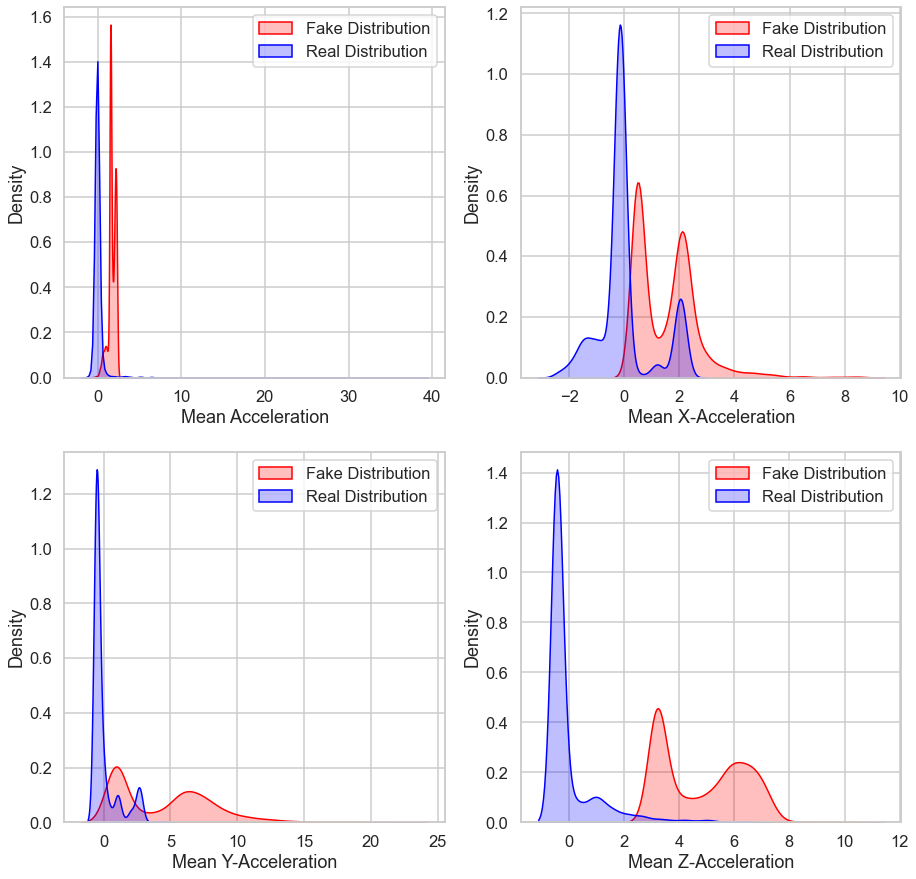

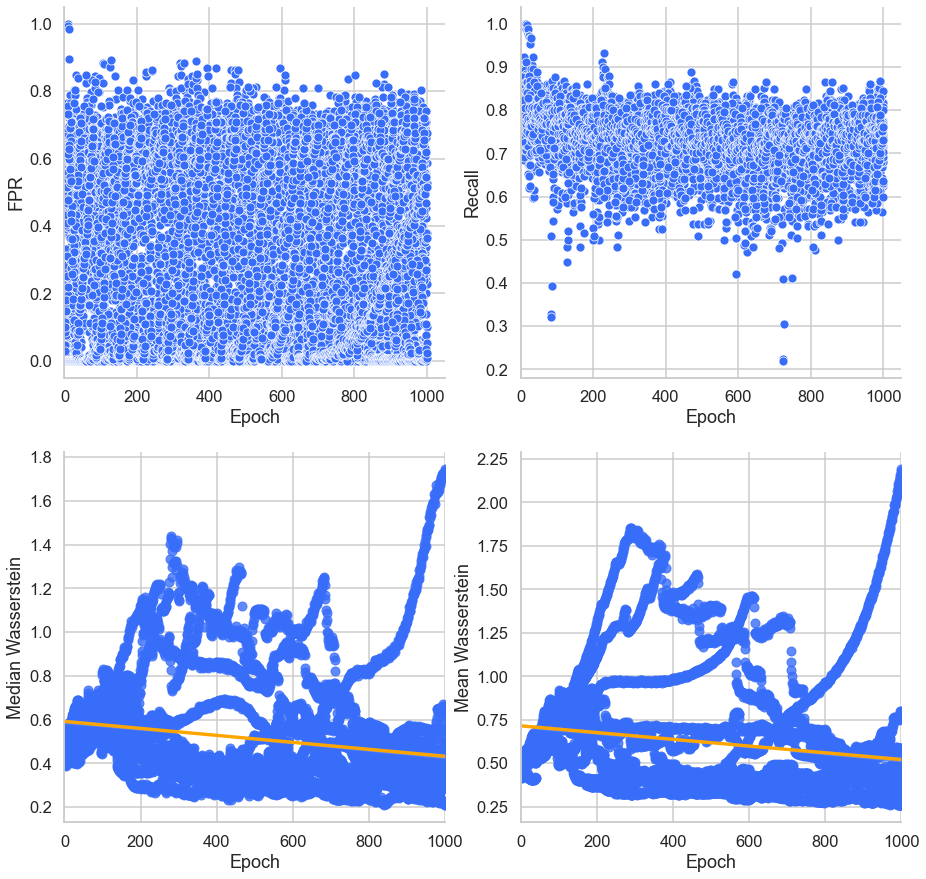

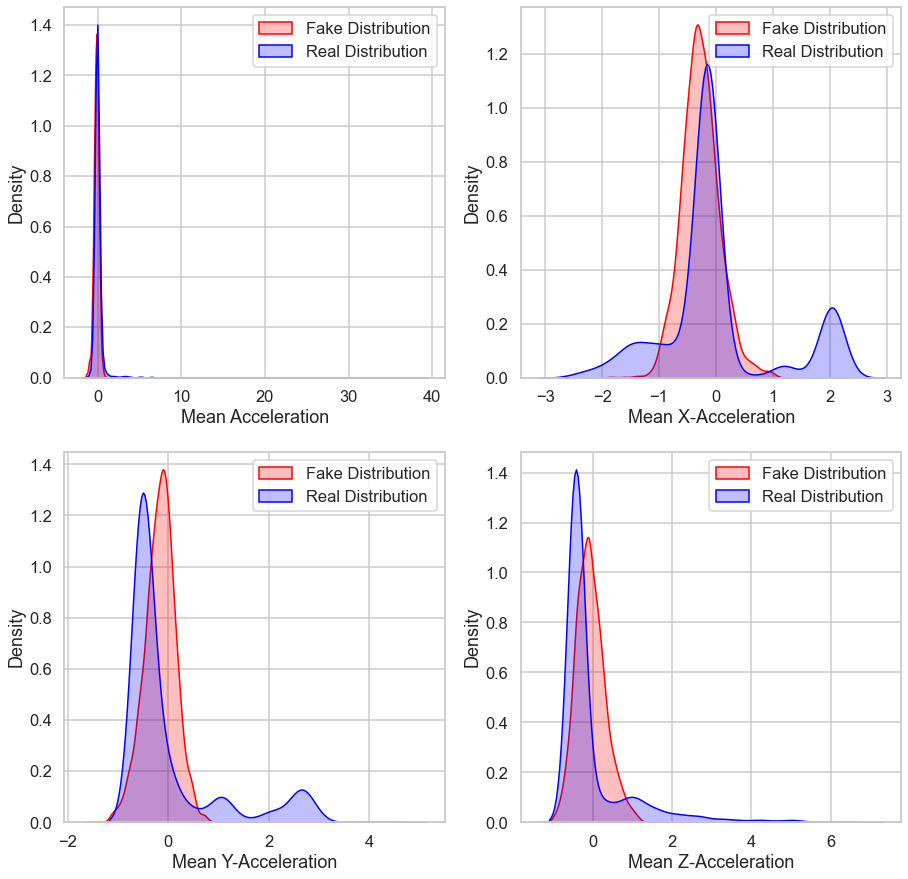

Epoch [1/1000] Training: DISC | Loss D: 0.26236, Loss G: 6.21484 | Acc: 0.87600 | fpR: 0.00000 | P: 1.00000 | R: 0.75200 | F1: 0.85796 | Median W: 0.46271 | Mean W: 0.48283

Switching to Dynamic Training


Pull Generator

Epoch [2/1000] Training: GEN | Loss D: 0.26236, Loss G: 4.23232 | Acc: 0.89200 | fpR: 0.00000 | P: 1.00000 | R: 0.78400 | F1: 0.87843 | Median W: 0.45516 | Mean W: 0.48041
Epoch [3/1000] Training: GEN | Loss D: 0.26236, Loss G: 2.05548 | Acc: 0.89400 | fpR: 0.00000 | P: 1.00000 | R: 0.78800 | F1: 0.88094 | Median W: 0.46180 | Mean W: 0.48091
Epoch [4/1000] Training: GEN | Loss D: 0.26236, Loss G: 1.37707 | Acc: 0.86000 | fpR: 0.00000 | P: 1.00000 | R: 0.72000 | F1: 0.83672 | Median W: 0.46669 | Mean W: 0.48179
Epoch [5/1000] Training: GEN | Loss D: 0.26236, Loss G: 1.17617 | Acc: 0.86600 | fpR: 0.00000 | P: 1.00000 | R: 0.73200 | F1: 0.84478 | Median W: 0.48133 | Mean W: 0.49129
Epoch [6/1000] Training: GEN | Loss D: 0.26236, Loss G: 1.00814 | Acc: 0.90600 | fpR: 0.00

Epoch [96/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.83696 | Acc: 0.86200 | fpR: 0.01200 | P: 0.98396 | R: 0.73600 | F1: 0.84162 | Median W: 0.61052 | Mean W: 0.61861
Epoch [97/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.83871 | Acc: 0.89200 | fpR: 0.01600 | P: 0.98039 | R: 0.80000 | F1: 0.88056 | Median W: 0.60705 | Mean W: 0.62662
Epoch [98/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.83133 | Acc: 0.86000 | fpR: 0.02000 | P: 0.97368 | R: 0.74000 | F1: 0.84042 | Median W: 0.60570 | Mean W: 0.61969
Epoch [99/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.84009 | Acc: 0.87800 | fpR: 0.01600 | P: 0.97970 | R: 0.77200 | F1: 0.86304 | Median W: 0.60618 | Mean W: 0.62519
Epoch [100/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.81982 | Acc: 0.86400 | fpR: 0.01200 | P: 0.98404 | R: 0.74000 | F1: 0.84426 | Median W: 0.60861 | Mean W: 0.62430
Epoch [101/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.82220 | Acc: 0.87800 | fpR: 0.00800 | P: 0.98964 | R: 0.76400 | F1: 0.8618

Epoch [190/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.80267 | Acc: 0.83400 | fpR: 0.03600 | P: 0.95135 | R: 0.70400 | F1: 0.80871 | Median W: 0.65560 | Mean W: 0.79167
Epoch [191/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.80227 | Acc: 0.84400 | fpR: 0.04000 | P: 0.94792 | R: 0.72800 | F1: 0.82304 | Median W: 0.65979 | Mean W: 0.79767
Epoch [192/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.80514 | Acc: 0.81600 | fpR: 0.06400 | P: 0.91579 | R: 0.69600 | F1: 0.79042 | Median W: 0.66522 | Mean W: 0.79955
Epoch [193/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.79411 | Acc: 0.85000 | fpR: 0.03200 | P: 0.95812 | R: 0.73200 | F1: 0.82944 | Median W: 0.66351 | Mean W: 0.79611
Epoch [194/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.79705 | Acc: 0.86400 | fpR: 0.05200 | P: 0.93750 | R: 0.78000 | F1: 0.85103 | Median W: 0.66153 | Mean W: 0.79791
Epoch [195/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.79655 | Acc: 0.86800 | fpR: 0.04000 | P: 0.95098 | R: 0.77600 | F1: 0.

Epoch [284/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.76772 | Acc: 0.83200 | fpR: 0.14000 | P: 0.85169 | R: 0.80400 | F1: 0.82666 | Median W: 0.74225 | Mean W: 1.14479
Epoch [285/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.75900 | Acc: 0.81800 | fpR: 0.13600 | P: 0.85022 | R: 0.77200 | F1: 0.80873 | Median W: 0.74120 | Mean W: 1.15067
Epoch [286/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.76588 | Acc: 0.81000 | fpR: 0.16400 | P: 0.82700 | R: 0.78400 | F1: 0.80443 | Median W: 0.73453 | Mean W: 1.15140
Epoch [287/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.77167 | Acc: 0.78000 | fpR: 0.16800 | P: 0.81250 | R: 0.72800 | F1: 0.76743 | Median W: 0.73546 | Mean W: 1.15105
Epoch [288/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.75988 | Acc: 0.80400 | fpR: 0.15200 | P: 0.83333 | R: 0.76000 | F1: 0.79448 | Median W: 0.73071 | Mean W: 1.16003
Epoch [289/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.77198 | Acc: 0.77800 | fpR: 0.16000 | P: 0.81735 | R: 0.71600 | F1: 0.

Epoch [378/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.72351 | Acc: 0.64000 | fpR: 0.51600 | P: 0.60671 | R: 0.79600 | F1: 0.68809 | Median W: 1.01237 | Mean W: 1.77660
Epoch [379/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.71301 | Acc: 0.61000 | fpR: 0.53200 | P: 0.58567 | R: 0.75200 | F1: 0.65800 | Median W: 1.00367 | Mean W: 1.78323
Epoch [380/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.74219 | Acc: 0.59200 | fpR: 0.58000 | P: 0.56845 | R: 0.76400 | F1: 0.65139 | Median W: 1.02438 | Mean W: 1.79547
Epoch [381/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.73936 | Acc: 0.64000 | fpR: 0.48000 | P: 0.61290 | R: 0.76000 | F1: 0.67808 | Median W: 1.01751 | Mean W: 1.80337
Epoch [382/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.72114 | Acc: 0.59400 | fpR: 0.54400 | P: 0.57367 | R: 0.73200 | F1: 0.64274 | Median W: 1.03451 | Mean W: 1.81524
Epoch [383/1000] Training: GEN | Loss D: 0.26236, Loss G: 0.72797 | Acc: 0.61000 | fpR: 0.52400 | P: 0.58675 | R: 0.74400 | F1: 0.

Epoch [472/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.74169 | Acc: 0.76400 | fpR: 0.29600 | P: 0.73571 | R: 0.82400 | F1: 0.77686 | Median W: 2.17318 | Mean W: 2.74598
Epoch [473/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.75739 | Acc: 0.76200 | fpR: 0.26000 | P: 0.75096 | R: 0.78400 | F1: 0.76662 | Median W: 2.17415 | Mean W: 2.75427
Epoch [474/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.75909 | Acc: 0.74400 | fpR: 0.26000 | P: 0.74206 | R: 0.74800 | F1: 0.74452 | Median W: 2.16839 | Mean W: 2.75804
Epoch [475/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.75425 | Acc: 0.76400 | fpR: 0.28800 | P: 0.73913 | R: 0.81600 | F1: 0.77517 | Median W: 2.17635 | Mean W: 2.77139
Epoch [476/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.75223 | Acc: 0.74200 | fpR: 0.28000 | P: 0.73180 | R: 0.76400 | F1: 0.74705 | Median W: 2.17266 | Mean W: 2.77951
Epoch [477/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.74693 | Acc: 0.72800 | fpR: 0.28400 | P: 0.72266 | R: 0.74000 | F1: 0.

Epoch [566/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.68620 | Acc: 0.58400 | fpR: 0.62800 | P: 0.55899 | R: 0.79600 | F1: 0.65628 | Median W: 1.88984 | Mean W: 3.69322
Epoch [567/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.68382 | Acc: 0.56800 | fpR: 0.64800 | P: 0.54749 | R: 0.78400 | F1: 0.64425 | Median W: 1.92157 | Mean W: 3.70502
Epoch [568/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.71907 | Acc: 0.54600 | fpR: 0.68400 | P: 0.53151 | R: 0.77600 | F1: 0.63041 | Median W: 1.92728 | Mean W: 3.71782
Epoch [569/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.69870 | Acc: 0.53800 | fpR: 0.65600 | P: 0.52738 | R: 0.73200 | F1: 0.61258 | Median W: 1.96653 | Mean W: 3.73543
Epoch [570/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.68665 | Acc: 0.54000 | fpR: 0.68400 | P: 0.52762 | R: 0.76400 | F1: 0.62370 | Median W: 1.97735 | Mean W: 3.74651
Epoch [571/1000] Training: GEN | Loss D: 0.44996, Loss G: 0.67950 | Acc: 0.56000 | fpR: 0.66800 | P: 0.54121 | R: 0.78800 | F1: 0.

Epoch [613/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.76402 | Acc: 0.73000 | fpR: 0.30800 | P: 0.71375 | R: 0.76800 | F1: 0.73939 | Median W: 2.36405 | Mean W: 4.06080
Epoch [614/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.75193 | Acc: 0.74800 | fpR: 0.32400 | P: 0.71678 | R: 0.82000 | F1: 0.76443 | Median W: 2.38142 | Mean W: 4.07579
Epoch [615/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.74231 | Acc: 0.71000 | fpR: 0.37600 | P: 0.67918 | R: 0.79600 | F1: 0.73247 | Median W: 2.39040 | Mean W: 4.08240
Epoch [616/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.76424 | Acc: 0.68200 | fpR: 0.40000 | P: 0.65636 | R: 0.76400 | F1: 0.70560 | Median W: 2.41374 | Mean W: 4.09427
Epoch [617/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.76520 | Acc: 0.68800 | fpR: 0.38000 | P: 0.66549 | R: 0.75600 | F1: 0.70737 | Median W: 2.46928 | Mean W: 4.11366
Epoch [618/1000] Training: GEN | Loss D: 0.48319, Loss G: 0.76563 | Acc: 0.71200 | fpR: 0.35200 | P: 0.68794 | R: 0.77600 | F1: 0.

Epoch [707/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.79755 | Acc: 0.79600 | fpR: 0.22800 | P: 0.78244 | R: 0.82000 | F1: 0.80028 | Median W: 2.31541 | Mean W: 4.78336
Epoch [708/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.78332 | Acc: 0.77000 | fpR: 0.26000 | P: 0.75472 | R: 0.80000 | F1: 0.77620 | Median W: 2.30346 | Mean W: 4.77796
Epoch [709/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.80834 | Acc: 0.74800 | fpR: 0.25600 | P: 0.74603 | R: 0.75200 | F1: 0.74850 | Median W: 2.31075 | Mean W: 4.77567
Epoch [710/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.82392 | Acc: 0.81200 | fpR: 0.17600 | P: 0.81967 | R: 0.80000 | F1: 0.80922 | Median W: 2.32408 | Mean W: 4.78681
Epoch [711/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.77386 | Acc: 0.78600 | fpR: 0.21200 | P: 0.78715 | R: 0.78400 | F1: 0.78507 | Median W: 2.30703 | Mean W: 4.77763
Epoch [712/1000] Training: GEN | Loss D: 0.35014, Loss G: 0.79797 | Acc: 0.75800 | fpR: 0.26800 | P: 0.74525 | R: 0.78400 | F1: 0.

Epoch [754/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.70665 | Acc: 0.88000 | fpR: 0.01200 | P: 0.98469 | R: 0.77200 | F1: 0.86498 | Median W: 2.55597 | Mean W: 3.82010
Epoch [755/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.25670 | Acc: 0.89400 | fpR: 0.01200 | P: 0.98522 | R: 0.80000 | F1: 0.88251 | Median W: 2.65240 | Mean W: 3.74435
Epoch [756/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.24741 | Acc: 0.86800 | fpR: 0.01200 | P: 0.98421 | R: 0.74800 | F1: 0.84951 | Median W: 2.64212 | Mean W: 3.76109
Epoch [757/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.28186 | Acc: 0.85200 | fpR: 0.01600 | P: 0.97826 | R: 0.72000 | F1: 0.82900 | Median W: 2.58486 | Mean W: 3.72025
Epoch [758/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.11054 | Acc: 0.87000 | fpR: 0.02000 | P: 0.97436 | R: 0.76000 | F1: 0.85344 | Median W: 2.58548 | Mean W: 3.70323
Epoch [759/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.06947 | Acc: 0.87200 | fpR: 0.02800 | P: 0.96500 | R: 0.77200 | F1: 0.

Epoch [848/1000] Training: GEN | Loss D: 0.20668, Loss G: 1.01939 | Acc: 0.90200 | fpR: 0.01600 | P: 0.98086 | R: 0.82000 | F1: 0.89275 | Median W: 2.10106 | Mean W: 3.11462
Epoch [849/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.98728 | Acc: 0.88200 | fpR: 0.01600 | P: 0.97990 | R: 0.78000 | F1: 0.86810 | Median W: 2.12475 | Mean W: 3.15919
Epoch [850/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.96517 | Acc: 0.89000 | fpR: 0.02800 | P: 0.96651 | R: 0.80800 | F1: 0.87968 | Median W: 2.10735 | Mean W: 3.13223
Epoch [851/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.99081 | Acc: 0.85400 | fpR: 0.02800 | P: 0.96335 | R: 0.73600 | F1: 0.83398 | Median W: 2.09917 | Mean W: 3.12294
Epoch [852/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.96314 | Acc: 0.89200 | fpR: 0.01200 | P: 0.98515 | R: 0.79600 | F1: 0.88004 | Median W: 2.09725 | Mean W: 3.10970
Epoch [853/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.97142 | Acc: 0.85200 | fpR: 0.02000 | P: 0.97312 | R: 0.72400 | F1: 0.

Epoch [942/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.97537 | Acc: 0.87000 | fpR: 0.00800 | P: 0.98942 | R: 0.74800 | F1: 0.85145 | Median W: 1.93050 | Mean W: 2.82662
Epoch [943/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.94623 | Acc: 0.86800 | fpR: 0.00800 | P: 0.98936 | R: 0.74400 | F1: 0.84883 | Median W: 1.91394 | Mean W: 2.77088
Epoch [944/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.95792 | Acc: 0.87200 | fpR: 0.02000 | P: 0.97449 | R: 0.76400 | F1: 0.85601 | Median W: 1.90374 | Mean W: 2.76443
Epoch [945/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.97324 | Acc: 0.88400 | fpR: 0.02800 | P: 0.96602 | R: 0.79600 | F1: 0.87231 | Median W: 1.91953 | Mean W: 2.78655
Epoch [946/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.97047 | Acc: 0.85600 | fpR: 0.00400 | P: 0.99444 | R: 0.71600 | F1: 0.83207 | Median W: 1.90620 | Mean W: 2.74970
Epoch [947/1000] Training: GEN | Loss D: 0.20668, Loss G: 0.94832 | Acc: 0.87400 | fpR: 0.01600 | P: 0.97949 | R: 0.76400 | F1: 0.

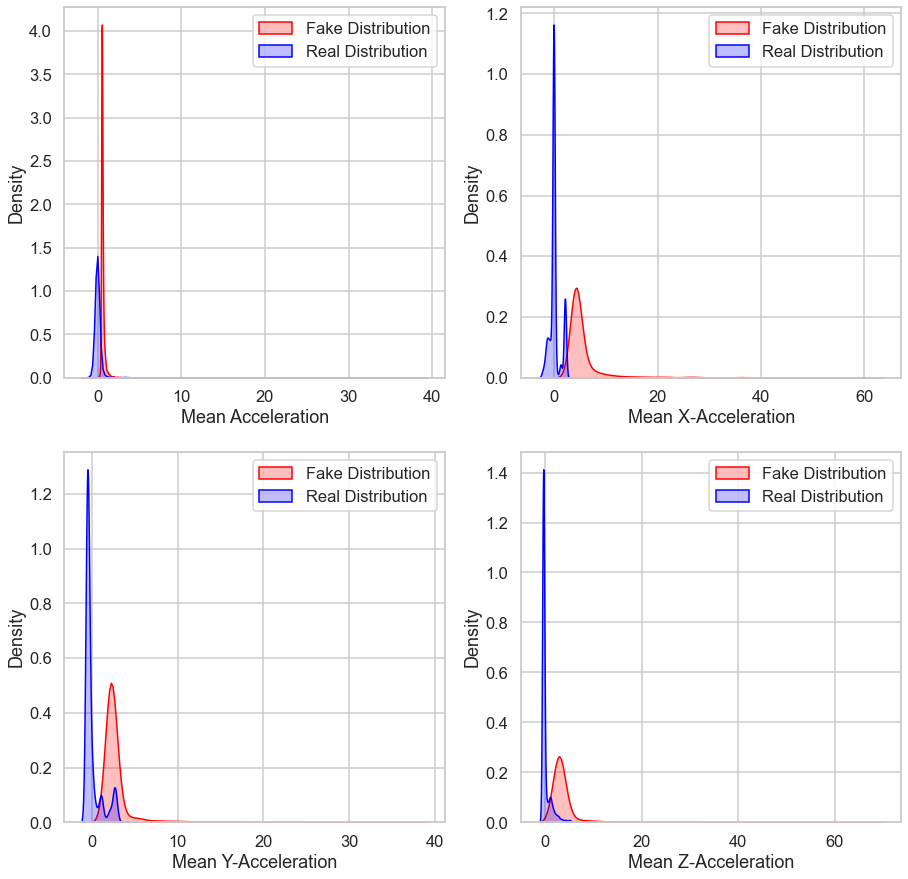

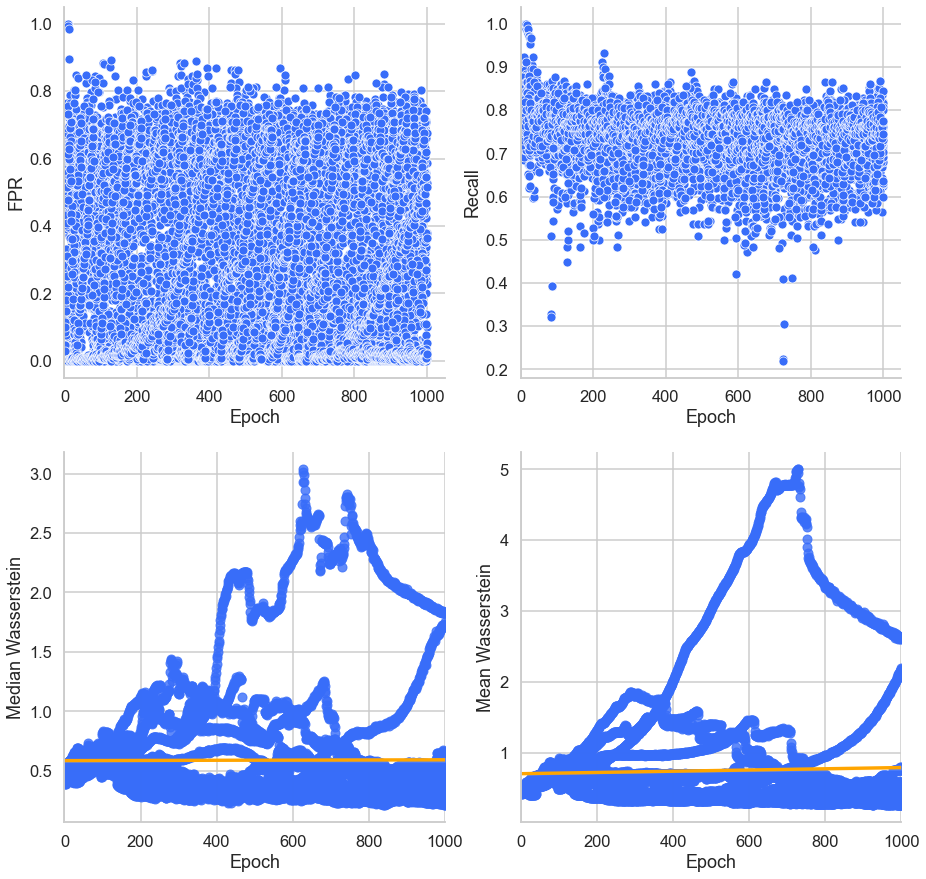

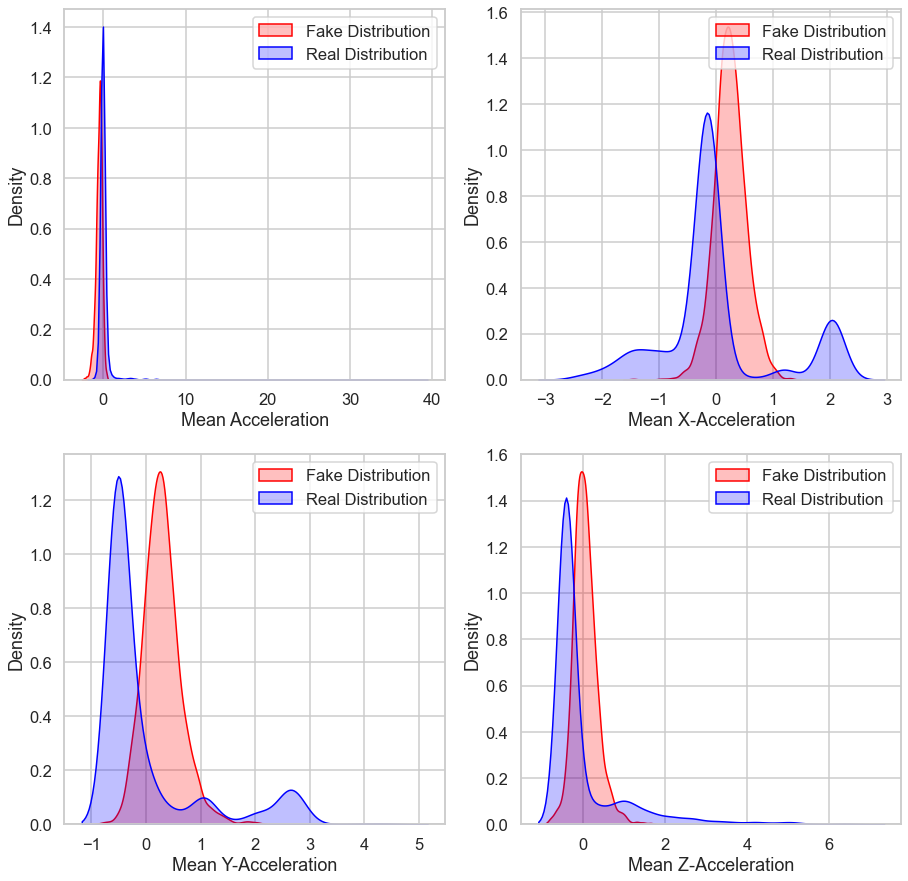

Epoch [1/1000] Training: DISC | Loss D: 0.27775, Loss G: 4.94275 | Acc: 0.86400 | fpR: 0.00400 | P: 0.99457 | R: 0.73200 | F1: 0.84283 | Median W: 0.46607 | Mean W: 0.47661

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.25900, Loss G: 4.94275 | Acc: 0.87200 | fpR: 0.00400 | P: 0.99468 | R: 0.74800 | F1: 0.85339 | Median W: 0.47580 | Mean W: 0.47924
Epoch [3/1000] Training: DISC | Loss D: 0.23179, Loss G: 4.94275 | Acc: 0.88000 | fpR: 0.00400 | P: 0.99479 | R: 0.76400 | F1: 0.86376 | Median W: 0.46737 | Mean W: 0.47551

Pull Generator

Epoch [4/1000] Training: GEN | Loss D: 0.23179, Loss G: 3.73678 | Acc: 0.87600 | fpR: 0.00000 | P: 1.00000 | R: 0.75200 | F1: 0.85796 | Median W: 0.46181 | Mean W: 0.47377
Epoch [5/1000] Training: GEN | Loss D: 0.23179, Loss G: 2.07611 | Acc: 0.87200 | fpR: 0.00800 | P: 0.98947 | R: 0.75200 | F1: 0.85406 | Median W: 0.45449 | Mean W: 0.47741
Epoch [6/1000] Training: GEN | Loss D: 0.23179, Loss G: 1.47399 | Acc: 0.87600 | fpR: 0.

Epoch [96/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.85227 | Acc: 0.90600 | fpR: 0.01200 | P: 0.98565 | R: 0.82400 | F1: 0.89711 | Median W: 0.51086 | Mean W: 0.63938
Epoch [97/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.85461 | Acc: 0.89800 | fpR: 0.01600 | P: 0.98068 | R: 0.81200 | F1: 0.88791 | Median W: 0.50907 | Mean W: 0.64032
Epoch [98/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.85311 | Acc: 0.89800 | fpR: 0.01600 | P: 0.98068 | R: 0.81200 | F1: 0.88791 | Median W: 0.51658 | Mean W: 0.64556
Epoch [99/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.85381 | Acc: 0.88600 | fpR: 0.01600 | P: 0.98010 | R: 0.78800 | F1: 0.87312 | Median W: 0.50358 | Mean W: 0.64435
Epoch [100/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.84798 | Acc: 0.89000 | fpR: 0.02000 | P: 0.97561 | R: 0.80000 | F1: 0.87863 | Median W: 0.51756 | Mean W: 0.64943
Epoch [101/1000] Training: GEN | Loss D: 0.23179, Loss G: 0.84906 | Acc: 0.86400 | fpR: 0.03200 | P: 0.95960 | R: 0.76000 | F1: 0.8477

Epoch [143/1000] Training: DISC | Loss D: 0.55413, Loss G: 0.35300 | Acc: 0.70000 | fpR: 0.08000 | P: 0.85714 | R: 0.48000 | F1: 0.61492 | Median W: 0.47434 | Mean W: 0.55560
Epoch [144/1000] Training: DISC | Loss D: 0.51257, Loss G: 0.35300 | Acc: 0.74200 | fpR: 0.03600 | P: 0.93525 | R: 0.52000 | F1: 0.66792 | Median W: 0.47892 | Mean W: 0.55525
Epoch [145/1000] Training: DISC | Loss D: 0.47142, Loss G: 0.35300 | Acc: 0.72600 | fpR: 0.04800 | P: 0.91241 | R: 0.50000 | F1: 0.64554 | Median W: 0.46920 | Mean W: 0.55456
Epoch [146/1000] Training: DISC | Loss D: 0.46621, Loss G: 0.35300 | Acc: 0.75200 | fpR: 0.02400 | P: 0.95652 | R: 0.52800 | F1: 0.67995 | Median W: 0.46465 | Mean W: 0.55267
Epoch [147/1000] Training: DISC | Loss D: 0.44090, Loss G: 0.35300 | Acc: 0.76600 | fpR: 0.05200 | P: 0.91824 | R: 0.58400 | F1: 0.71346 | Median W: 0.47644 | Mean W: 0.55086
Epoch [148/1000] Training: DISC | Loss D: 0.40852, Loss G: 0.35300 | Acc: 0.80600 | fpR: 0.03600 | P: 0.94737 | R: 0.64800 | 

Epoch [190/1000] Training: DISC | Loss D: 0.71514, Loss G: 0.56440 | Acc: 0.51800 | fpR: 0.69200 | P: 0.51268 | R: 0.72800 | F1: 0.60117 | Median W: 0.32695 | Mean W: 0.37722
Epoch [191/1000] Training: DISC | Loss D: 0.70077, Loss G: 0.56440 | Acc: 0.56000 | fpR: 0.64400 | P: 0.54261 | R: 0.76400 | F1: 0.63407 | Median W: 0.33674 | Mean W: 0.37650
Epoch [192/1000] Training: DISC | Loss D: 0.70251, Loss G: 0.56440 | Acc: 0.52800 | fpR: 0.68400 | P: 0.51966 | R: 0.74000 | F1: 0.61008 | Median W: 0.33461 | Mean W: 0.37962
Epoch [193/1000] Training: DISC | Loss D: 0.65740, Loss G: 0.56440 | Acc: 0.57800 | fpR: 0.55200 | P: 0.56190 | R: 0.70800 | F1: 0.62606 | Median W: 0.33536 | Mean W: 0.37646
Epoch [194/1000] Training: DISC | Loss D: 0.62134, Loss G: 0.56440 | Acc: 0.74200 | fpR: 0.25600 | P: 0.74297 | R: 0.74000 | F1: 0.74098 | Median W: 0.34337 | Mean W: 0.37966
Epoch [195/1000] Training: DISC | Loss D: 0.56768, Loss G: 0.56440 | Acc: 0.75400 | fpR: 0.09600 | P: 0.86286 | R: 0.60400 | 

Epoch [237/1000] Training: DISC | Loss D: 0.64193, Loss G: 0.64006 | Acc: 0.55400 | fpR: 0.68000 | P: 0.53678 | R: 0.78800 | F1: 0.63809 | Median W: 0.25691 | Mean W: 0.34093
Epoch [238/1000] Training: DISC | Loss D: 0.61438, Loss G: 0.64006 | Acc: 0.54400 | fpR: 0.70800 | P: 0.52926 | R: 0.79600 | F1: 0.63530 | Median W: 0.25411 | Mean W: 0.33851
Epoch [239/1000] Training: DISC | Loss D: 0.60381, Loss G: 0.64006 | Acc: 0.57000 | fpR: 0.68000 | P: 0.54667 | R: 0.82000 | F1: 0.65552 | Median W: 0.24946 | Mean W: 0.34040
Epoch [240/1000] Training: DISC | Loss D: 0.61255, Loss G: 0.64006 | Acc: 0.60400 | fpR: 0.60800 | P: 0.57303 | R: 0.81600 | F1: 0.67278 | Median W: 0.25067 | Mean W: 0.33892
Epoch [241/1000] Training: DISC | Loss D: 0.59007, Loss G: 0.64006 | Acc: 0.73000 | fpR: 0.34400 | P: 0.70035 | R: 0.80400 | F1: 0.74811 | Median W: 0.25652 | Mean W: 0.34281
Epoch [242/1000] Training: DISC | Loss D: 0.48256, Loss G: 0.64006 | Acc: 0.83800 | fpR: 0.11200 | P: 0.87556 | R: 0.78800 | 

Epoch [284/1000] Training: GEN | Loss D: 0.54946, Loss G: 0.71318 | Acc: 0.54400 | fpR: 0.63600 | P: 0.53235 | R: 0.72400 | F1: 0.61307 | Median W: 0.31427 | Mean W: 0.36384
Epoch [285/1000] Training: GEN | Loss D: 0.54946, Loss G: 0.67667 | Acc: 0.56200 | fpR: 0.58400 | P: 0.54799 | R: 0.70800 | F1: 0.61731 | Median W: 0.31780 | Mean W: 0.36444
Epoch [286/1000] Training: GEN | Loss D: 0.54946, Loss G: 0.66402 | Acc: 0.57400 | fpR: 0.58000 | P: 0.55657 | R: 0.72800 | F1: 0.63036 | Median W: 0.31607 | Mean W: 0.36993
Epoch [287/1000] Training: GEN | Loss D: 0.54946, Loss G: 0.66041 | Acc: 0.51600 | fpR: 0.70400 | P: 0.51111 | R: 0.73600 | F1: 0.60280 | Median W: 0.31157 | Mean W: 0.37351

Push Generator

Epoch [288/1000] Training: DISC | Loss D: 0.68767, Loss G: 0.66041 | Acc: 0.57200 | fpR: 0.50800 | P: 0.56207 | R: 0.65200 | F1: 0.60321 | Median W: 0.30669 | Mean W: 0.37234
Epoch [289/1000] Training: DISC | Loss D: 0.61036, Loss G: 0.66041 | Acc: 0.70200 | fpR: 0.21200 | P: 0.74396 | 

Epoch [377/1000] Training: GEN | Loss D: 0.35055, Loss G: 1.04329 | Acc: 0.70000 | fpR: 0.34800 | P: 0.68248 | R: 0.74800 | F1: 0.71324 | Median W: 0.26130 | Mean W: 0.31979
Epoch [378/1000] Training: GEN | Loss D: 0.35055, Loss G: 0.80807 | Acc: 0.59600 | fpR: 0.59200 | P: 0.56977 | R: 0.78400 | F1: 0.65945 | Median W: 0.24990 | Mean W: 0.32939
Epoch [379/1000] Training: GEN | Loss D: 0.35055, Loss G: 0.65988 | Acc: 0.64000 | fpR: 0.48800 | P: 0.61146 | R: 0.76800 | F1: 0.68036 | Median W: 0.25028 | Mean W: 0.32749
Epoch [380/1000] Training: GEN | Loss D: 0.35055, Loss G: 0.72797 | Acc: 0.58600 | fpR: 0.63200 | P: 0.55989 | R: 0.80400 | F1: 0.65961 | Median W: 0.24394 | Mean W: 0.33489
Epoch [381/1000] Training: GEN | Loss D: 0.35055, Loss G: 0.64267 | Acc: 0.53800 | fpR: 0.67600 | P: 0.52661 | R: 0.75200 | F1: 0.61896 | Median W: 0.23971 | Mean W: 0.33443
Epoch [382/1000] Training: GEN | Loss D: 0.35055, Loss G: 0.64263 | Acc: 0.49600 | fpR: 0.73600 | P: 0.49727 | R: 0.72800 | F1: 0.

Epoch [424/1000] Training: DISC | Loss D: 0.46565, Loss G: 0.63710 | Acc: 0.76000 | fpR: 0.09600 | P: 0.86517 | R: 0.61600 | F1: 0.71914 | Median W: 0.28663 | Mean W: 0.36986
Epoch [425/1000] Training: DISC | Loss D: 0.42843, Loss G: 0.63710 | Acc: 0.77800 | fpR: 0.08000 | P: 0.88827 | R: 0.63600 | F1: 0.74077 | Median W: 0.28825 | Mean W: 0.36935
Epoch [426/1000] Training: DISC | Loss D: 0.41911, Loss G: 0.63710 | Acc: 0.77600 | fpR: 0.07600 | P: 0.89205 | R: 0.62800 | F1: 0.73660 | Median W: 0.28766 | Mean W: 0.36823
Epoch [427/1000] Training: DISC | Loss D: 0.38018, Loss G: 0.63710 | Acc: 0.81400 | fpR: 0.08400 | P: 0.89447 | R: 0.71200 | F1: 0.79238 | Median W: 0.26602 | Mean W: 0.36510
Epoch [428/1000] Training: DISC | Loss D: 0.30935, Loss G: 0.63710 | Acc: 0.84600 | fpR: 0.06800 | P: 0.91787 | R: 0.76000 | F1: 0.83101 | Median W: 0.30000 | Mean W: 0.37634

Pull Generator

Epoch [429/1000] Training: GEN | Loss D: 0.30935, Loss G: 1.04806 | Acc: 0.74800 | fpR: 0.21600 | P: 0.76724

Epoch [471/1000] Training: GEN | Loss D: 0.27608, Loss G: 0.66589 | Acc: 0.50800 | fpR: 0.67600 | P: 0.50585 | R: 0.69200 | F1: 0.58397 | Median W: 0.31203 | Mean W: 0.46098
Epoch [472/1000] Training: GEN | Loss D: 0.27608, Loss G: 0.64450 | Acc: 0.57200 | fpR: 0.58800 | P: 0.55455 | R: 0.73200 | F1: 0.63054 | Median W: 0.31872 | Mean W: 0.47283
Epoch [473/1000] Training: GEN | Loss D: 0.27608, Loss G: 0.64539 | Acc: 0.48400 | fpR: 0.72400 | P: 0.48870 | R: 0.69200 | F1: 0.57236 | Median W: 0.32551 | Mean W: 0.47117

Push Generator

Epoch [474/1000] Training: DISC | Loss D: 0.68007, Loss G: 0.64539 | Acc: 0.52400 | fpR: 0.69200 | P: 0.51676 | R: 0.74000 | F1: 0.60807 | Median W: 0.32660 | Mean W: 0.46938
Epoch [475/1000] Training: DISC | Loss D: 0.61667, Loss G: 0.64539 | Acc: 0.58800 | fpR: 0.53600 | P: 0.57051 | R: 0.71200 | F1: 0.63296 | Median W: 0.32870 | Mean W: 0.47490
Epoch [476/1000] Training: DISC | Loss D: 0.56118, Loss G: 0.64539 | Acc: 0.73600 | fpR: 0.24800 | P: 0.74380 |

Epoch [518/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.77910 | Acc: 0.56200 | fpR: 0.62000 | P: 0.54545 | R: 0.74400 | F1: 0.62895 | Median W: 0.34359 | Mean W: 0.47082
Epoch [519/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.73139 | Acc: 0.57800 | fpR: 0.60400 | P: 0.55718 | R: 0.76000 | F1: 0.64249 | Median W: 0.33659 | Mean W: 0.47115
Epoch [520/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.77049 | Acc: 0.58800 | fpR: 0.61200 | P: 0.56286 | R: 0.78800 | F1: 0.65618 | Median W: 0.34803 | Mean W: 0.47103
Epoch [521/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.71900 | Acc: 0.56800 | fpR: 0.59600 | P: 0.55120 | R: 0.73200 | F1: 0.62838 | Median W: 0.33994 | Mean W: 0.47525
Epoch [522/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.74121 | Acc: 0.56000 | fpR: 0.64400 | P: 0.54261 | R: 0.76400 | F1: 0.63407 | Median W: 0.35304 | Mean W: 0.48531
Epoch [523/1000] Training: GEN | Loss D: 0.30530, Loss G: 0.76201 | Acc: 0.58000 | fpR: 0.60000 | P: 0.55882 | R: 0.76000 | F1: 0.

Epoch [565/1000] Training: DISC | Loss D: 0.47978, Loss G: 0.68350 | Acc: 0.74800 | fpR: 0.25600 | P: 0.74603 | R: 0.75200 | F1: 0.74850 | Median W: 0.38594 | Mean W: 0.51820

Pull Generator

Epoch [566/1000] Training: GEN | Loss D: 0.47978, Loss G: 0.91349 | Acc: 0.77600 | fpR: 0.20400 | P: 0.78750 | R: 0.75600 | F1: 0.77093 | Median W: 0.39039 | Mean W: 0.53053
Epoch [567/1000] Training: GEN | Loss D: 0.47978, Loss G: 0.92260 | Acc: 0.74600 | fpR: 0.24800 | P: 0.74899 | R: 0.74000 | F1: 0.74397 | Median W: 0.39913 | Mean W: 0.53532
Epoch [568/1000] Training: GEN | Loss D: 0.47978, Loss G: 0.89124 | Acc: 0.77400 | fpR: 0.21200 | P: 0.78189 | R: 0.76000 | F1: 0.77029 | Median W: 0.39896 | Mean W: 0.53923
Epoch [569/1000] Training: GEN | Loss D: 0.47978, Loss G: 0.81298 | Acc: 0.75400 | fpR: 0.24800 | P: 0.75299 | R: 0.75600 | F1: 0.75399 | Median W: 0.40443 | Mean W: 0.54824
Epoch [570/1000] Training: GEN | Loss D: 0.47978, Loss G: 0.82376 | Acc: 0.67600 | fpR: 0.39200 | P: 0.65493 | R

Epoch [612/1000] Training: DISC | Loss D: 0.62611, Loss G: 0.51646 | Acc: 0.57600 | fpR: 0.60800 | P: 0.55556 | R: 0.76000 | F1: 0.64140 | Median W: 0.34612 | Mean W: 0.52402
Epoch [613/1000] Training: DISC | Loss D: 0.58719, Loss G: 0.51646 | Acc: 0.62200 | fpR: 0.56000 | P: 0.58944 | R: 0.80400 | F1: 0.67972 | Median W: 0.35203 | Mean W: 0.52146
Epoch [614/1000] Training: DISC | Loss D: 0.56036, Loss G: 0.51646 | Acc: 0.64000 | fpR: 0.44000 | P: 0.62069 | R: 0.72000 | F1: 0.66617 | Median W: 0.34956 | Mean W: 0.52248
Epoch [615/1000] Training: DISC | Loss D: 0.55049, Loss G: 0.51646 | Acc: 0.79000 | fpR: 0.18800 | P: 0.80335 | R: 0.76800 | F1: 0.78478 | Median W: 0.35381 | Mean W: 0.52280

Pull Generator

Epoch [616/1000] Training: GEN | Loss D: 0.55049, Loss G: 0.73073 | Acc: 0.65800 | fpR: 0.45600 | P: 0.62866 | R: 0.77200 | F1: 0.69250 | Median W: 0.33518 | Mean W: 0.52450
Epoch [617/1000] Training: GEN | Loss D: 0.55049, Loss G: 0.71964 | Acc: 0.60800 | fpR: 0.54400 | P: 0.58282 

Epoch [659/1000] Training: GEN | Loss D: 0.35172, Loss G: 0.36986 | Acc: 0.51000 | fpR: 0.70800 | P: 0.50696 | R: 0.72800 | F1: 0.59722 | Median W: 0.37720 | Mean W: 0.53624

Push Generator

Epoch [660/1000] Training: DISC | Loss D: 1.19232, Loss G: 0.36986 | Acc: 0.52800 | fpR: 0.69600 | P: 0.51934 | R: 0.75200 | F1: 0.61390 | Median W: 0.34561 | Mean W: 0.52597
Epoch [661/1000] Training: DISC | Loss D: 1.08232, Loss G: 0.36986 | Acc: 0.53400 | fpR: 0.68000 | P: 0.52381 | R: 0.74800 | F1: 0.61566 | Median W: 0.34724 | Mean W: 0.53432
Epoch [662/1000] Training: DISC | Loss D: 0.88362, Loss G: 0.36986 | Acc: 0.58400 | fpR: 0.57600 | P: 0.56364 | R: 0.74400 | F1: 0.64089 | Median W: 0.35436 | Mean W: 0.52396
Epoch [663/1000] Training: DISC | Loss D: 0.82882, Loss G: 0.36986 | Acc: 0.56000 | fpR: 0.58400 | P: 0.54658 | R: 0.70400 | F1: 0.61489 | Median W: 0.34883 | Mean W: 0.53307
Epoch [664/1000] Training: DISC | Loss D: 0.73397, Loss G: 0.36986 | Acc: 0.55400 | fpR: 0.53200 | P: 0.54608

Epoch [706/1000] Training: DISC | Loss D: 0.72505, Loss G: 0.46677 | Acc: 0.59000 | fpR: 0.51600 | P: 0.57426 | R: 0.69600 | F1: 0.62880 | Median W: 0.29817 | Mean W: 0.48138
Epoch [707/1000] Training: DISC | Loss D: 0.60709, Loss G: 0.46677 | Acc: 0.62800 | fpR: 0.42400 | P: 0.61594 | R: 0.68000 | F1: 0.64589 | Median W: 0.29448 | Mean W: 0.48611
Epoch [708/1000] Training: DISC | Loss D: 0.55065, Loss G: 0.46677 | Acc: 0.76200 | fpR: 0.06400 | P: 0.90184 | R: 0.58800 | F1: 0.71139 | Median W: 0.29396 | Mean W: 0.48090
Epoch [709/1000] Training: DISC | Loss D: 0.53842, Loss G: 0.46677 | Acc: 0.74600 | fpR: 0.07200 | P: 0.88679 | R: 0.56400 | F1: 0.68901 | Median W: 0.28588 | Mean W: 0.48180
Epoch [710/1000] Training: DISC | Loss D: 0.53067, Loss G: 0.46677 | Acc: 0.73200 | fpR: 0.08400 | P: 0.86709 | R: 0.54800 | F1: 0.67109 | Median W: 0.30475 | Mean W: 0.48007
Epoch [711/1000] Training: DISC | Loss D: 0.54407, Loss G: 0.46677 | Acc: 0.73600 | fpR: 0.06800 | P: 0.88816 | R: 0.54000 | 

Epoch [753/1000] Training: DISC | Loss D: 0.47402, Loss G: 0.47315 | Acc: 0.76000 | fpR: 0.03200 | P: 0.94521 | R: 0.55200 | F1: 0.69650 | Median W: 0.25120 | Mean W: 0.42613
Epoch [754/1000] Training: DISC | Loss D: 0.43443, Loss G: 0.47315 | Acc: 0.78800 | fpR: 0.03600 | P: 0.94444 | R: 0.61200 | F1: 0.74224 | Median W: 0.24585 | Mean W: 0.42954
Epoch [755/1000] Training: DISC | Loss D: 0.41990, Loss G: 0.47315 | Acc: 0.79600 | fpR: 0.02400 | P: 0.96250 | R: 0.61600 | F1: 0.75074 | Median W: 0.24995 | Mean W: 0.42730
Epoch [756/1000] Training: DISC | Loss D: 0.40646, Loss G: 0.47315 | Acc: 0.81600 | fpR: 0.02000 | P: 0.97024 | R: 0.65200 | F1: 0.77942 | Median W: 0.26382 | Mean W: 0.43392
Epoch [757/1000] Training: DISC | Loss D: 0.42475, Loss G: 0.47315 | Acc: 0.80600 | fpR: 0.02000 | P: 0.96933 | R: 0.63200 | F1: 0.76466 | Median W: 0.25003 | Mean W: 0.42504
Epoch [758/1000] Training: DISC | Loss D: 0.39804, Loss G: 0.47315 | Acc: 0.86000 | fpR: 0.00800 | P: 0.98913 | R: 0.72800 | 

Epoch [800/1000] Training: GEN | Loss D: 0.42599, Loss G: 0.60802 | Acc: 0.53800 | fpR: 0.66400 | P: 0.52707 | R: 0.74000 | F1: 0.61516 | Median W: 0.31010 | Mean W: 0.43177
Epoch [801/1000] Training: GEN | Loss D: 0.42599, Loss G: 0.55479 | Acc: 0.50600 | fpR: 0.75200 | P: 0.50396 | R: 0.76400 | F1: 0.60683 | Median W: 0.32682 | Mean W: 0.45125

Push Generator

Epoch [802/1000] Training: DISC | Loss D: 0.70467, Loss G: 0.55479 | Acc: 0.56800 | fpR: 0.66800 | P: 0.54620 | R: 0.80400 | F1: 0.65000 | Median W: 0.32530 | Mean W: 0.45184
Epoch [803/1000] Training: DISC | Loss D: 0.61212, Loss G: 0.55479 | Acc: 0.66600 | fpR: 0.40000 | P: 0.64664 | R: 0.73200 | F1: 0.68618 | Median W: 0.32736 | Mean W: 0.44426
Epoch [804/1000] Training: DISC | Loss D: 0.53936, Loss G: 0.55479 | Acc: 0.82200 | fpR: 0.06800 | P: 0.91282 | R: 0.71200 | F1: 0.79951 | Median W: 0.32588 | Mean W: 0.44842
Epoch [805/1000] Training: DISC | Loss D: 0.44535, Loss G: 0.55479 | Acc: 0.80200 | fpR: 0.05200 | P: 0.92655 

Epoch [847/1000] Training: DISC | Loss D: 0.62468, Loss G: 0.60163 | Acc: 0.53600 | fpR: 0.68400 | P: 0.52500 | R: 0.75600 | F1: 0.61919 | Median W: 0.38262 | Mean W: 0.57697
Epoch [848/1000] Training: DISC | Loss D: 0.57882, Loss G: 0.60163 | Acc: 0.74200 | fpR: 0.20000 | P: 0.77376 | R: 0.68400 | F1: 0.72562 | Median W: 0.39449 | Mean W: 0.59062
Epoch [849/1000] Training: DISC | Loss D: 0.46087, Loss G: 0.60163 | Acc: 0.83200 | fpR: 0.07600 | P: 0.90686 | R: 0.74000 | F1: 0.81448 | Median W: 0.39250 | Mean W: 0.59210
Epoch [850/1000] Training: DISC | Loss D: 0.43856, Loss G: 0.60163 | Acc: 0.77800 | fpR: 0.08800 | P: 0.87978 | R: 0.64400 | F1: 0.74316 | Median W: 0.38505 | Mean W: 0.59328
Epoch [851/1000] Training: DISC | Loss D: 0.43171, Loss G: 0.60163 | Acc: 0.80400 | fpR: 0.04800 | P: 0.93182 | R: 0.65600 | F1: 0.76947 | Median W: 0.39857 | Mean W: 0.58820
Epoch [852/1000] Training: DISC | Loss D: 0.37076, Loss G: 0.60163 | Acc: 0.82200 | fpR: 0.07200 | P: 0.90863 | R: 0.71600 | 

Epoch [894/1000] Training: DISC | Loss D: 0.42870, Loss G: 0.64745 | Acc: 0.80600 | fpR: 0.07200 | P: 0.90476 | R: 0.68400 | F1: 0.77855 | Median W: 0.46599 | Mean W: 0.63820
Epoch [895/1000] Training: DISC | Loss D: 0.41806, Loss G: 0.64745 | Acc: 0.82000 | fpR: 0.05200 | P: 0.93011 | R: 0.69200 | F1: 0.79309 | Median W: 0.46893 | Mean W: 0.64429
Epoch [896/1000] Training: DISC | Loss D: 0.36984, Loss G: 0.64745 | Acc: 0.84400 | fpR: 0.04800 | P: 0.93878 | R: 0.73600 | F1: 0.82462 | Median W: 0.46029 | Mean W: 0.63405
Epoch [897/1000] Training: DISC | Loss D: 0.34818, Loss G: 0.64745 | Acc: 0.84000 | fpR: 0.06400 | P: 0.92079 | R: 0.74400 | F1: 0.82251 | Median W: 0.46875 | Mean W: 0.65155
Epoch [898/1000] Training: DISC | Loss D: 0.34699, Loss G: 0.64745 | Acc: 0.80800 | fpR: 0.05200 | P: 0.92778 | R: 0.66800 | F1: 0.77626 | Median W: 0.47103 | Mean W: 0.64225
Epoch [899/1000] Training: DISC | Loss D: 0.30924, Loss G: 0.64745 | Acc: 0.83400 | fpR: 0.07600 | P: 0.90732 | R: 0.74400 | 

Epoch [941/1000] Training: DISC | Loss D: 0.27958, Loss G: 0.55299 | Acc: 0.86000 | fpR: 0.01200 | P: 0.98387 | R: 0.73200 | F1: 0.83896 | Median W: 0.53418 | Mean W: 0.73820
Epoch [942/1000] Training: DISC | Loss D: 0.27598, Loss G: 0.55299 | Acc: 0.84000 | fpR: 0.01600 | P: 0.97753 | R: 0.69600 | F1: 0.81260 | Median W: 0.51567 | Mean W: 0.71890
Epoch [943/1000] Training: DISC | Loss D: 0.24594, Loss G: 0.55299 | Acc: 0.87800 | fpR: 0.01600 | P: 0.97970 | R: 0.77200 | F1: 0.86304 | Median W: 0.53636 | Mean W: 0.73188

Pull Generator

Epoch [944/1000] Training: GEN | Loss D: 0.24594, Loss G: 2.60877 | Acc: 0.87000 | fpR: 0.00400 | P: 0.99465 | R: 0.74400 | F1: 0.85077 | Median W: 0.55470 | Mean W: 0.73832
Epoch [945/1000] Training: GEN | Loss D: 0.24594, Loss G: 1.35260 | Acc: 0.86400 | fpR: 0.02000 | P: 0.97396 | R: 0.74800 | F1: 0.84566 | Median W: 0.53725 | Mean W: 0.71473
Epoch [946/1000] Training: GEN | Loss D: 0.24594, Loss G: 1.10983 | Acc: 0.86400 | fpR: 0.00800 | P: 0.98925 |

Epoch [988/1000] Training: DISC | Loss D: 0.51104, Loss G: 0.47597 | Acc: 0.74000 | fpR: 0.23600 | P: 0.75210 | R: 0.71600 | F1: 0.73311 | Median W: 0.74475 | Mean W: 0.83801
Epoch [989/1000] Training: DISC | Loss D: 0.44529, Loss G: 0.47597 | Acc: 0.81400 | fpR: 0.07200 | P: 0.90674 | R: 0.70000 | F1: 0.78958 | Median W: 0.74765 | Mean W: 0.84055
Epoch [990/1000] Training: DISC | Loss D: 0.43543, Loss G: 0.47597 | Acc: 0.83800 | fpR: 0.05600 | P: 0.92893 | R: 0.73200 | F1: 0.81830 | Median W: 0.72710 | Mean W: 0.83314
Epoch [991/1000] Training: DISC | Loss D: 0.41558, Loss G: 0.47597 | Acc: 0.83600 | fpR: 0.05200 | P: 0.93299 | R: 0.72400 | F1: 0.81482 | Median W: 0.72769 | Mean W: 0.83392
Epoch [992/1000] Training: DISC | Loss D: 0.37254, Loss G: 0.47597 | Acc: 0.85400 | fpR: 0.01600 | P: 0.97838 | R: 0.72400 | F1: 0.83170 | Median W: 0.75125 | Mean W: 0.83911
Epoch [993/1000] Training: DISC | Loss D: 0.37486, Loss G: 0.47597 | Acc: 0.85600 | fpR: 0.00400 | P: 0.99444 | R: 0.71600 | 

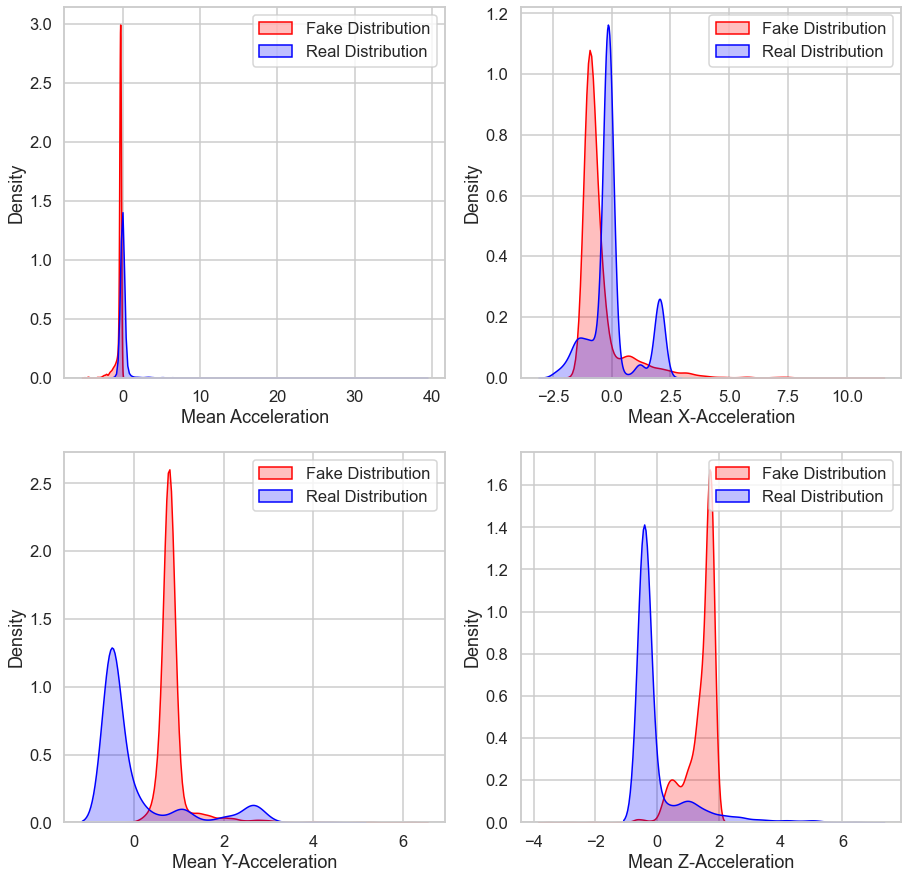

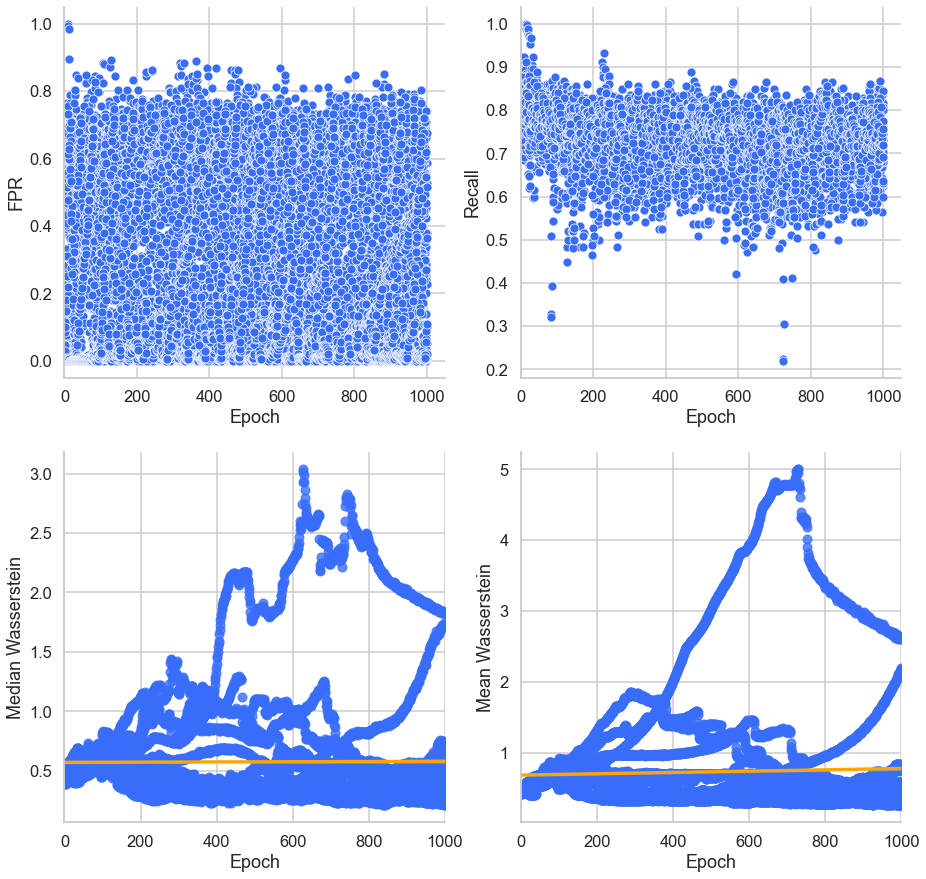

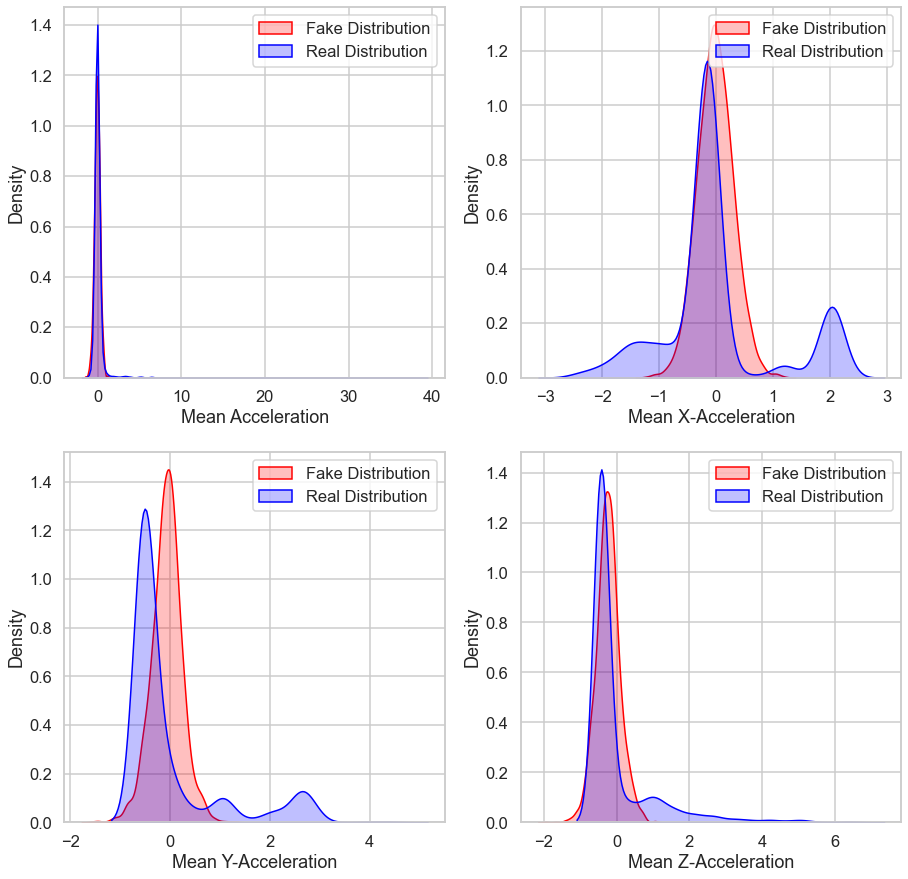

Epoch [1/1000] Training: DISC | Loss D: 0.28111, Loss G: 3.47231 | Acc: 0.86600 | fpR: 0.01600 | P: 0.97906 | R: 0.74800 | F1: 0.84758 | Median W: 0.42328 | Mean W: 0.43863

Switching to Dynamic Training

Epoch [2/1000] Training: DISC | Loss D: 0.26575, Loss G: 3.47231 | Acc: 0.87200 | fpR: 0.03200 | P: 0.96040 | R: 0.77600 | F1: 0.85791 | Median W: 0.43192 | Mean W: 0.44275

Pull Generator

Epoch [3/1000] Training: GEN | Loss D: 0.26575, Loss G: 2.34030 | Acc: 0.86600 | fpR: 0.06800 | P: 0.92166 | R: 0.80000 | F1: 0.85603 | Median W: 0.42042 | Mean W: 0.43765
Epoch [4/1000] Training: GEN | Loss D: 0.26575, Loss G: 1.56187 | Acc: 0.82000 | fpR: 0.15200 | P: 0.83898 | R: 0.79200 | F1: 0.81432 | Median W: 0.42058 | Mean W: 0.44040
Epoch [5/1000] Training: GEN | Loss D: 0.26575, Loss G: 1.20045 | Acc: 0.78800 | fpR: 0.16000 | P: 0.82143 | R: 0.73600 | F1: 0.77587 | Median W: 0.42383 | Mean W: 0.44951
Epoch [6/1000] Training: GEN | Loss D: 0.26575, Loss G: 1.06269 | Acc: 0.74200 | fpR: 0.2

Epoch [48/1000] Training: DISC | Loss D: 0.63985, Loss G: 0.49061 | Acc: 0.62000 | fpR: 0.45200 | P: 0.60490 | R: 0.69200 | F1: 0.64503 | Median W: 0.51751 | Mean W: 0.56934
Epoch [49/1000] Training: DISC | Loss D: 0.56744, Loss G: 0.49061 | Acc: 0.69800 | fpR: 0.34400 | P: 0.68266 | R: 0.74000 | F1: 0.70967 | Median W: 0.53072 | Mean W: 0.57285
Epoch [50/1000] Training: DISC | Loss D: 0.42864, Loss G: 0.49061 | Acc: 0.78800 | fpR: 0.18000 | P: 0.80769 | R: 0.75600 | F1: 0.78049 | Median W: 0.52795 | Mean W: 0.57295

Pull Generator

Epoch [51/1000] Training: GEN | Loss D: 0.42864, Loss G: 1.15303 | Acc: 0.72000 | fpR: 0.31200 | P: 0.70677 | R: 0.75200 | F1: 0.72818 | Median W: 0.51501 | Mean W: 0.58136
Epoch [52/1000] Training: GEN | Loss D: 0.42864, Loss G: 0.96198 | Acc: 0.63800 | fpR: 0.42800 | P: 0.62191 | R: 0.70400 | F1: 0.65992 | Median W: 0.53380 | Mean W: 0.57902
Epoch [53/1000] Training: GEN | Loss D: 0.42864, Loss G: 0.84447 | Acc: 0.61200 | fpR: 0.52400 | P: 0.58805 | R: 0.

Epoch [142/1000] Training: DISC | Loss D: 0.51823, Loss G: 0.57509 | Acc: 0.75800 | fpR: 0.10800 | P: 0.85246 | R: 0.62400 | F1: 0.72007 | Median W: 0.40383 | Mean W: 0.47254
Epoch [143/1000] Training: DISC | Loss D: 0.43326, Loss G: 0.57509 | Acc: 0.75400 | fpR: 0.07200 | P: 0.88957 | R: 0.58000 | F1: 0.70170 | Median W: 0.39147 | Mean W: 0.47029
Epoch [144/1000] Training: DISC | Loss D: 0.43644, Loss G: 0.57509 | Acc: 0.79400 | fpR: 0.02000 | P: 0.96815 | R: 0.60800 | F1: 0.74646 | Median W: 0.40504 | Mean W: 0.47413
Epoch [145/1000] Training: DISC | Loss D: 0.41898, Loss G: 0.57509 | Acc: 0.78400 | fpR: 0.03600 | P: 0.94375 | R: 0.60400 | F1: 0.73611 | Median W: 0.39833 | Mean W: 0.47439
Epoch [146/1000] Training: DISC | Loss D: 0.38041, Loss G: 0.57509 | Acc: 0.81800 | fpR: 0.04000 | P: 0.94413 | R: 0.67600 | F1: 0.78739 | Median W: 0.40650 | Mean W: 0.47937
Epoch [147/1000] Training: DISC | Loss D: 0.39133, Loss G: 0.57509 | Acc: 0.79800 | fpR: 0.05600 | P: 0.92090 | R: 0.65200 | 

Epoch [189/1000] Training: GEN | Loss D: 0.40596, Loss G: 0.36964 | Acc: 0.50800 | fpR: 0.76000 | P: 0.50521 | R: 0.77600 | F1: 0.61151 | Median W: 0.39594 | Mean W: 0.44374

Push Generator

Epoch [190/1000] Training: DISC | Loss D: 1.29962, Loss G: 0.36964 | Acc: 0.46800 | fpR: 0.74000 | P: 0.47740 | R: 0.67600 | F1: 0.55912 | Median W: 0.40916 | Mean W: 0.44477
Epoch [191/1000] Training: DISC | Loss D: 1.01251, Loss G: 0.36964 | Acc: 0.50600 | fpR: 0.64000 | P: 0.50464 | R: 0.65200 | F1: 0.56844 | Median W: 0.40325 | Mean W: 0.44293
Epoch [192/1000] Training: DISC | Loss D: 0.74837, Loss G: 0.36964 | Acc: 0.57000 | fpR: 0.37600 | P: 0.57848 | R: 0.51600 | F1: 0.54496 | Median W: 0.39972 | Mean W: 0.43880
Epoch [193/1000] Training: DISC | Loss D: 0.62076, Loss G: 0.36964 | Acc: 0.70400 | fpR: 0.11200 | P: 0.82278 | R: 0.52000 | F1: 0.63678 | Median W: 0.39750 | Mean W: 0.44429
Epoch [194/1000] Training: DISC | Loss D: 0.57353, Loss G: 0.36964 | Acc: 0.63800 | fpR: 0.08400 | P: 0.81081

Epoch [236/1000] Training: DISC | Loss D: 0.54212, Loss G: 0.41811 | Acc: 0.73000 | fpR: 0.03200 | P: 0.93893 | R: 0.49200 | F1: 0.64522 | Median W: 0.44404 | Mean W: 0.45105
Epoch [237/1000] Training: DISC | Loss D: 0.55441, Loss G: 0.41811 | Acc: 0.66600 | fpR: 0.04800 | P: 0.88785 | R: 0.38000 | F1: 0.53179 | Median W: 0.45931 | Mean W: 0.45615
Epoch [238/1000] Training: DISC | Loss D: 0.51828, Loss G: 0.41811 | Acc: 0.73000 | fpR: 0.04400 | P: 0.91971 | R: 0.50400 | F1: 0.65071 | Median W: 0.45083 | Mean W: 0.45239
Epoch [239/1000] Training: DISC | Loss D: 0.52528, Loss G: 0.41811 | Acc: 0.72800 | fpR: 0.05200 | P: 0.90714 | R: 0.50800 | F1: 0.65082 | Median W: 0.45095 | Mean W: 0.44733
Epoch [240/1000] Training: DISC | Loss D: 0.51352, Loss G: 0.41811 | Acc: 0.67400 | fpR: 0.09600 | P: 0.82222 | R: 0.44400 | F1: 0.57617 | Median W: 0.45471 | Mean W: 0.45093
Epoch [241/1000] Training: DISC | Loss D: 0.50697, Loss G: 0.41811 | Acc: 0.71600 | fpR: 0.03200 | P: 0.93548 | R: 0.46400 | 

KeyboardInterrupt: 

In [34]:
#X, y = start_data("aggregated_data/aggregated_data.csv", "label:SITTING")
X, y = start_data("raw_data/0A986513-7828-4D53-AA1F-E02D6DF9561B.features_labels.csv", "label:SITTING") 
model_output = training_loop(X,y, gan_id="10k_dynamic" + str(i), batch_size = 500, gen_lr=.0001, disc_lr =.0001, pull_threshold = 0.3, push_threshold = 0.7, recall_threshold = 0.75, n_epochs=1000, dig=5, constant_train_flag=False, static_threshold=1)
plot_metrics(model_output, True)